<a href="https://colab.research.google.com/github/alxmzr/Colab/blob/main/MT4STATS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from google.colab import files

# Загрузка CSV файла
uploaded = files.upload()

# Чтение CSV файла в DataFrame
df = pd.read_csv('mt4stats.csv')

# Преобразование столбцов времени в datetime формат
df['Open Time'] = pd.to_datetime(df['Open Time'], format='%Y.%m.%d %H:%M:%S')
df['Close Time'] = pd.to_datetime(df['Close Time'], format='%Y.%m.%d %H:%M:%S', errors='coerce')

# Фильтрация отменённых сделок
df = df[~df['Close Time'].isna()]


Saving mt4stats.csv to mt4stats (1).csv


In [ ]:
import os
import matplotlib.pyplot as plt

# Создание папки для сохранения графиков
output_folder = 'trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

# Генерация графиков
for index, row in df.iterrows():
    plt.figure(figsize=(10, 5))

    # Построение графика
    dates = [row['Open Time'], row['Close Time']]
    prices = [row['Price'], row['Price.1']]
    plt.plot(dates, prices, marker='o', label=row['Item'])

    # Добавление текста на график
    plt.title(f"Ticket {row['Ticket']} - {row['Type'].capitalize()}")
    plt.xlabel('Time')
    plt.ylabel('Price')

    # Текстовая информация о сделке
    plt.text(dates[0], prices[0], f'Open: {row["Price"]} ({row["Open Time"]})', fontsize=12, verticalalignment='bottom')
    plt.text(dates[1], prices[1], f'Close: {row["Price.1"]} ({row["Close Time"]})', fontsize=12, verticalalignment='bottom')
    plt.text(dates[1], prices[1] - (prices[1]*0.002), f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

    # Добавление меток открытия и закрытия
    plt.axvline(x=row['Open Time'], color='green', linestyle='--', label='Open Time')
    plt.axvline(x=row['Close Time'], color='red', linestyle='--', label='Close Time')

    # Сохранение графика в файл
    plt.legend()
    plt.grid(True)
    plt.savefig(f'{output_folder}/trade_{row["Ticket"]}.png')
    plt.close()

print("Генерация скриншотов завершена.")


Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import files

# Загрузка данных о сделках
uploaded = files.upload()

# Чтение данных о сделках из CSV
trades_df = pd.read_csv('mt4stats.csv')

# Преобразование столбцов времени в формат datetime
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Загрузка исторических данных с котировками
quotes_uploaded = files.upload()
quotes_df = pd.read_csv('EURUSD60.csv')

# Преобразование столбца Date в формат datetime
quotes_df['Date'] = pd.to_datetime(quotes_df['Date'], format='%Y.%m.%d %H:%M')
quotes_df.set_index('Date', inplace=True)

# Итерация по каждой сделке для создания свечного графика
output_folder = 'trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    # Фильтрация данных котировок для временного интервала сделки
    mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
    selected_data = quotes_df.loc[mask]

    if not selected_data.empty:
        # Создание свечного графика
        plt.figure(figsize=(12, 6))
        mpf.plot(selected_data, type='candle', style='charles',
                 title=f"{row['Item']} - Ticket {row['Ticket']}",
                 ylabel='Price')

        # Добавление меток на график
        plt.text(row['Open Time'], row['Price'], 'Open', color='green', fontsize=12, verticalalignment='bottom')
        plt.text(row['Close Time'], row['Price.1'], 'Close', color='red', fontsize=12, verticalalignment='bottom')
        plt.text(row['Close Time'], row['Price.1'] + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

        # Сохранение графика в файл
        plt.savefig(f'{output_folder}/trade_{row["Ticket"]}.png')
        plt.close()

print("Генерация скриншотов завершена.")


In [ ]:
pip install mplfinance

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 2.8 MB/s eta 0:00:00


In [ ]:
END

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair}.csv'
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Проверка доступных столбцов
        print(f"Columns in {filename}: {quotes_df.columns.tolist()}")

        # Обработка наличия столбцов 'Date' и 'Time'
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            # Обработка даты и времени
            quotes_df['Date'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d,%H:%M')
            quotes_df.set_index('Date', inplace=True)
            quotes_df.drop(columns='Volume', inplace=True, errors='ignore')  # Удаление столбца 'Volume' если он есть
            return quotes_df
        else:
            print(f"Столбцы 'Date' и/или 'Time' не найдены в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y.%m.%d,%H:%M')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price')

            # Добавление меток на график
            plt.text(row['Open Time'], row['Price'], 'Open', color='green', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'], 'Close', color='red', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'] + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Столбцы 'Date' и/или 'Time' не найдены в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Столбцы 'Date' и/или 'Time' не найдены в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Столбцы 'Date' и/или 'Time' не найдены в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Столбцы 'Date' и/или 'Time' не найдены в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Столбцы 'Date' и/или 'Time' не найдены в eurusd.csv.
Нет котиров

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair}.csv'
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Проверка доступных столбцов
        print(f"Columns in {filename}: {quotes_df.columns.tolist()}")

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y.%m.%d %H:%M')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price')

            # Добавление меток на график
            plt.text(row['Open Time'], row['Price'], 'Open', color='green', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'], 'Close', color='red', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'] + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Не найдено нужных столбцов в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Не найдено нужных столбцов в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Не найдено нужных столбцов в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Не найдено нужных столбцов в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date', ' Time', ' Open', ' High', ' Low', ' Close', 'Volume']
Не найдено нужных столбцов в eurusd.csv.
Нет котировок для валютной пары eurusd.
Columns in eurusd.csv: ['Date',

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.


<Figure size 1200x600 with 0 Axes>

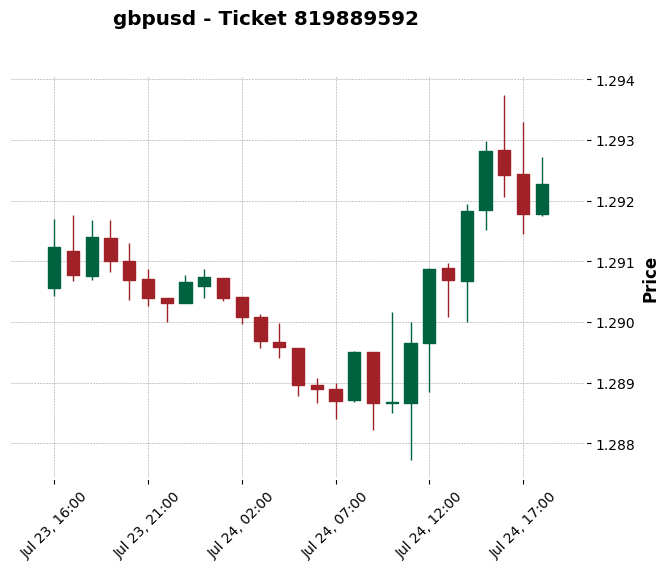

Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.


<Figure size 1200x600 with 0 Axes>

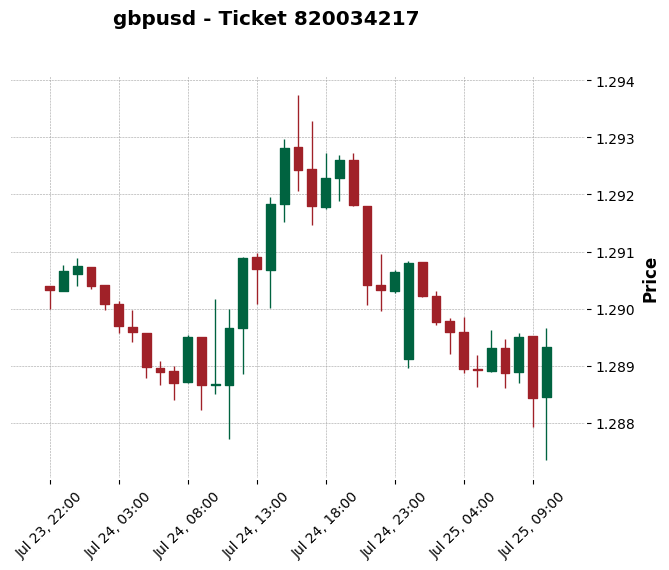

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

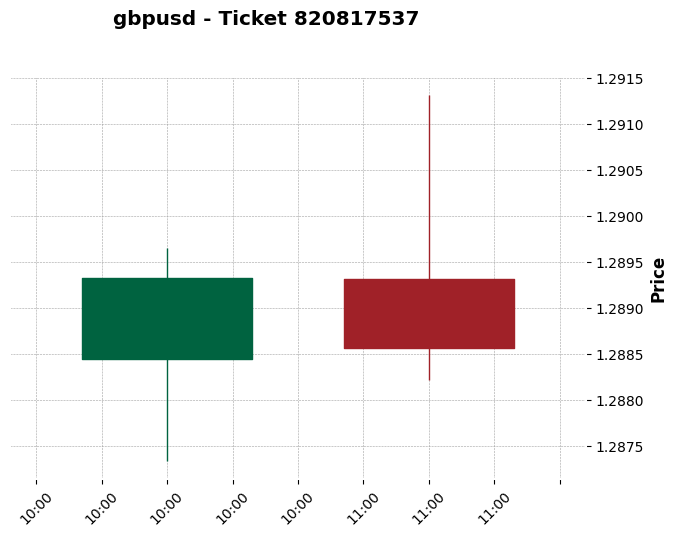

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

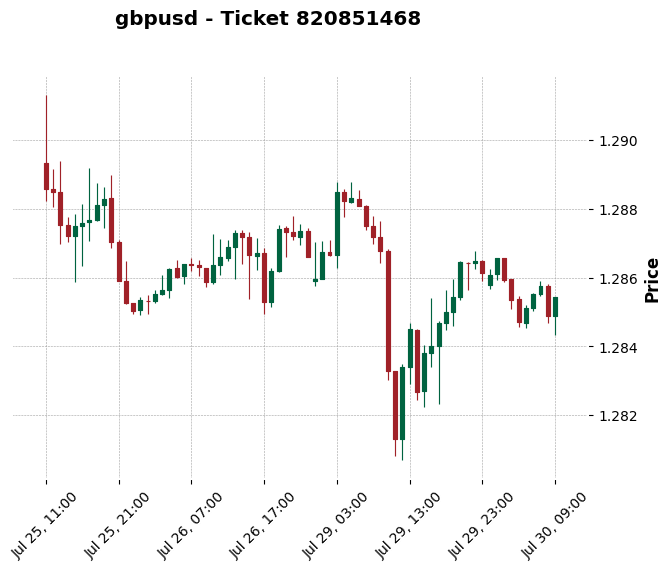

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usd

<Figure size 1200x600 with 0 Axes>

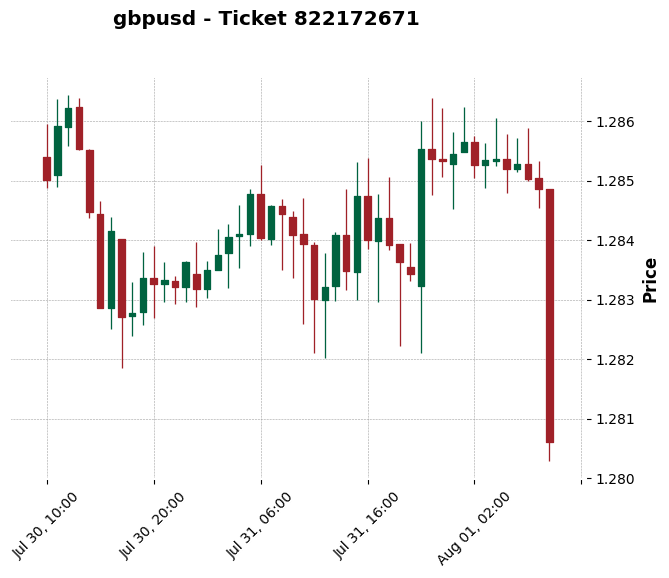

Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл EURUSD.csv не найден.
Нет котировок для валютной пары eurusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары aud

<Figure size 1200x600 with 0 Axes>

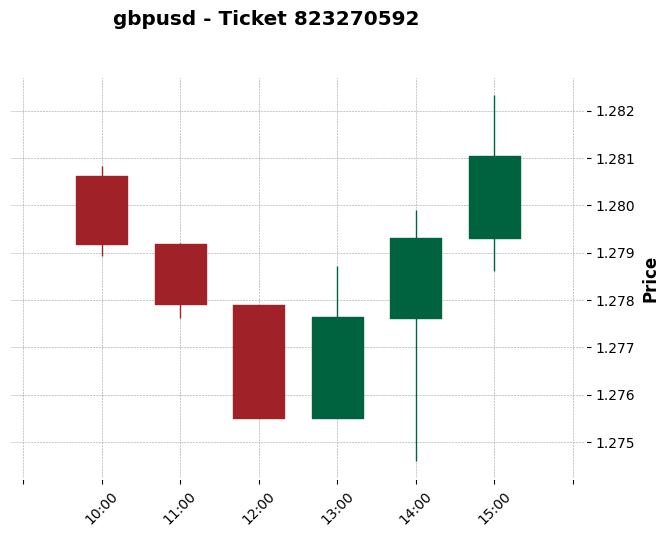

<Figure size 1200x600 with 0 Axes>

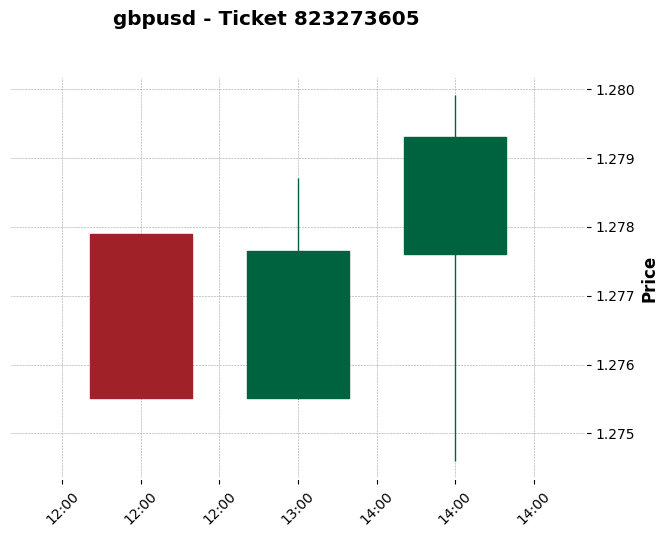

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

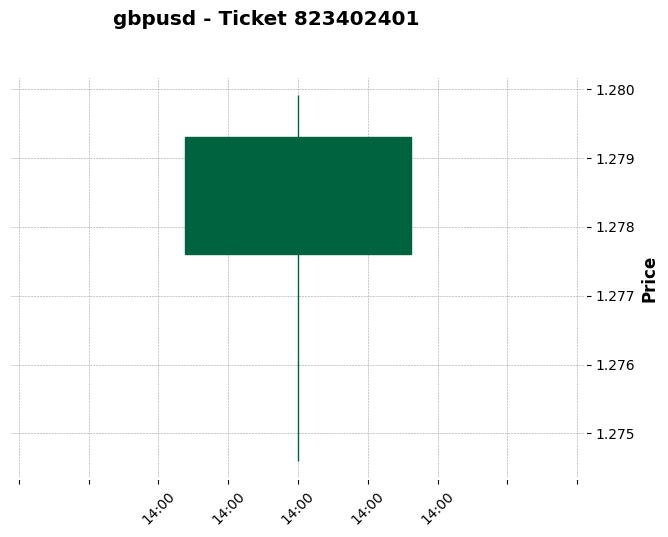

<Figure size 1200x600 with 0 Axes>

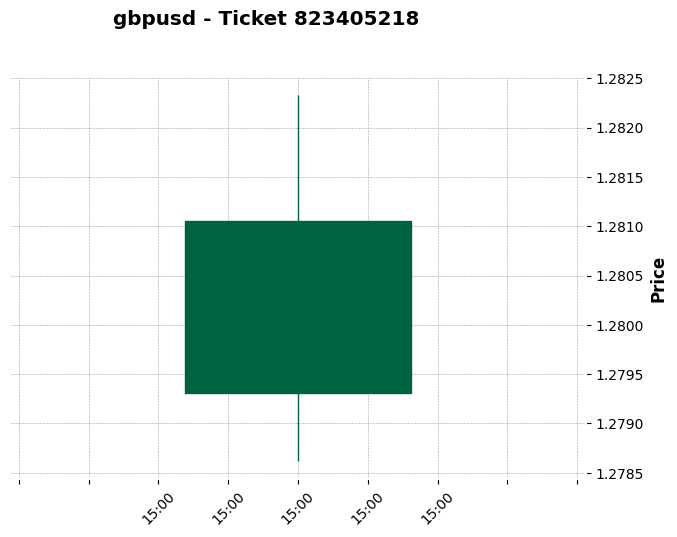

<Figure size 1200x600 with 0 Axes>

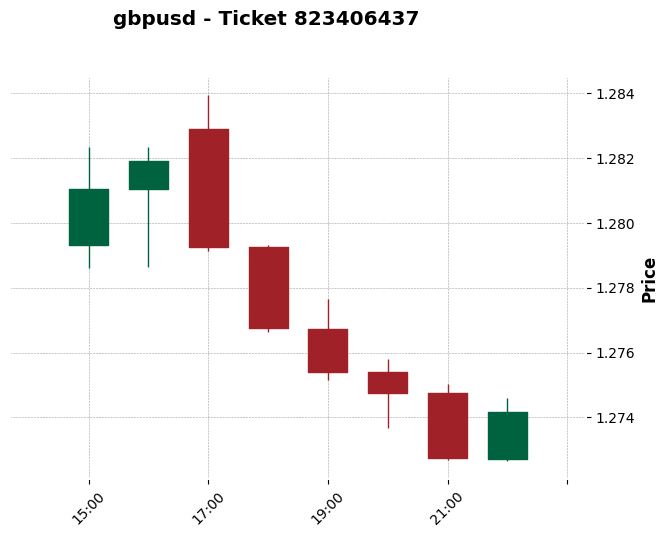

<Figure size 1200x600 with 0 Axes>

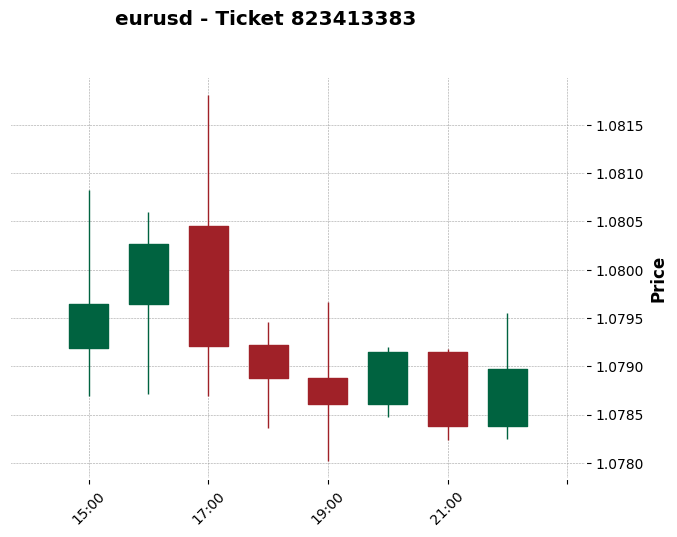

<Figure size 1200x600 with 0 Axes>

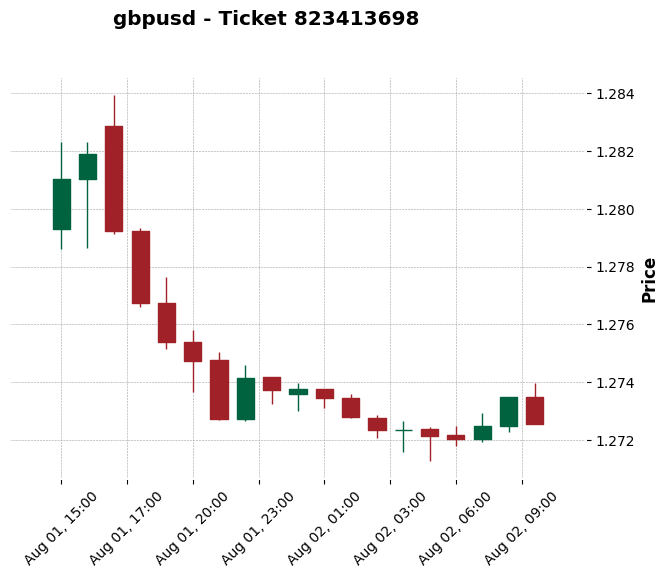

<Figure size 1200x600 with 0 Axes>

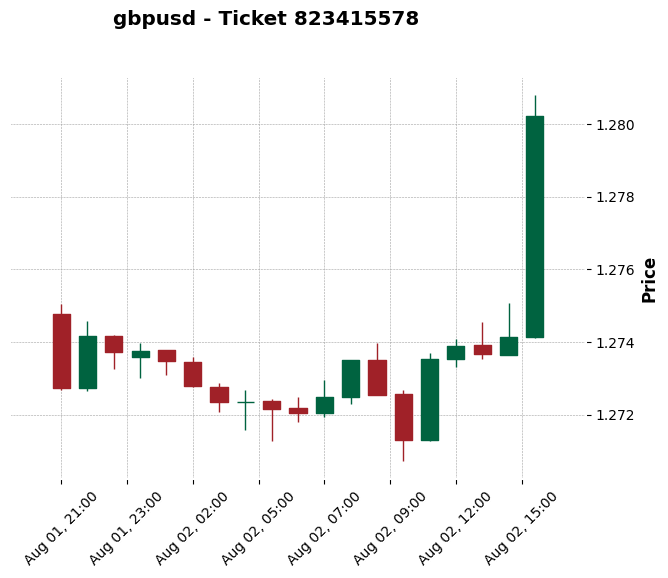

<Figure size 1200x600 with 0 Axes>

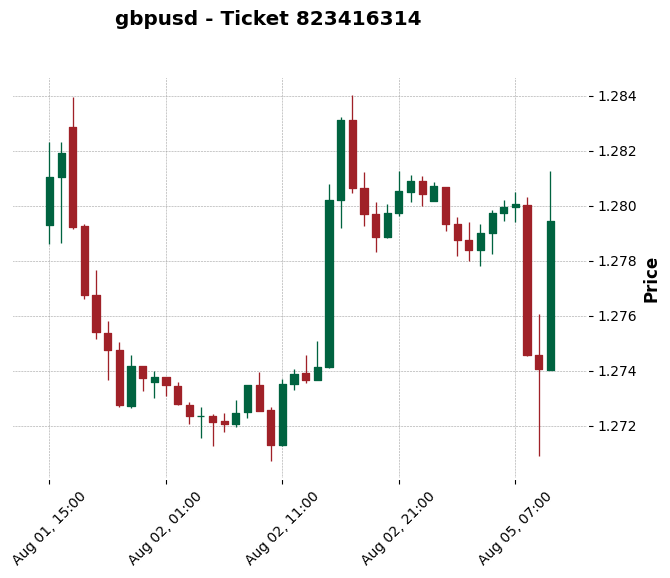

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

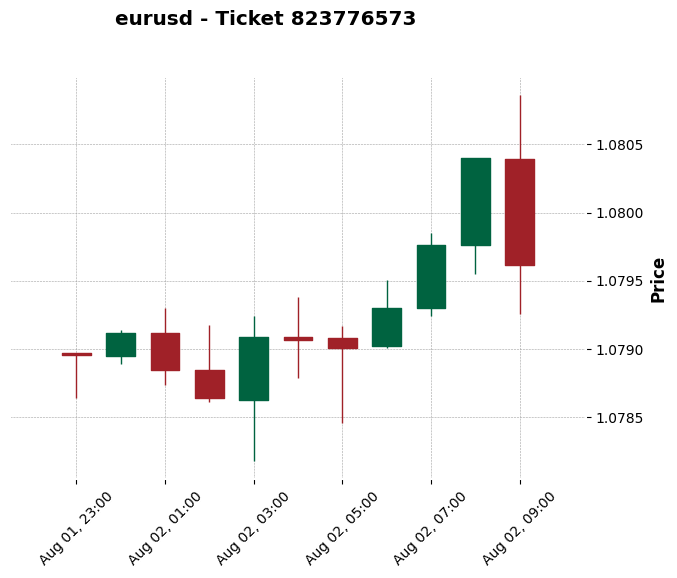

Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

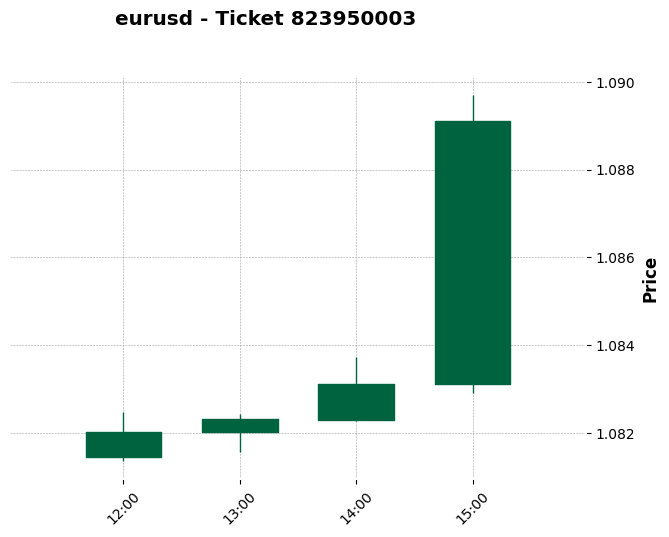

Нет данных котировок для сделки 823950168 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

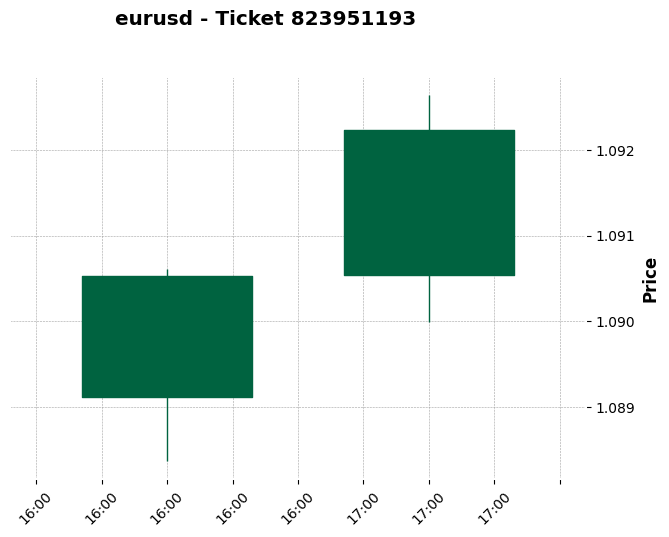

<Figure size 1200x600 with 0 Axes>

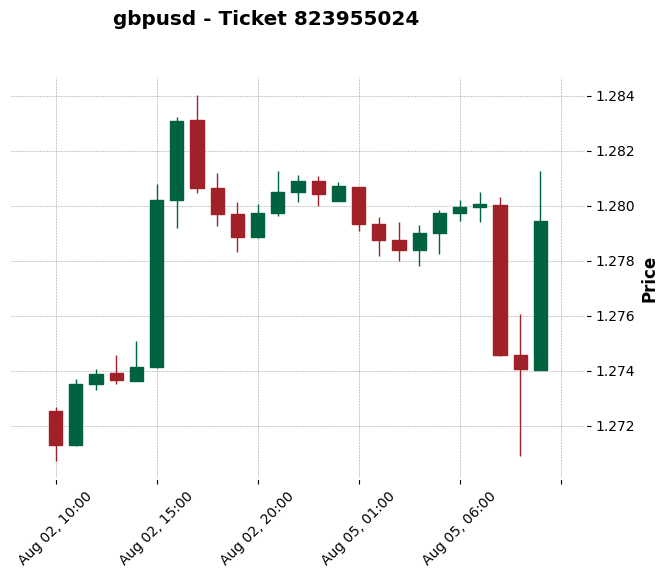

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

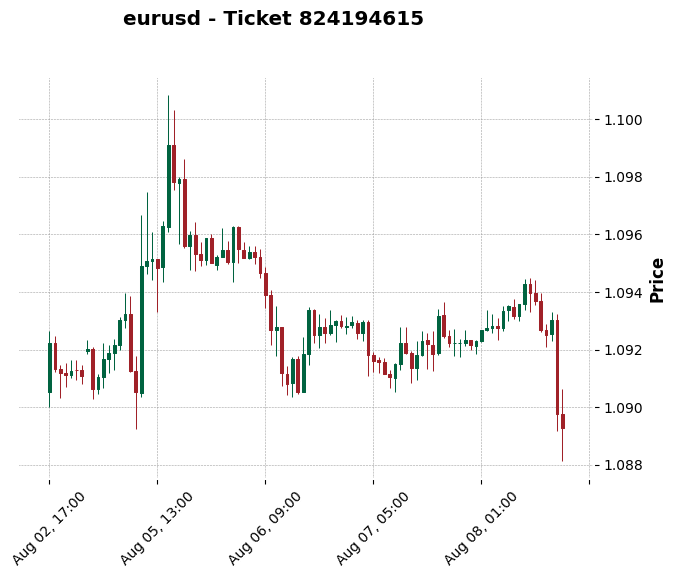

<Figure size 1200x600 with 0 Axes>

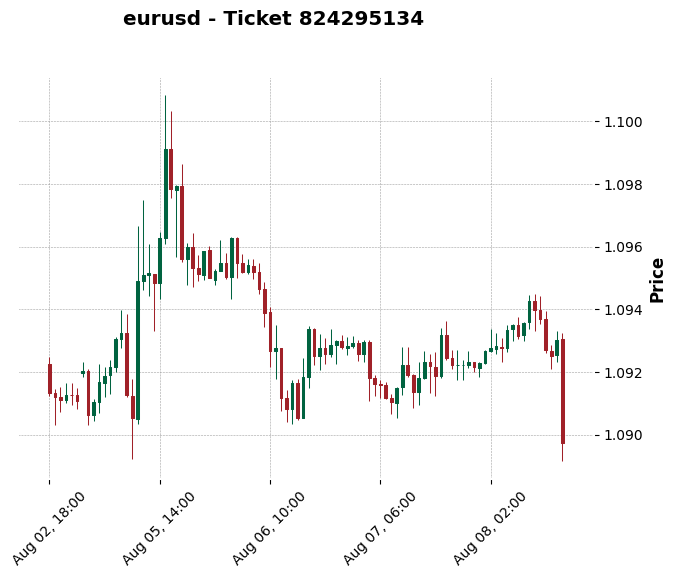

<Figure size 1200x600 with 0 Axes>

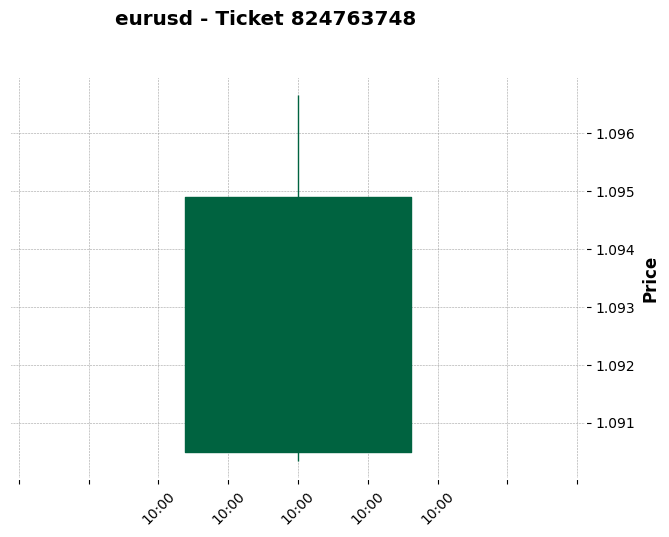

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

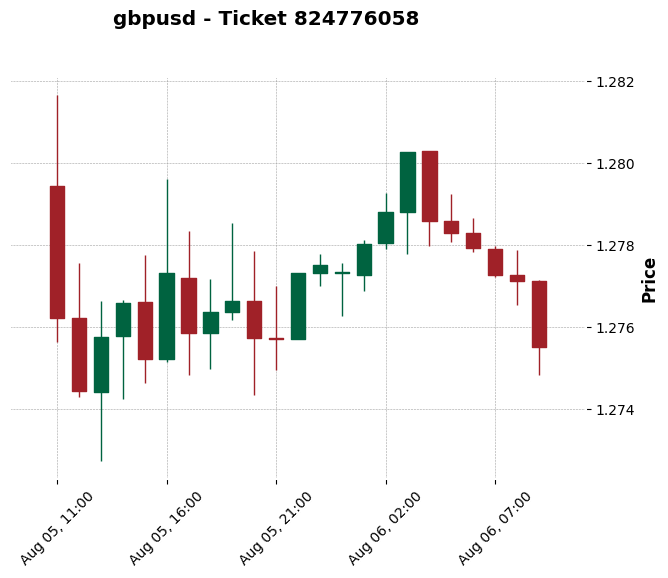

<Figure size 1200x600 with 0 Axes>

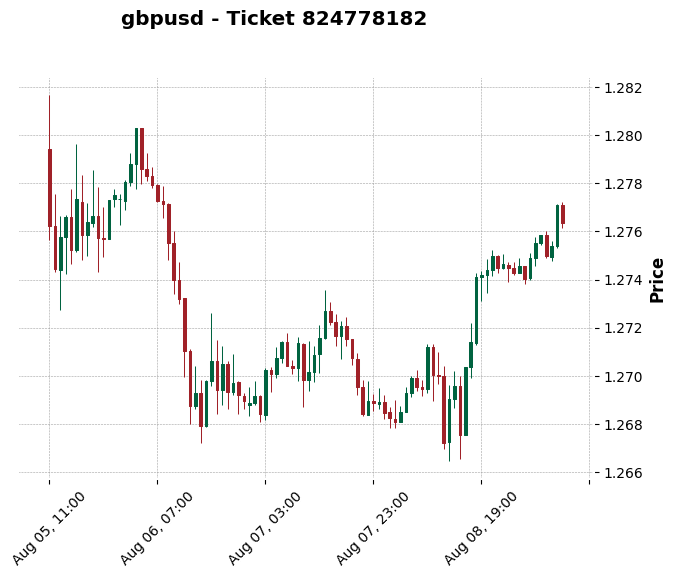

<Figure size 1200x600 with 0 Axes>

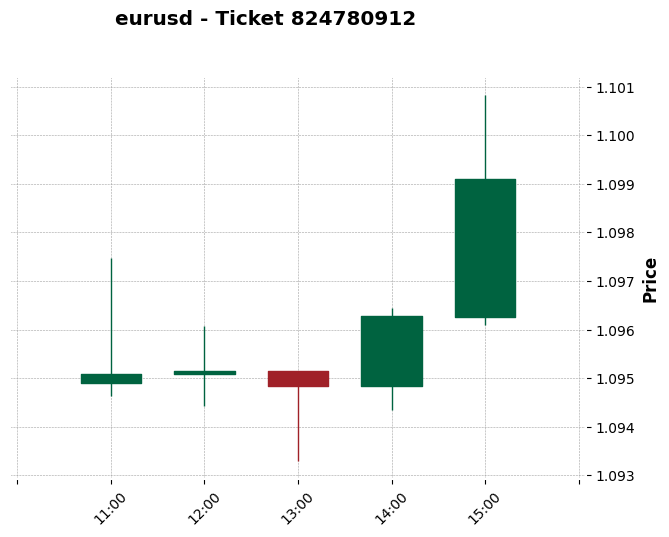

<Figure size 1200x600 with 0 Axes>

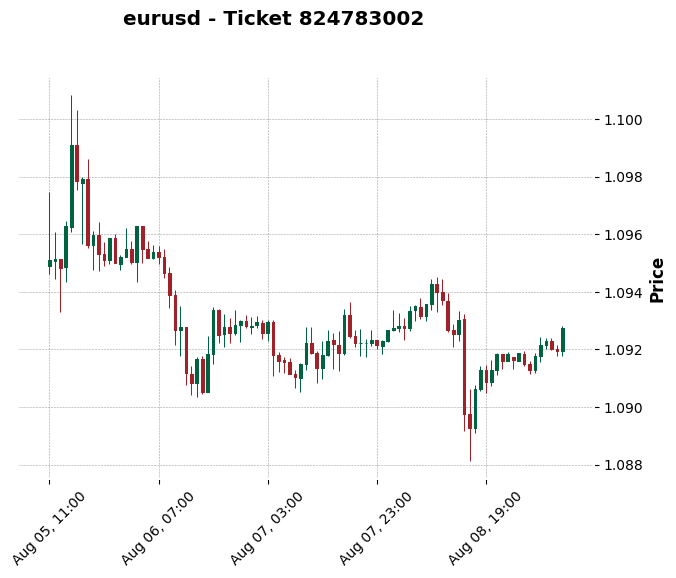

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

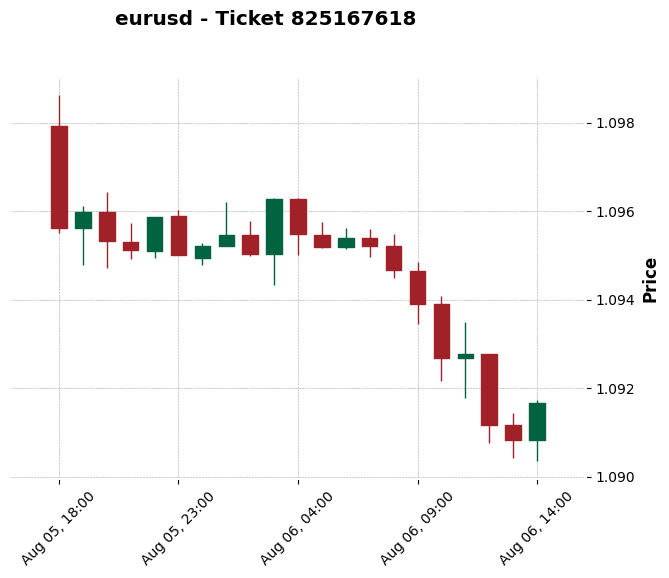

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

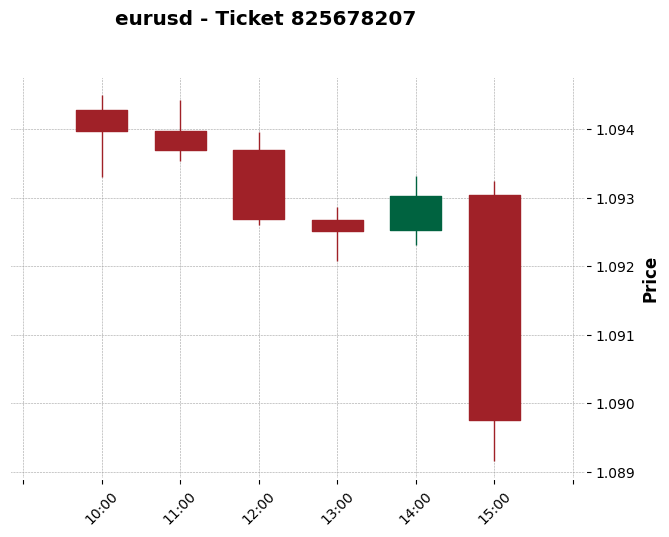

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

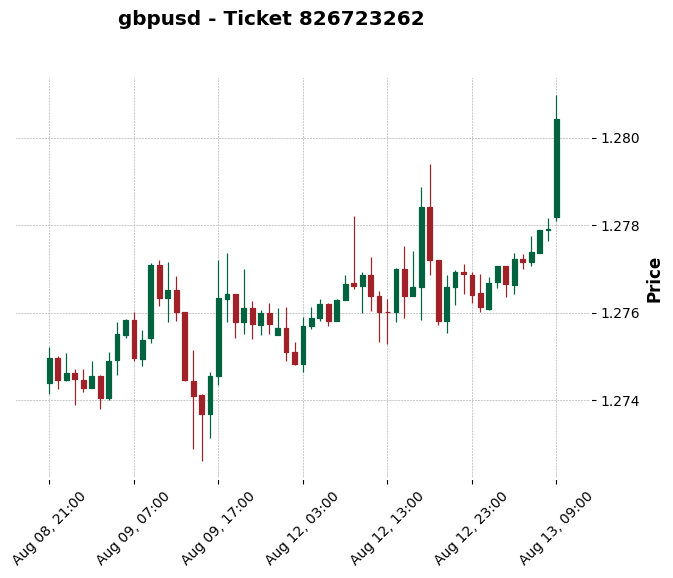

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

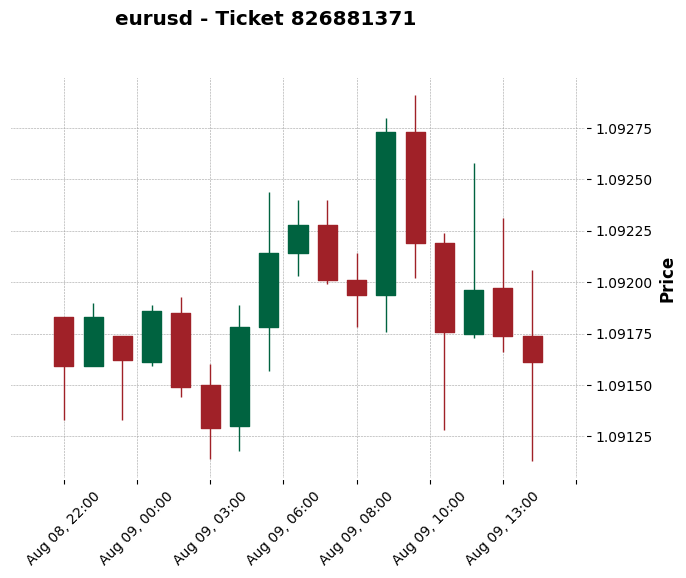

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

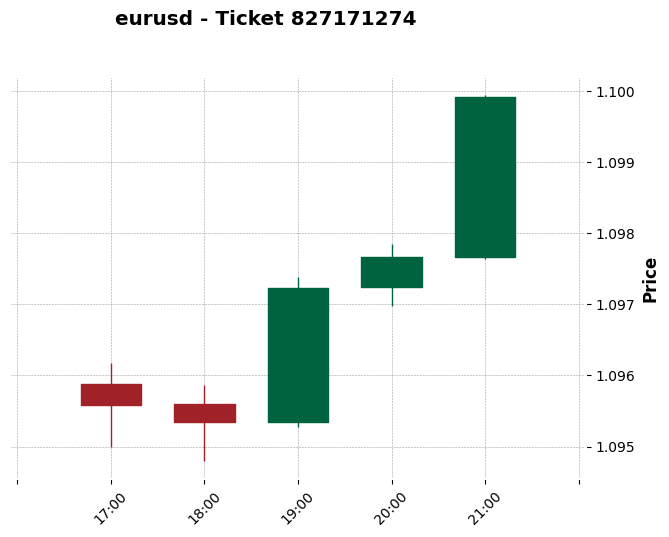

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

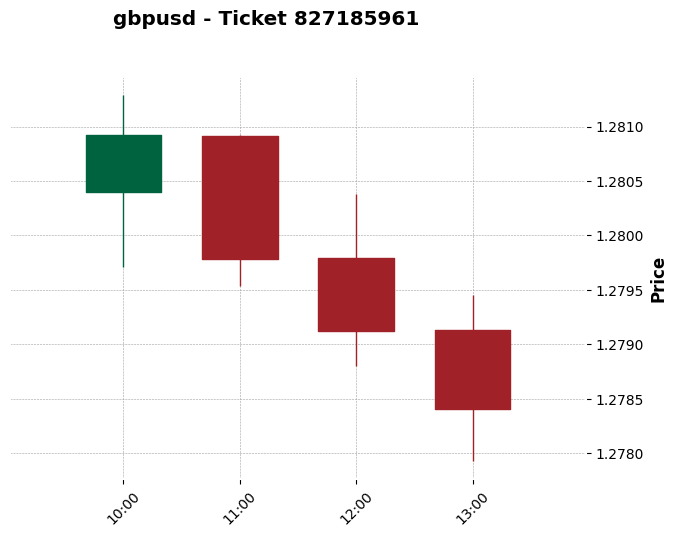

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

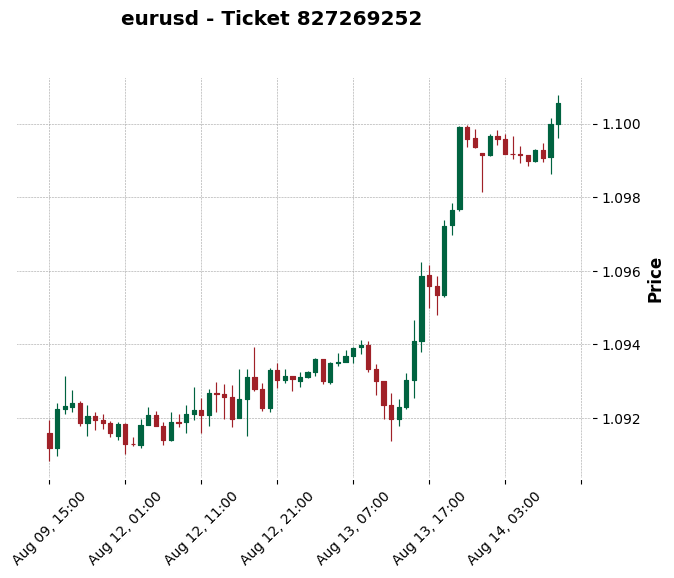

Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

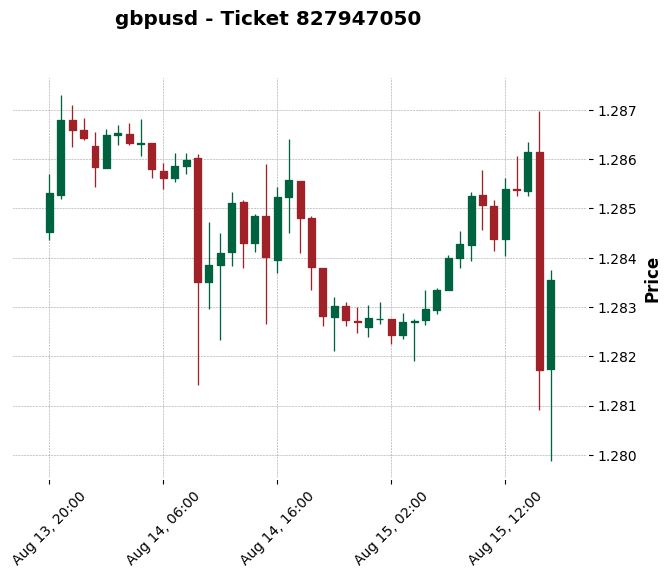

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.


<Figure size 1200x600 with 0 Axes>

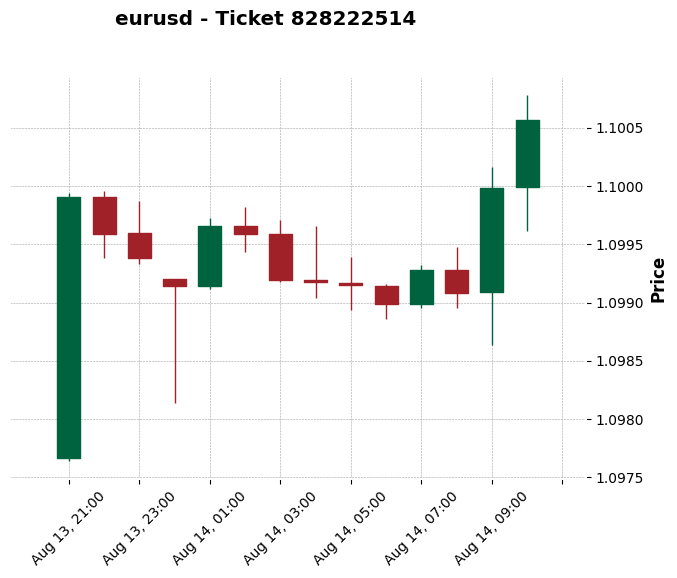

<Figure size 1200x600 with 0 Axes>

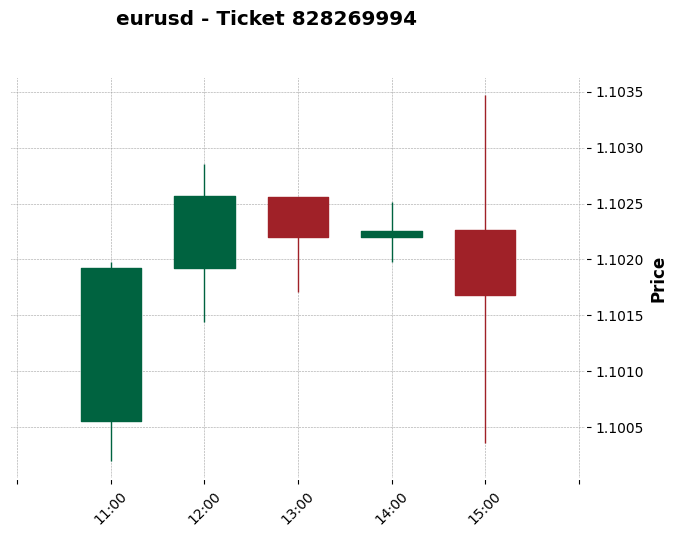

<Figure size 1200x600 with 0 Axes>

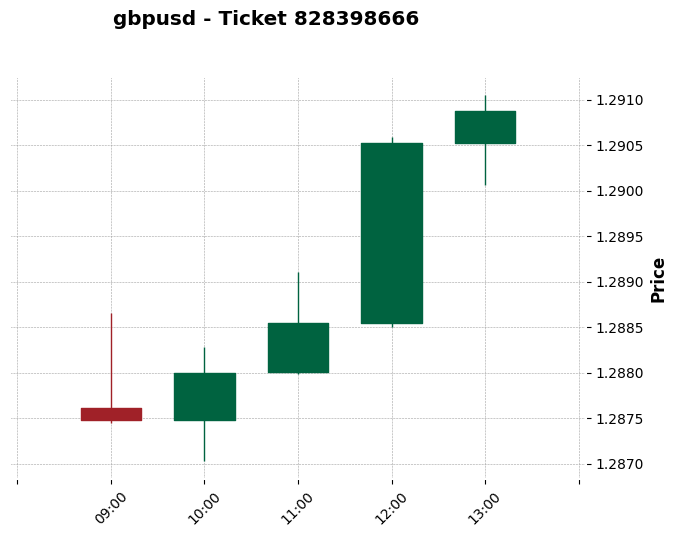

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

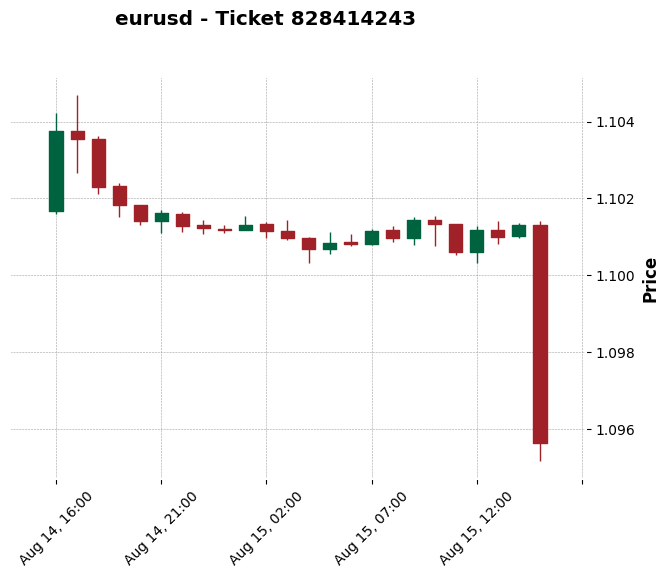

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Нет данных котировок для сделки 828944569 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

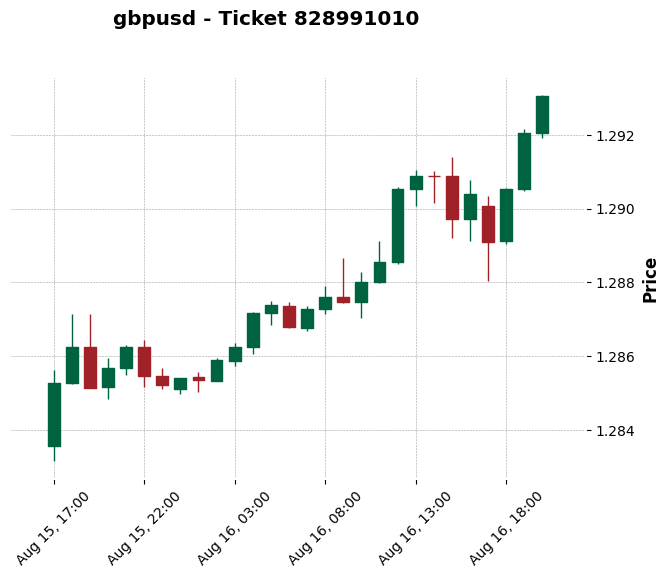

<Figure size 1200x600 with 0 Axes>

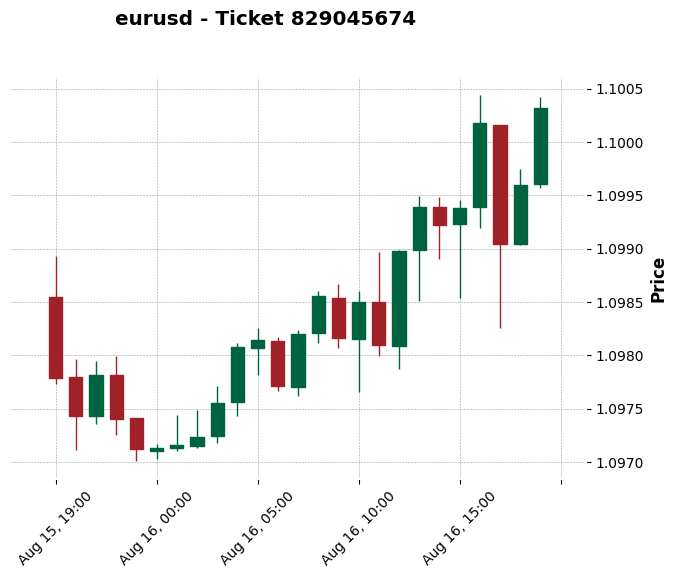

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Нет данных котировок для сделки 829254836 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

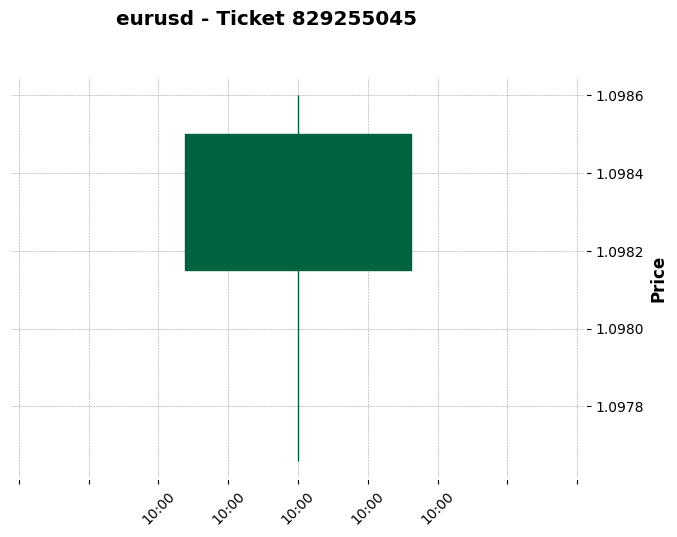

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Нет данных котировок для сделки 829559910 в заданном интервале.
Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price')

            # Добавление меток на график
            plt.text(row['Open Time'], row['Price'], 'Open', color='green', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'], 'Close', color='red', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], row['Price.1'] + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<Figure size 1200x600 with 0 Axes>

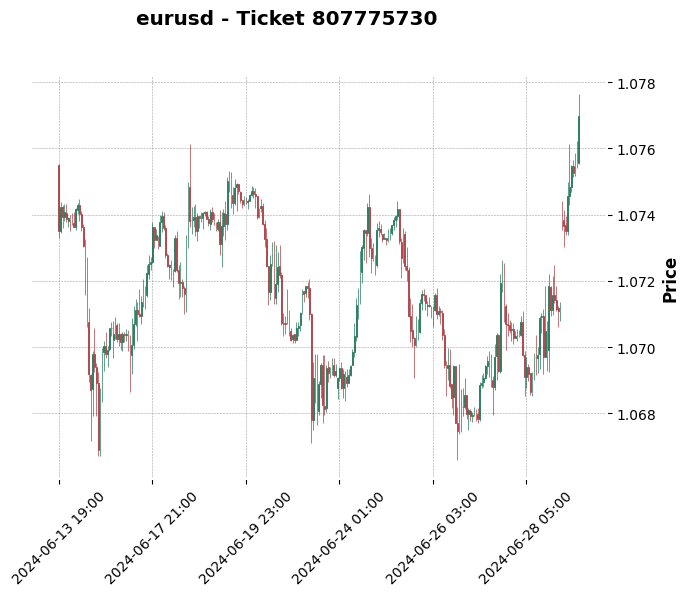

<Figure size 1200x600 with 0 Axes>

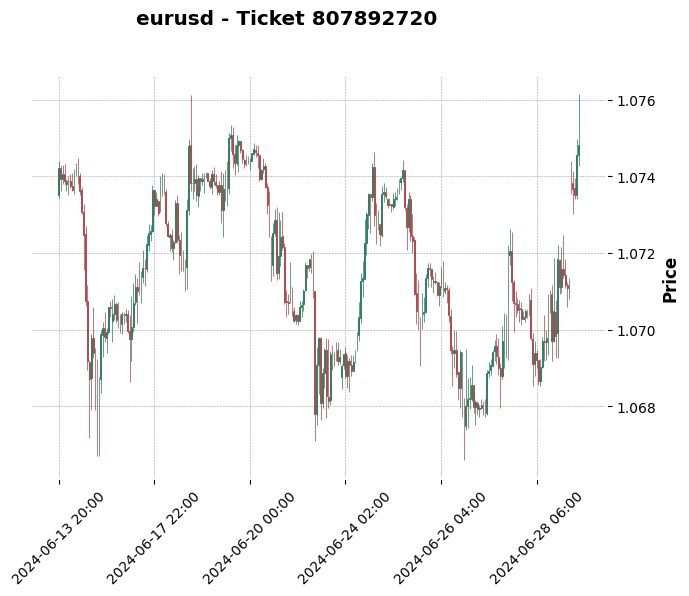

<Figure size 1200x600 with 0 Axes>

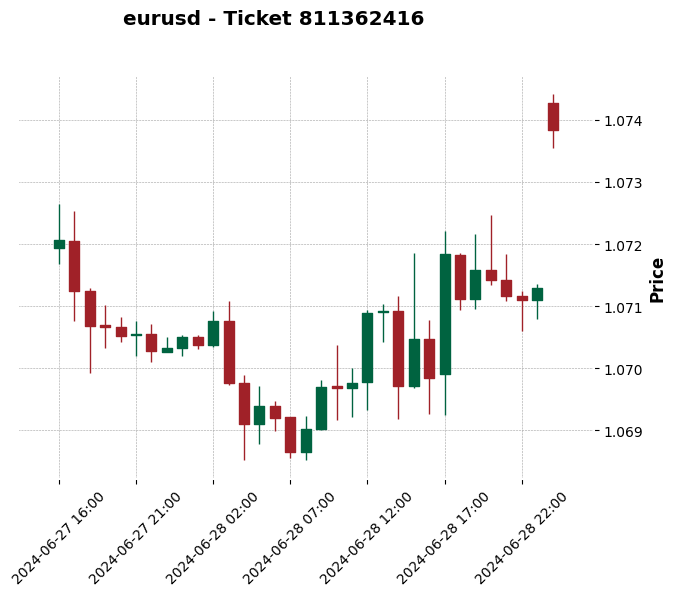

<Figure size 1200x600 with 0 Axes>

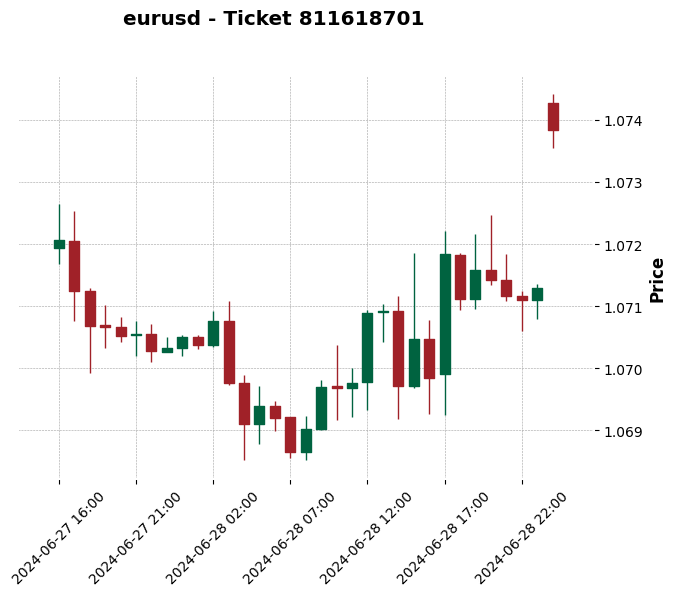

<Figure size 1200x600 with 0 Axes>

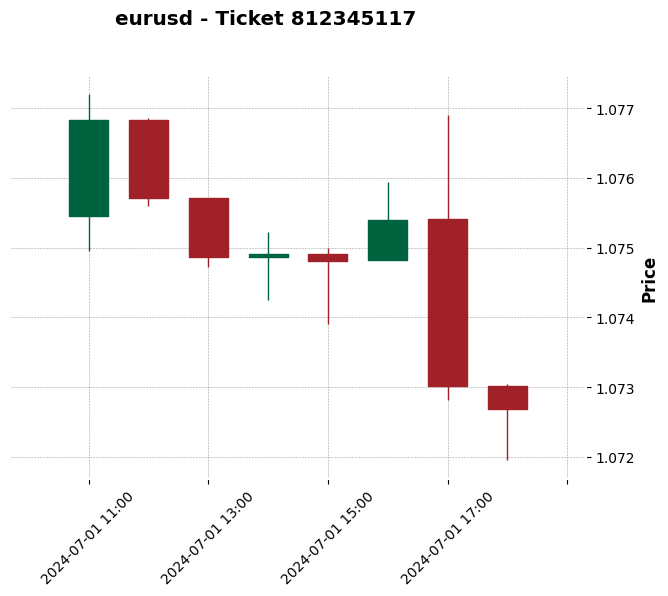

<Figure size 1200x600 with 0 Axes>

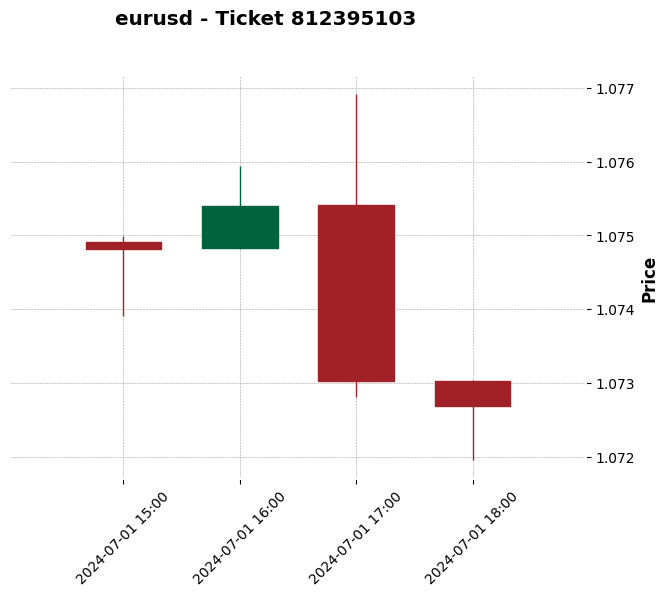

Нет данных котировок для сделки 812707226 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

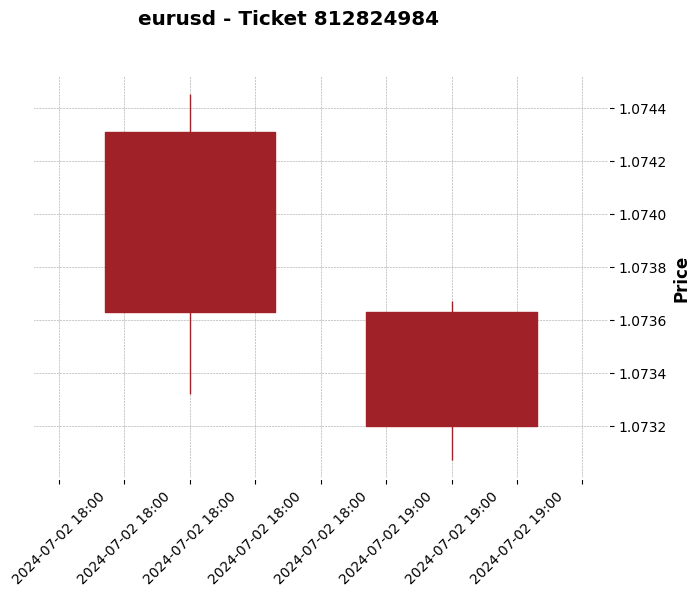

<Figure size 1200x600 with 0 Axes>

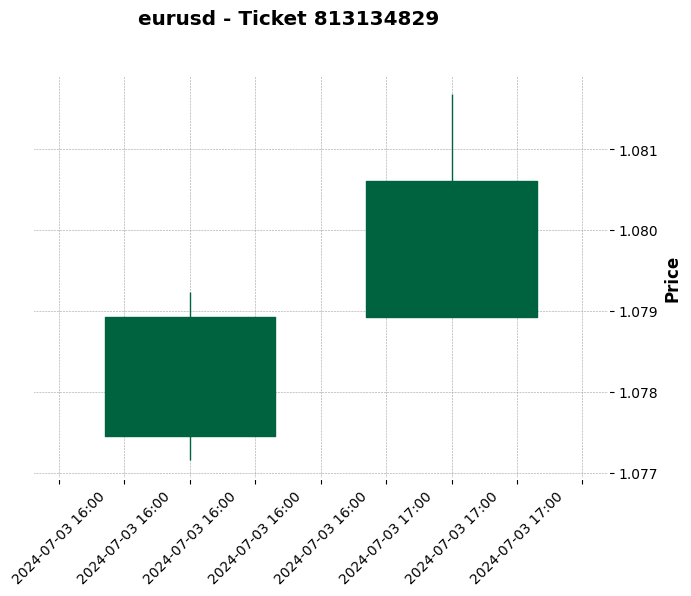

<Figure size 1200x600 with 0 Axes>

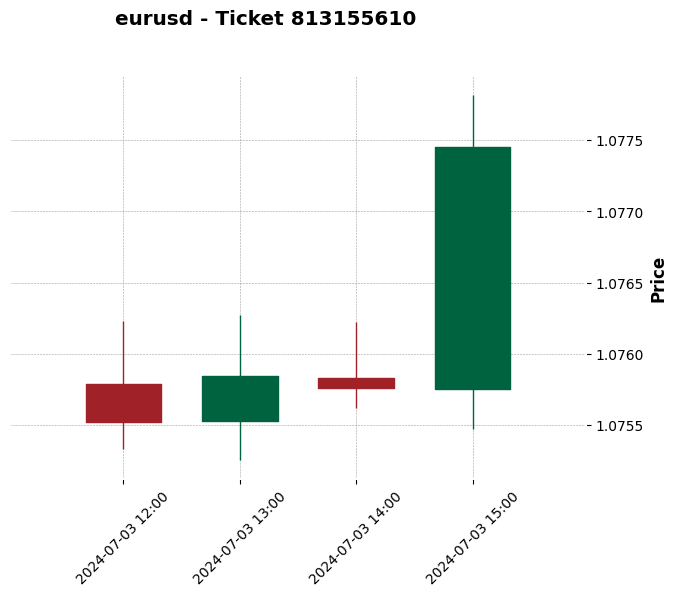

<Figure size 1200x600 with 0 Axes>

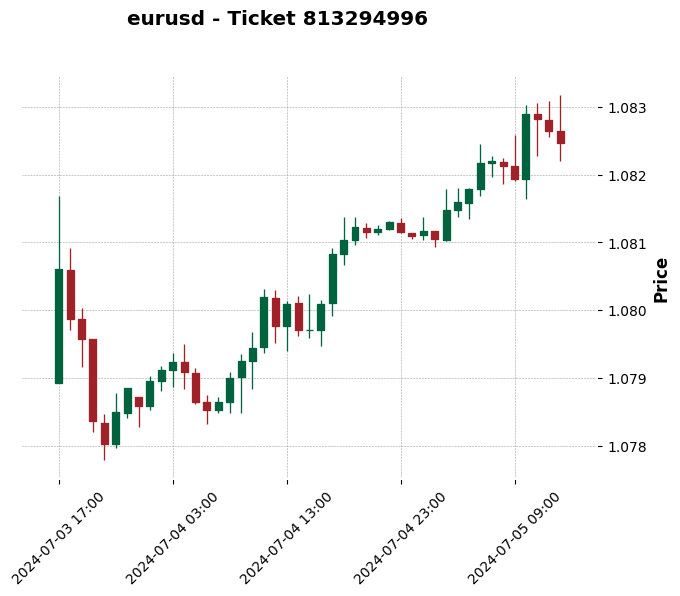

<Figure size 1200x600 with 0 Axes>

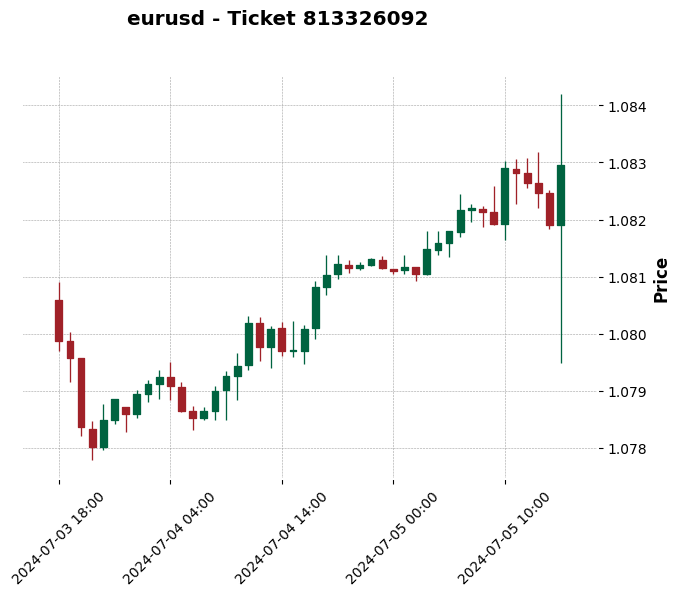

<Figure size 1200x600 with 0 Axes>

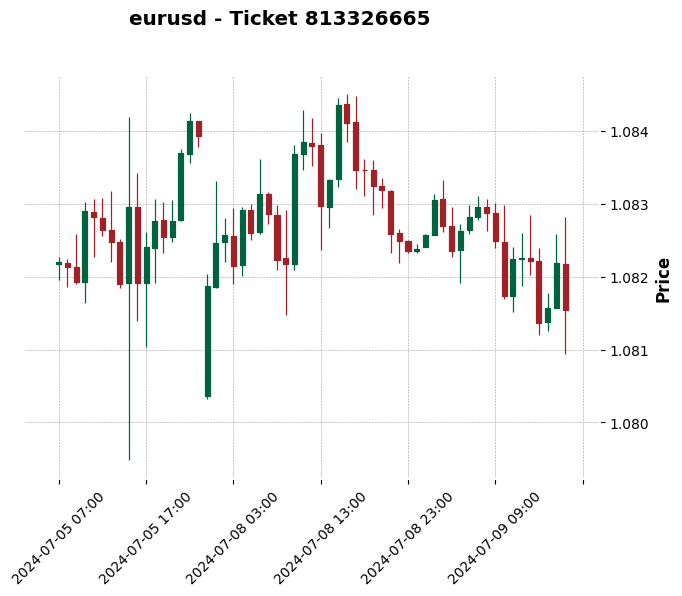

<Figure size 1200x600 with 0 Axes>

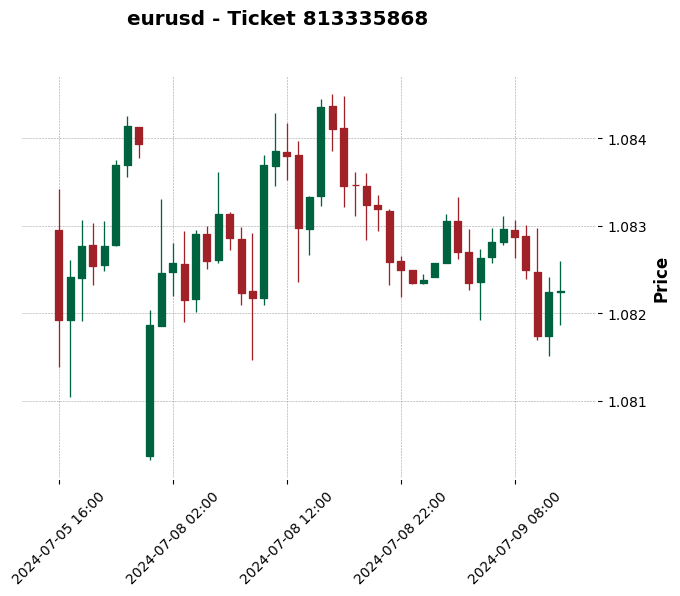

<Figure size 1200x600 with 0 Axes>

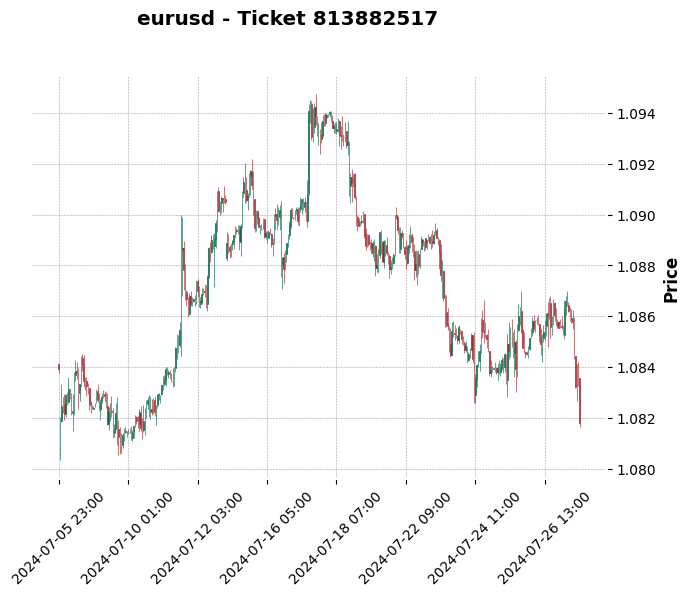

<Figure size 1200x600 with 0 Axes>

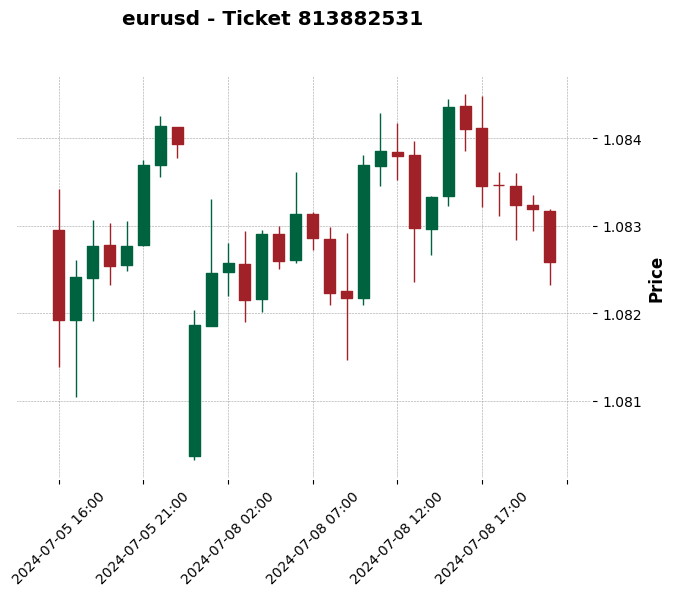

<Figure size 1200x600 with 0 Axes>

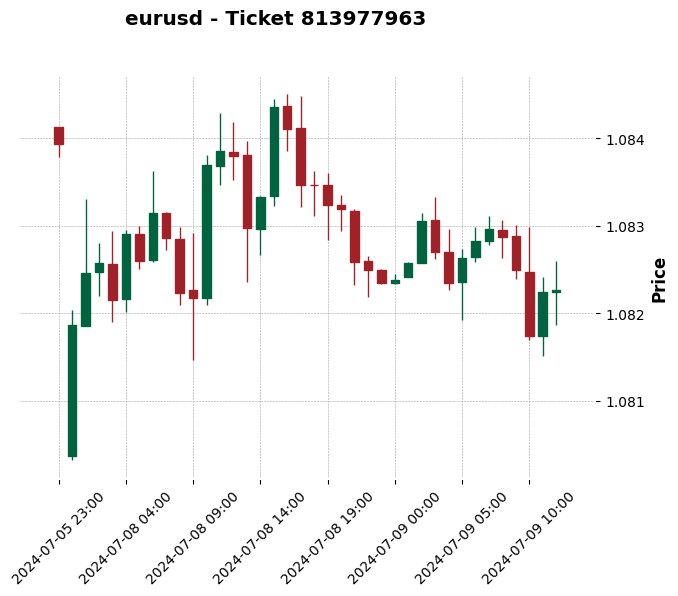

<Figure size 1200x600 with 0 Axes>

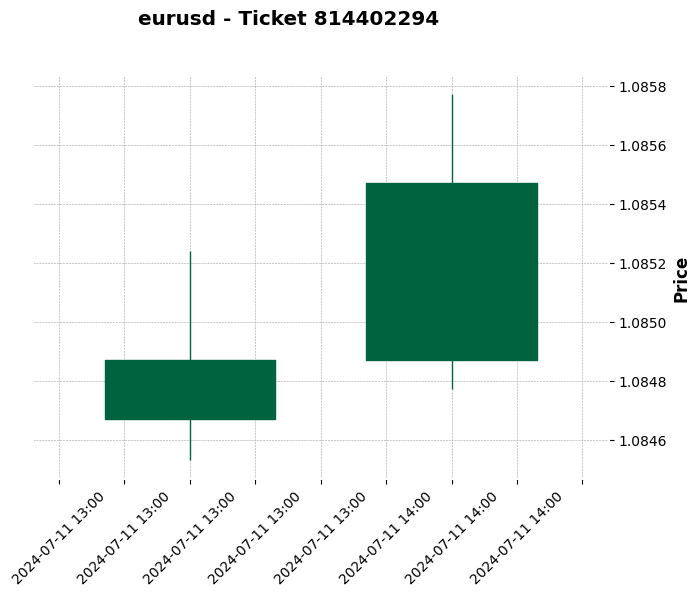

<Figure size 1200x600 with 0 Axes>

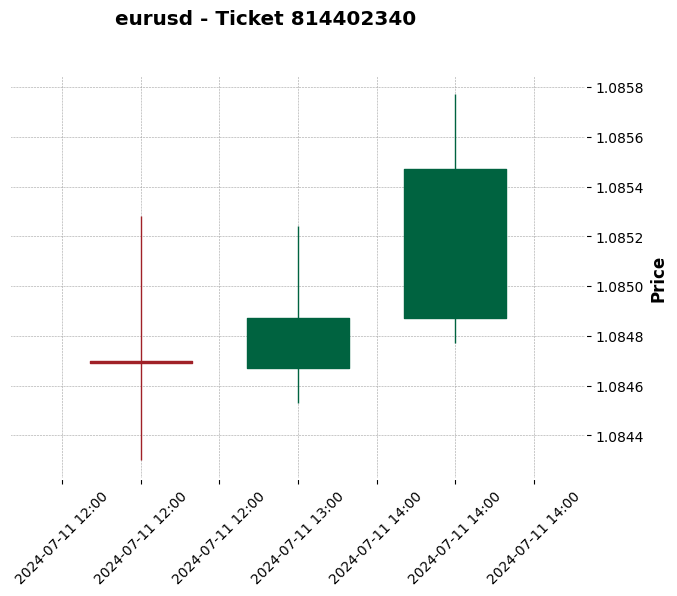

<Figure size 1200x600 with 0 Axes>

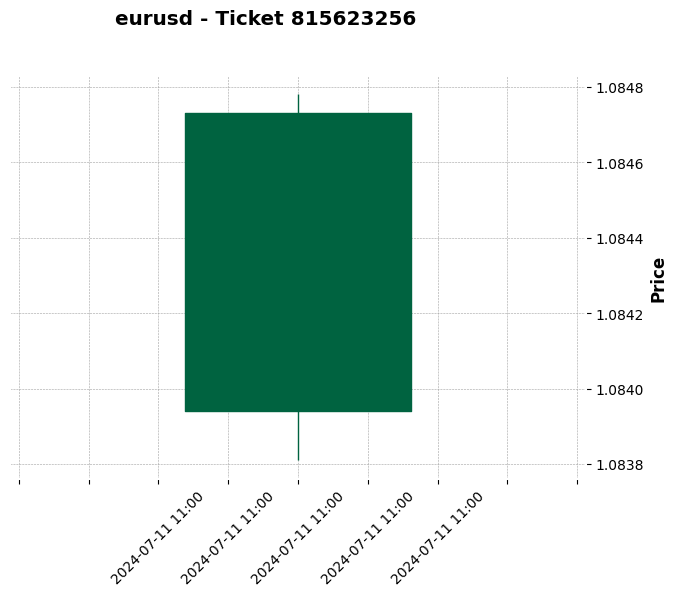

<Figure size 1200x600 with 0 Axes>

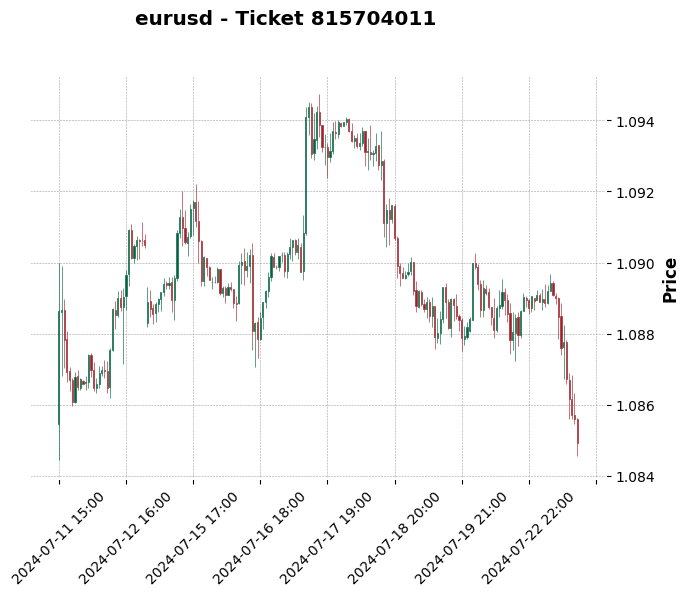

<Figure size 1200x600 with 0 Axes>

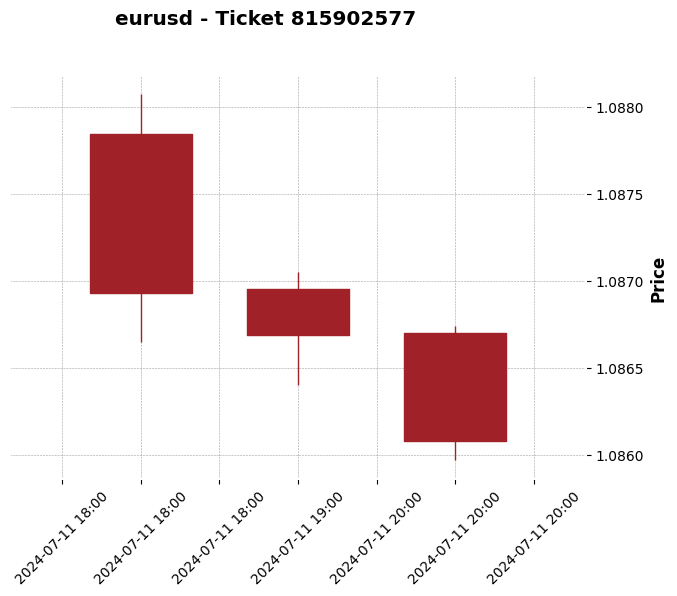

<Figure size 1200x600 with 0 Axes>

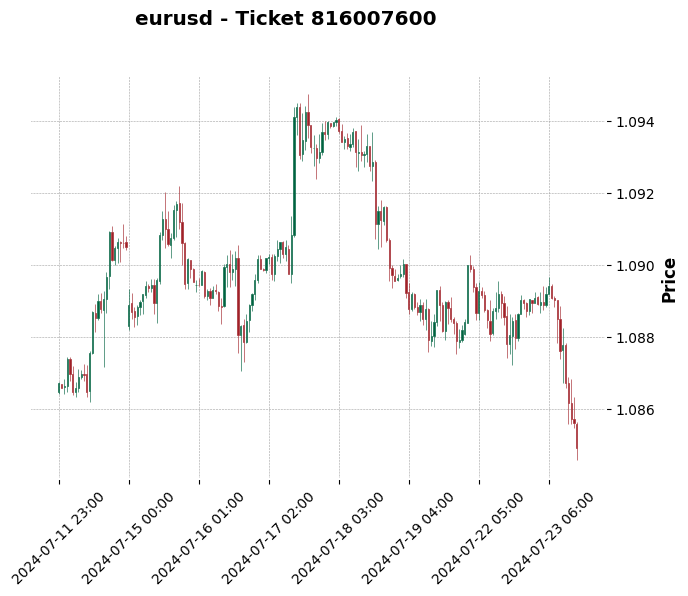

<Figure size 1200x600 with 0 Axes>

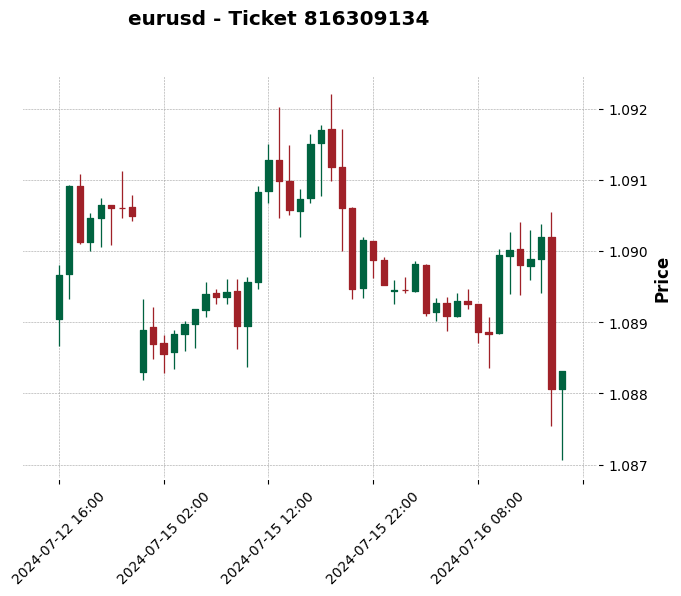

<Figure size 1200x600 with 0 Axes>

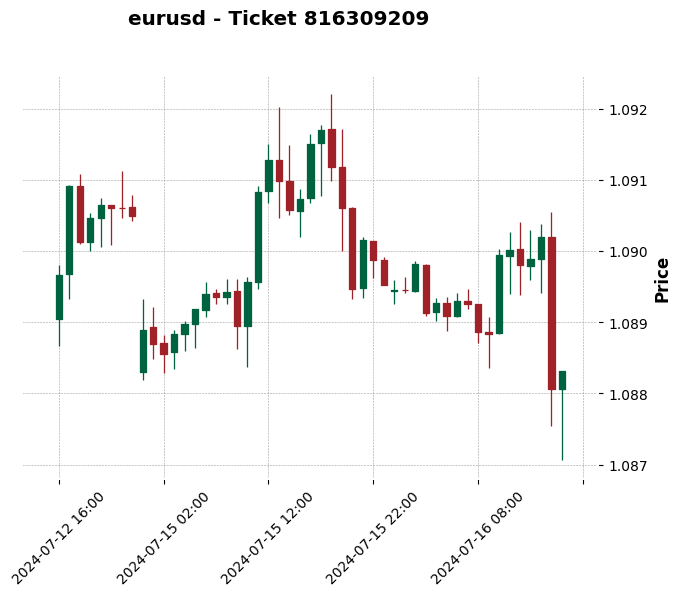

<Figure size 1200x600 with 0 Axes>

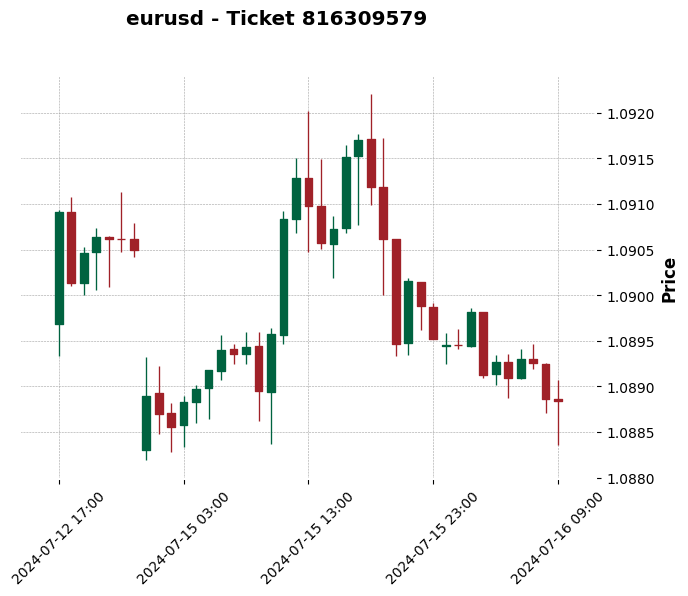

<Figure size 1200x600 with 0 Axes>

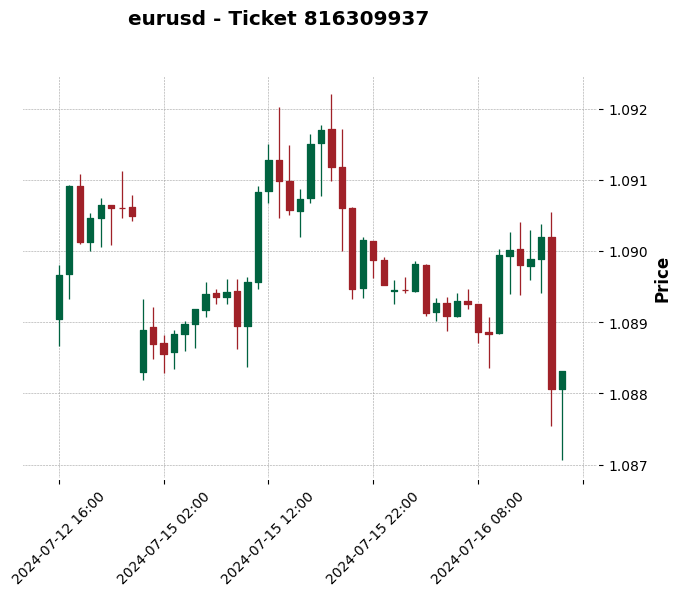

<Figure size 1200x600 with 0 Axes>

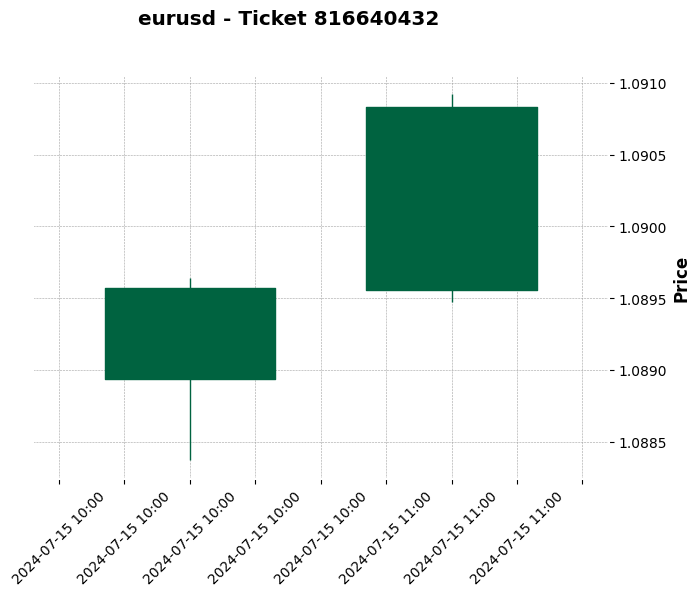

<Figure size 1200x600 with 0 Axes>

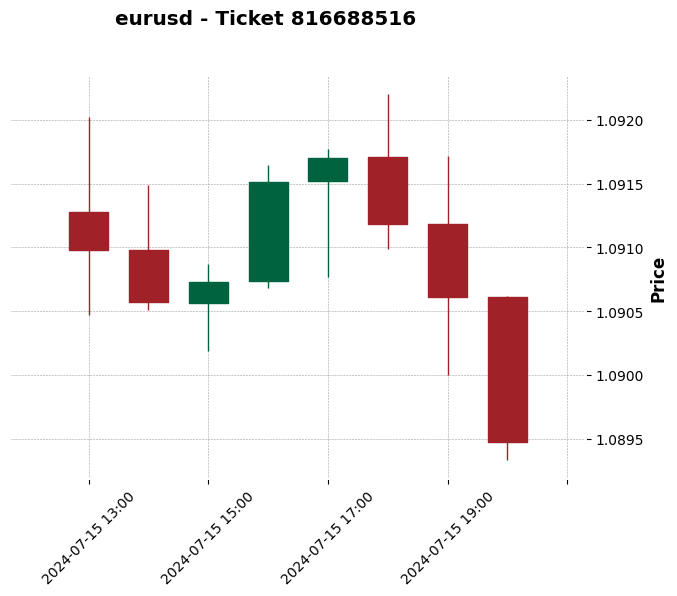

<Figure size 1200x600 with 0 Axes>

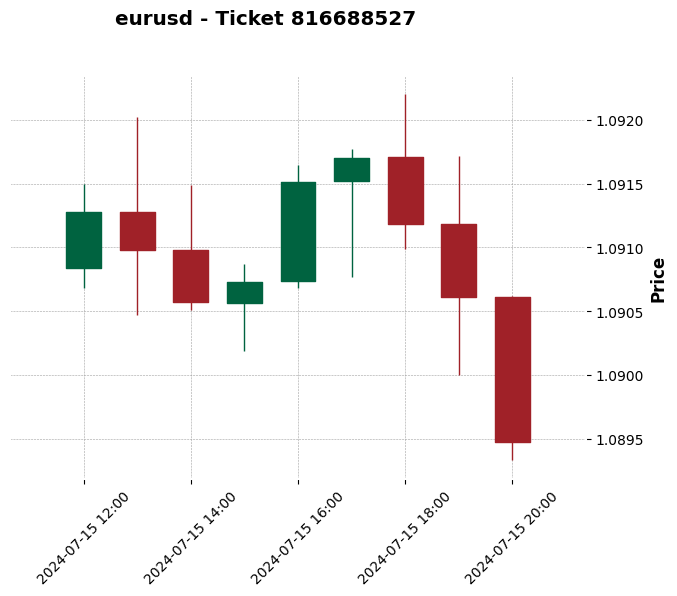

Нет данных котировок для сделки 817235256 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

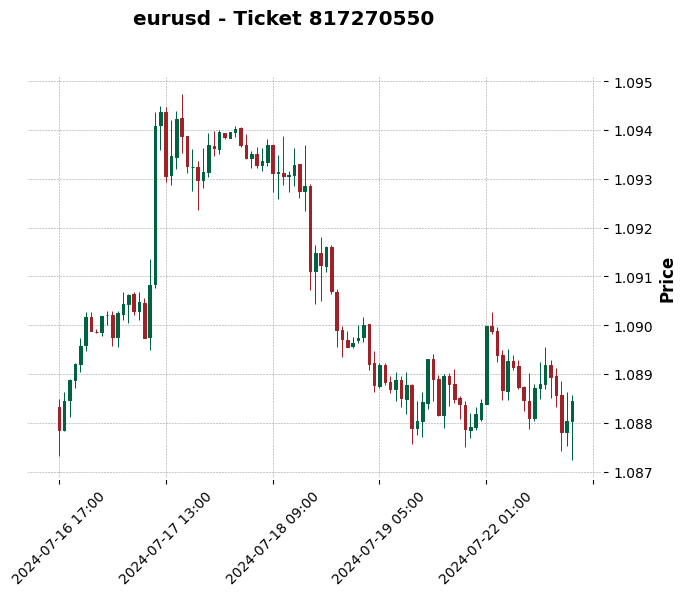

<Figure size 1200x600 with 0 Axes>

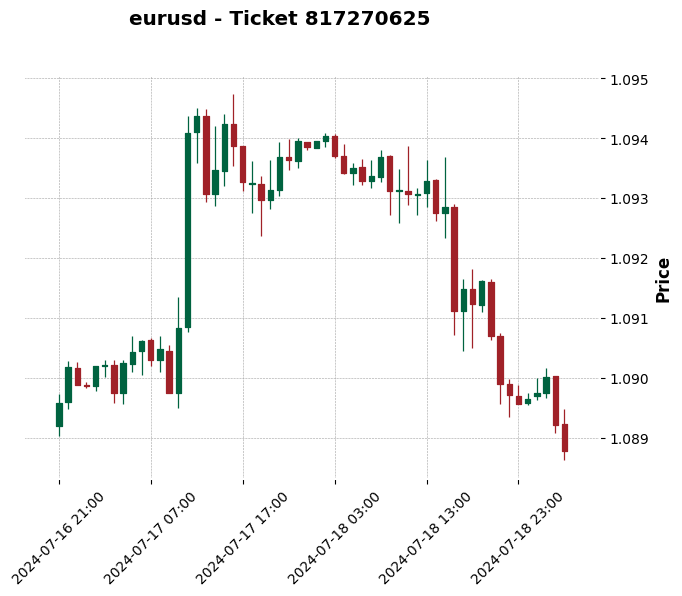

<Figure size 1200x600 with 0 Axes>

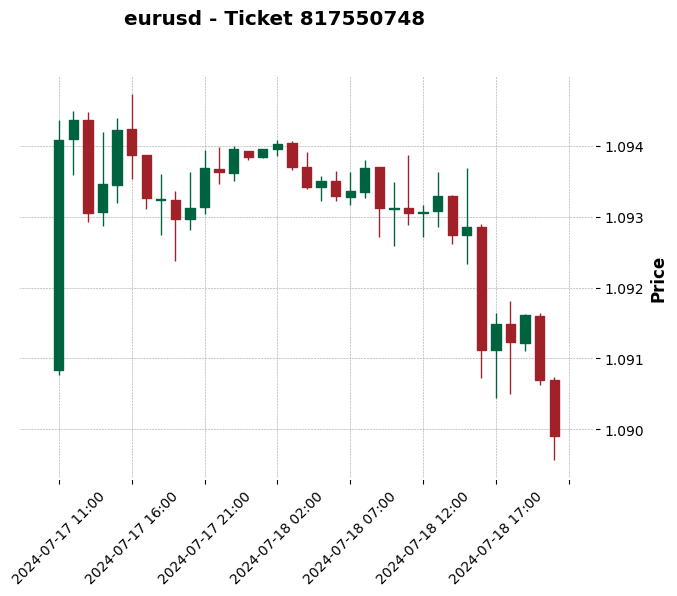

<Figure size 1200x600 with 0 Axes>

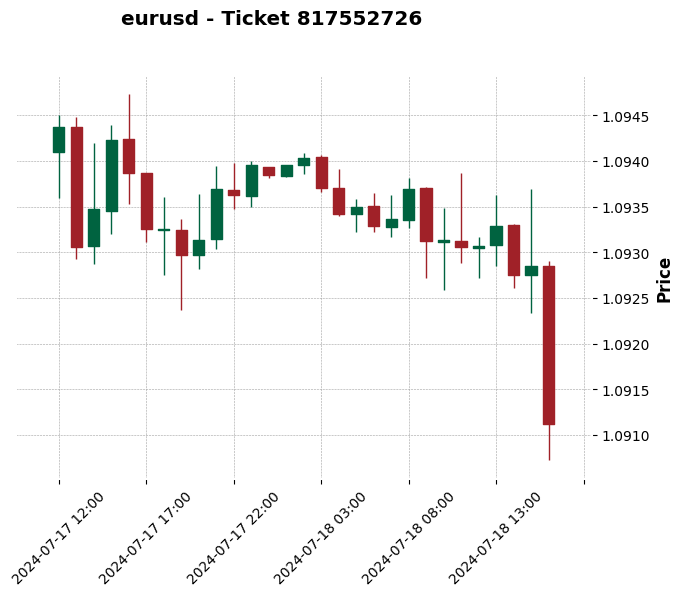

<Figure size 1200x600 with 0 Axes>

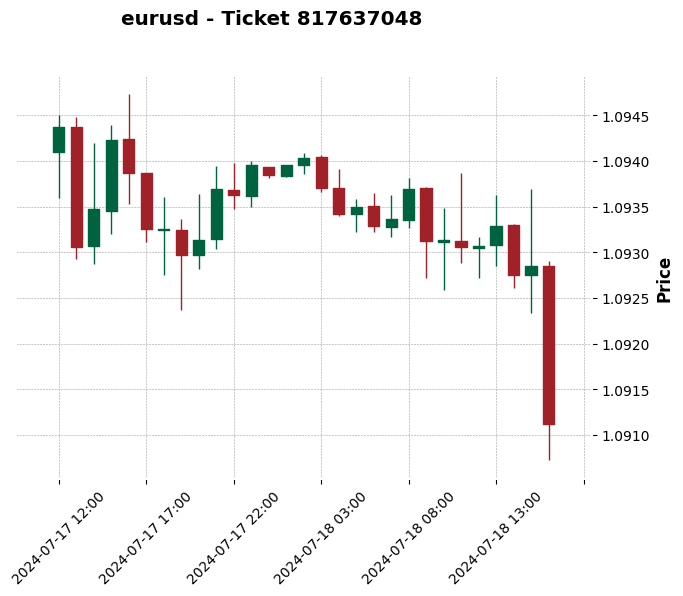

<Figure size 1200x600 with 0 Axes>

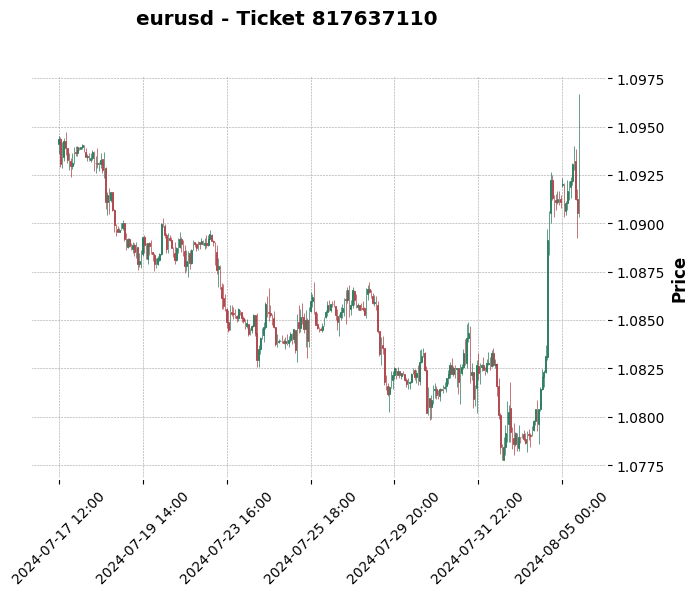

<Figure size 1200x600 with 0 Axes>

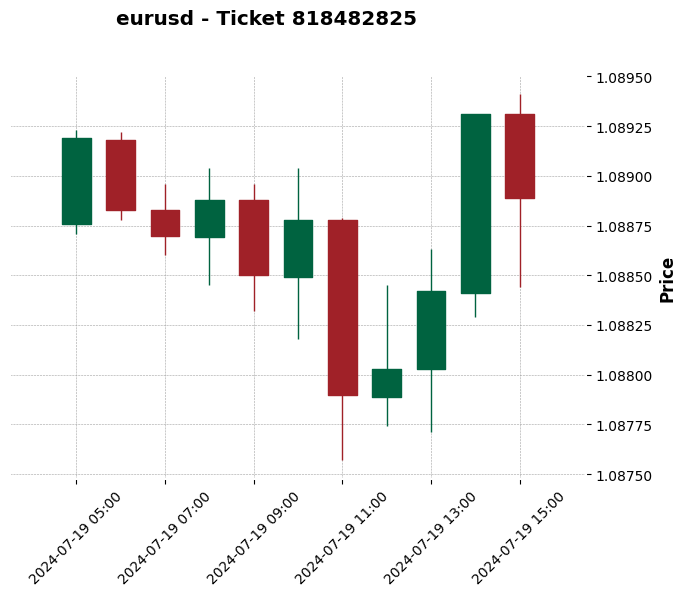

<Figure size 1200x600 with 0 Axes>

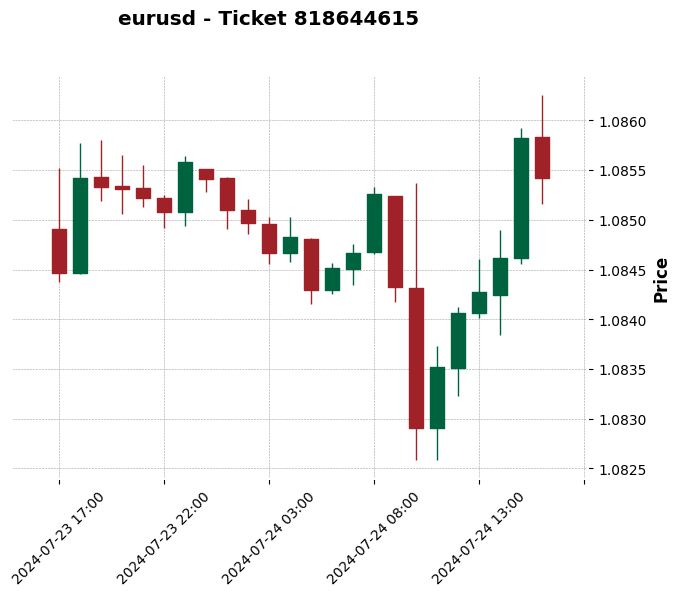

<Figure size 1200x600 with 0 Axes>

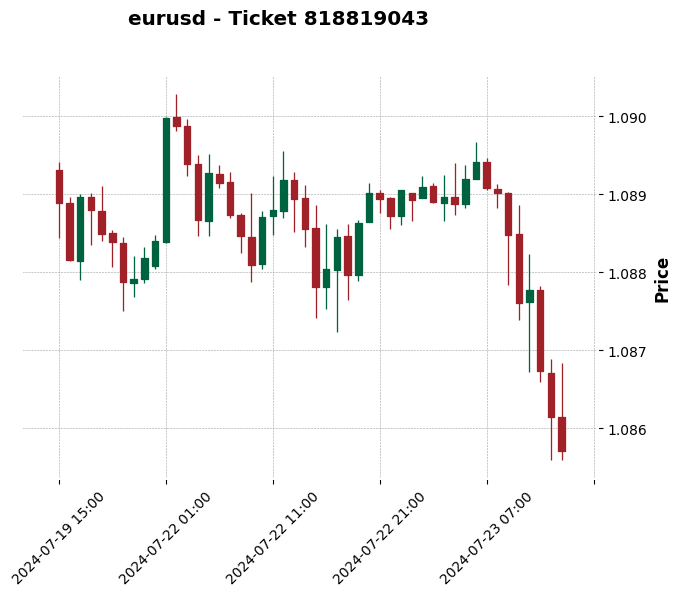

<Figure size 1200x600 with 0 Axes>

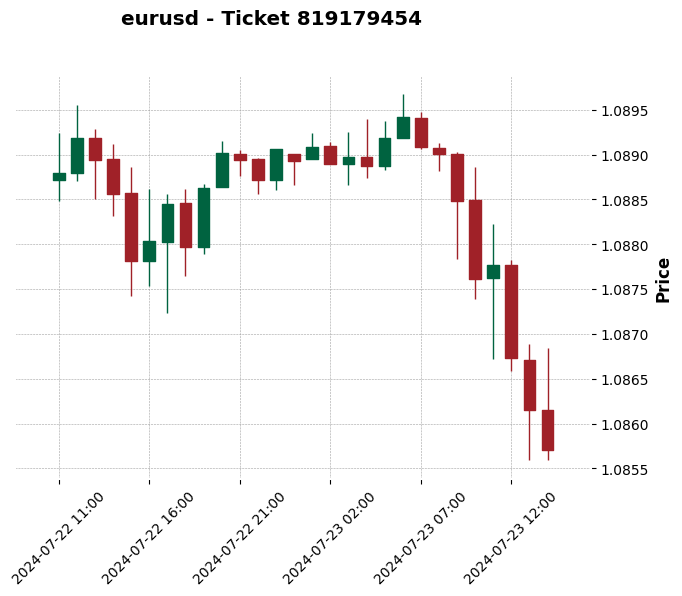

<Figure size 1200x600 with 0 Axes>

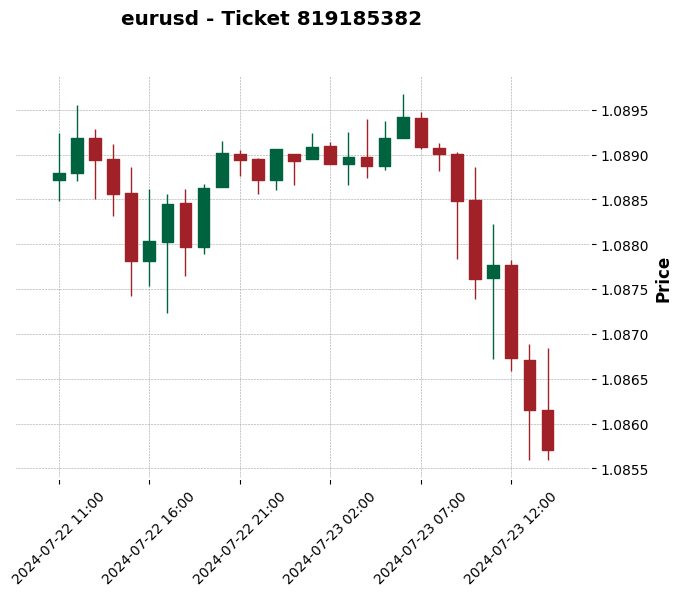

<Figure size 1200x600 with 0 Axes>

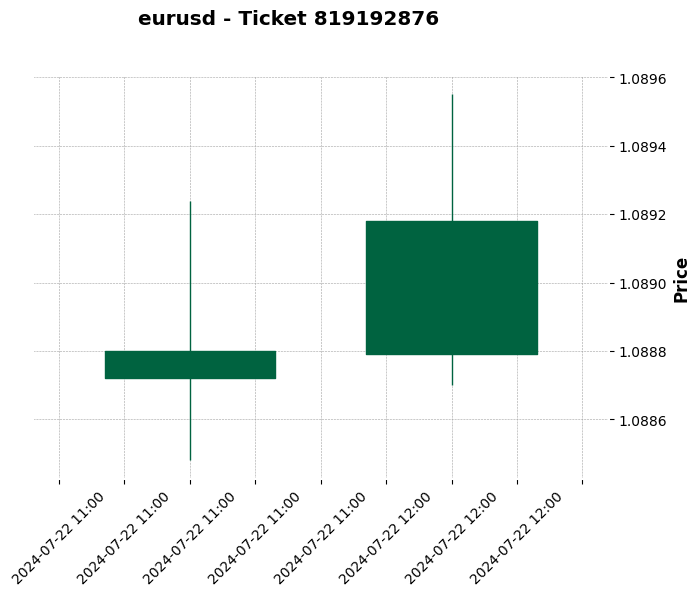

<Figure size 1200x600 with 0 Axes>

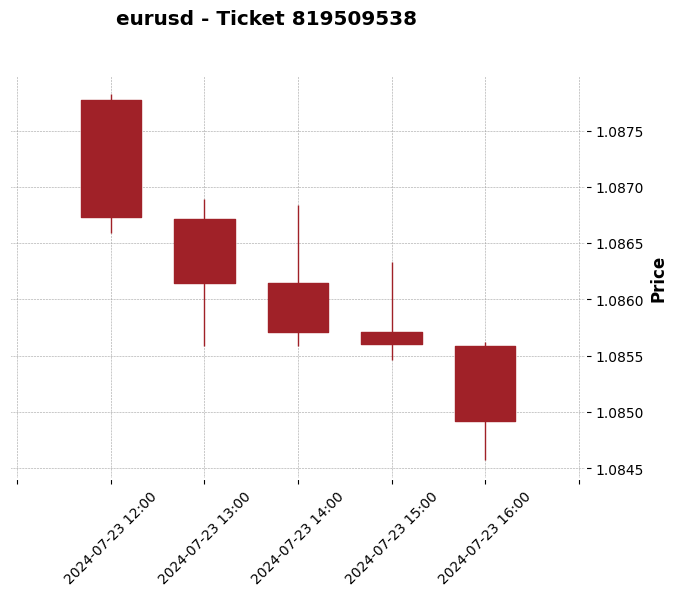

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

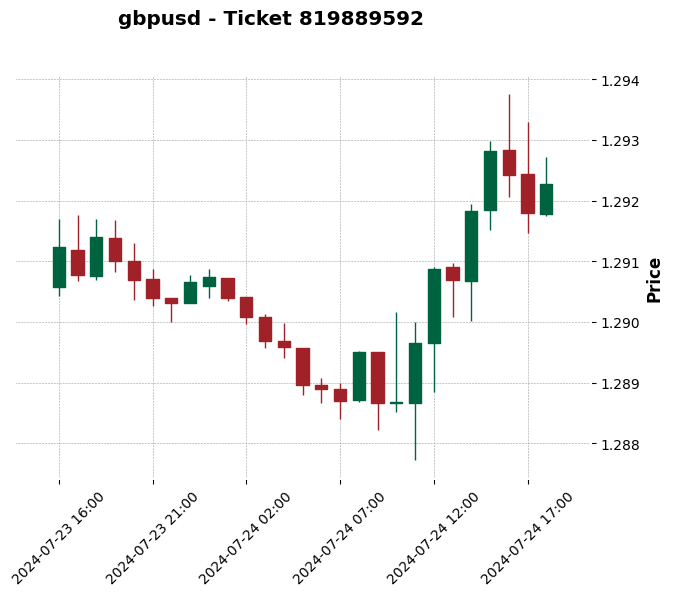

<Figure size 1200x600 with 0 Axes>

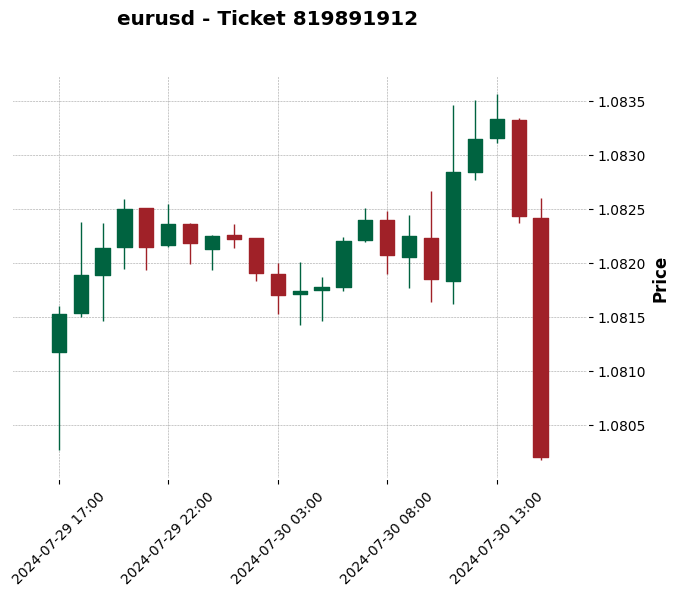

<Figure size 1200x600 with 0 Axes>

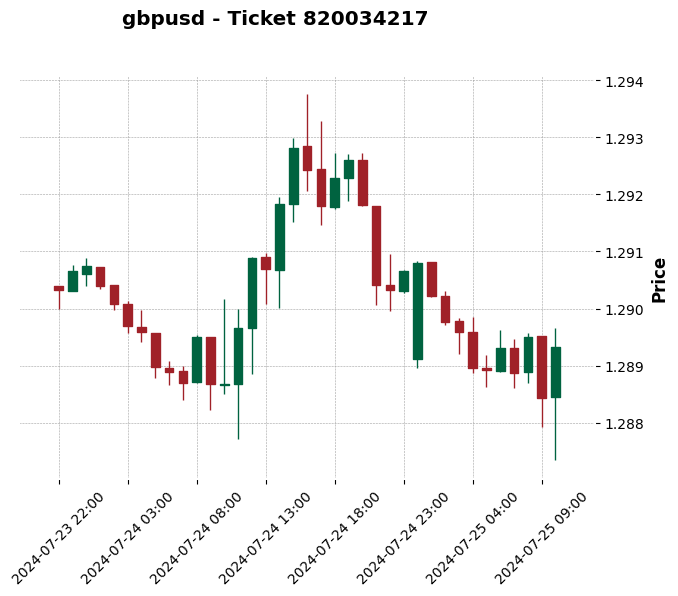

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

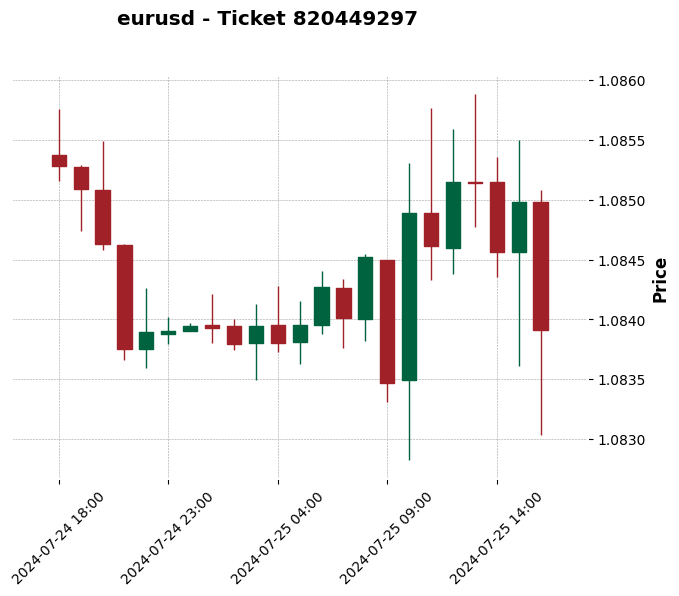

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

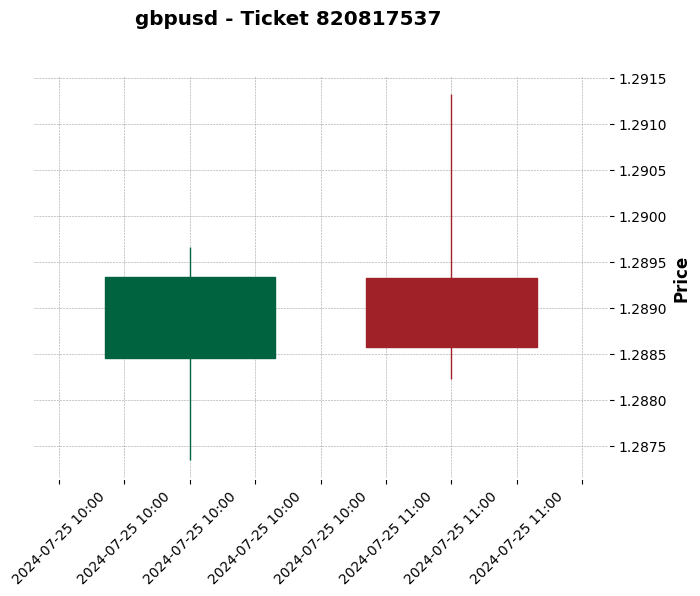

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

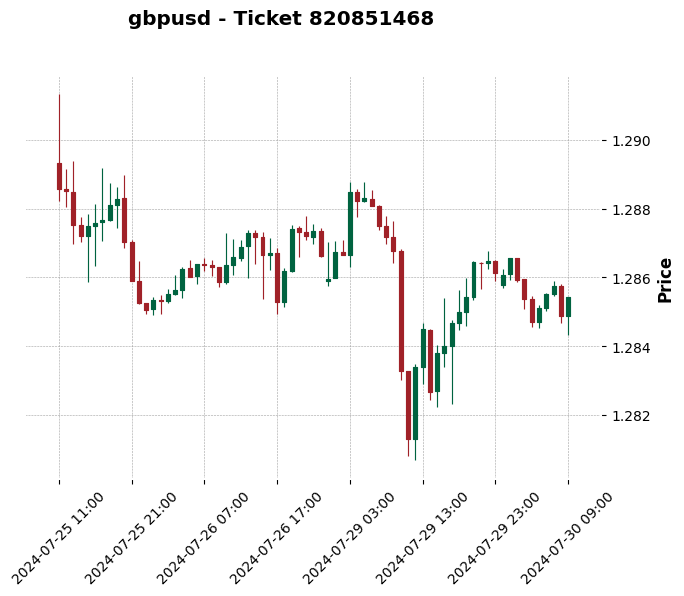

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

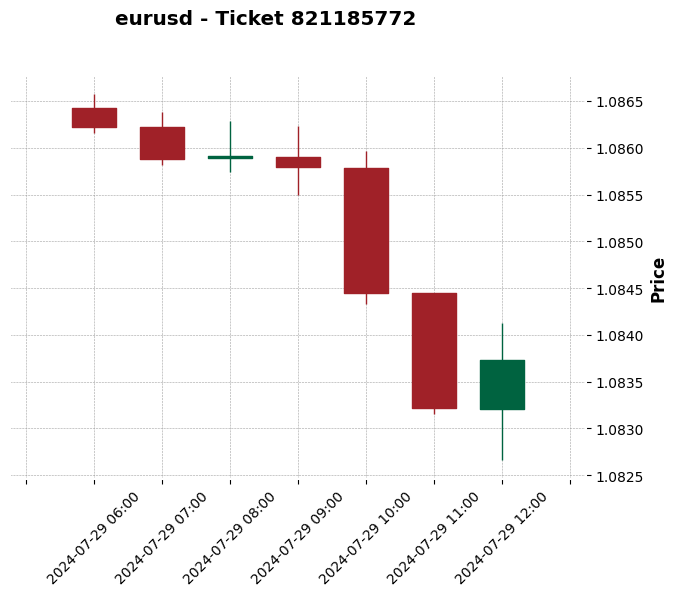

<Figure size 1200x600 with 0 Axes>

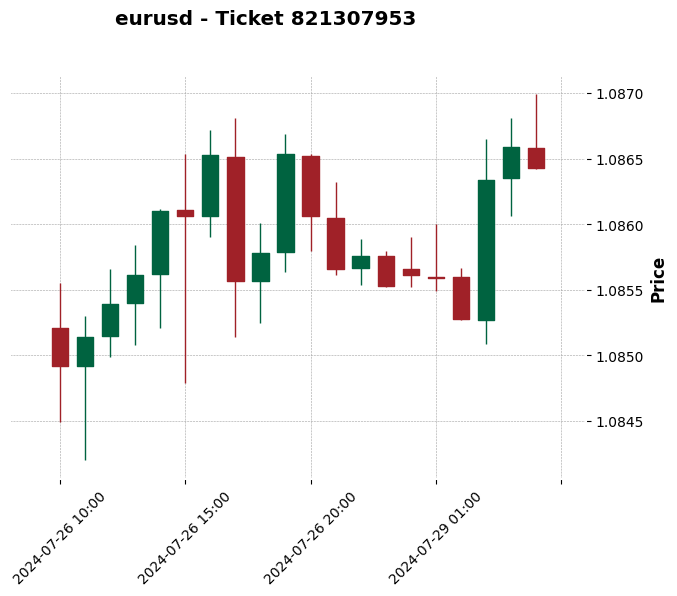

<Figure size 1200x600 with 0 Axes>

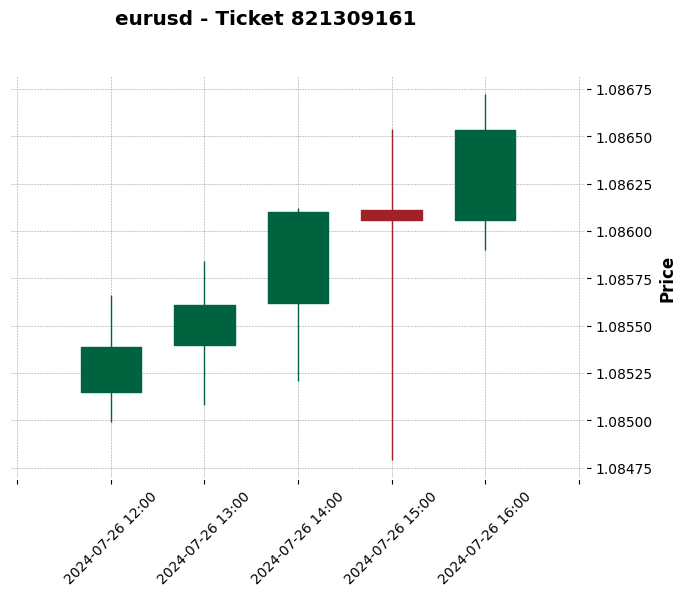

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

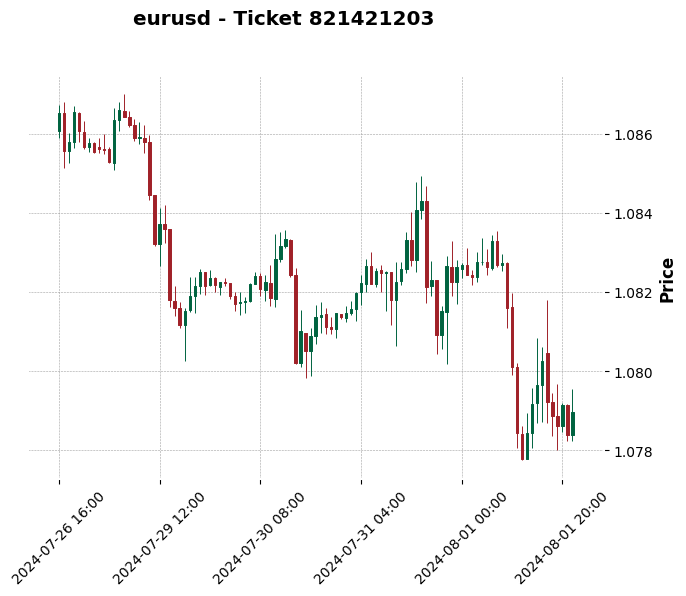

Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

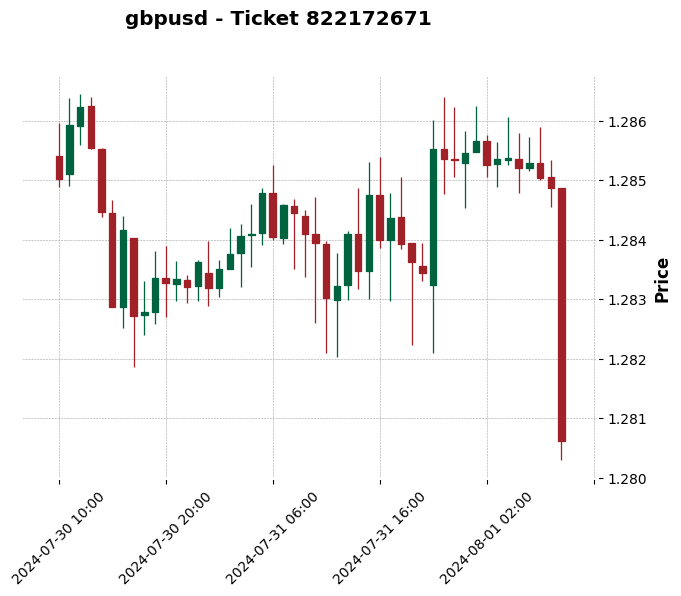

Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

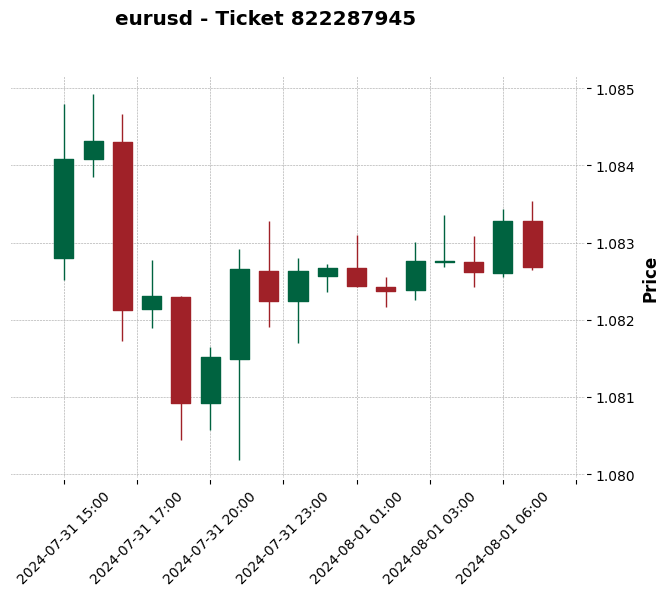

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

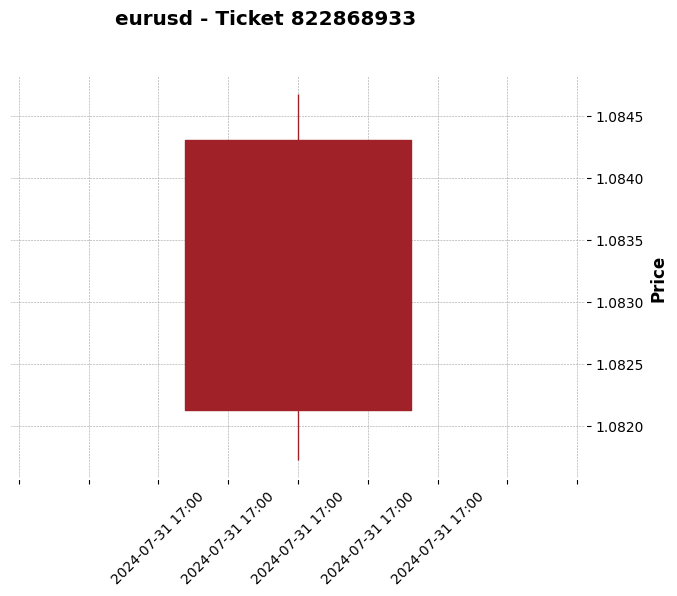

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

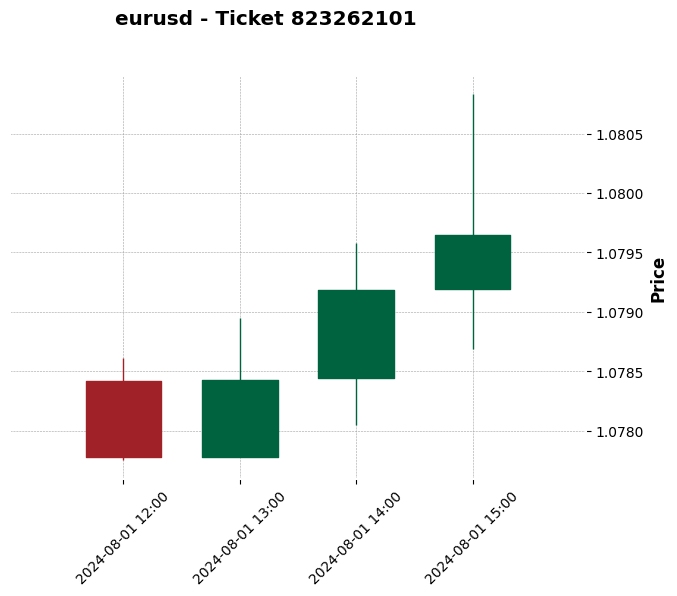

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

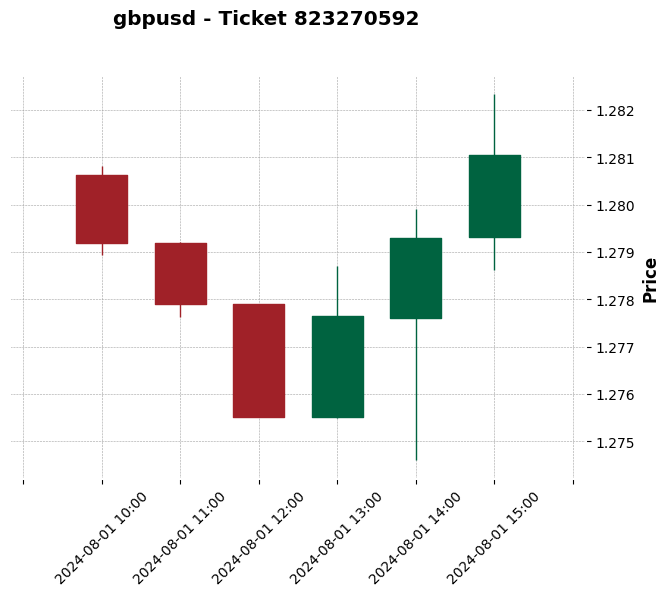

<Figure size 1200x600 with 0 Axes>

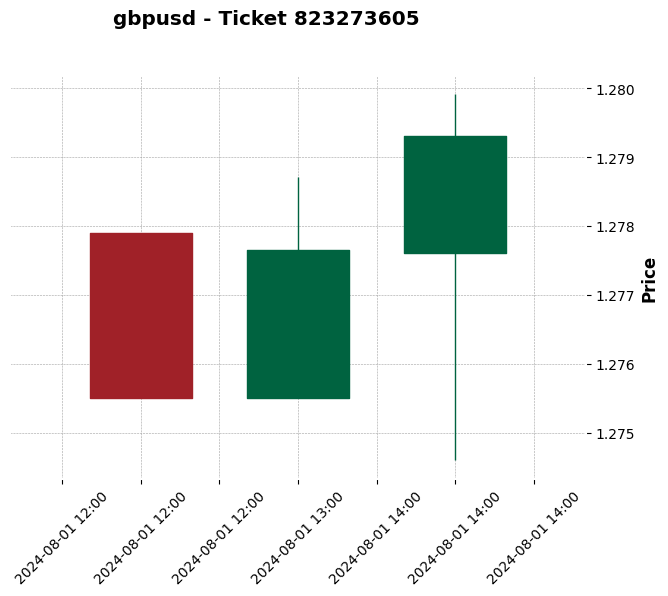

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

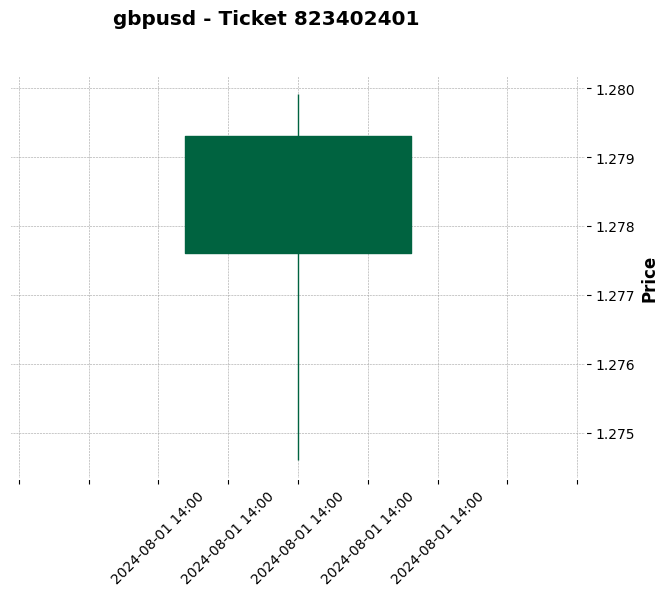

<Figure size 1200x600 with 0 Axes>

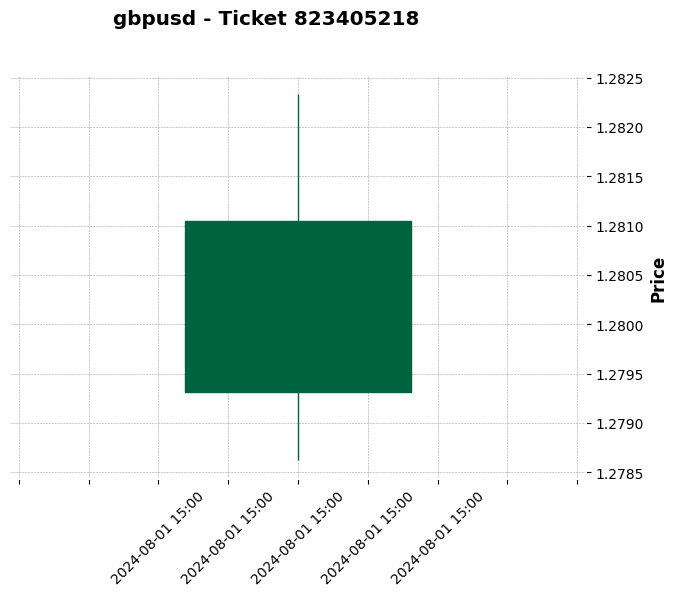

<Figure size 1200x600 with 0 Axes>

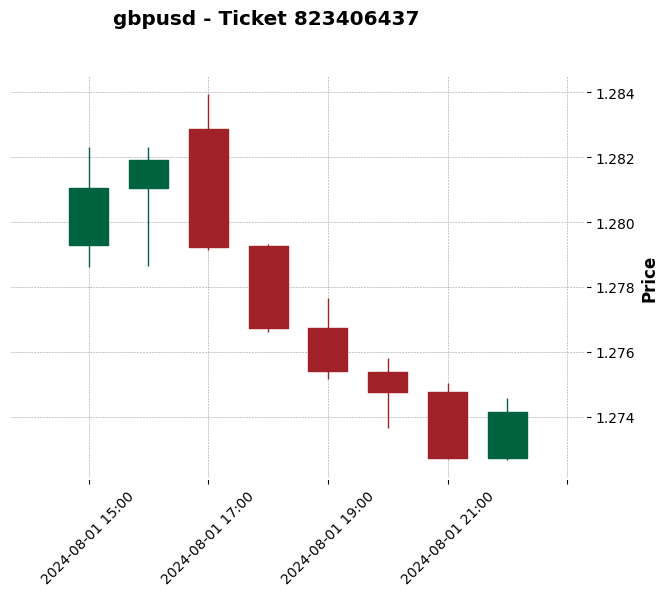

<Figure size 1200x600 with 0 Axes>

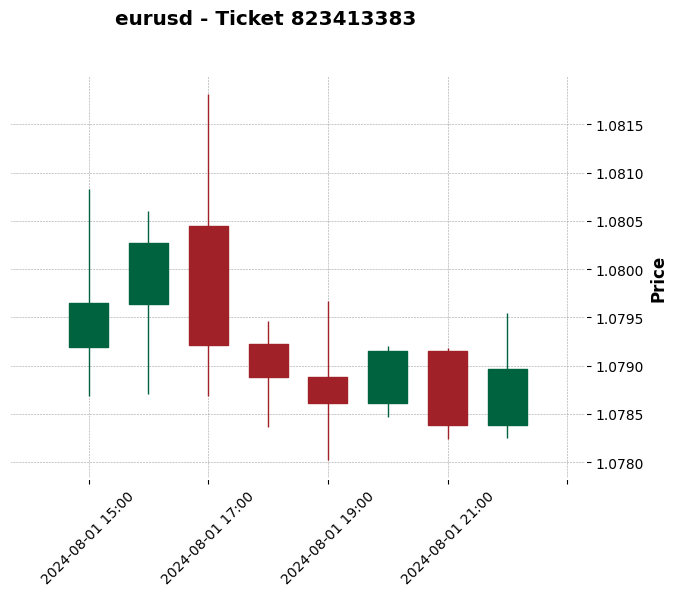

<Figure size 1200x600 with 0 Axes>

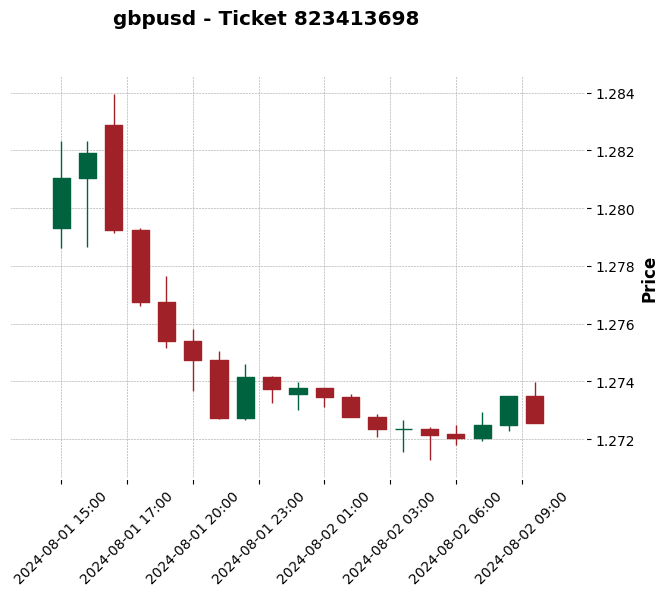

<Figure size 1200x600 with 0 Axes>

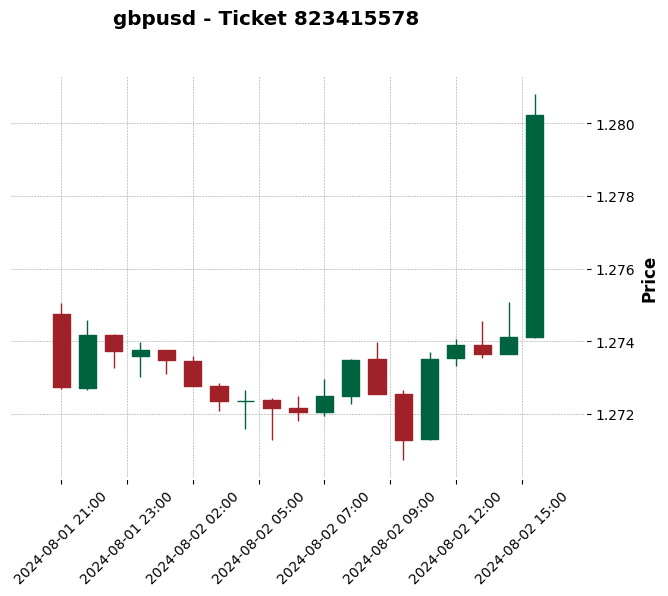

<Figure size 1200x600 with 0 Axes>

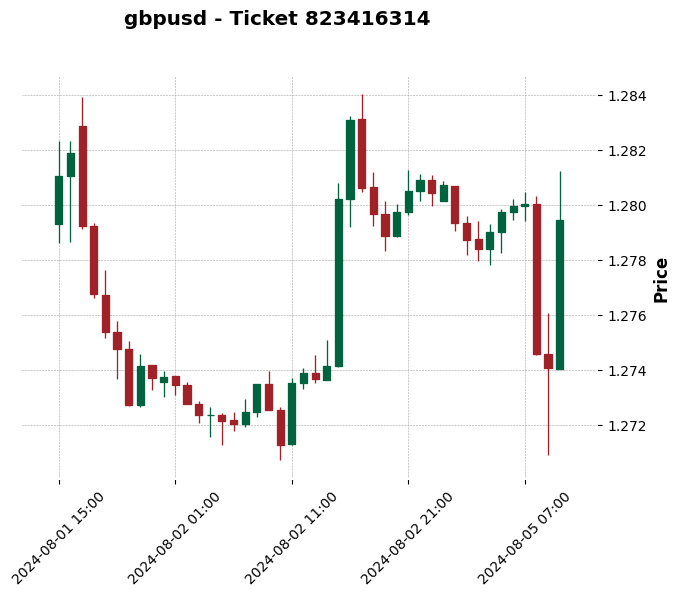

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

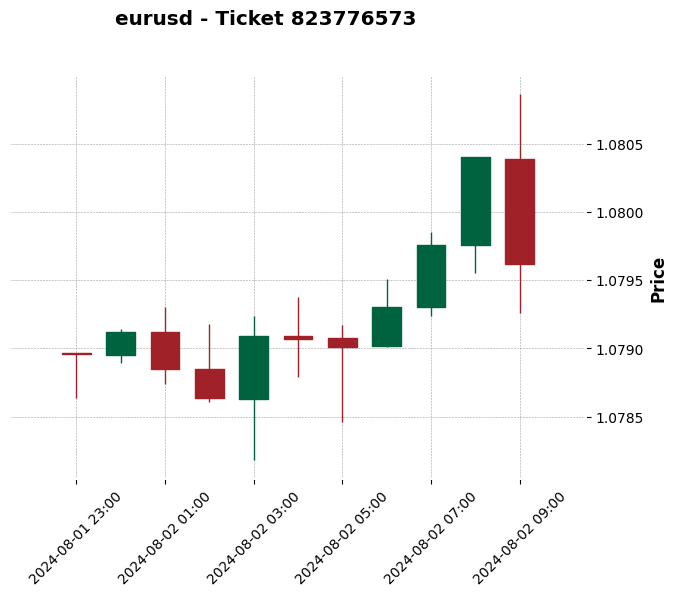

Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

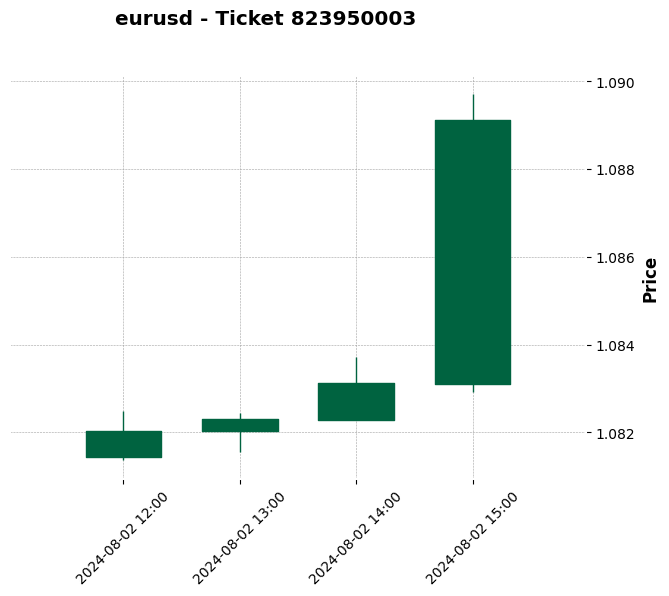

Нет данных котировок для сделки 823950168 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

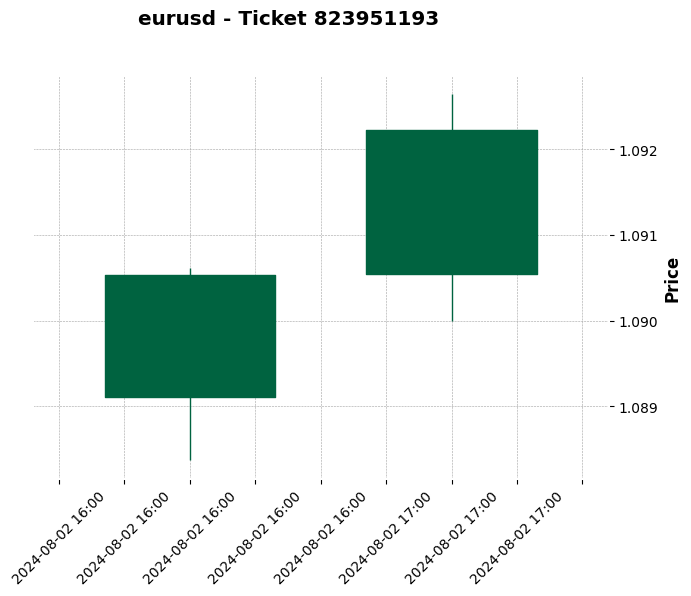

<Figure size 1200x600 with 0 Axes>

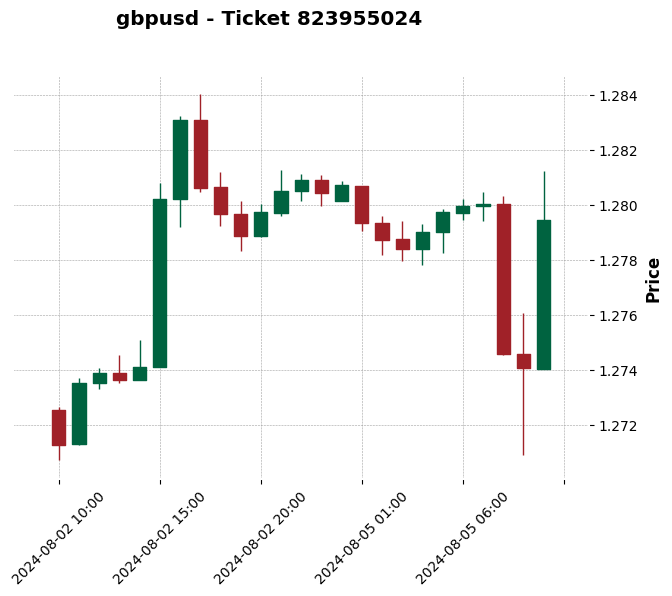

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

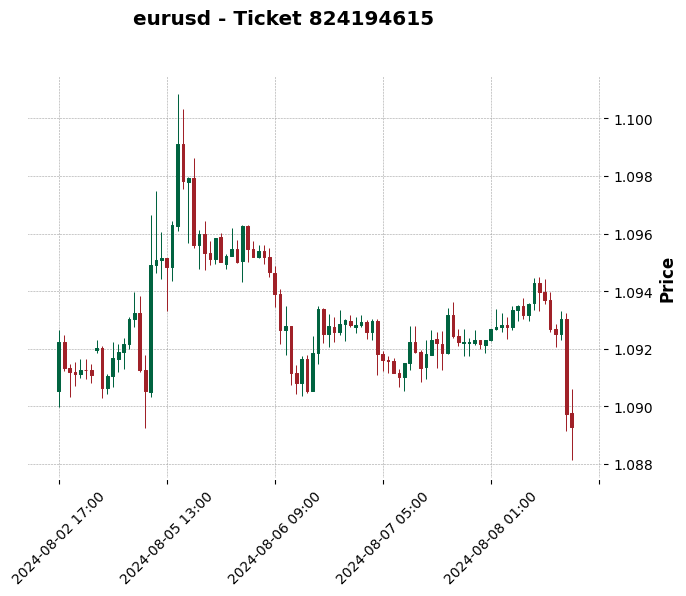

<Figure size 1200x600 with 0 Axes>

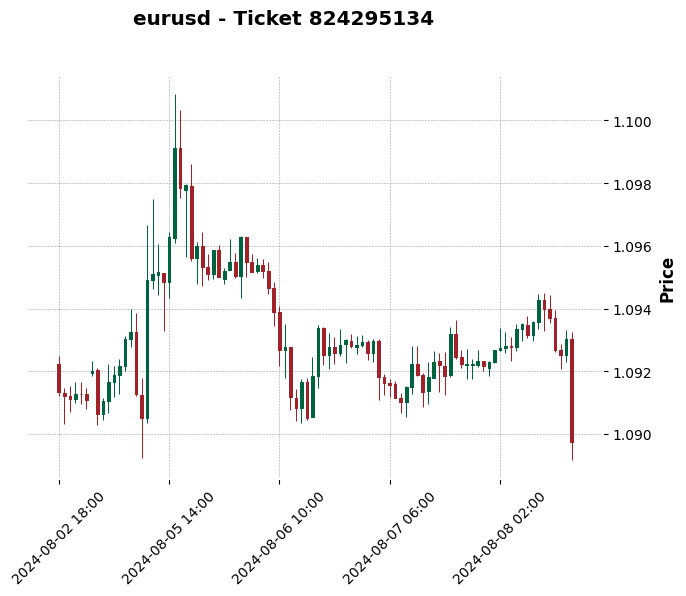

<Figure size 1200x600 with 0 Axes>

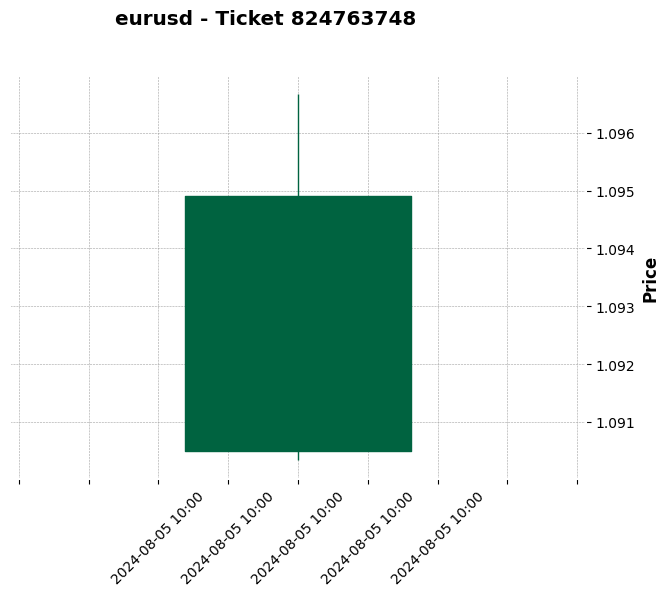

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

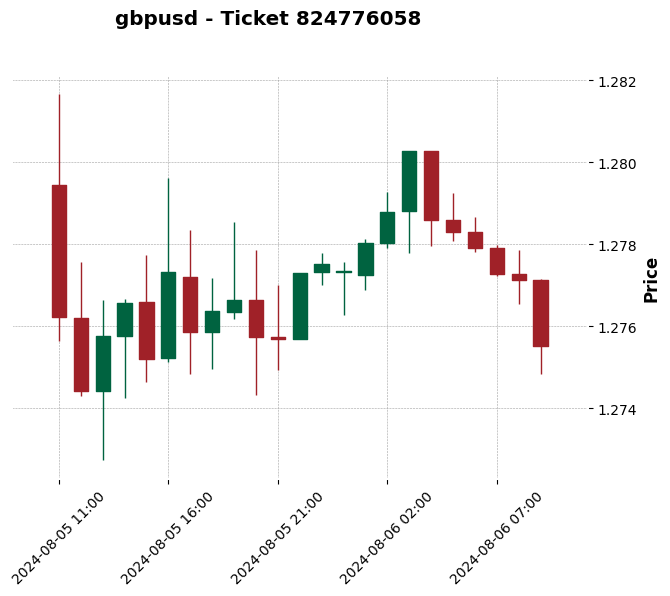

<Figure size 1200x600 with 0 Axes>

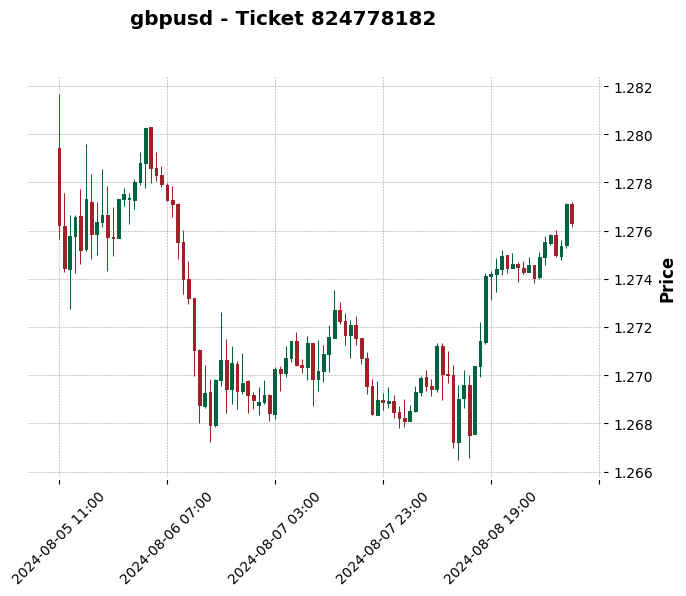

<Figure size 1200x600 with 0 Axes>

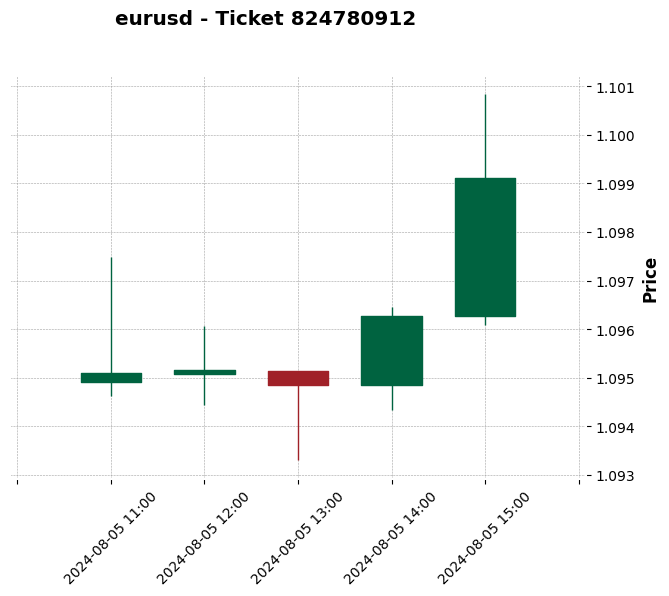

<Figure size 1200x600 with 0 Axes>

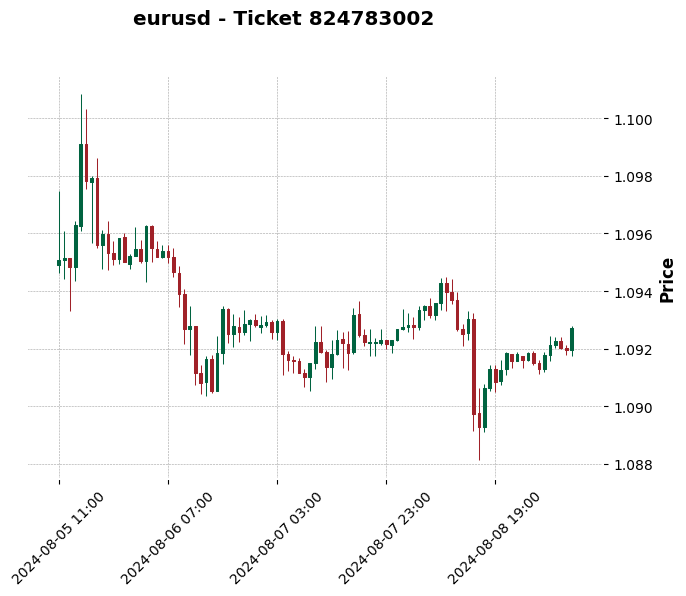

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

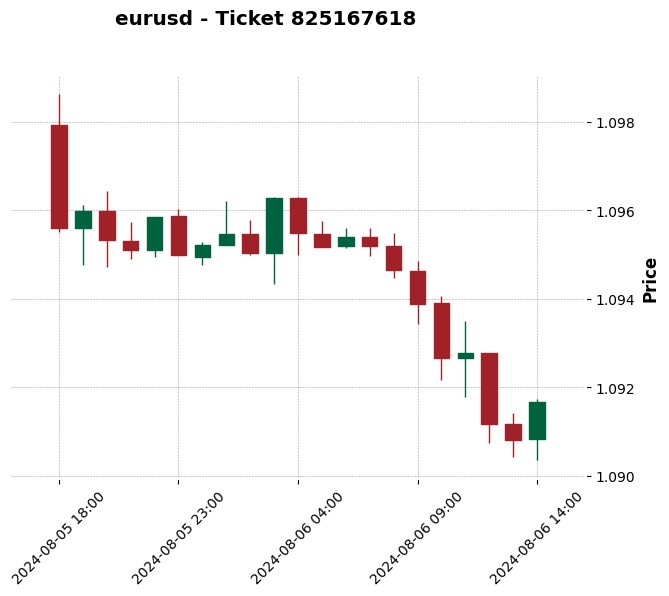

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

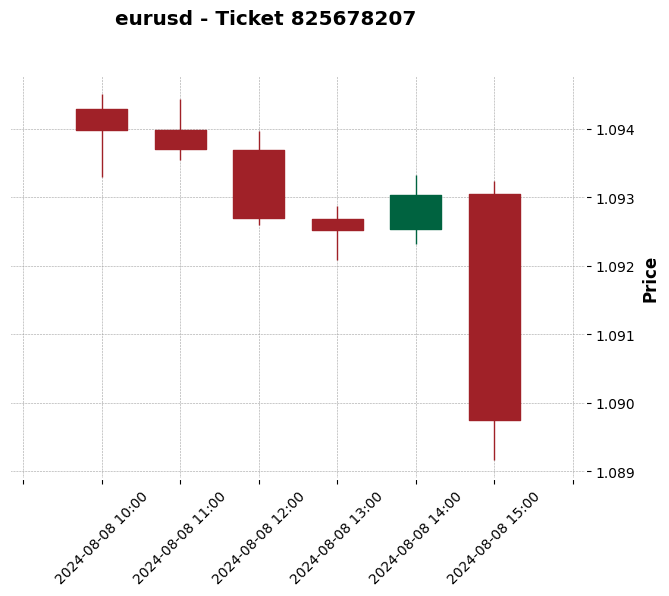

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

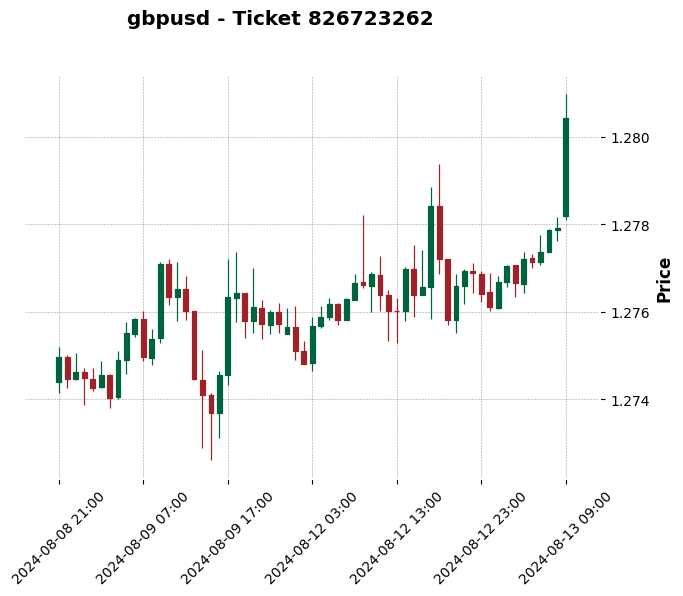

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

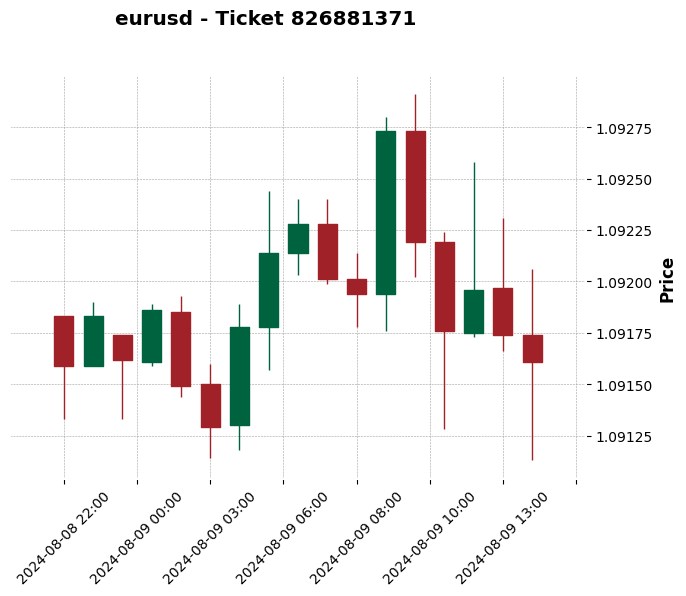

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

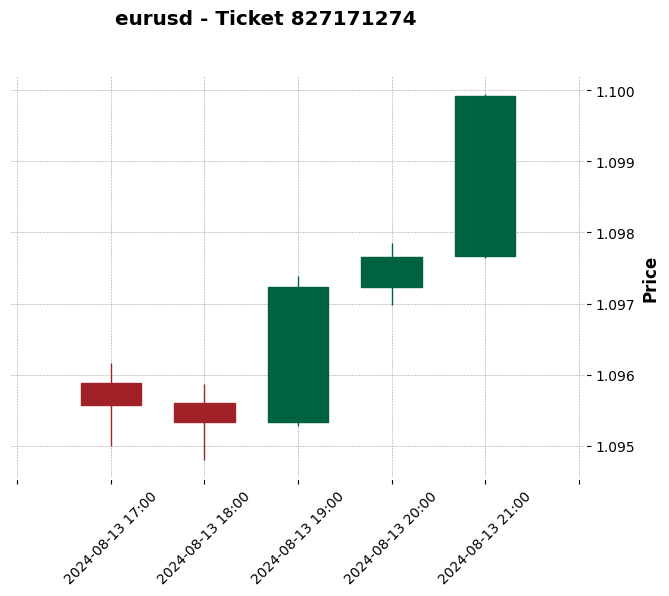

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

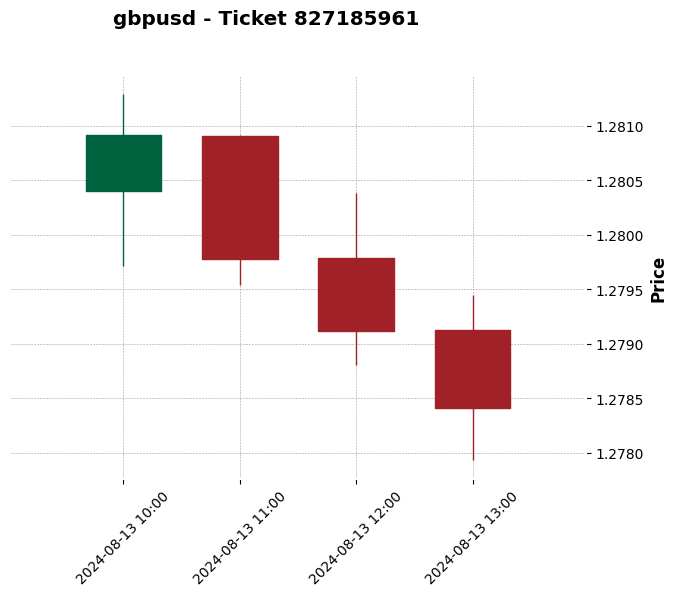

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

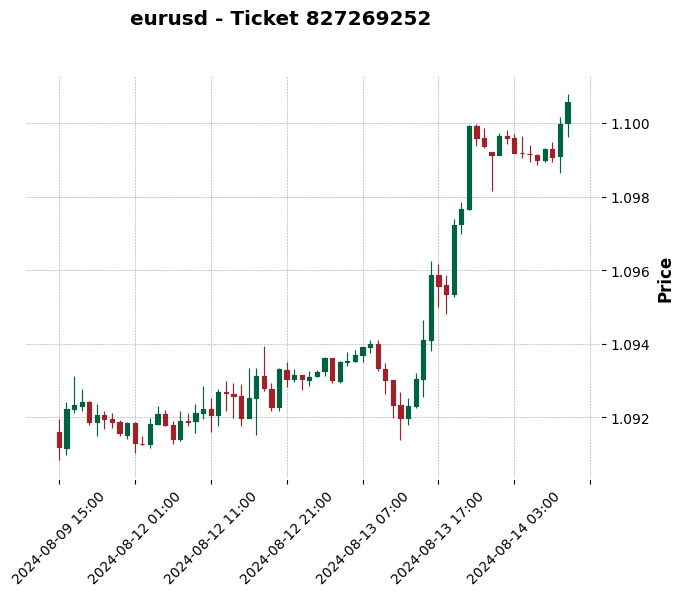

Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

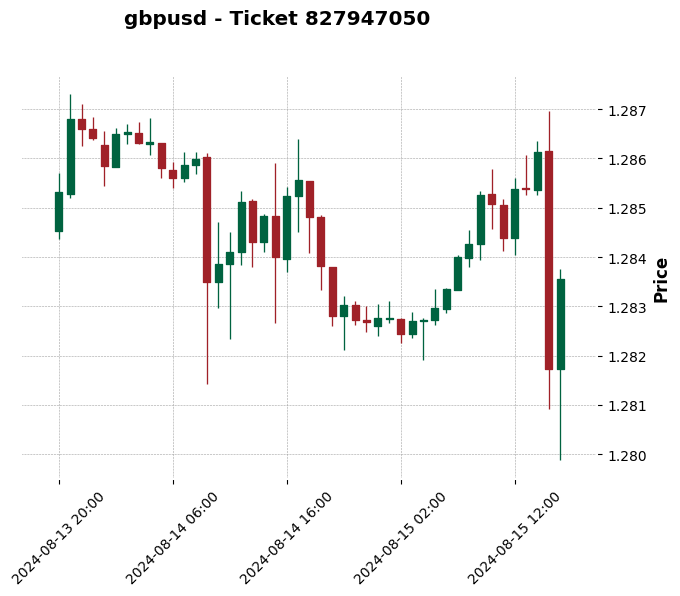

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.


<Figure size 1200x600 with 0 Axes>

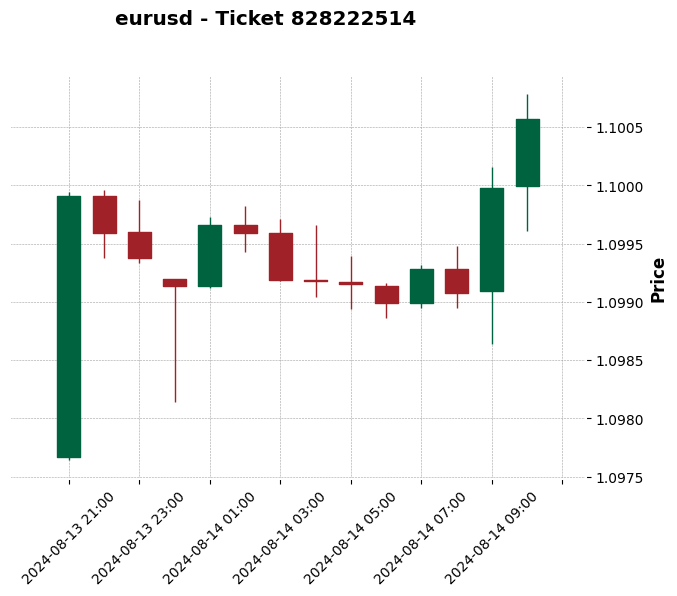

<Figure size 1200x600 with 0 Axes>

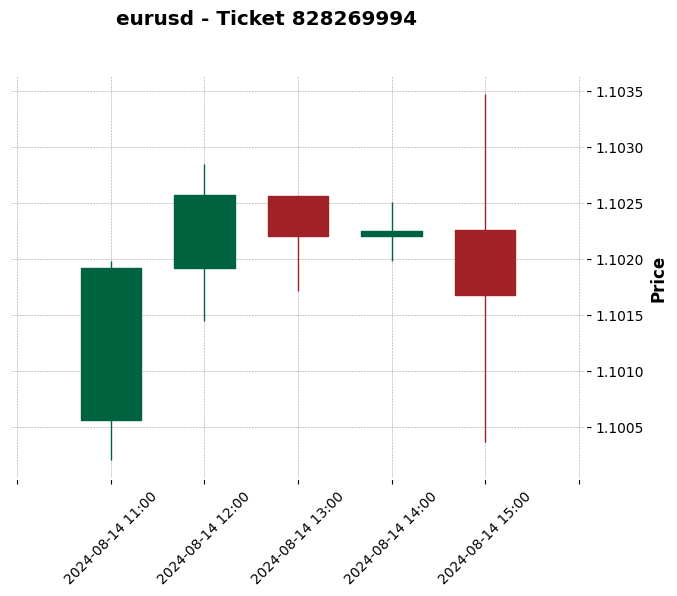

<Figure size 1200x600 with 0 Axes>

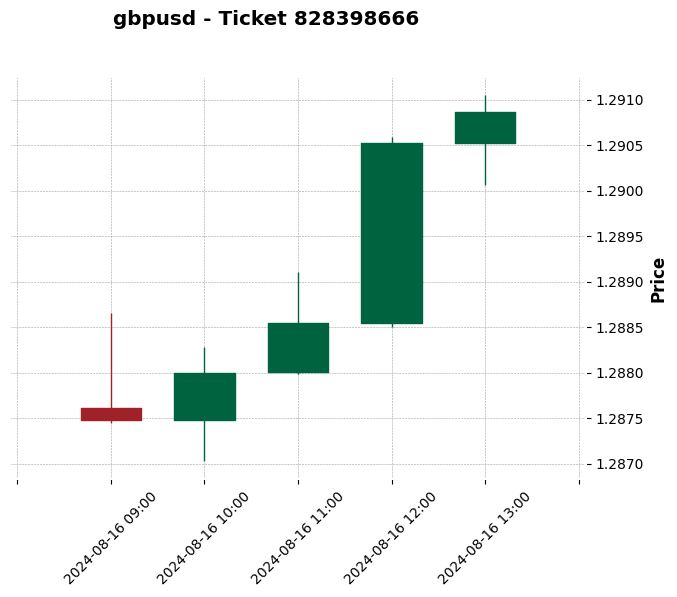

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

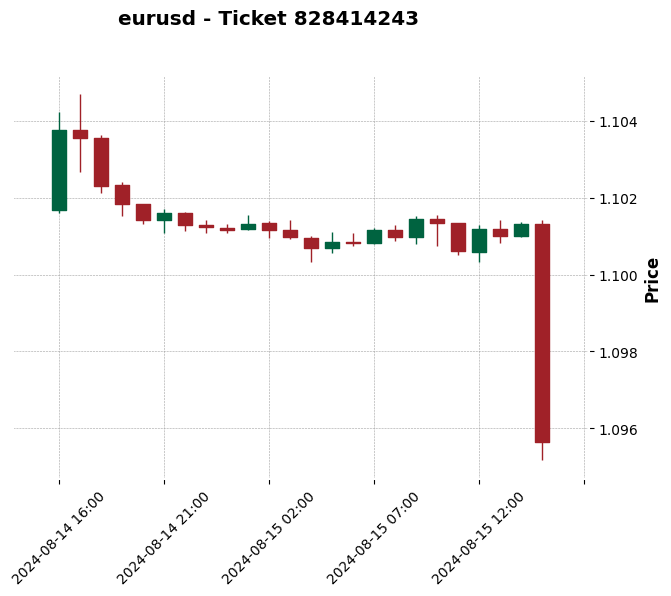

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Нет данных котировок для сделки 828944569 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

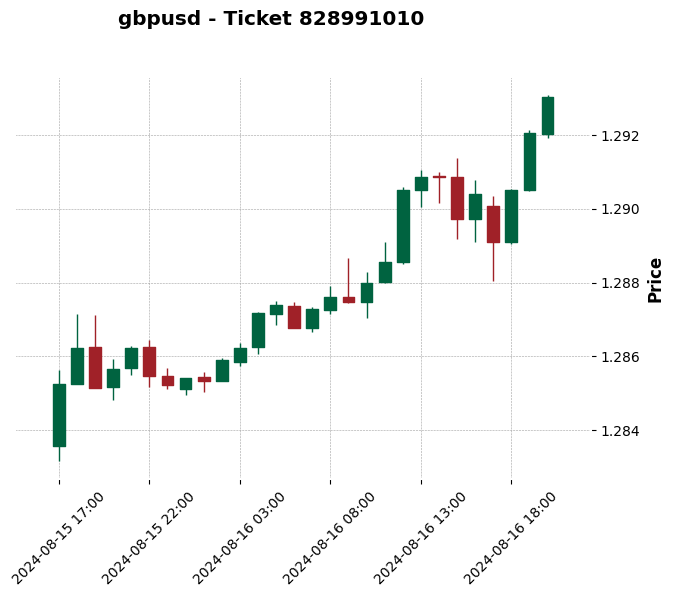

<Figure size 1200x600 with 0 Axes>

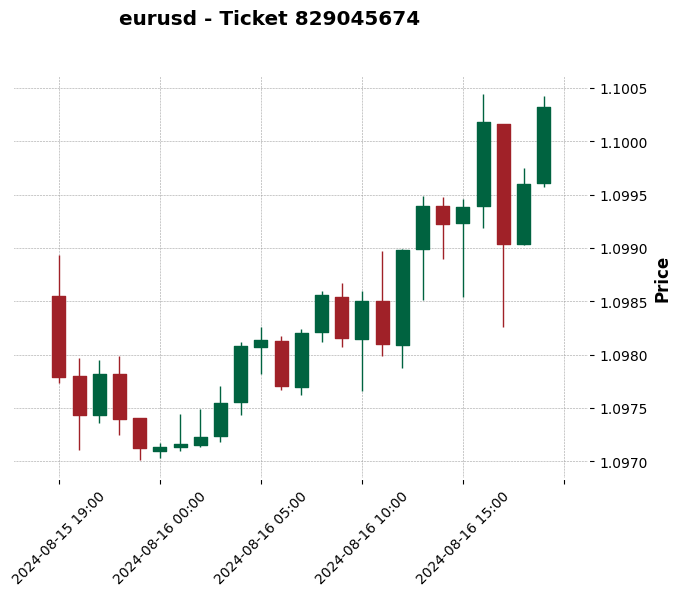

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Нет данных котировок для сделки 829254836 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

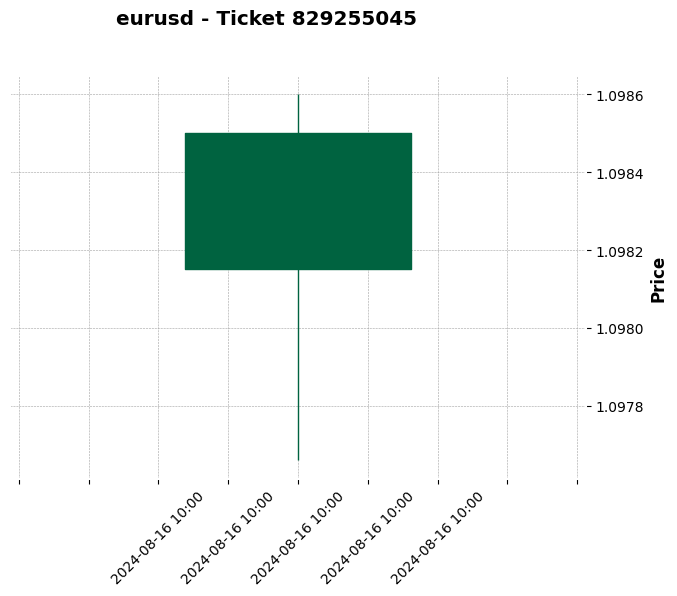

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Нет данных котировок для сделки 829559910 в заданном интервале.
Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price', datetime_format='%Y-%m-%d %H:%M')

            # Добавление меток на график
            ax = plt.gca()
            ax.annotate('Open', xy=(row['Open Time'], row['Price']), xytext=(row['Open Time'], row['Price'] + 0.001),
                        arrowprops=dict(facecolor='green', shrink=0.05), fontsize=12, color='green')
            ax.annotate('Close', xy=(row['Close Time'], row['Price.1']), xytext=(row['Close Time'], row['Price.1'] + 0.001),
                        arrowprops=dict(facecolor='red', shrink=0.05), fontsize=12, color='red')
            ax.text(row['Close Time'], row['Price.1'] + 0.002, f'Profit: {row["Profit"]}', fontsize=12, color='blue')

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<Figure size 1200x600 with 0 Axes>

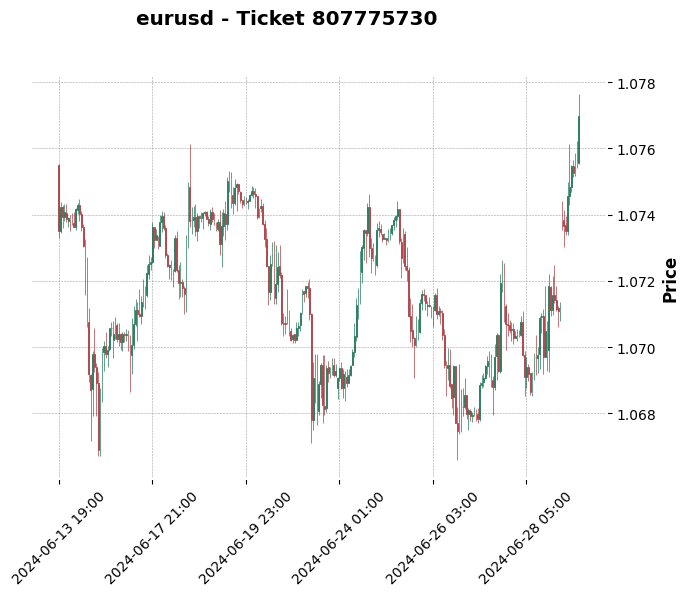

<Figure size 1200x600 with 0 Axes>

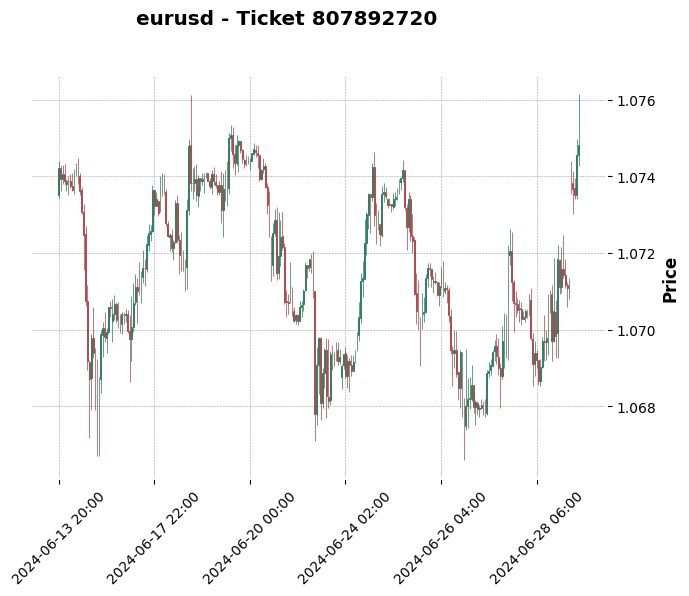

<Figure size 1200x600 with 0 Axes>

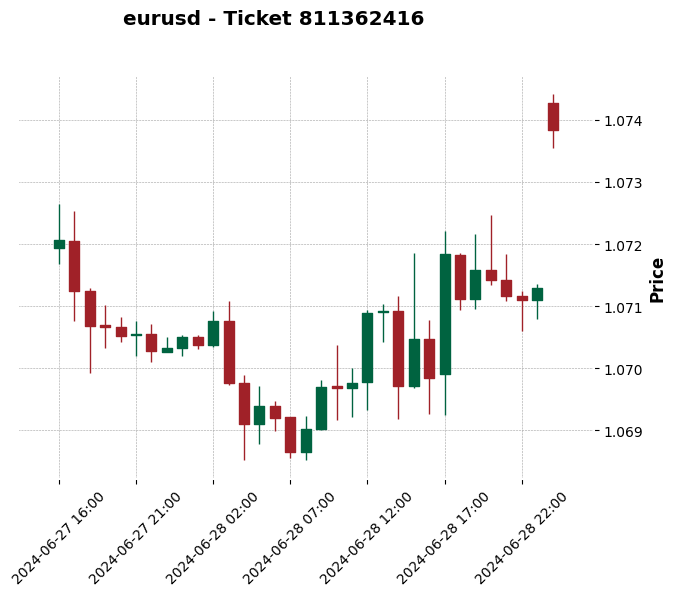

<Figure size 1200x600 with 0 Axes>

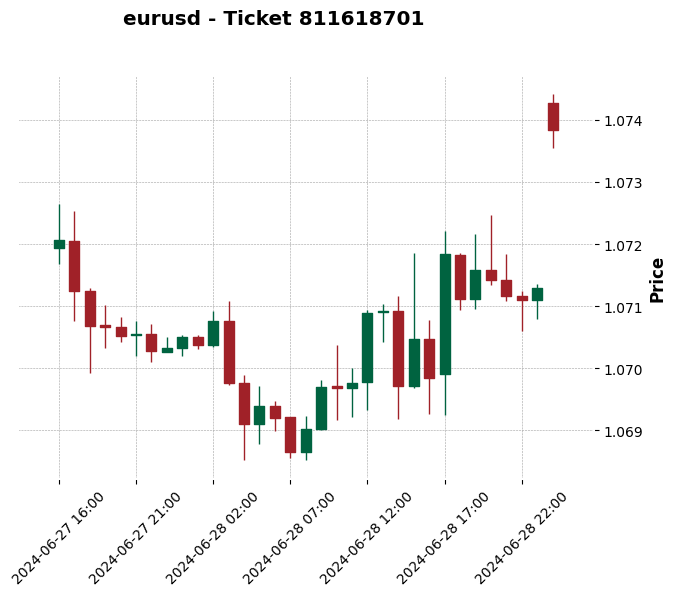

<Figure size 1200x600 with 0 Axes>

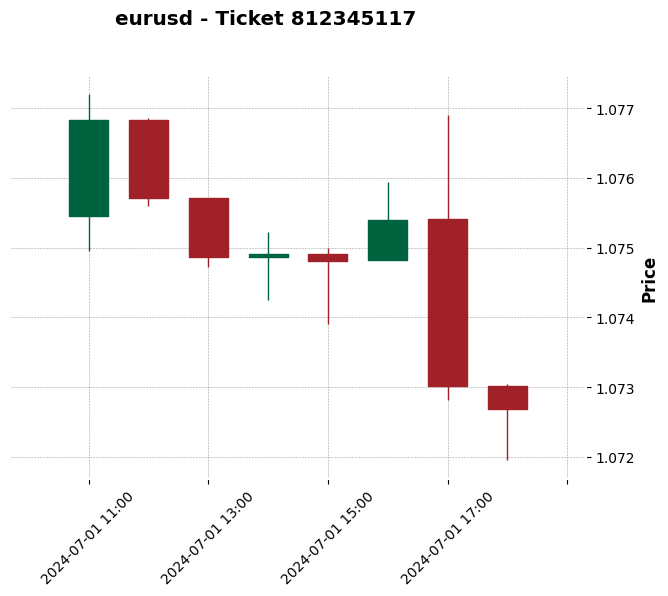

<Figure size 1200x600 with 0 Axes>

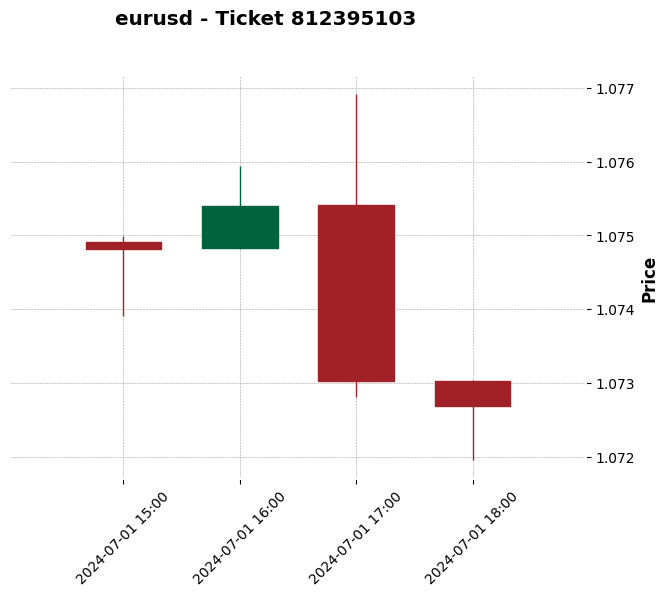

Нет данных котировок для сделки 812707226 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

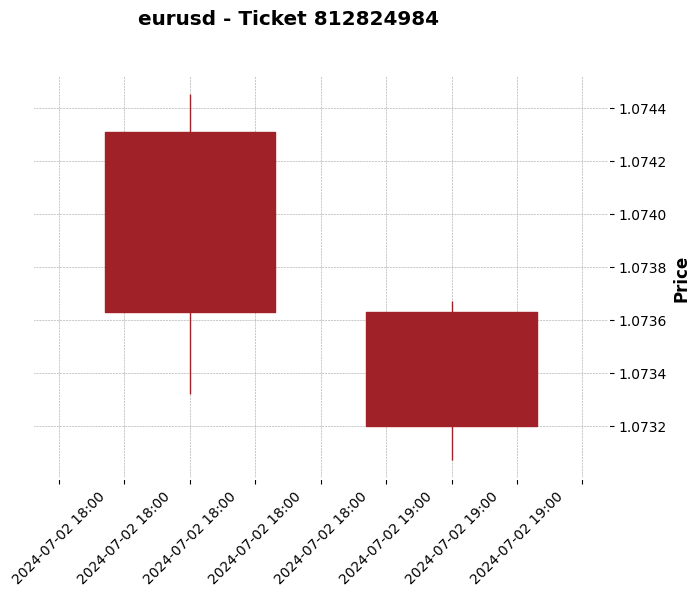

<Figure size 1200x600 with 0 Axes>

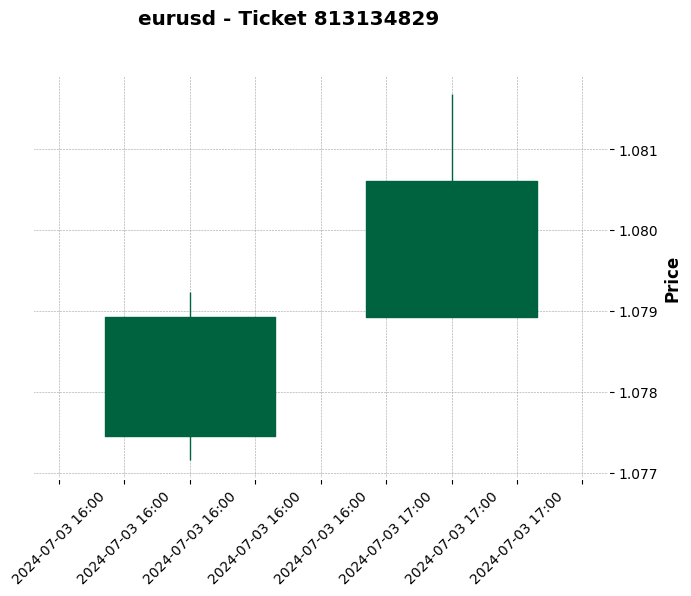

<Figure size 1200x600 with 0 Axes>

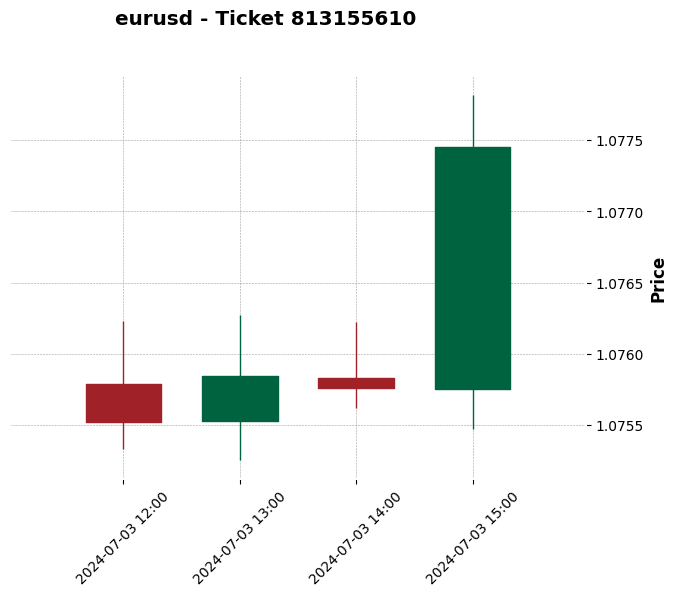

<Figure size 1200x600 with 0 Axes>

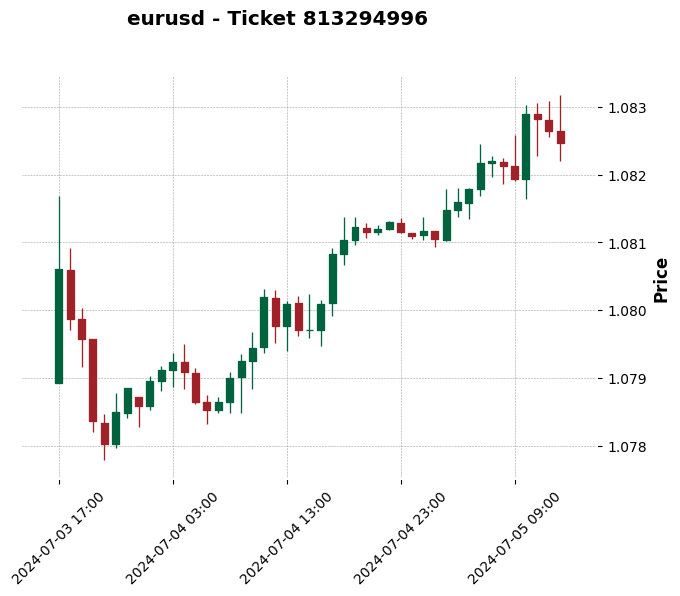

<Figure size 1200x600 with 0 Axes>

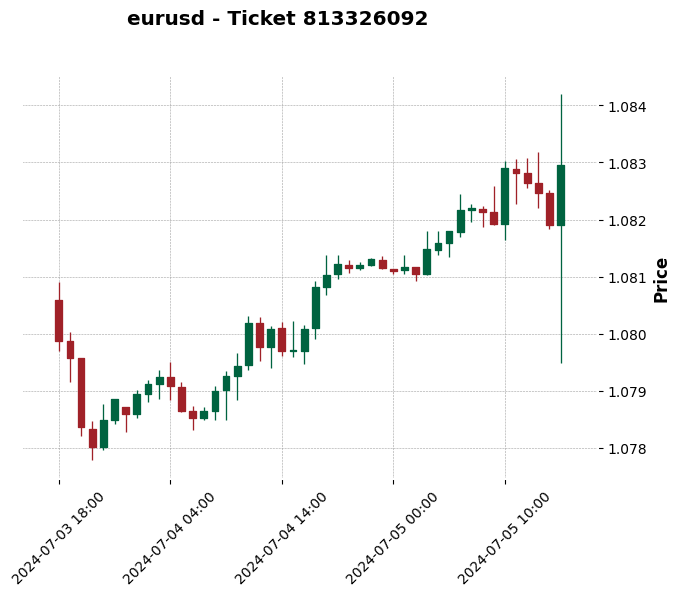

<Figure size 1200x600 with 0 Axes>

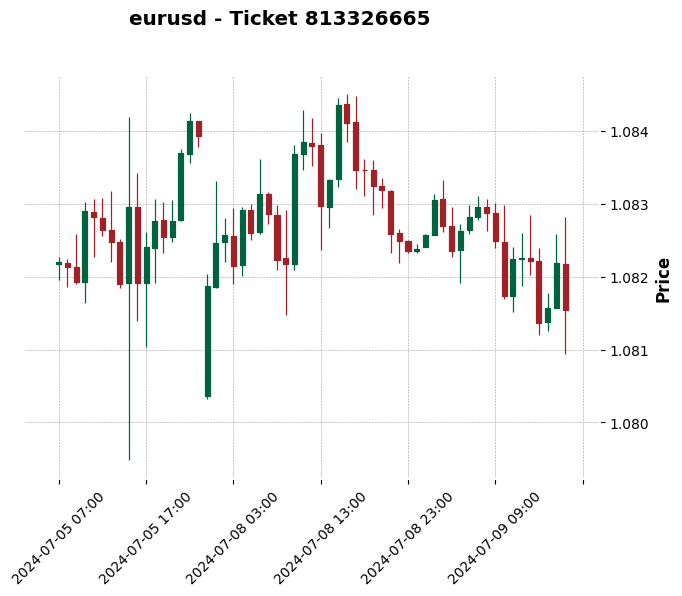

<Figure size 1200x600 with 0 Axes>

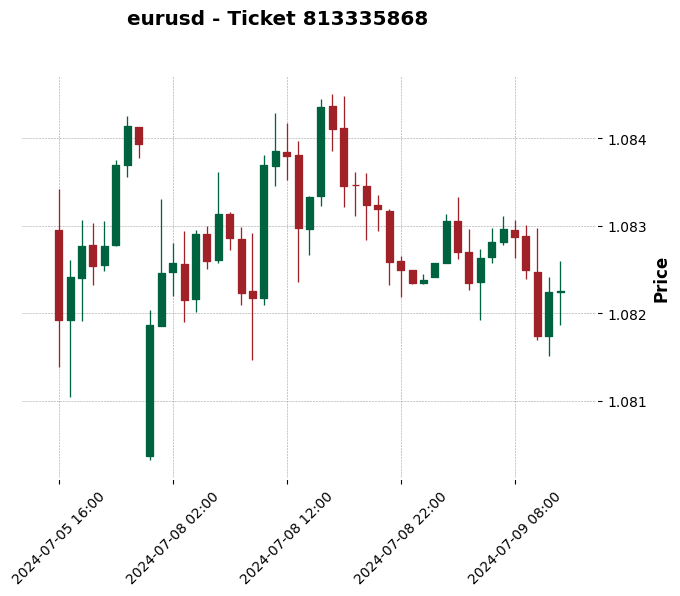

<Figure size 1200x600 with 0 Axes>

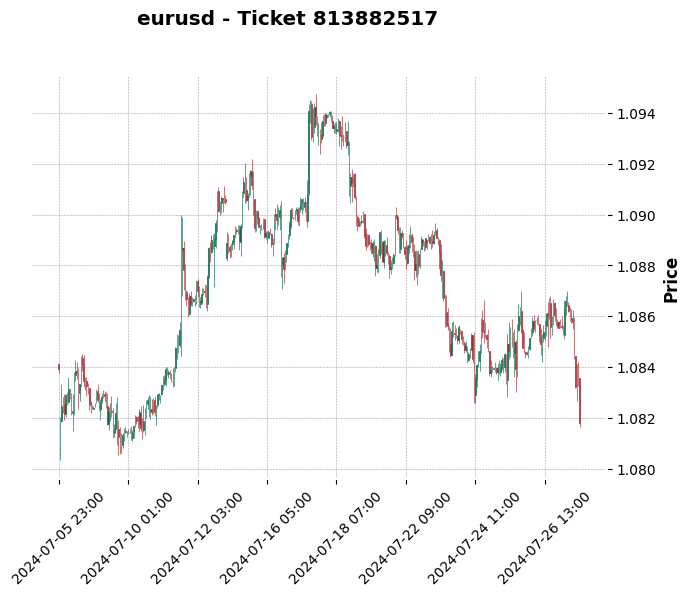

<Figure size 1200x600 with 0 Axes>

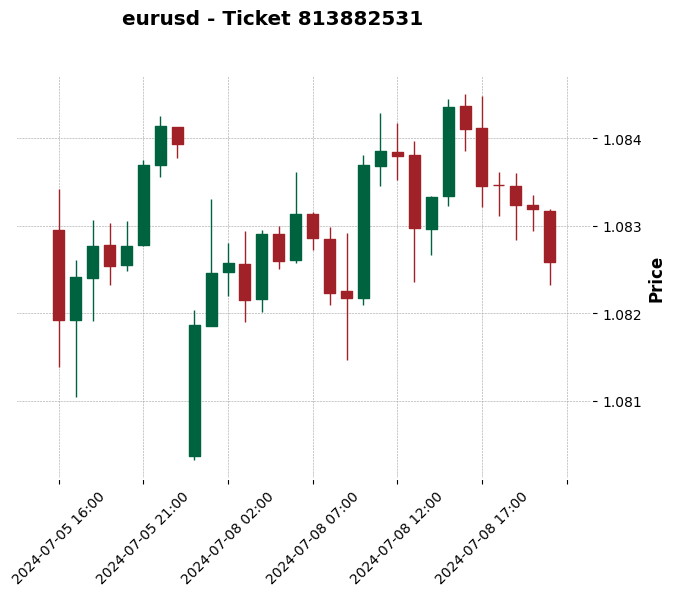

<Figure size 1200x600 with 0 Axes>

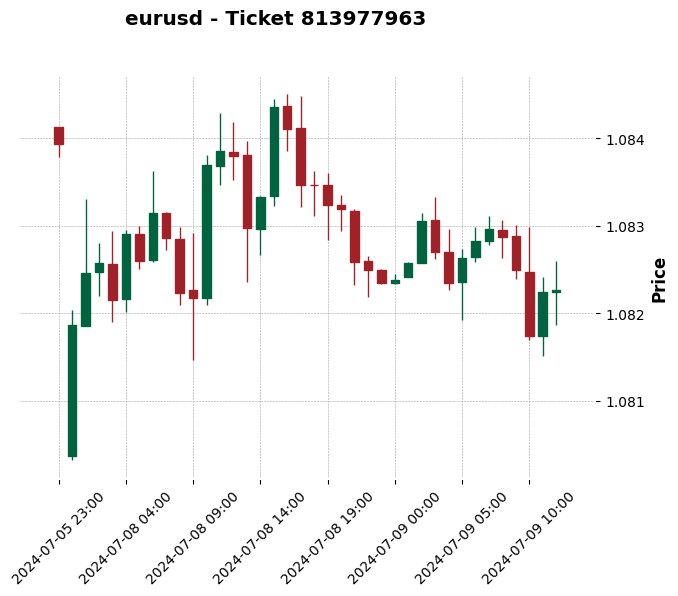

<Figure size 1200x600 with 0 Axes>

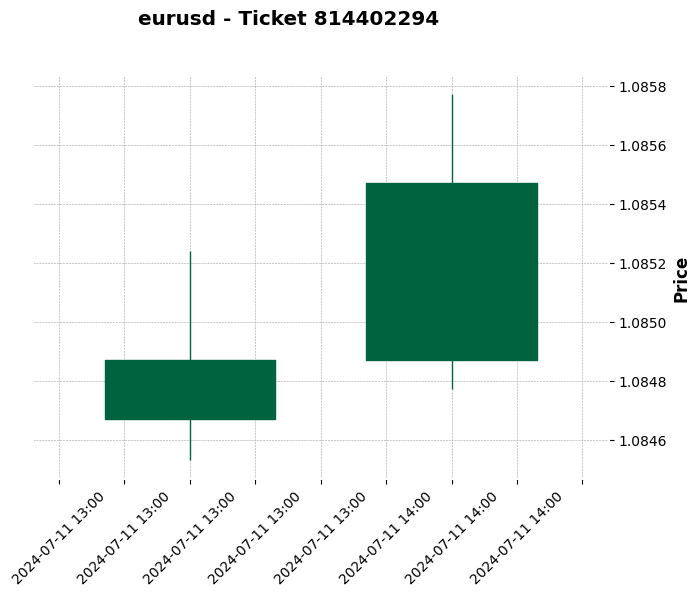

<Figure size 1200x600 with 0 Axes>

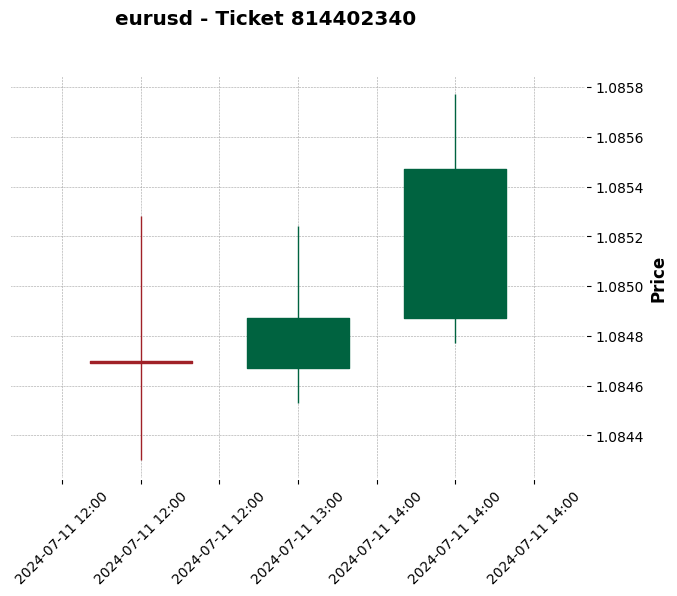

<Figure size 1200x600 with 0 Axes>

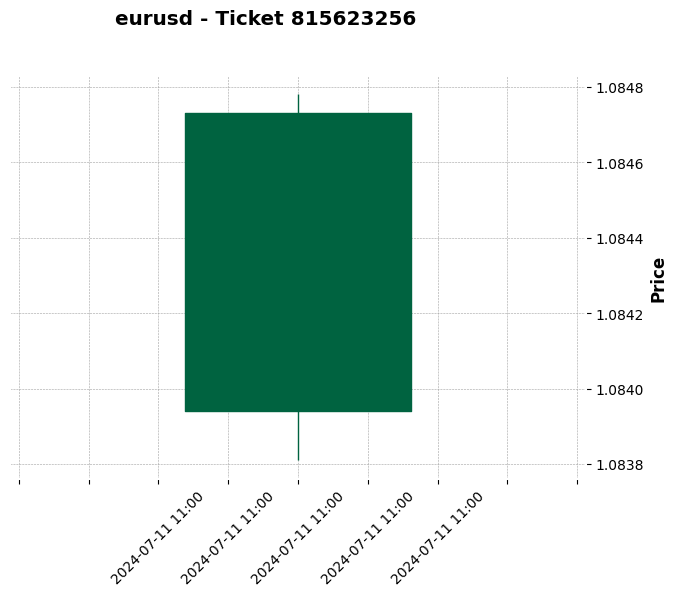

<Figure size 1200x600 with 0 Axes>

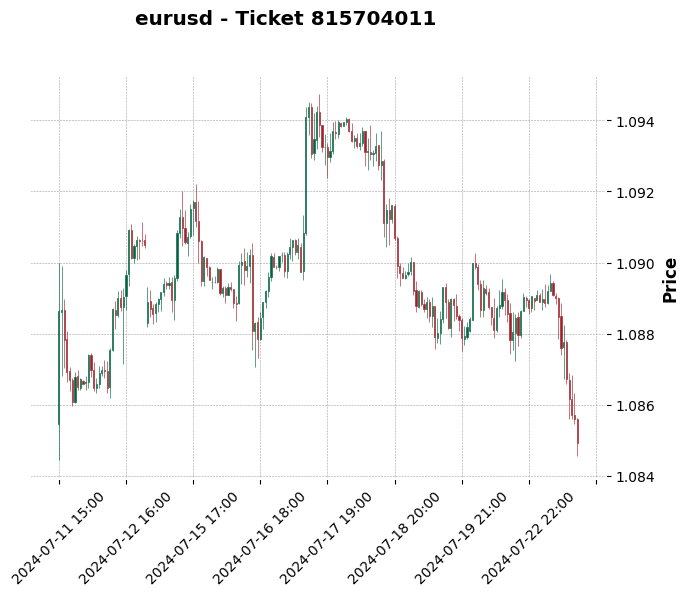

<Figure size 1200x600 with 0 Axes>

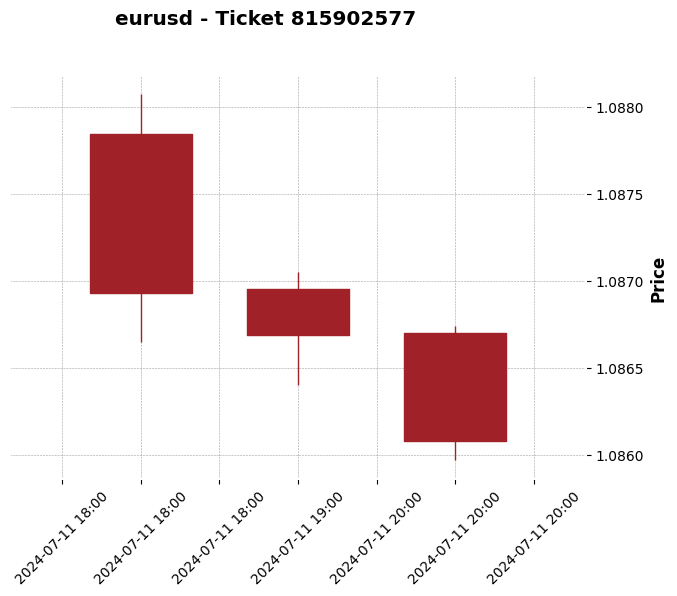

<Figure size 1200x600 with 0 Axes>

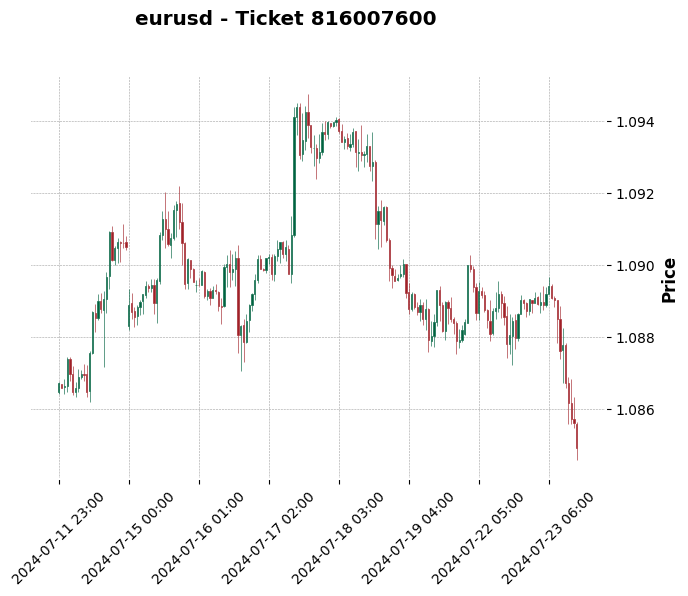

<Figure size 1200x600 with 0 Axes>

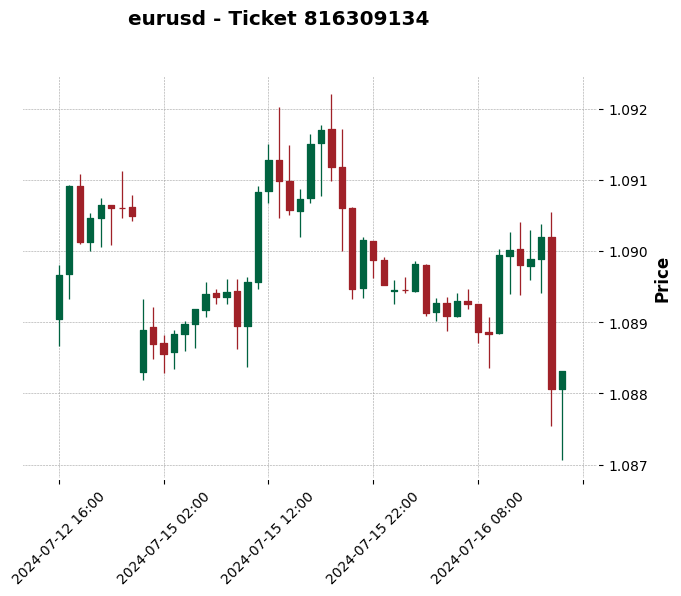

<Figure size 1200x600 with 0 Axes>

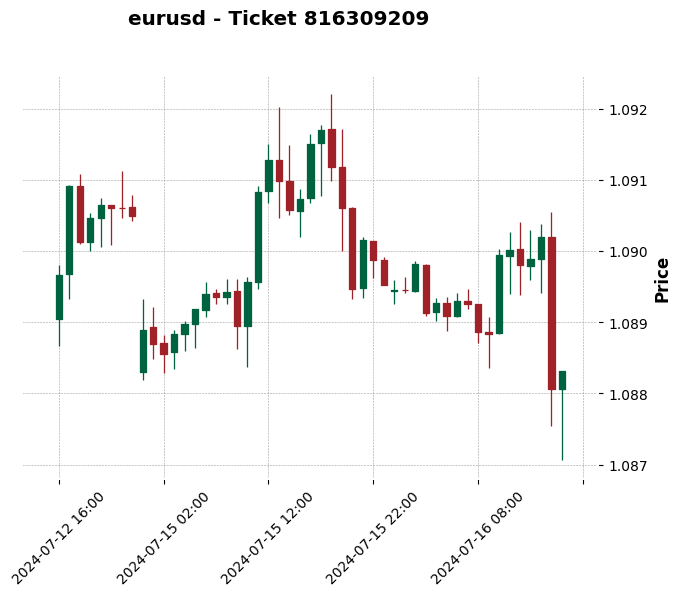

<Figure size 1200x600 with 0 Axes>

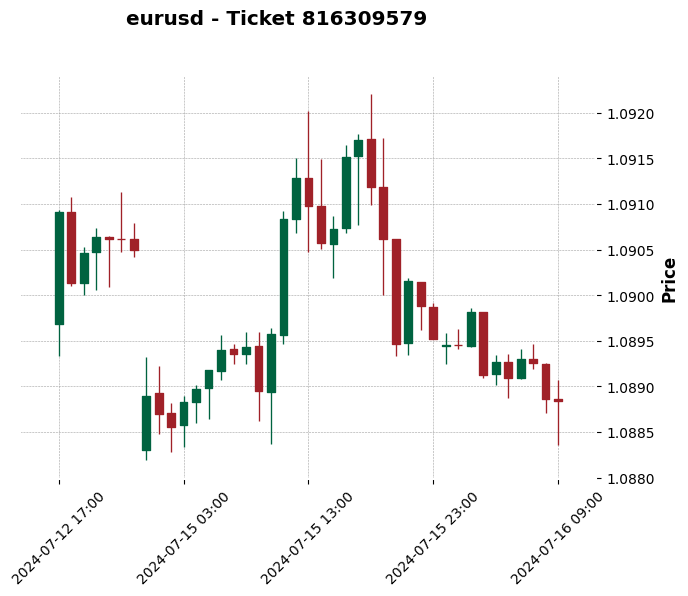

<Figure size 1200x600 with 0 Axes>

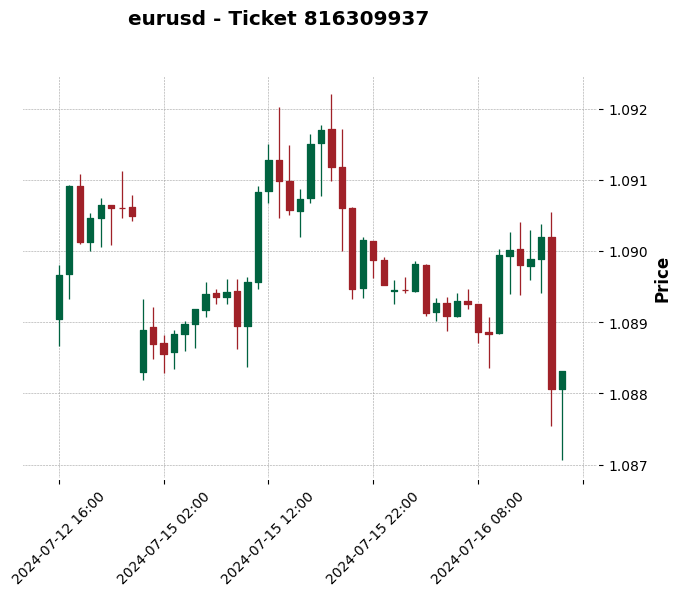

<Figure size 1200x600 with 0 Axes>

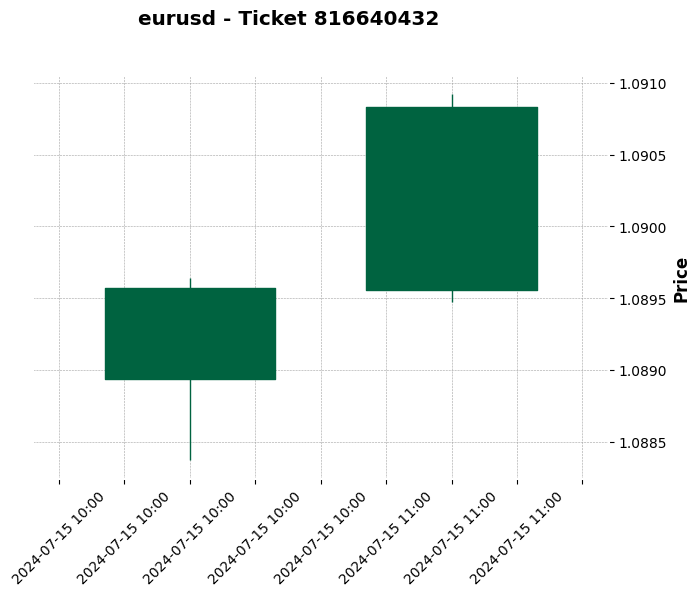

<Figure size 1200x600 with 0 Axes>

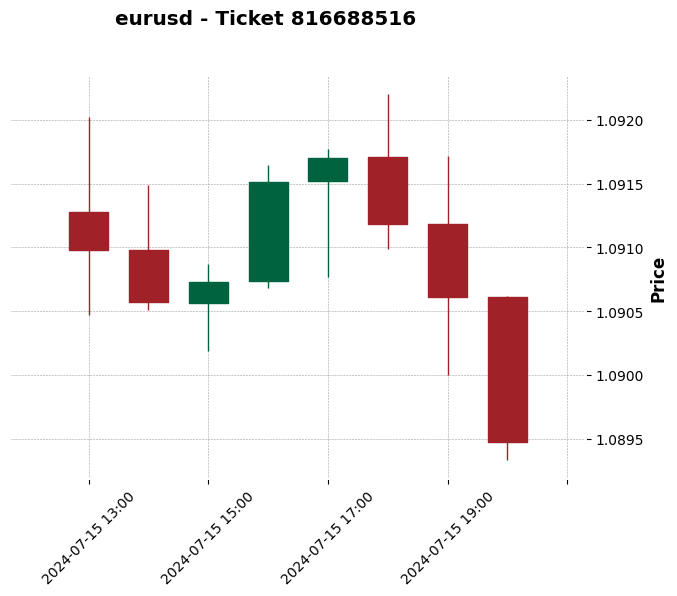

<Figure size 1200x600 with 0 Axes>

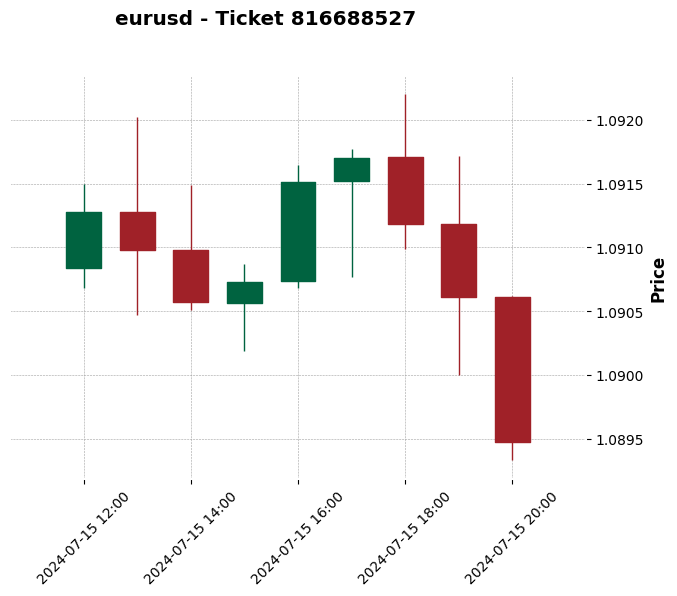

Нет данных котировок для сделки 817235256 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

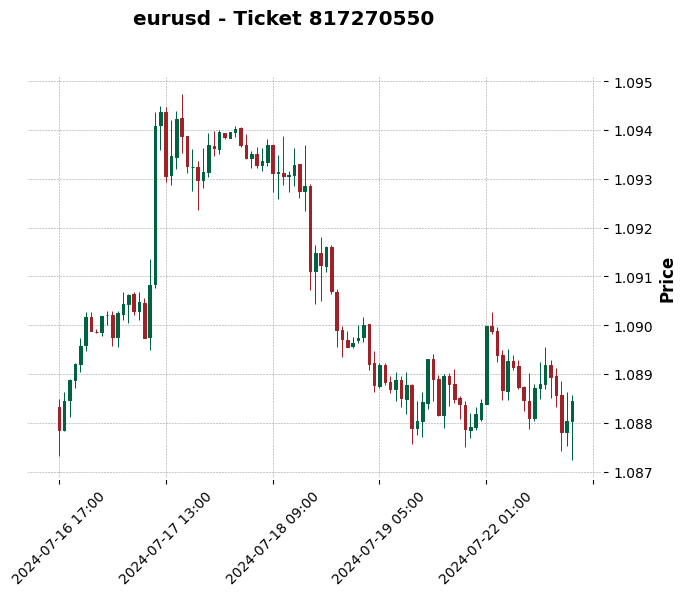

<Figure size 1200x600 with 0 Axes>

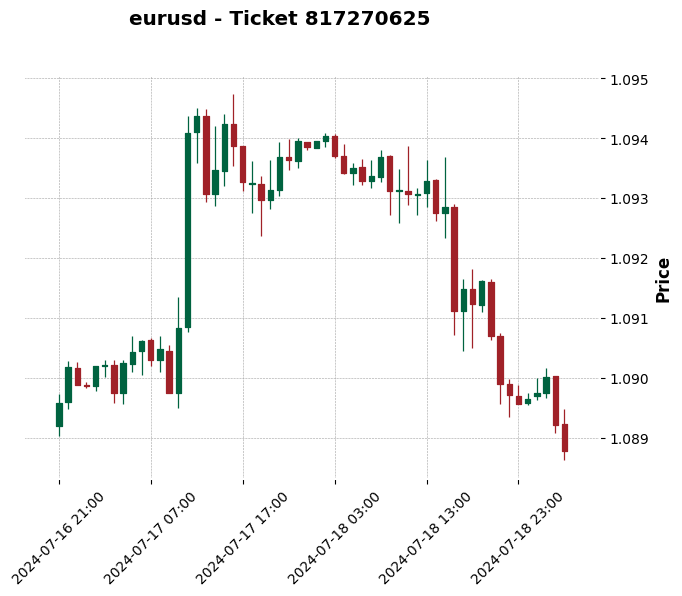

<Figure size 1200x600 with 0 Axes>

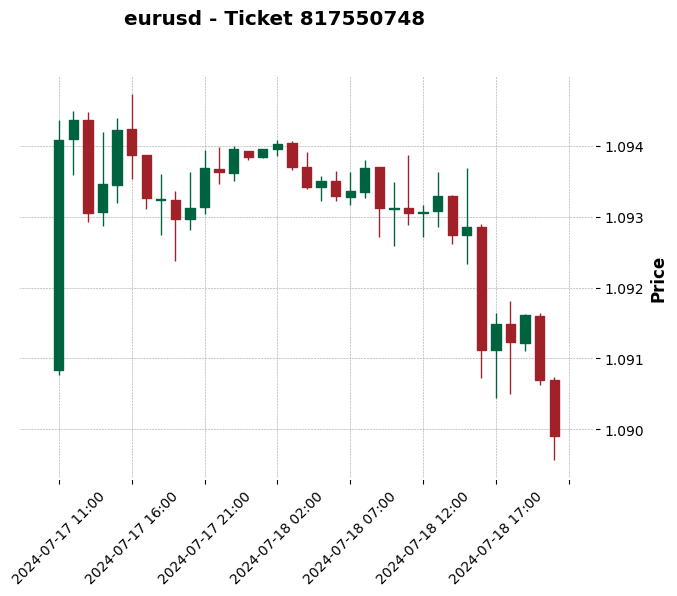

<Figure size 1200x600 with 0 Axes>

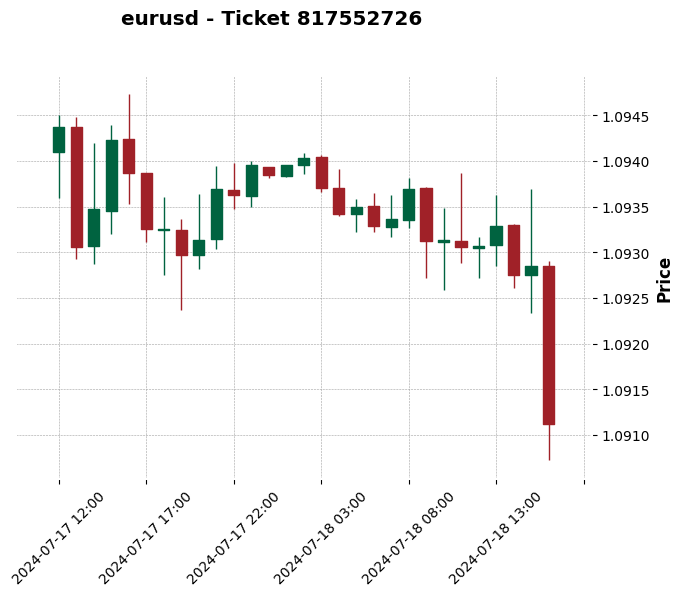

<Figure size 1200x600 with 0 Axes>

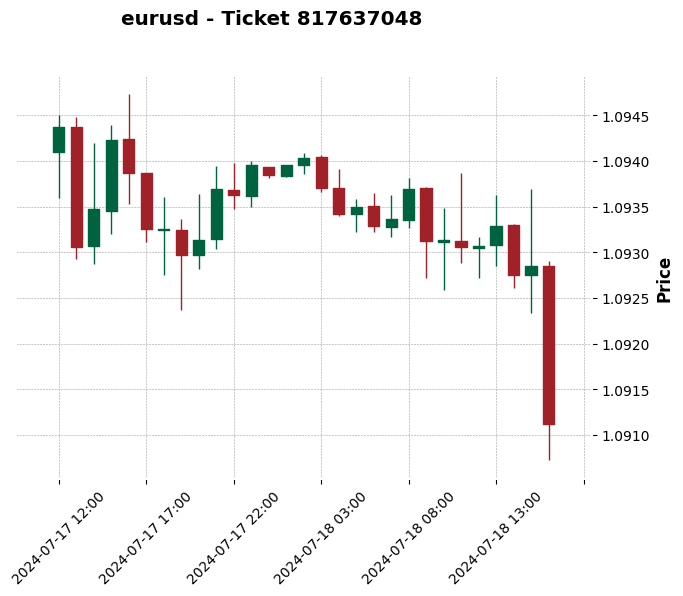

<Figure size 1200x600 with 0 Axes>

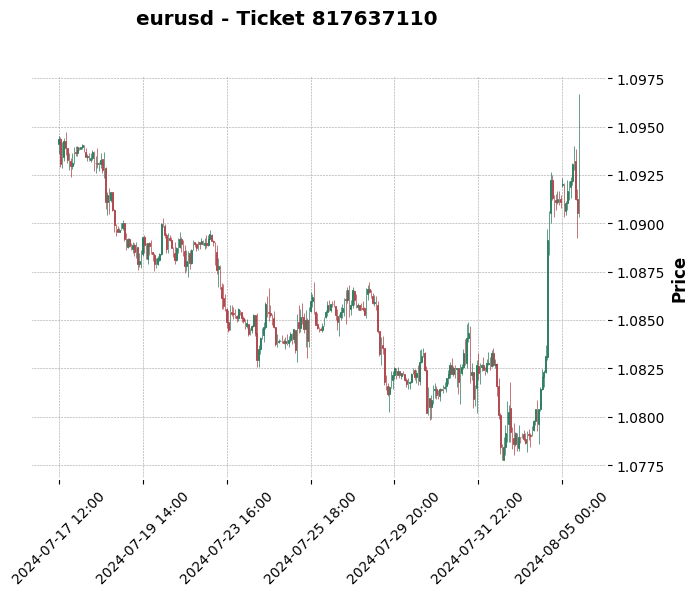

<Figure size 1200x600 with 0 Axes>

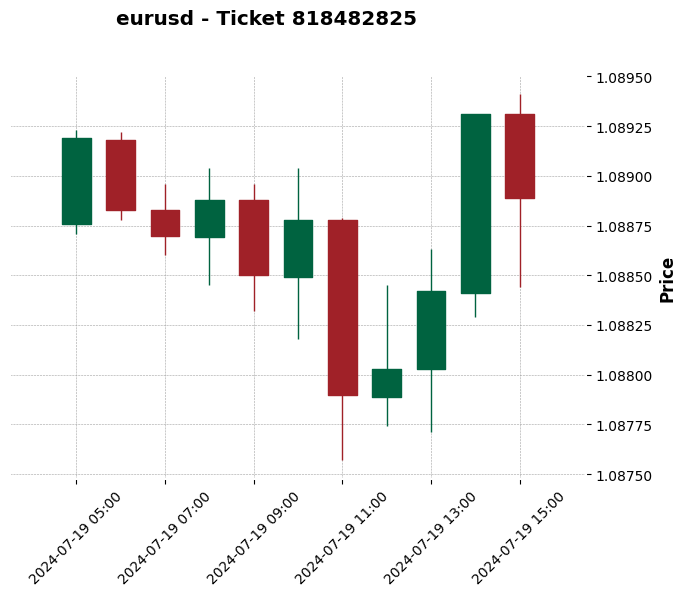

<Figure size 1200x600 with 0 Axes>

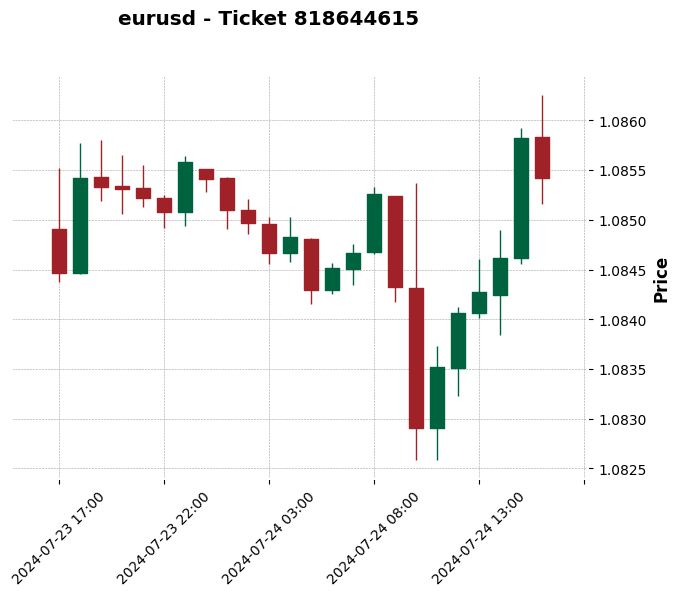

<Figure size 1200x600 with 0 Axes>

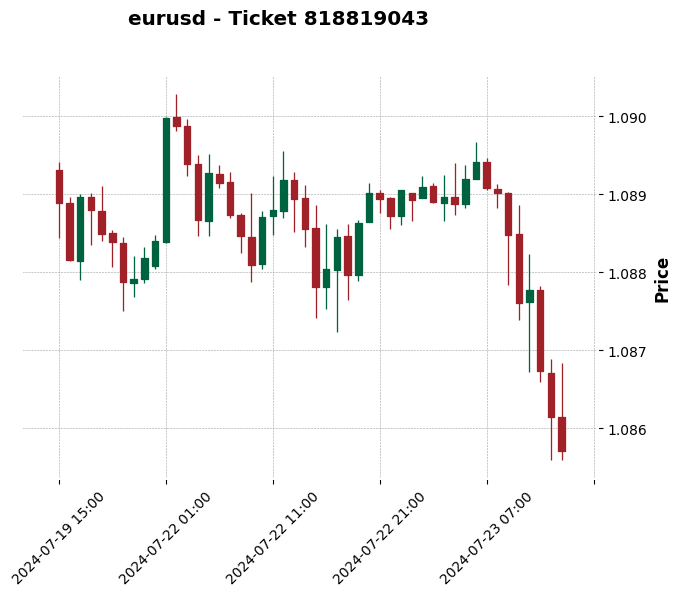

<Figure size 1200x600 with 0 Axes>

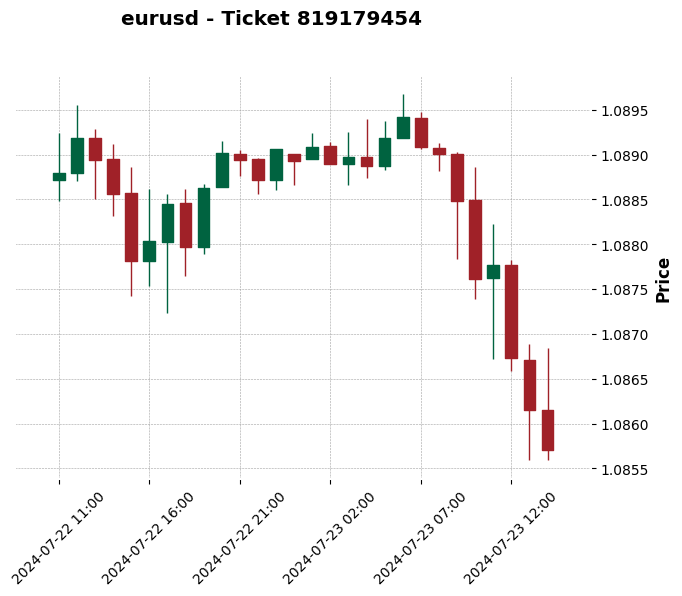

<Figure size 1200x600 with 0 Axes>

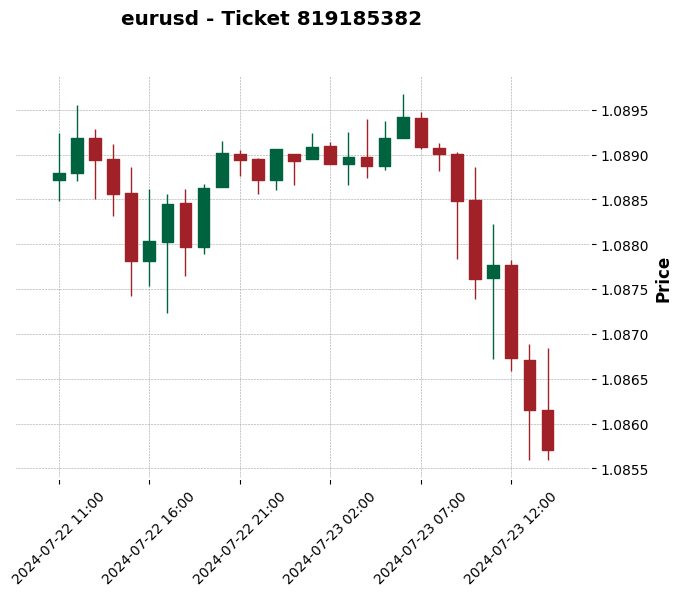

<Figure size 1200x600 with 0 Axes>

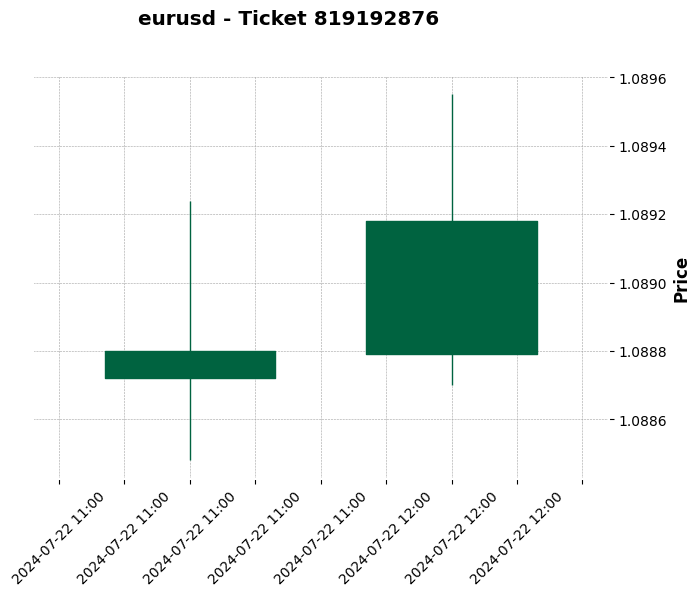

<Figure size 1200x600 with 0 Axes>

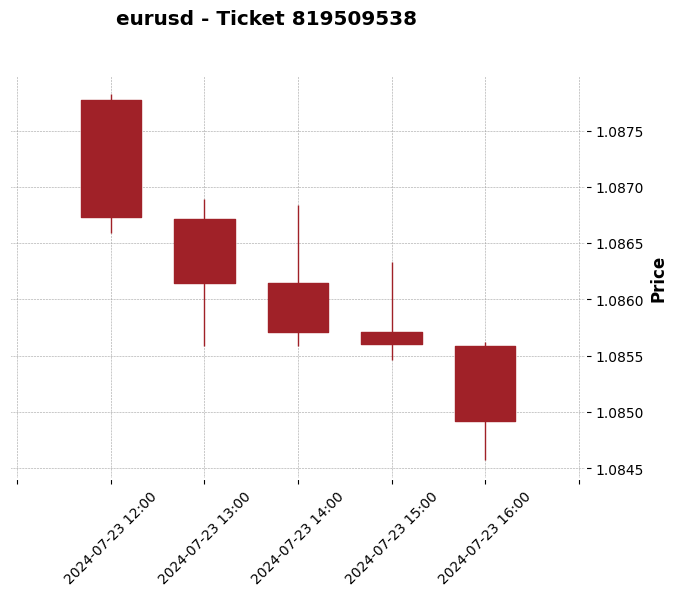

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

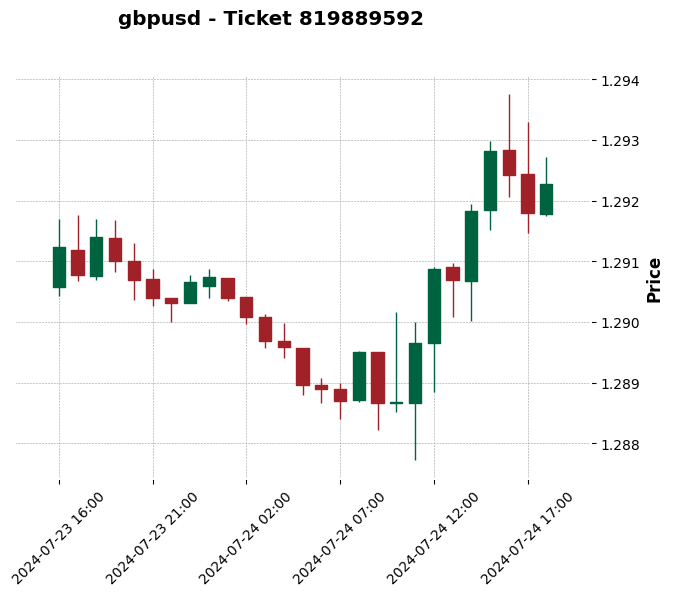

<Figure size 1200x600 with 0 Axes>

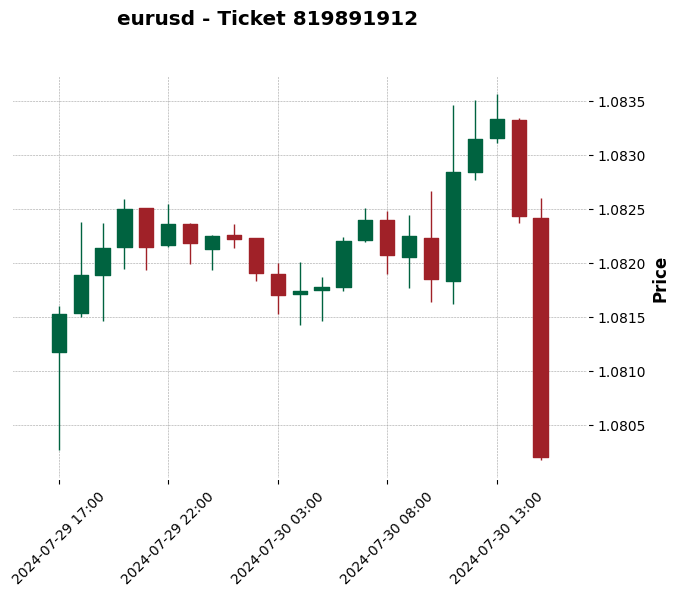

<Figure size 1200x600 with 0 Axes>

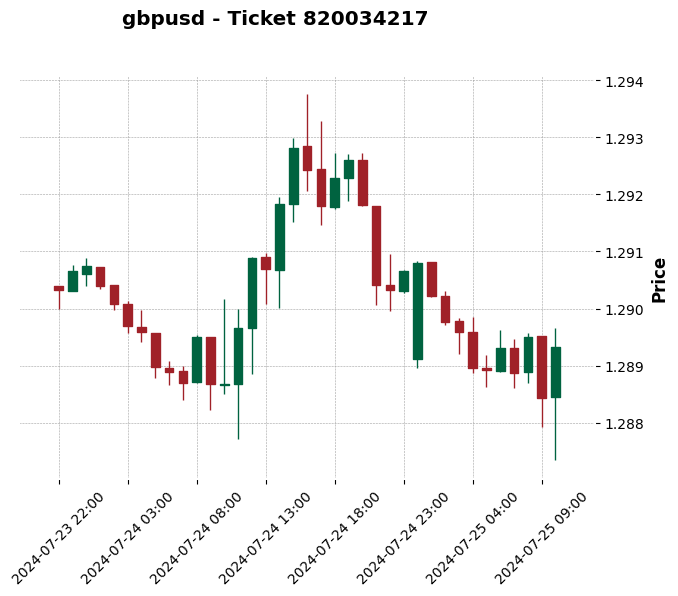

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

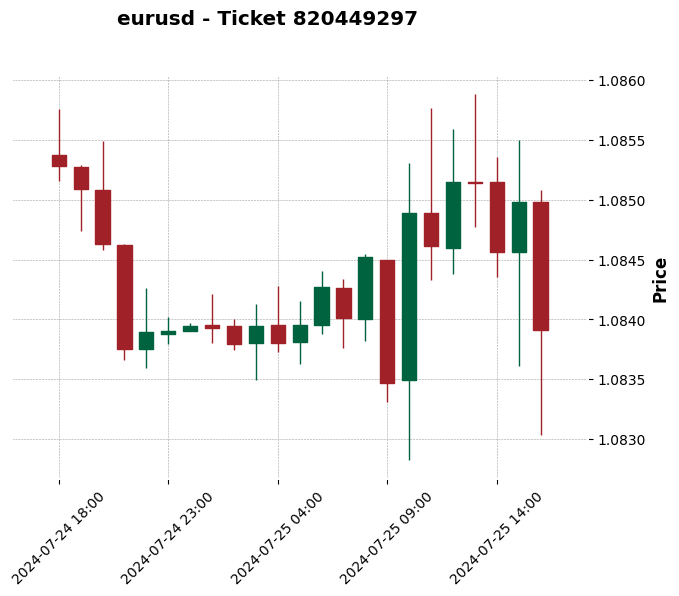

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

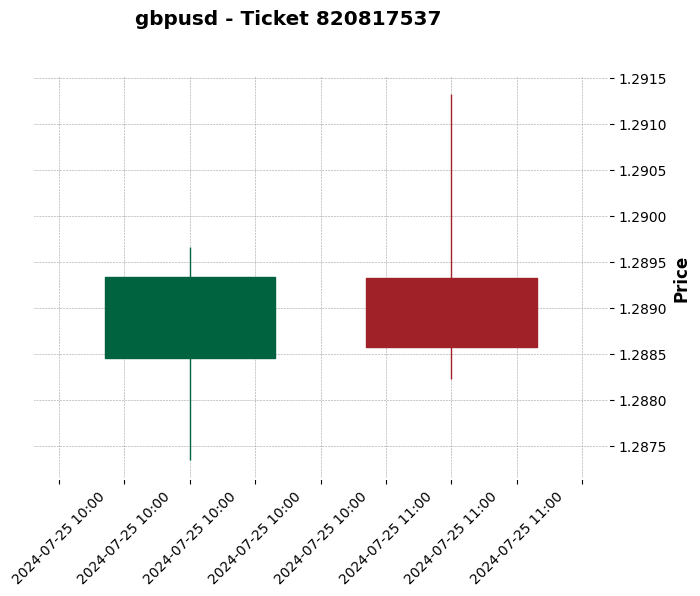

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

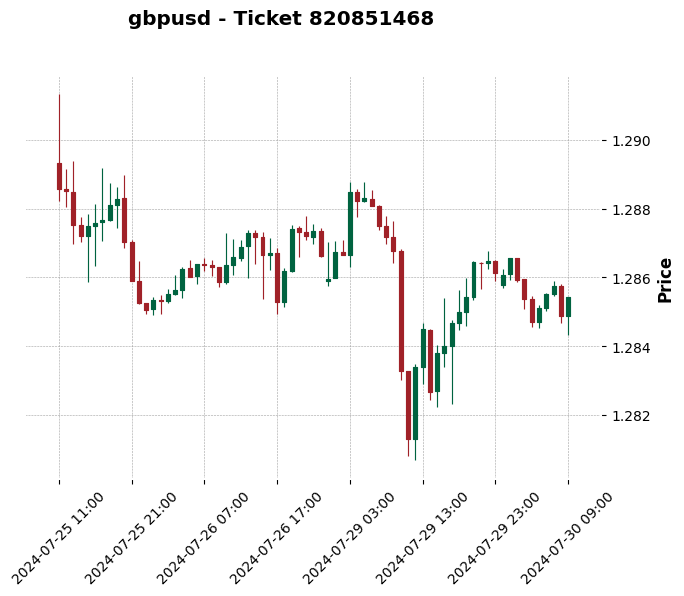

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

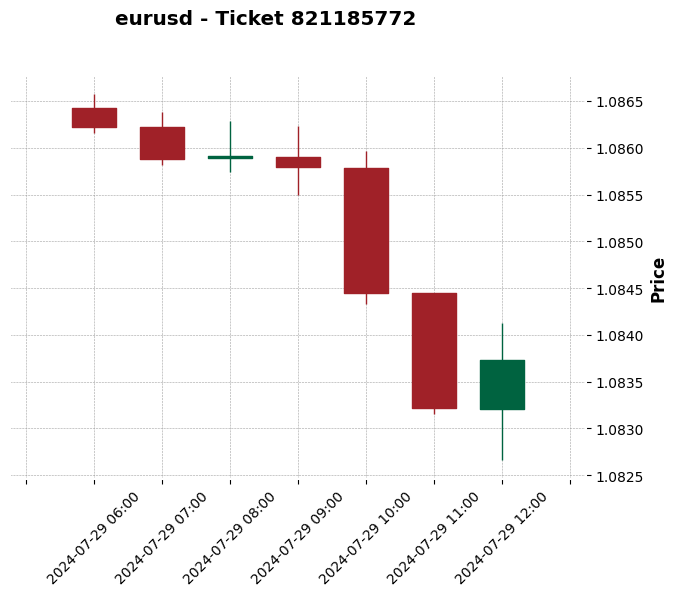

<Figure size 1200x600 with 0 Axes>

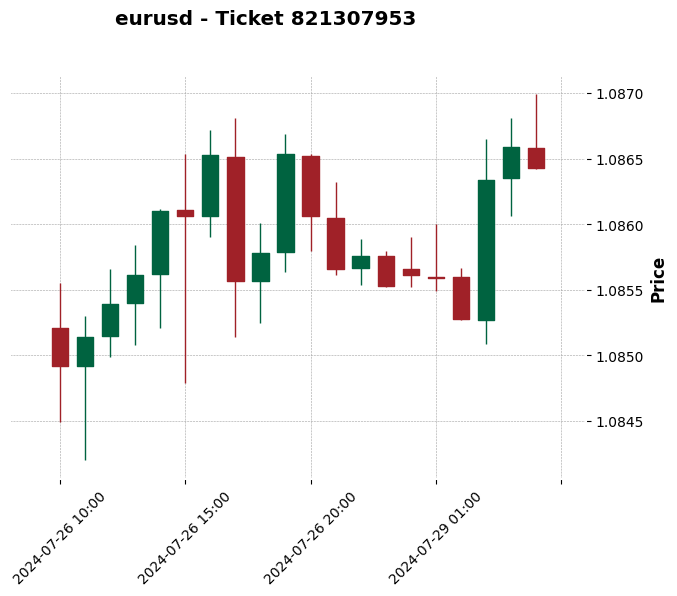

<Figure size 1200x600 with 0 Axes>

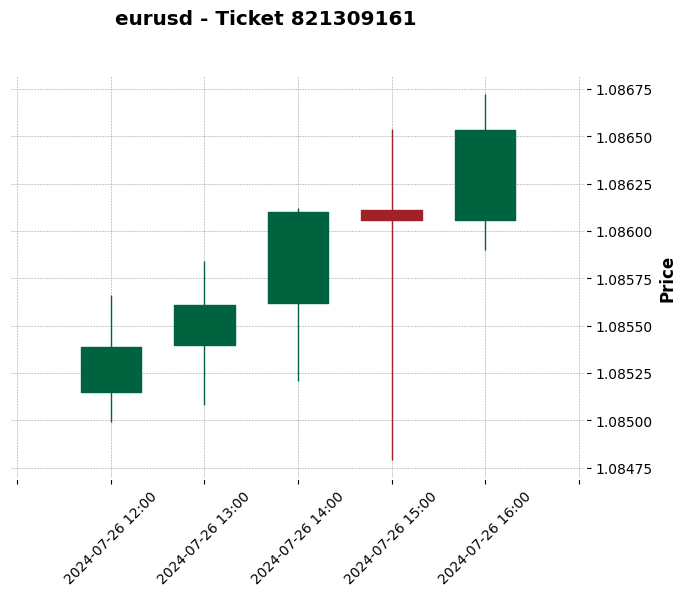

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

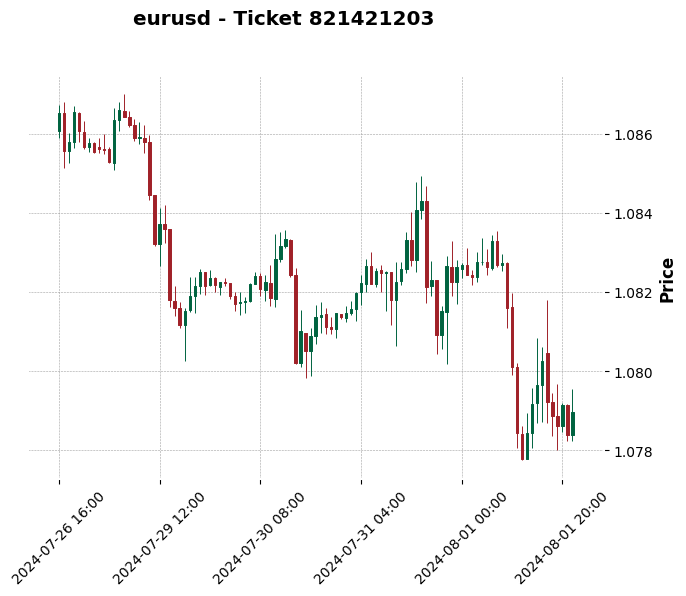

Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

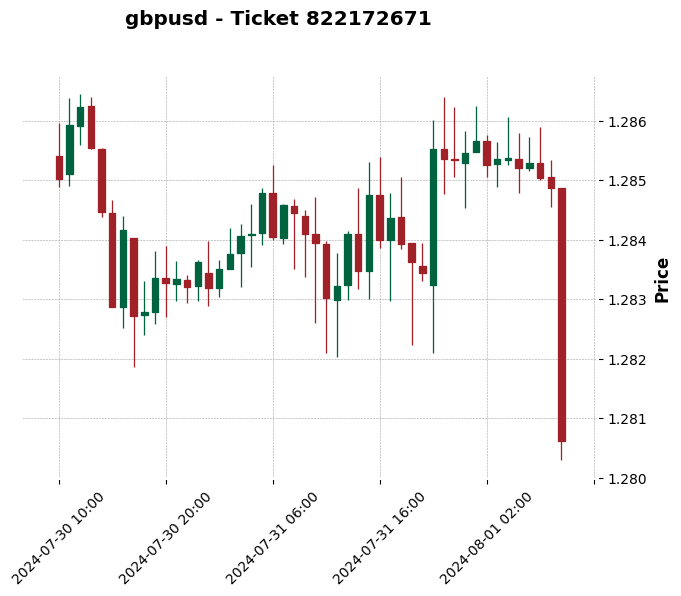

Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

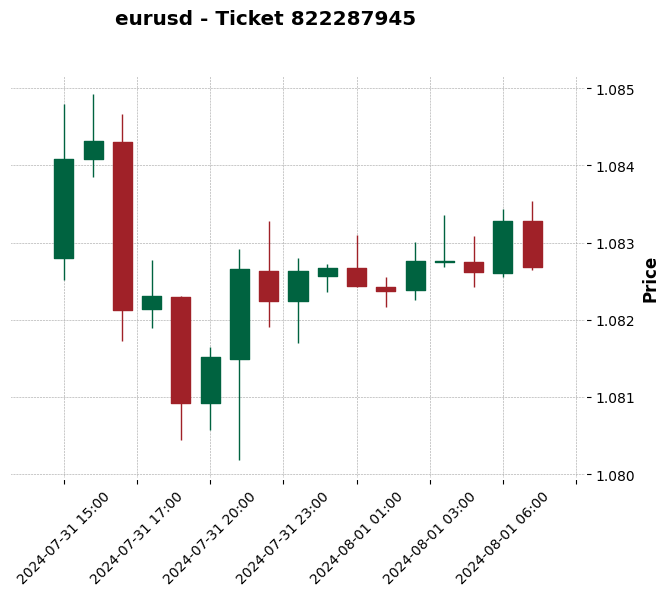

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

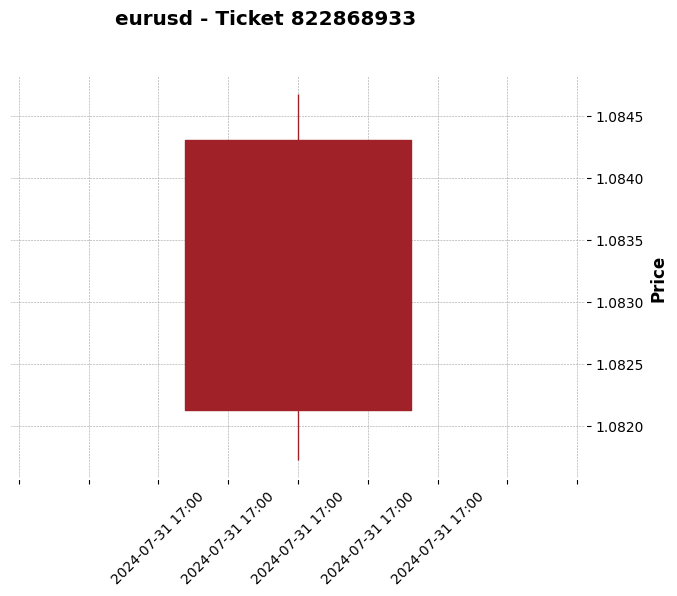

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

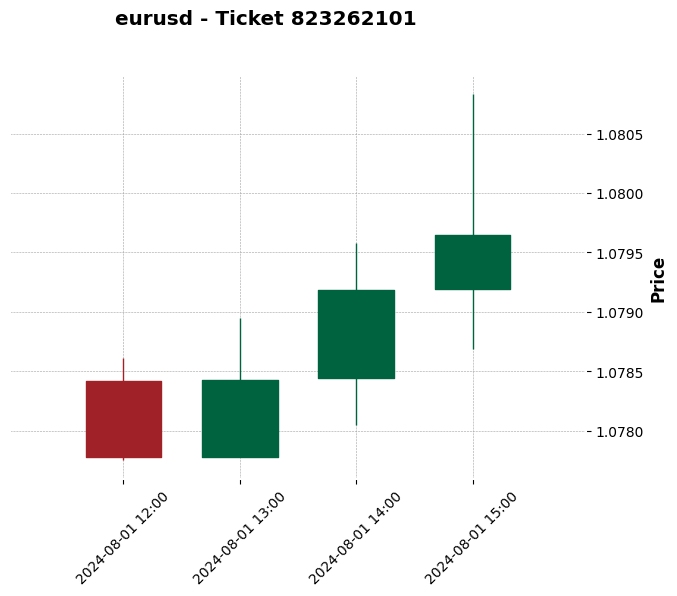

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

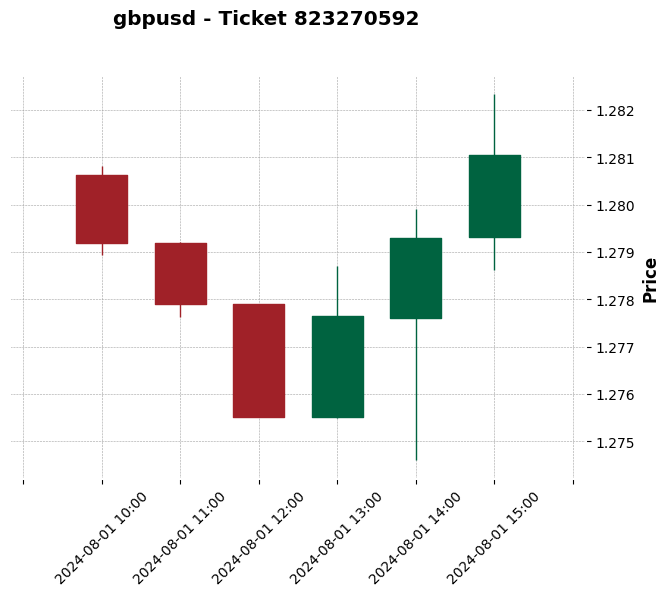

<Figure size 1200x600 with 0 Axes>

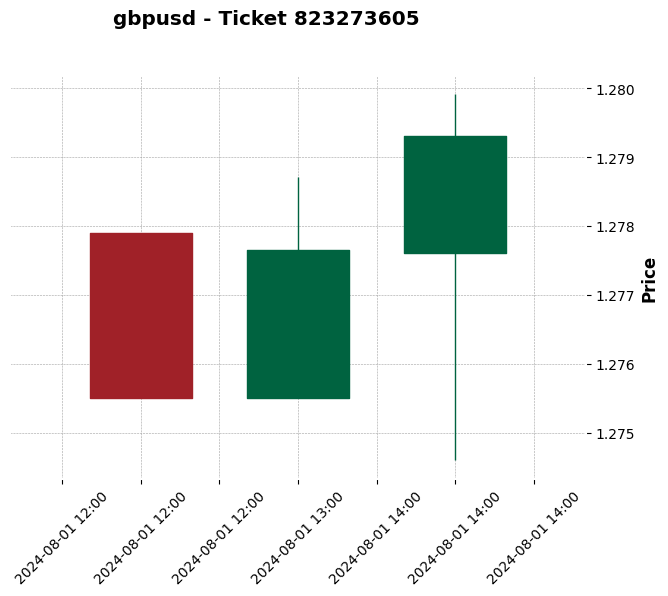

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

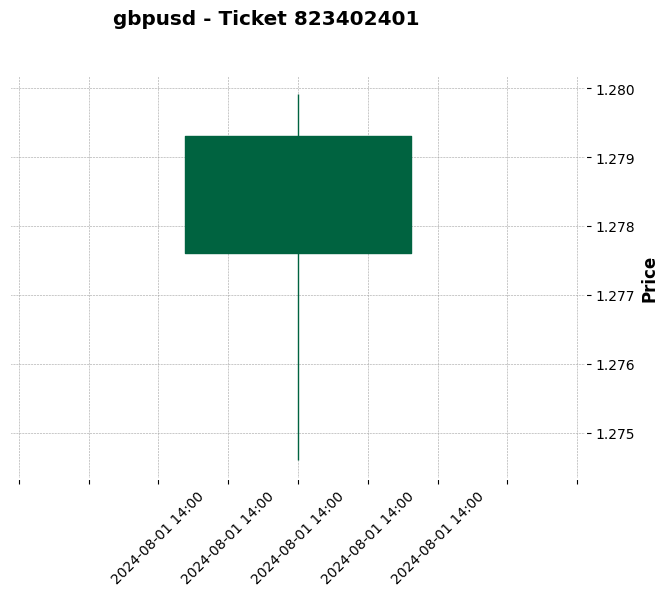

<Figure size 1200x600 with 0 Axes>

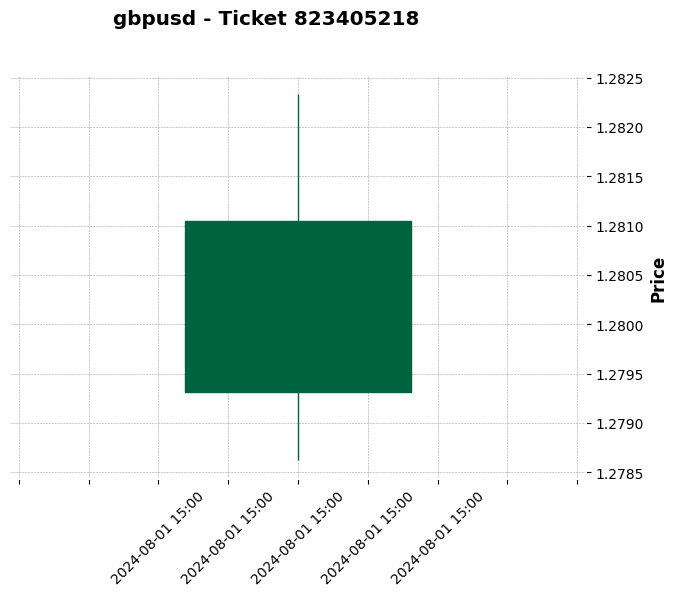

<Figure size 1200x600 with 0 Axes>

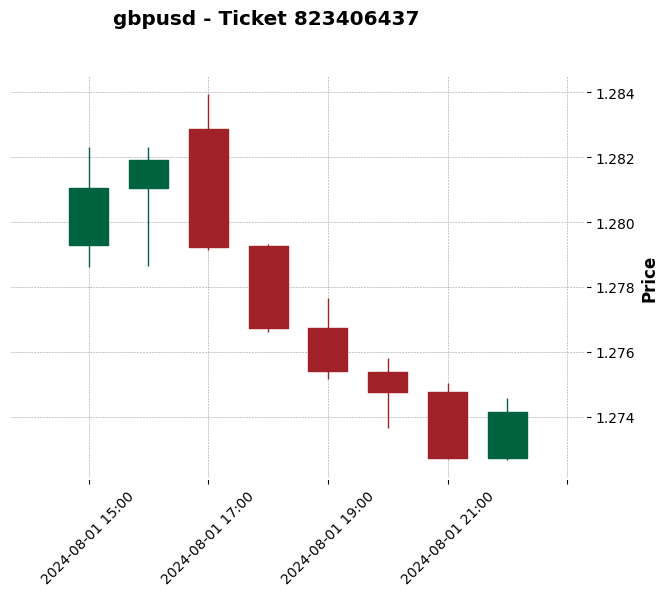

<Figure size 1200x600 with 0 Axes>

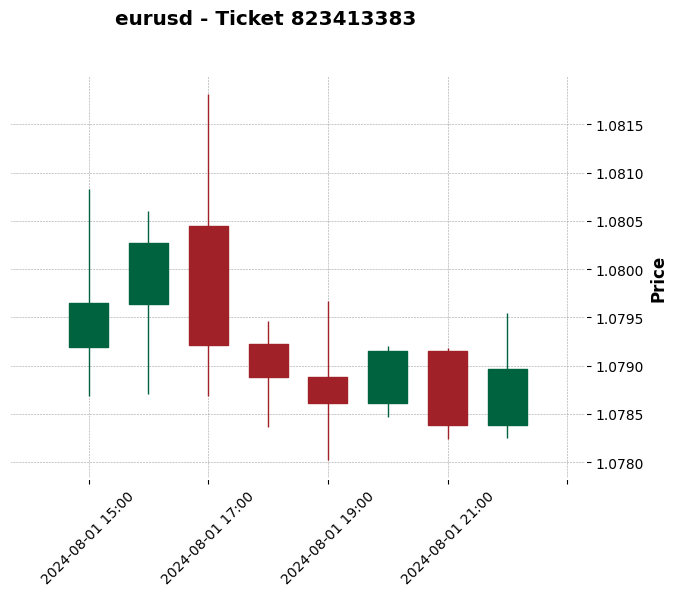

<Figure size 1200x600 with 0 Axes>

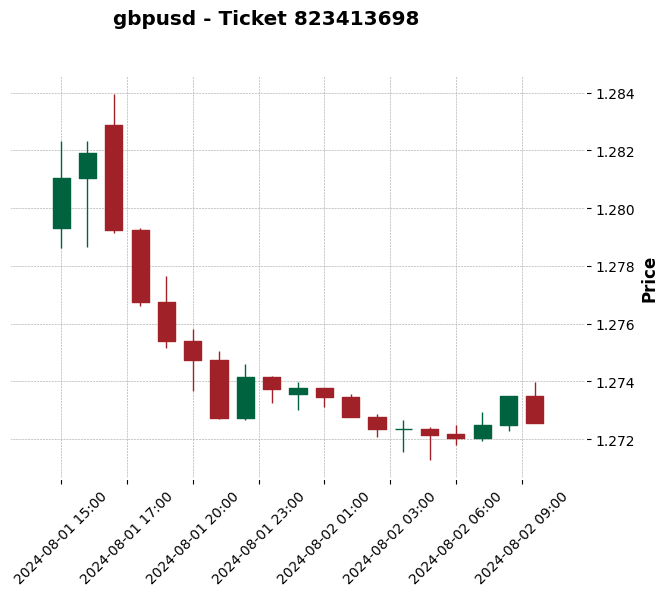

<Figure size 1200x600 with 0 Axes>

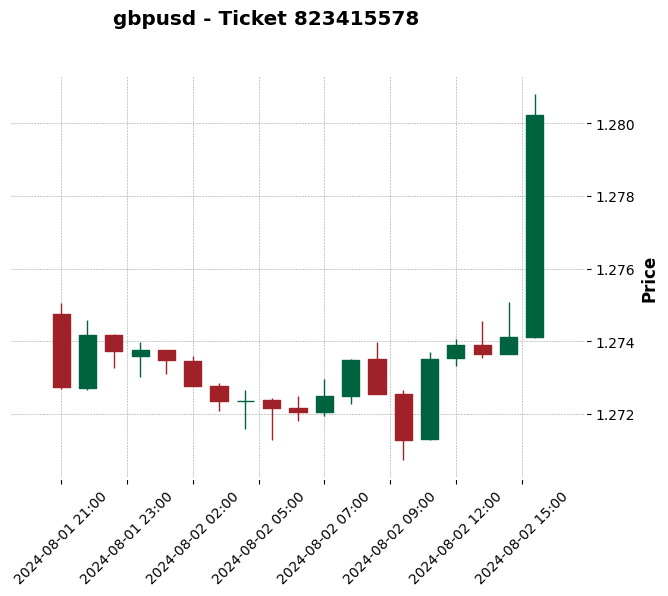

<Figure size 1200x600 with 0 Axes>

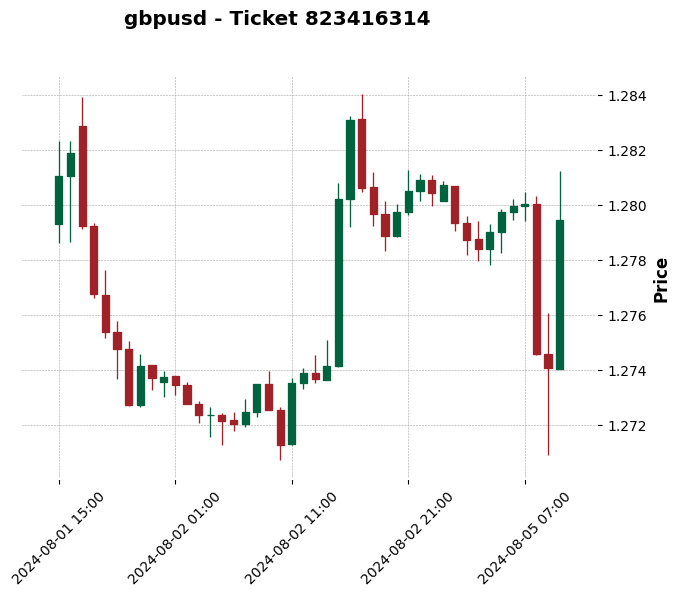

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

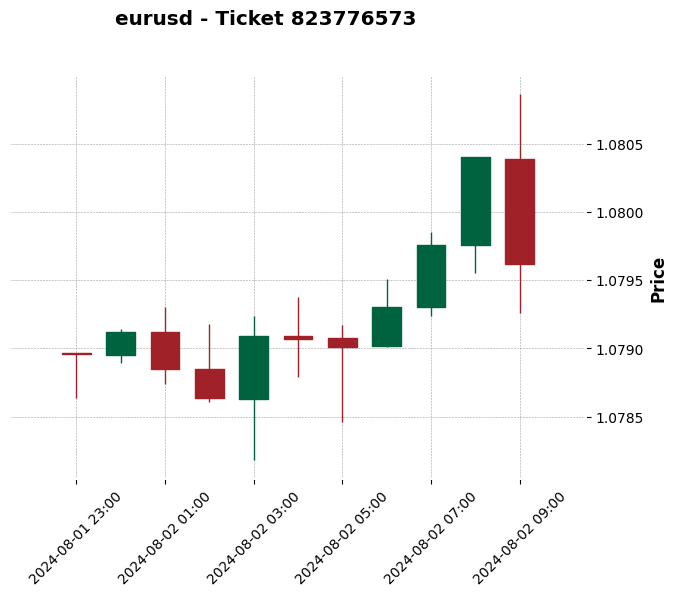

Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

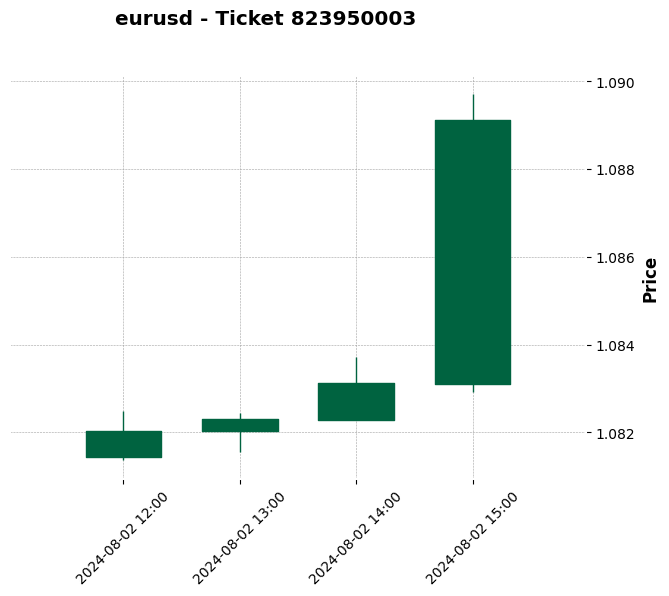

Нет данных котировок для сделки 823950168 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

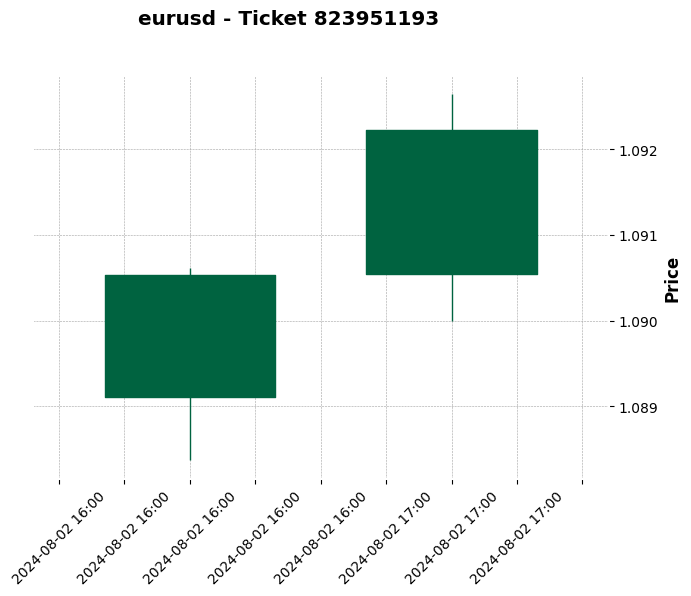

<Figure size 1200x600 with 0 Axes>

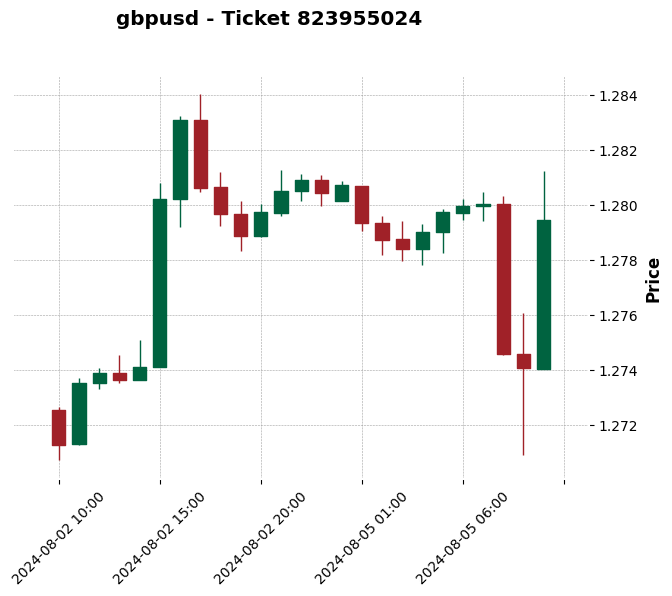

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

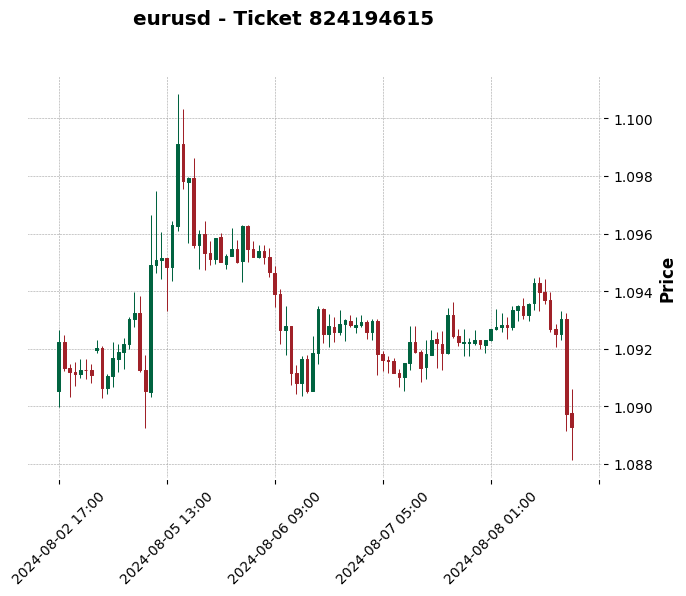

<Figure size 1200x600 with 0 Axes>

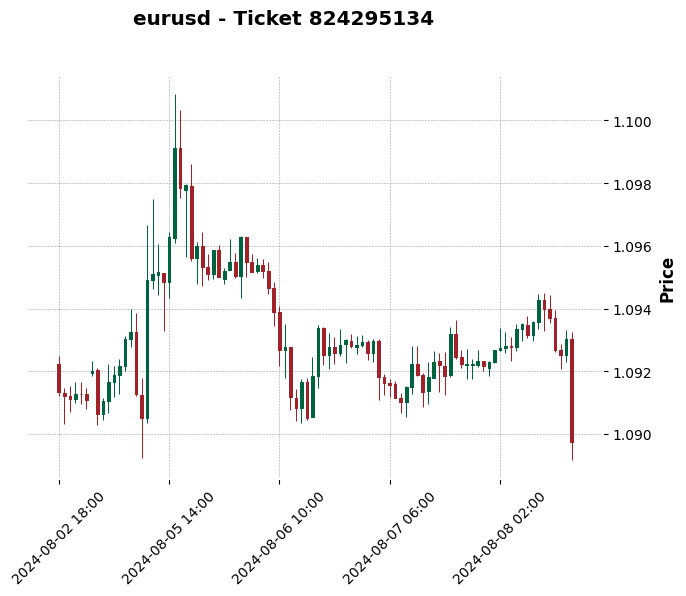

<Figure size 1200x600 with 0 Axes>

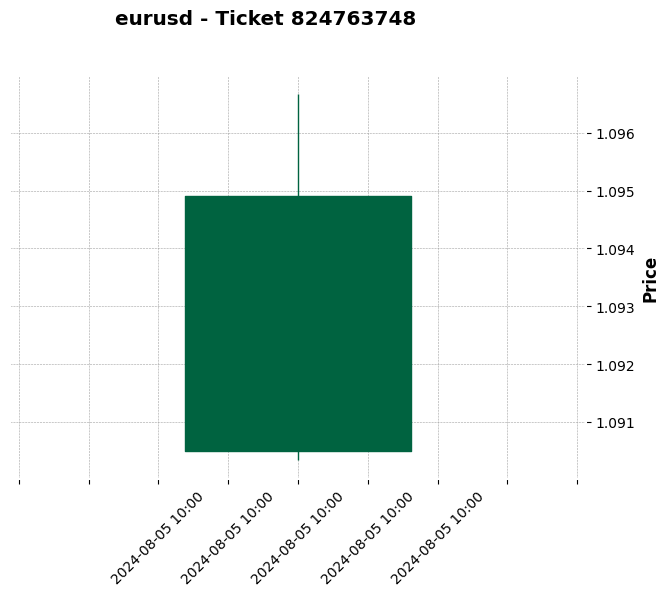

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

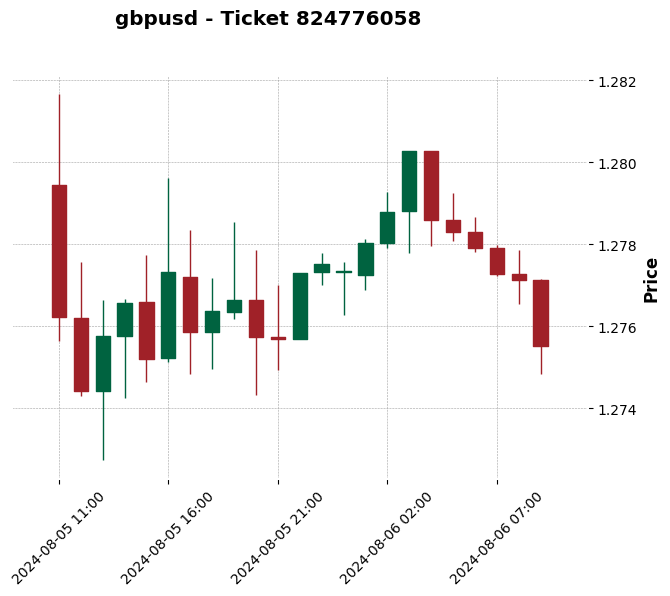

<Figure size 1200x600 with 0 Axes>

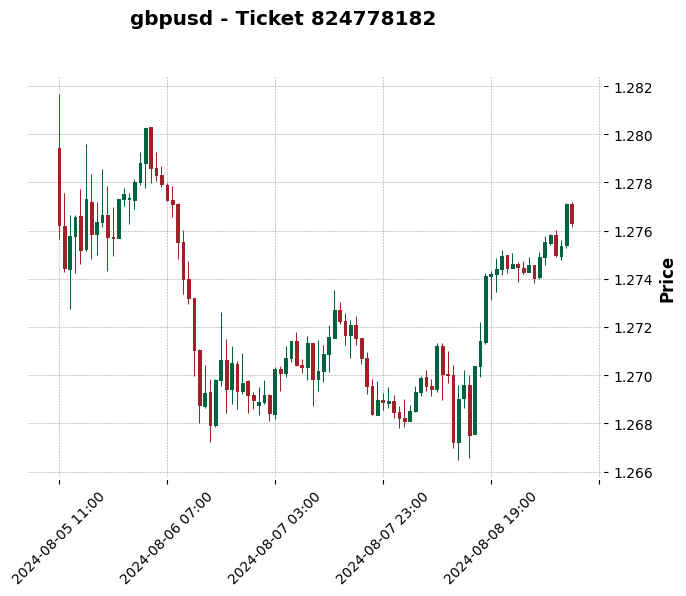

<Figure size 1200x600 with 0 Axes>

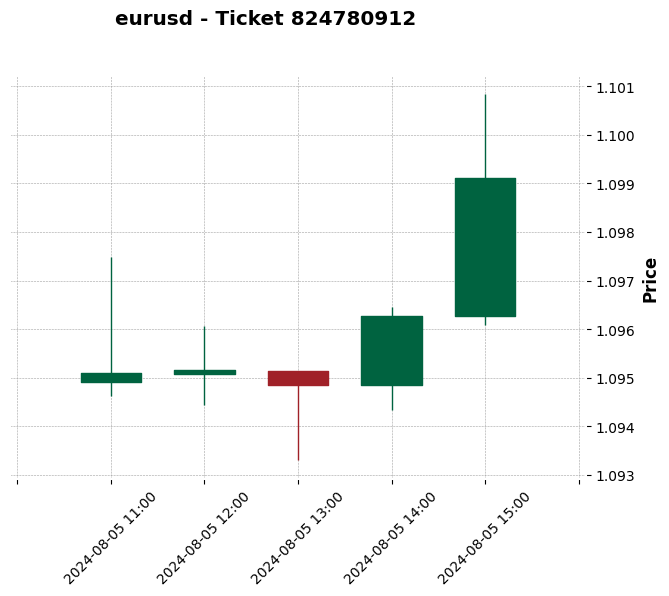

<Figure size 1200x600 with 0 Axes>

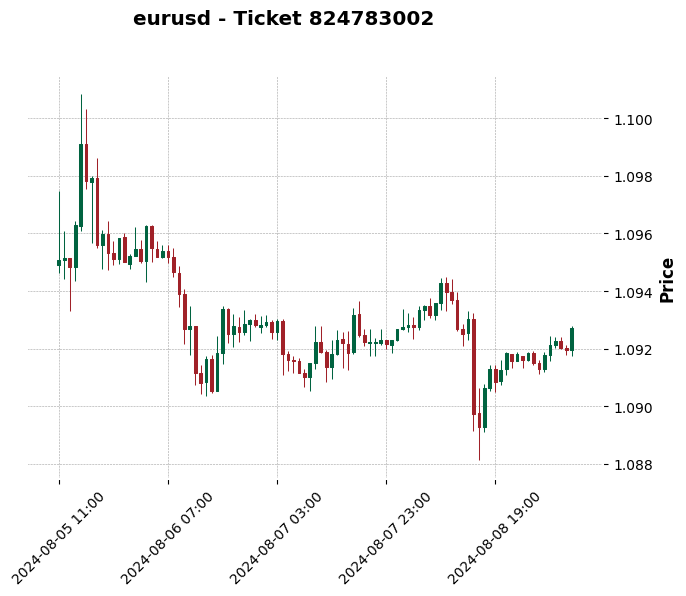

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

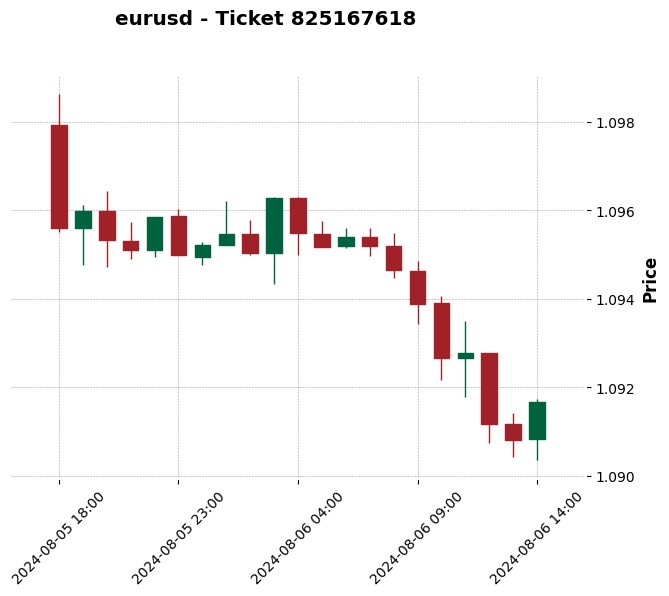

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

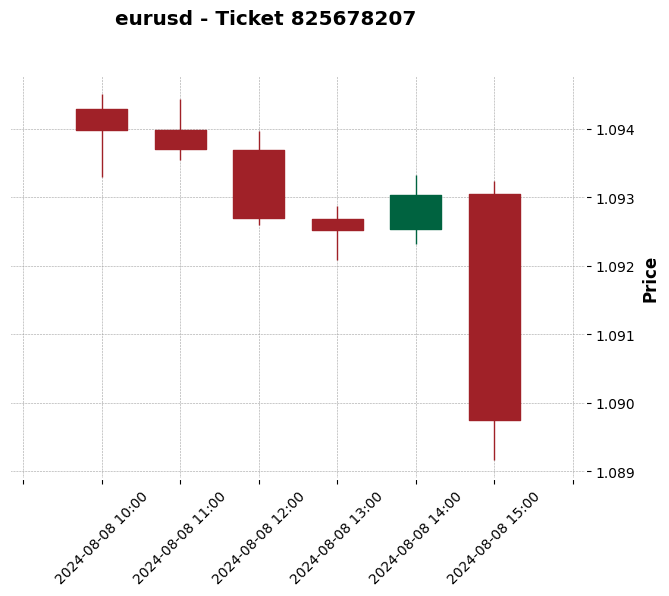

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

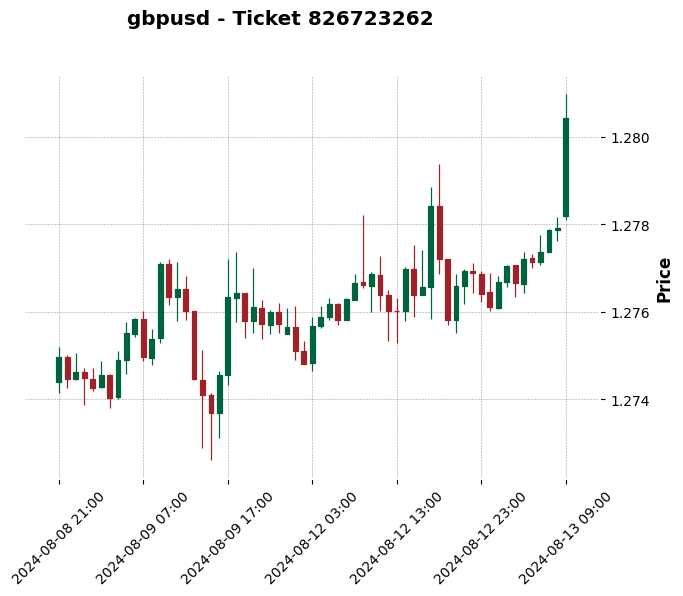

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

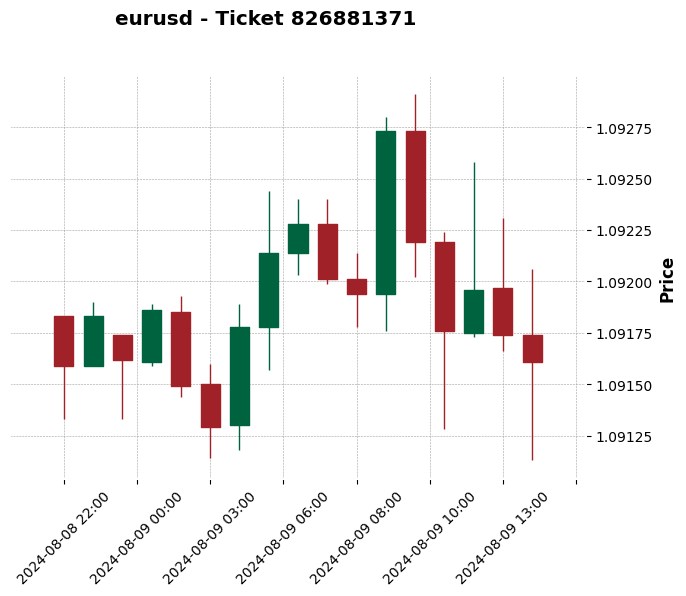

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

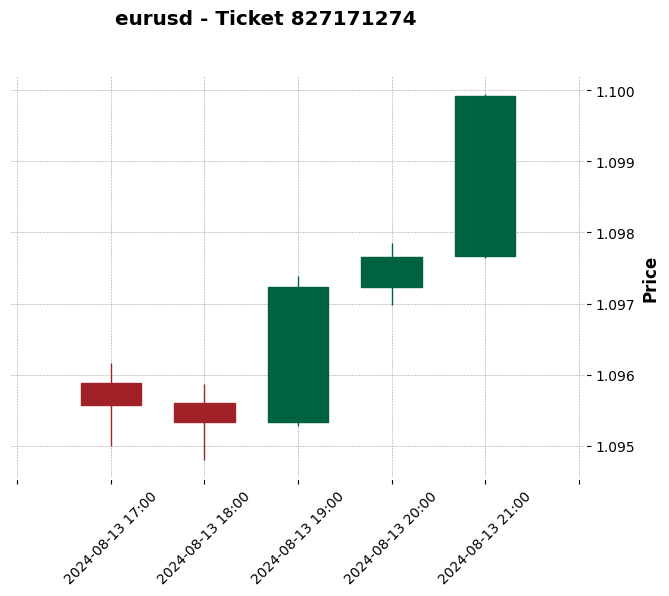

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

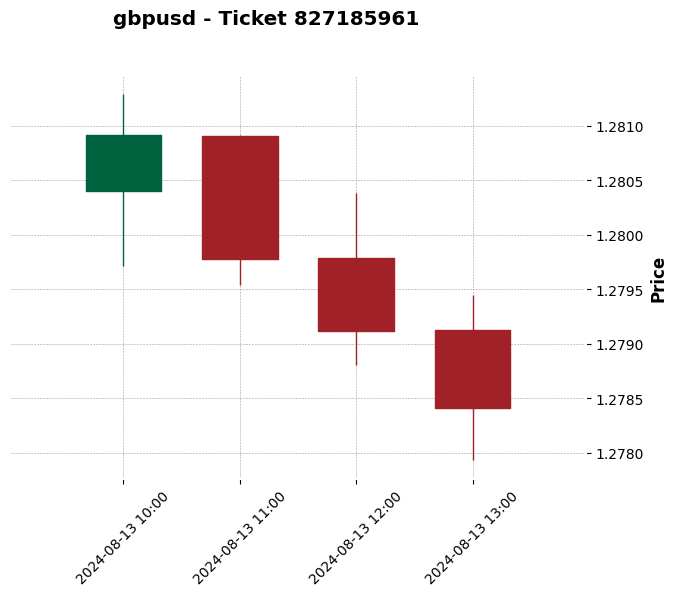

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

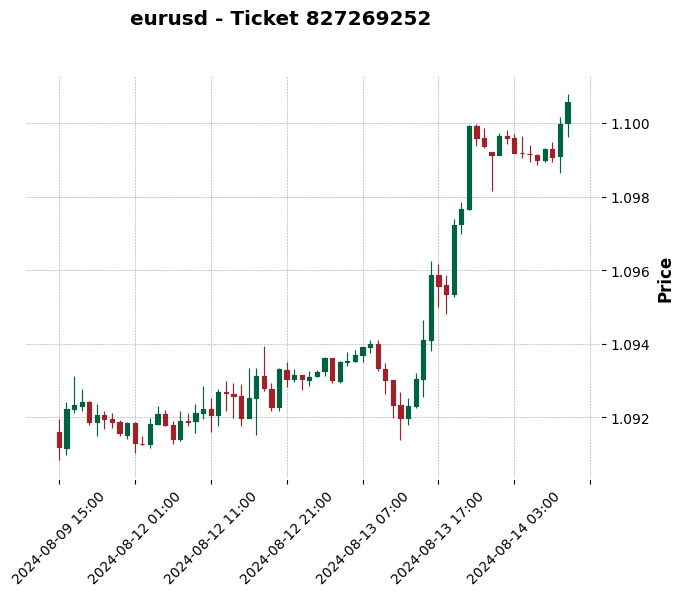

Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

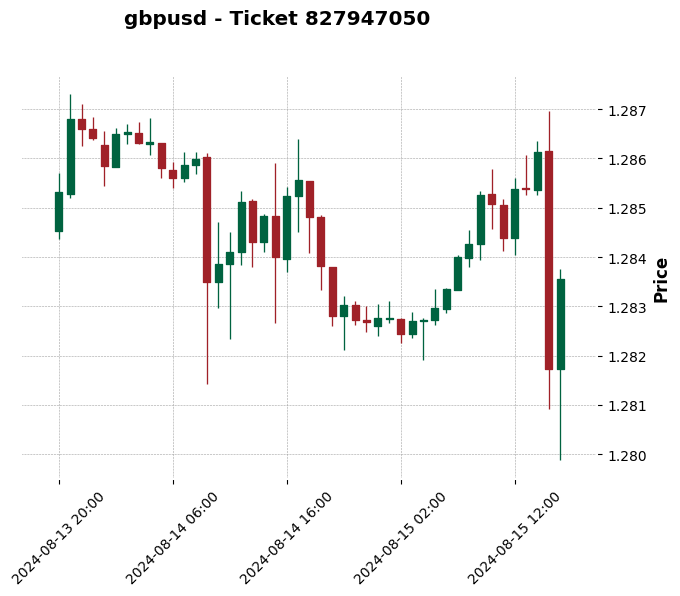

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.


<Figure size 1200x600 with 0 Axes>

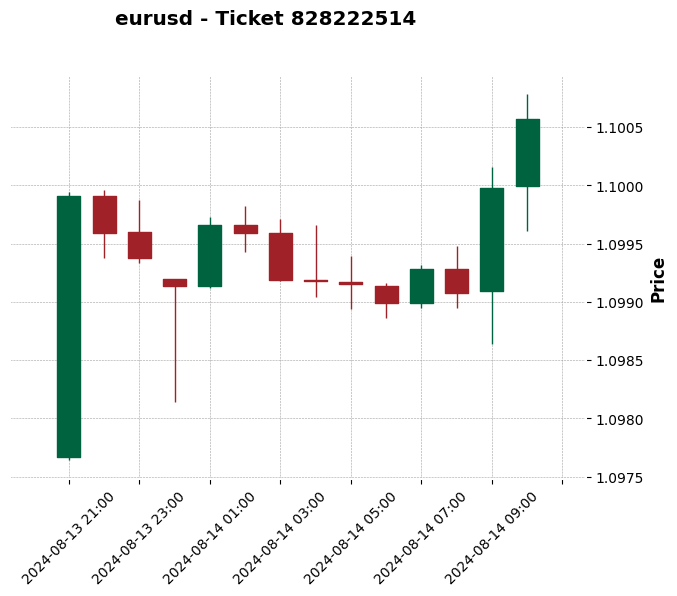

<Figure size 1200x600 with 0 Axes>

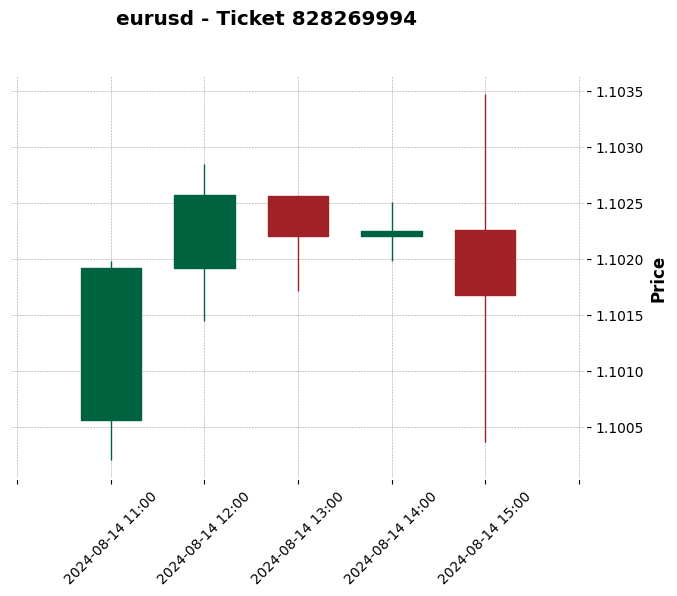

<Figure size 1200x600 with 0 Axes>

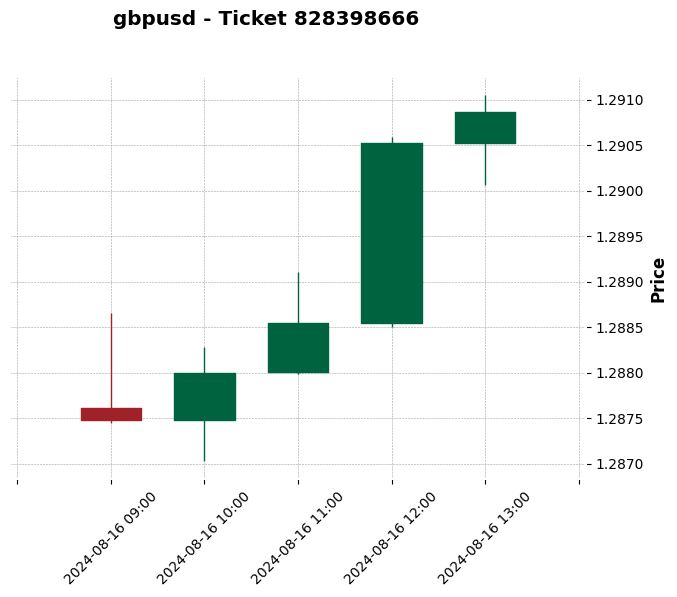

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

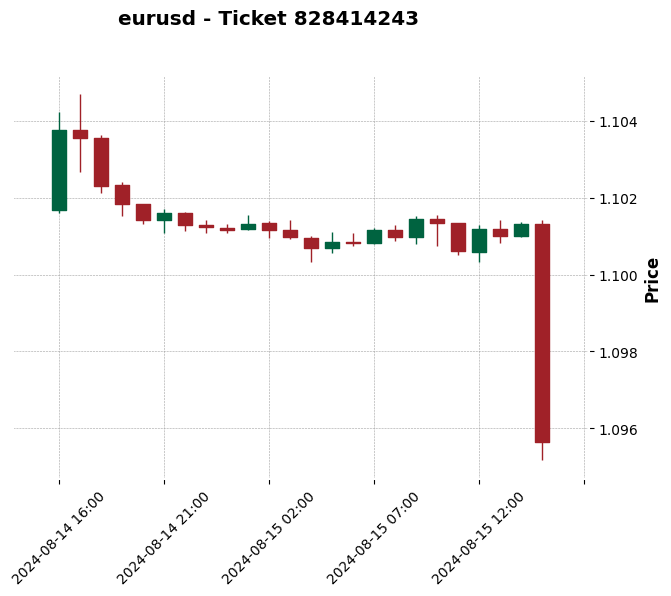

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Нет данных котировок для сделки 828944569 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

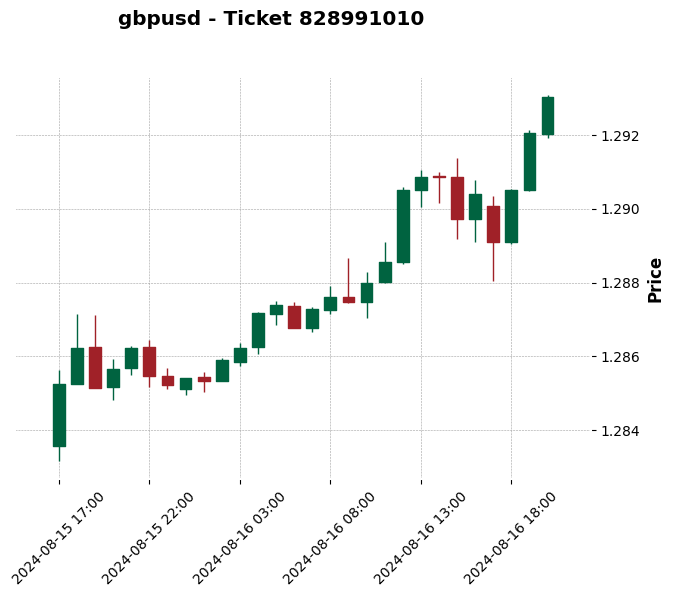

<Figure size 1200x600 with 0 Axes>

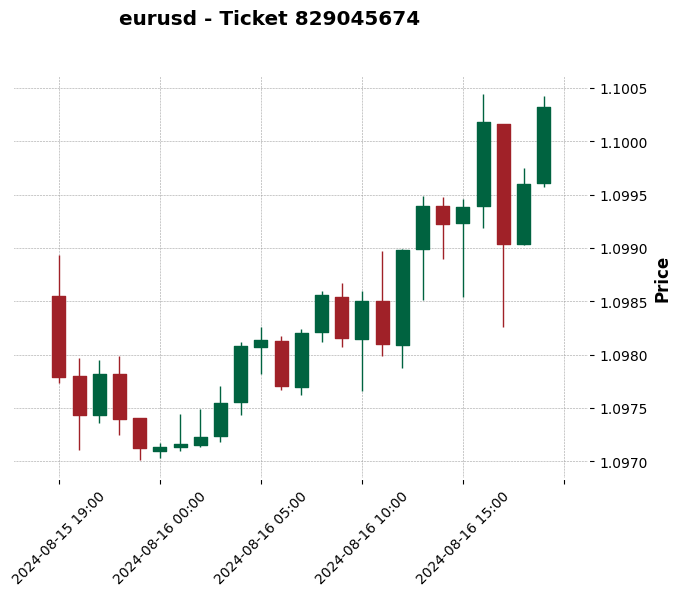

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Нет данных котировок для сделки 829254836 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

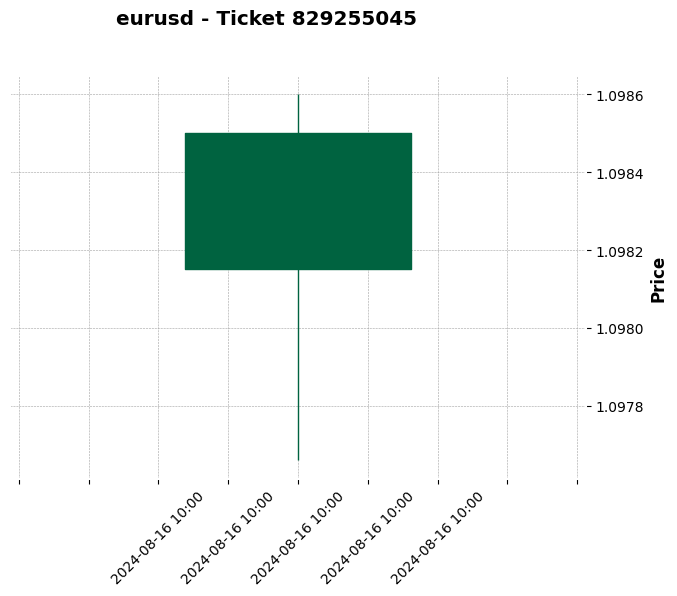

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Нет данных котировок для сделки 829559910 в заданном интервале.
Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price', datetime_format='%Y-%m-%d %H:%M')

            # Добавление вертикальных линий для входа и выхода из сделки
            ax = plt.gca()
            ax.axvline(x=row['Open Time'], color='blue', linestyle='--', label='Open')
            ax.axvline(x=row['Close Time'], color='green', linestyle='--', label='Close')

            # Добавление текстовых меток и линии с ценой
            ax.text(row['Open Time'], selected_data['Close'].min(), f'Open: {row["Price"]}', color='blue', fontsize=12, verticalalignment='bottom')
            ax.text(row['Close Time'], selected_data['Close'].max(), f'Close: {row["Price.1"]}\nProfit: {row["Profit"]}', color='green', fontsize=12, verticalalignment='bottom')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

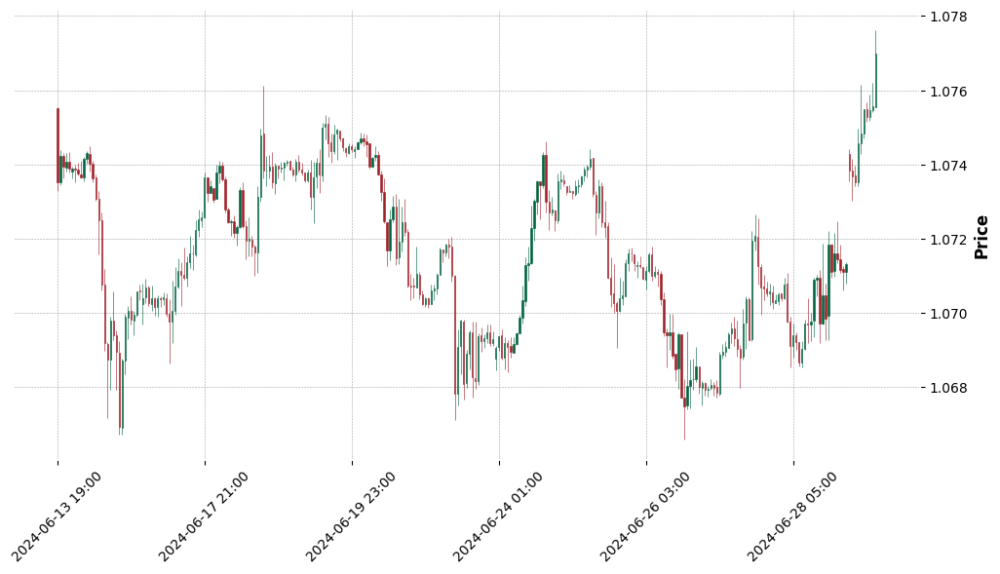

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price', datetime_format='%Y-%m-%d %H:%M')

            # Добавление вертикальных линий для входа и выхода из сделки
            ax.axvline(x=row['Open Time'], color='blue', linestyle='--', label='Open', linewidth=1)
            ax.axvline(x=row['Close Time'], color='green', linestyle='--', label='Close', linewidth=1)

            # Добавление текстовых меток и линии с ценой
            ax.text(row['Open Time'], selected_data['Close'].min(), f'Open: {row["Price"]}', color='blue', fontsize=12, verticalalignment='bottom', horizontalalignment='right')
            ax.text(row['Close Time'], selected_data['Close'].max(), f'Close: {row["Price.1"]}\nProfit: {row["Profit"]}', color='green', fontsize=12, verticalalignment='top', horizontalalignment='right')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

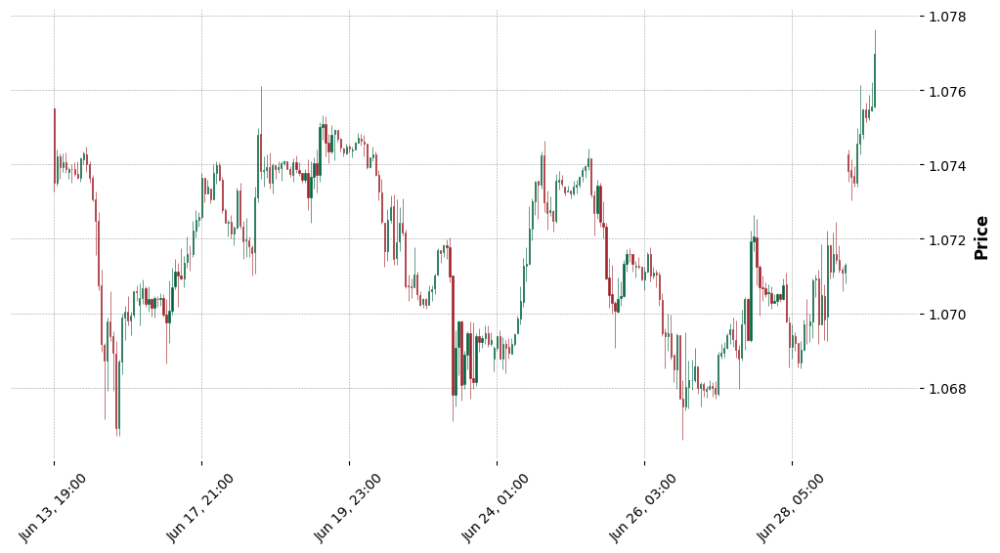

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles', ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}", ylabel='Price')

            # Добавление вертикальных линий для входа и выхода из сделки
            ax.axvline(x=row['Open Time'], color='blue', linestyle='--', label='Open', linewidth=1)
            ax.axvline(x=row['Close Time'], color='green', linestyle='--', label='Close', linewidth=1)

            # Добавление текстовых меток и линии с ценой
            ax.text(row['Open Time'], selected_data['Close'].min(), f'Open: {row["Price"]}', color='blue', fontsize=12, verticalalignment='bottom', horizontalalignment='right')
            ax.text(row['Close Time'], selected_data['Close'].max(), f'Close: {row["Price.1"]}\nProfit: {row["Profit"]}', color='green', fontsize=12, verticalalignment='top', horizontalalignment='right')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

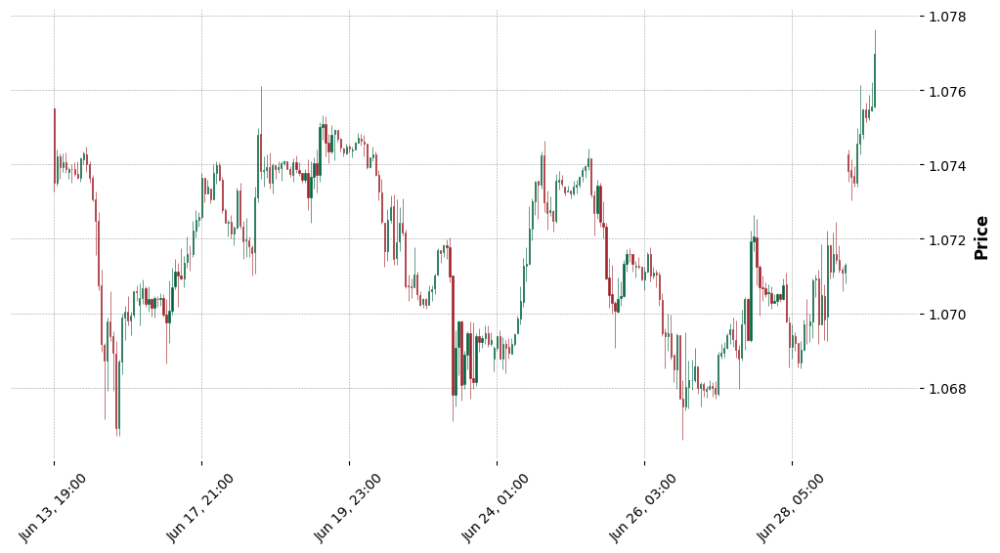

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles', ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}", ylabel='Price')

            # Добавление вертикальных линий для входа и выхода из сделки
            ax.axvline(x=row['Open Time'], color='blue', linestyle='--', label='Open', linewidth=1)
            ax.axvline(x=row['Close Time'], color='green', linestyle='--', label='Close', linewidth=1)

            # Добавление текстовых меток и линии с ценой
            ax.text(row['Open Time'], selected_data['Close'].min(), f'Open: {row["Price"]}', color='blue', fontsize=12, verticalalignment='bottom', horizontalalignment='right')
            ax.text(row['Close Time'], selected_data['Close'].max(), f'Close: {row["Price.1"]}\nProfit: {row["Profit"]}', color='green', fontsize=12, verticalalignment='top', horizontalalignment='right')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<Figure size 1200x600 with 0 Axes>

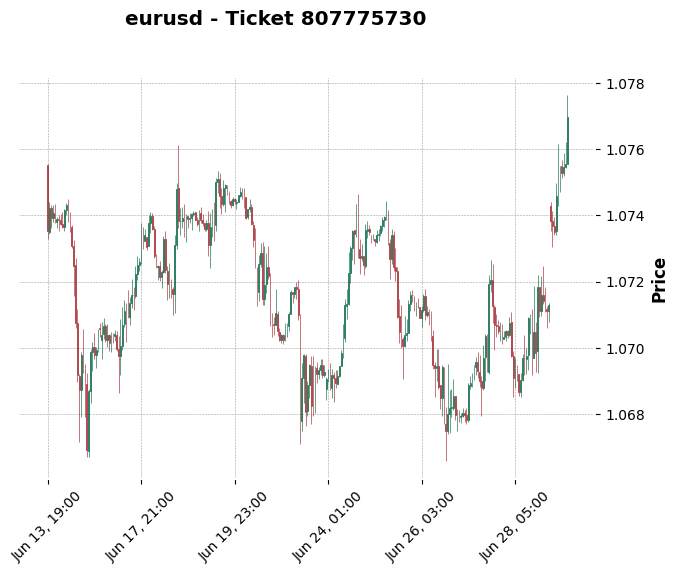

<Figure size 1200x600 with 0 Axes>

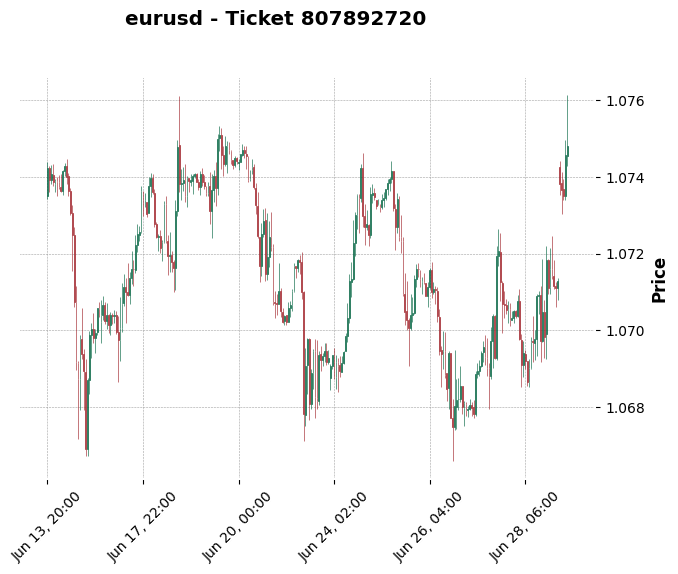

<Figure size 1200x600 with 0 Axes>

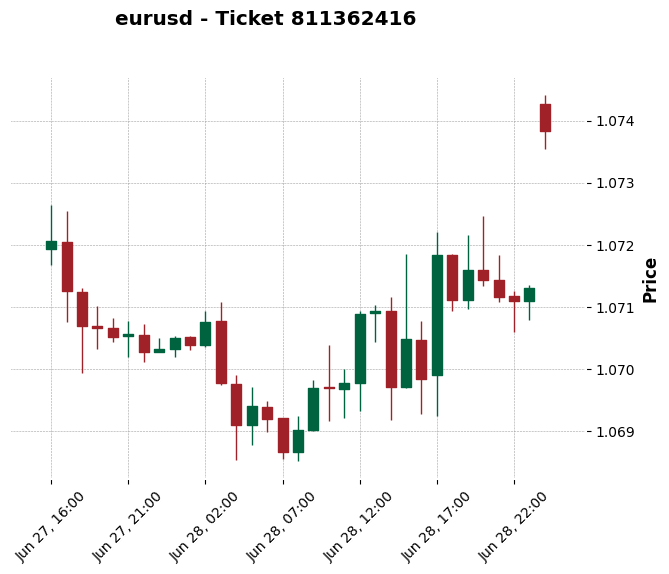

<Figure size 1200x600 with 0 Axes>

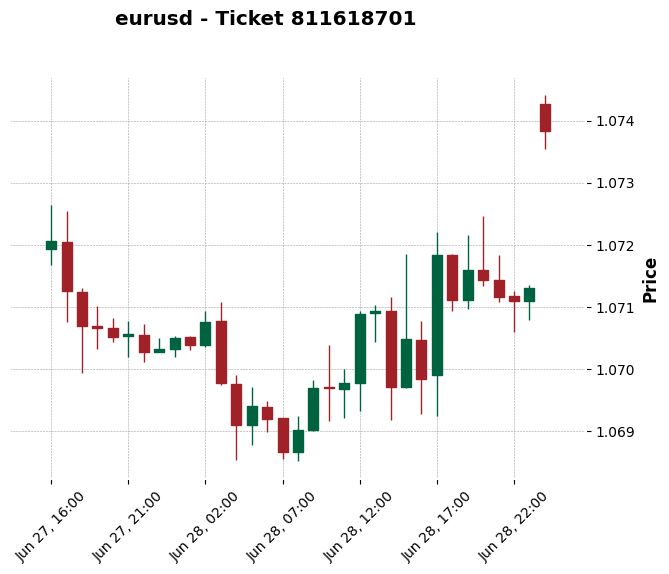

<Figure size 1200x600 with 0 Axes>

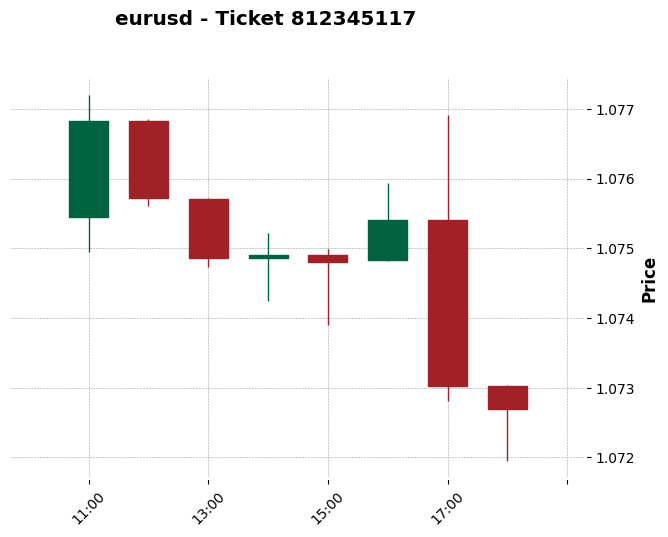

<Figure size 1200x600 with 0 Axes>

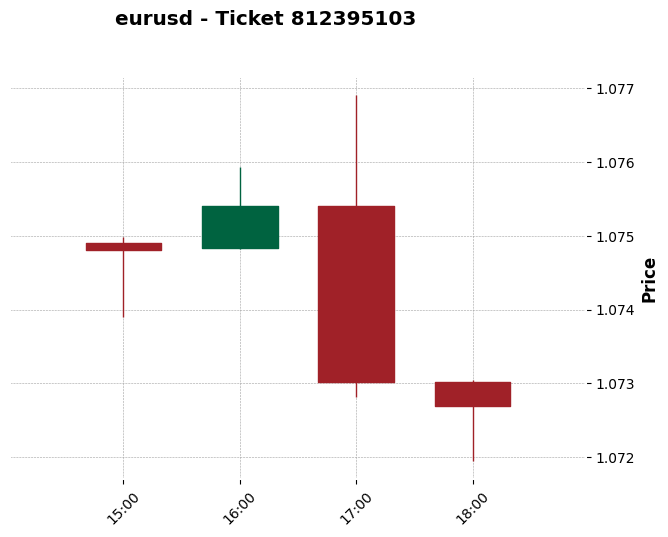

Нет данных котировок для сделки 812707226 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

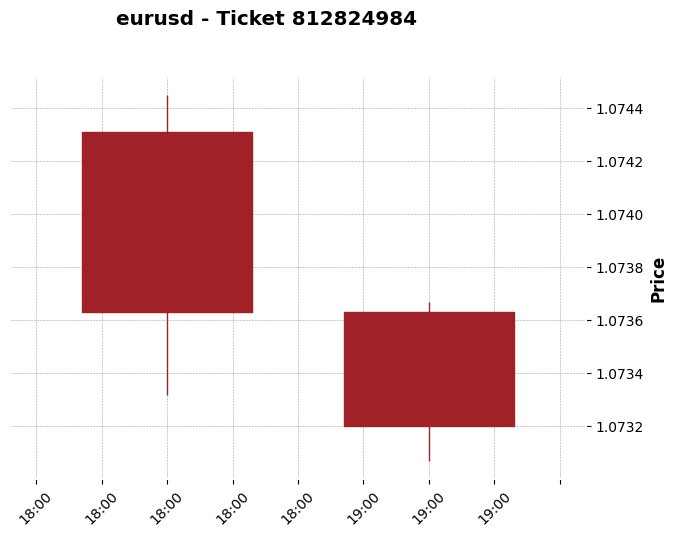

<Figure size 1200x600 with 0 Axes>

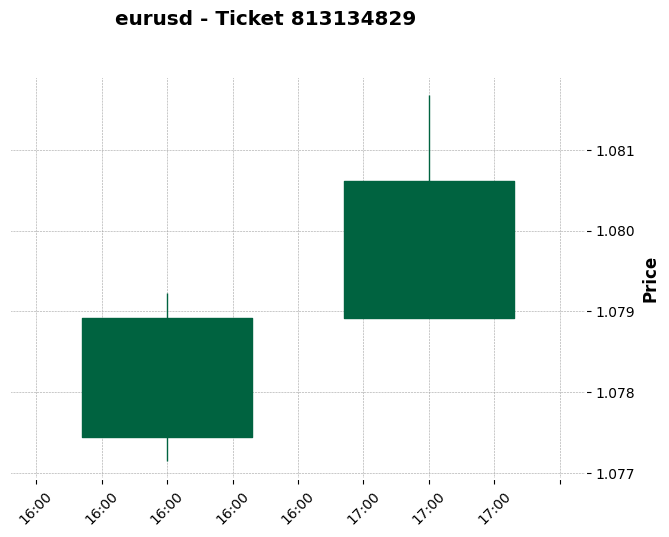

<Figure size 1200x600 with 0 Axes>

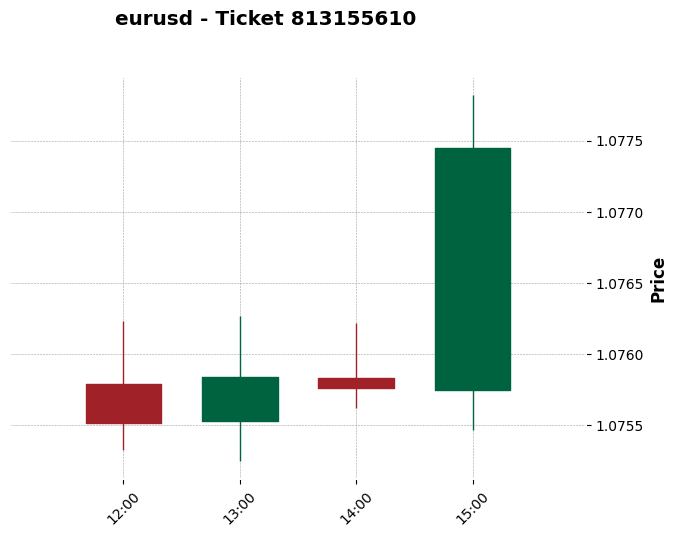

<Figure size 1200x600 with 0 Axes>

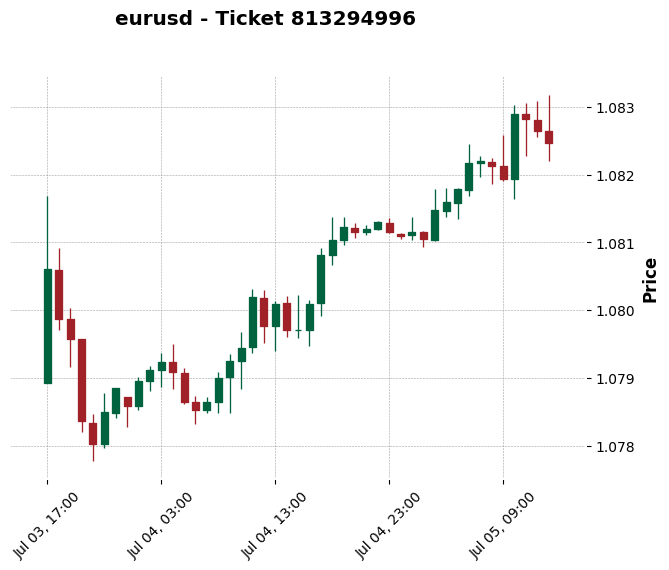

<Figure size 1200x600 with 0 Axes>

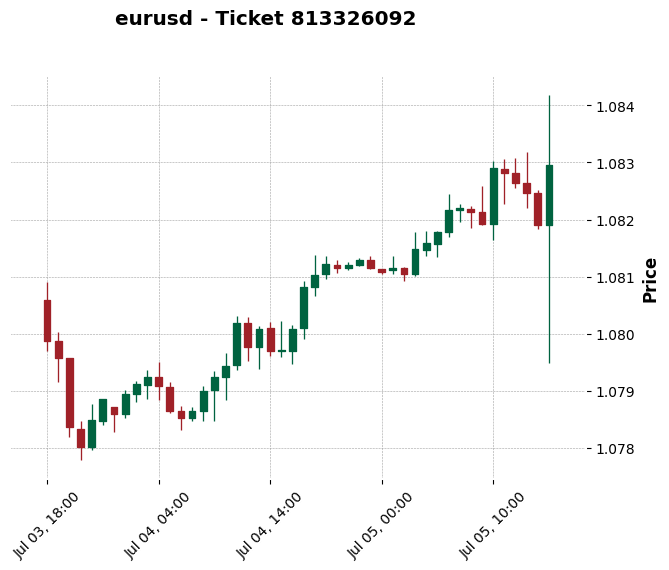

<Figure size 1200x600 with 0 Axes>

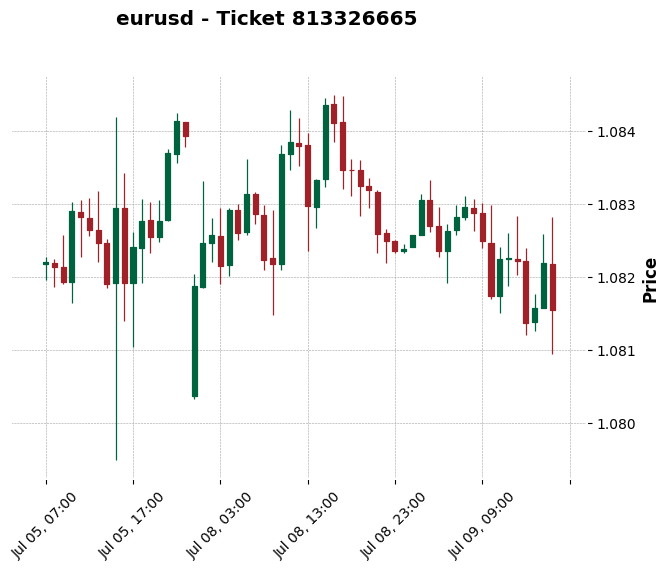

<Figure size 1200x600 with 0 Axes>

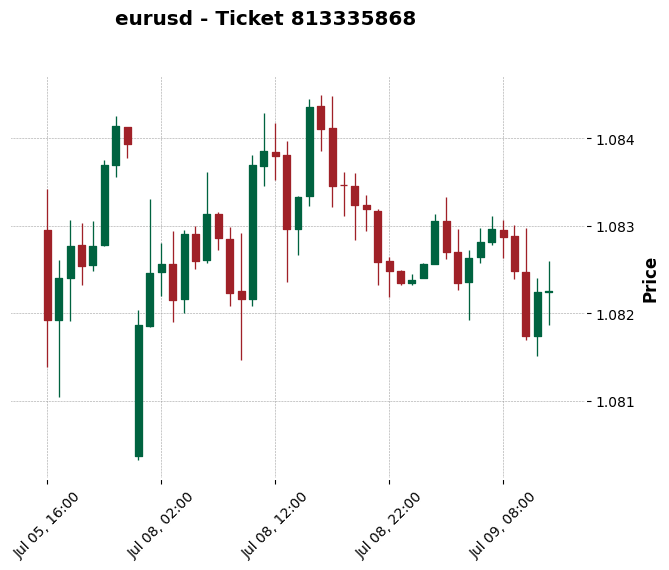

<Figure size 1200x600 with 0 Axes>

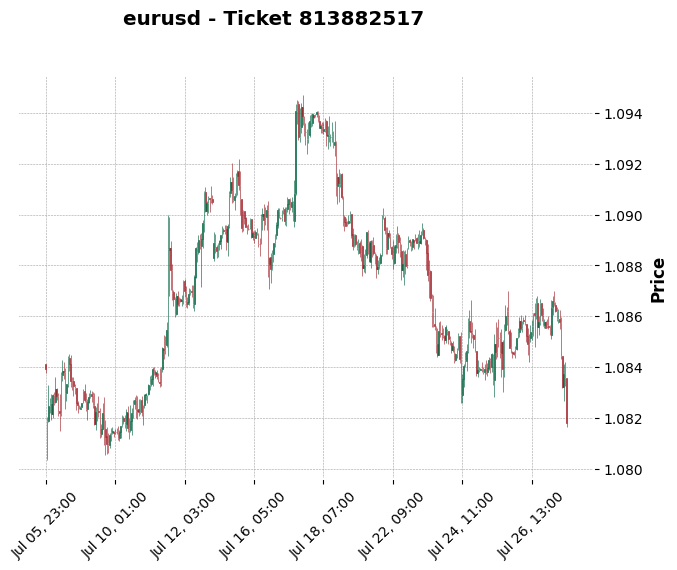

<Figure size 1200x600 with 0 Axes>

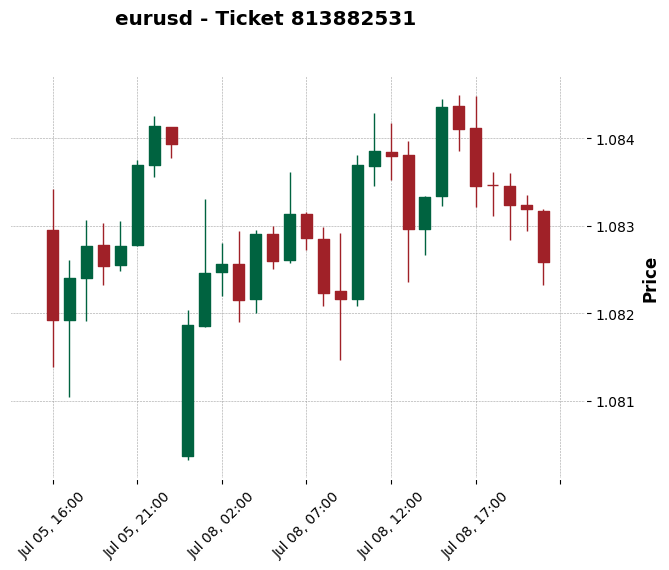

<Figure size 1200x600 with 0 Axes>

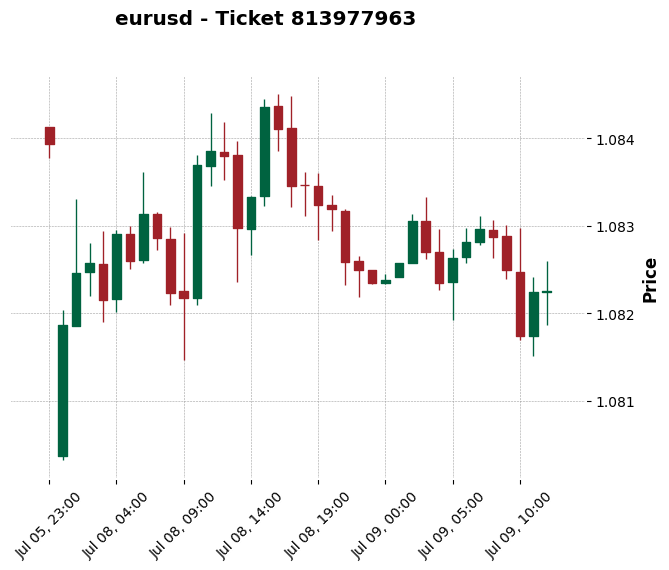

<Figure size 1200x600 with 0 Axes>

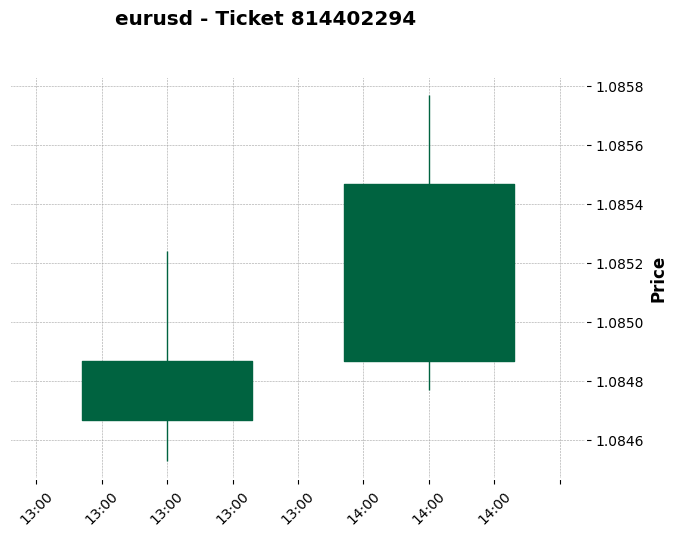

<Figure size 1200x600 with 0 Axes>

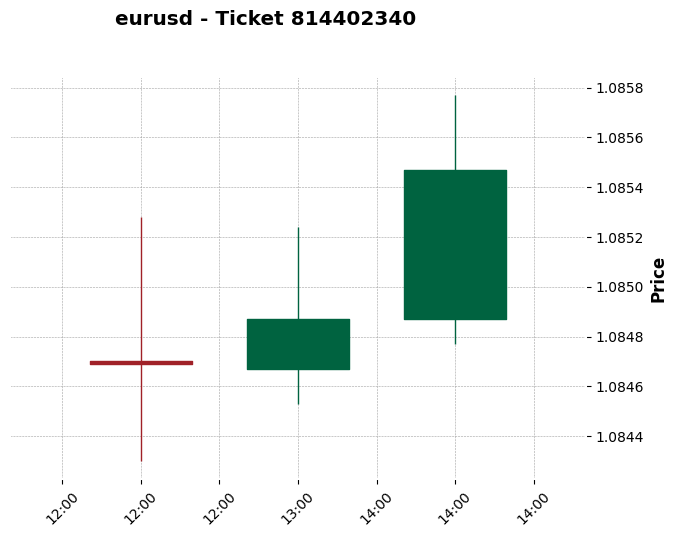

<Figure size 1200x600 with 0 Axes>

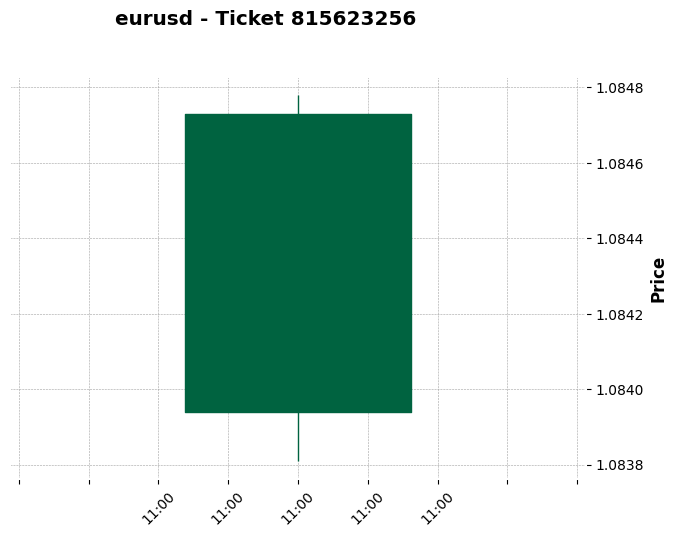

<Figure size 1200x600 with 0 Axes>

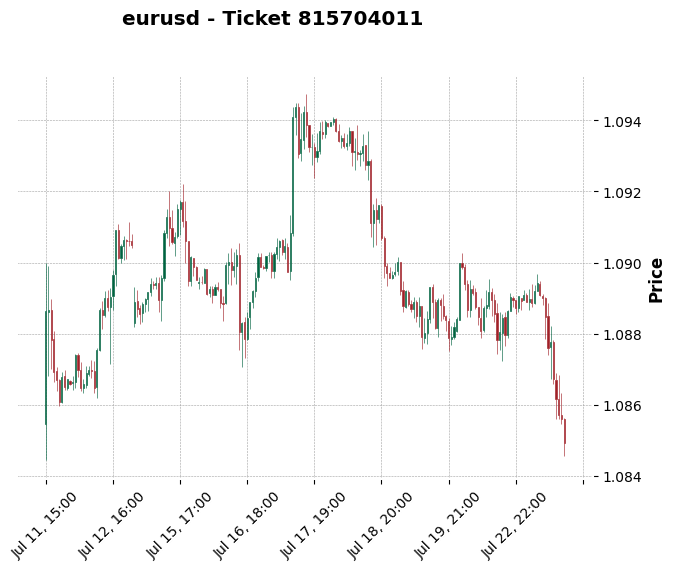

<Figure size 1200x600 with 0 Axes>

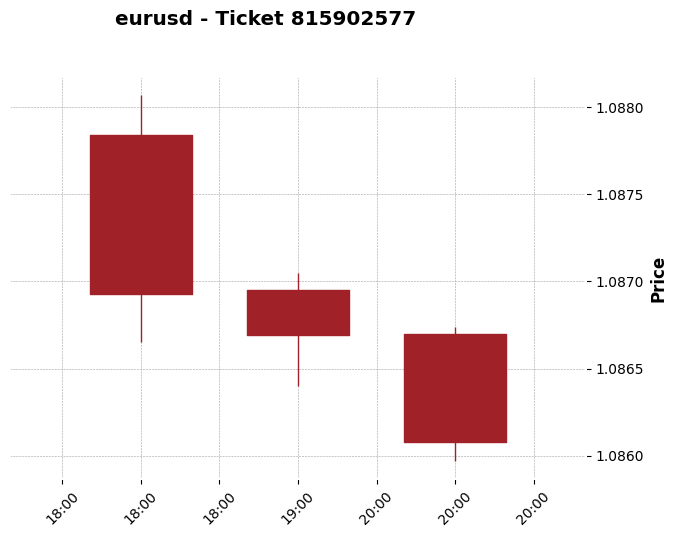

<Figure size 1200x600 with 0 Axes>

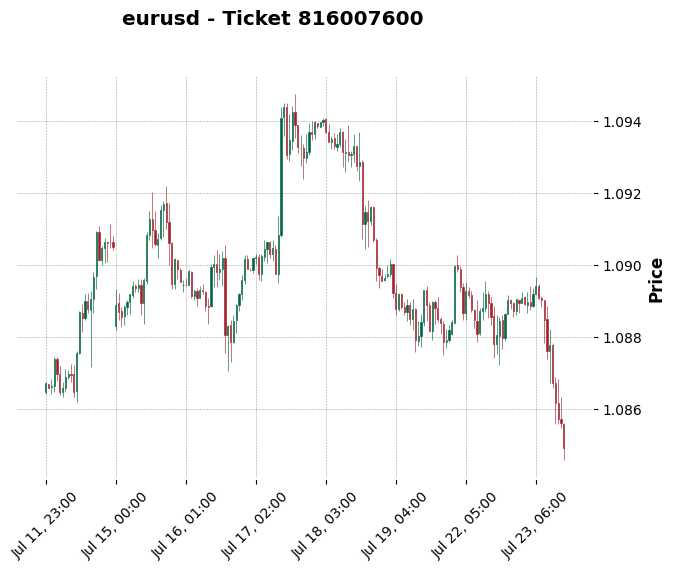

<Figure size 1200x600 with 0 Axes>

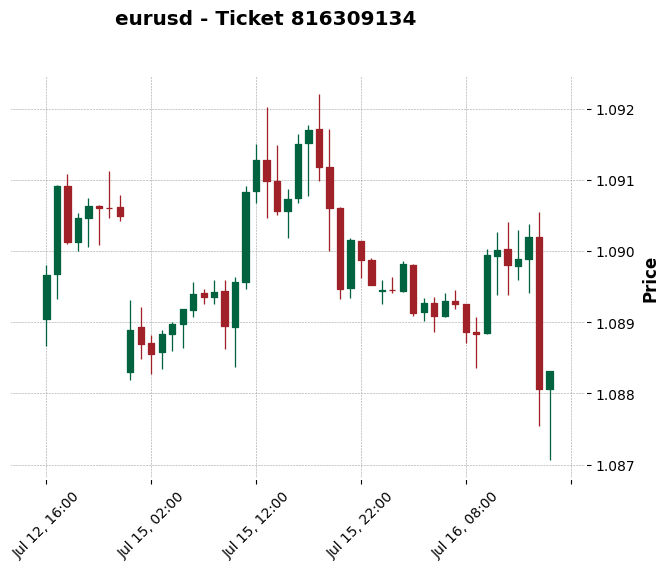

<Figure size 1200x600 with 0 Axes>

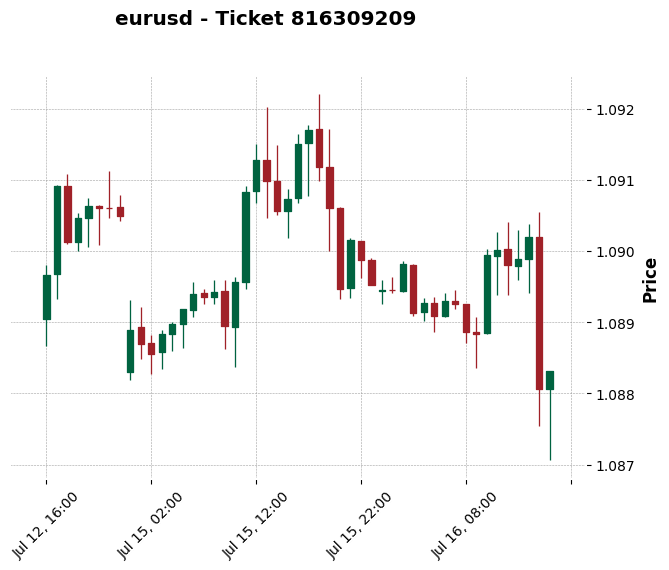

<Figure size 1200x600 with 0 Axes>

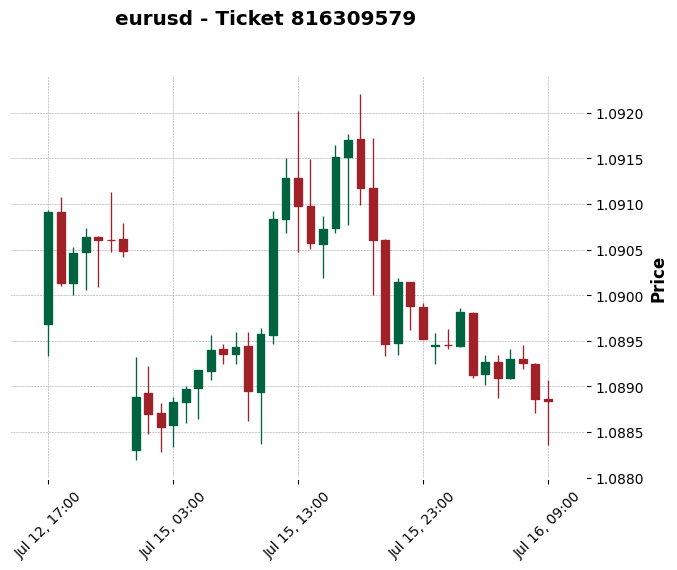

<Figure size 1200x600 with 0 Axes>

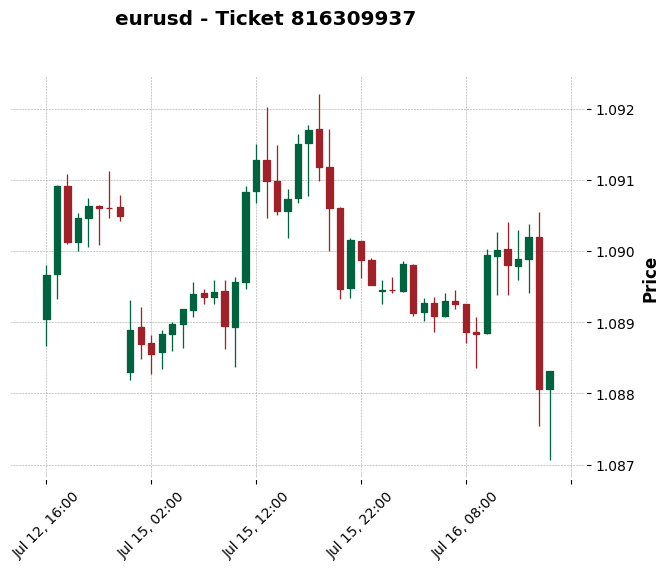

<Figure size 1200x600 with 0 Axes>

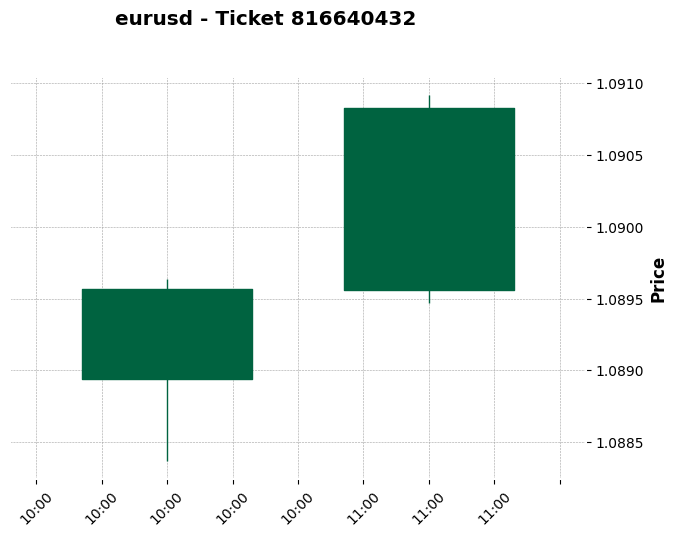

<Figure size 1200x600 with 0 Axes>

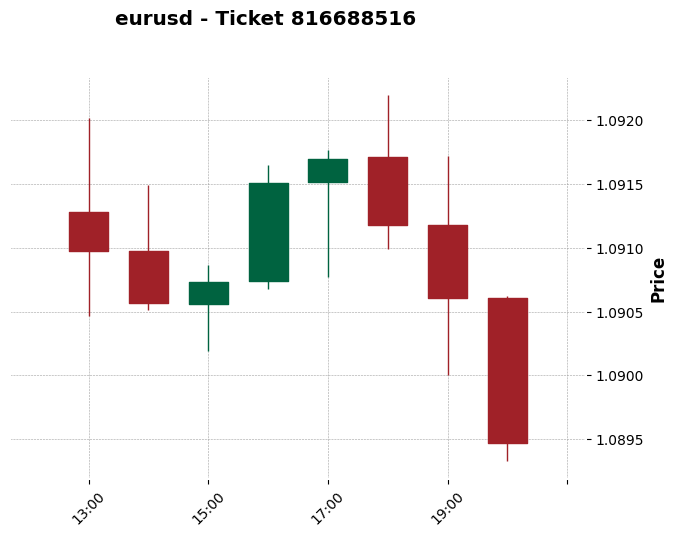

<Figure size 1200x600 with 0 Axes>

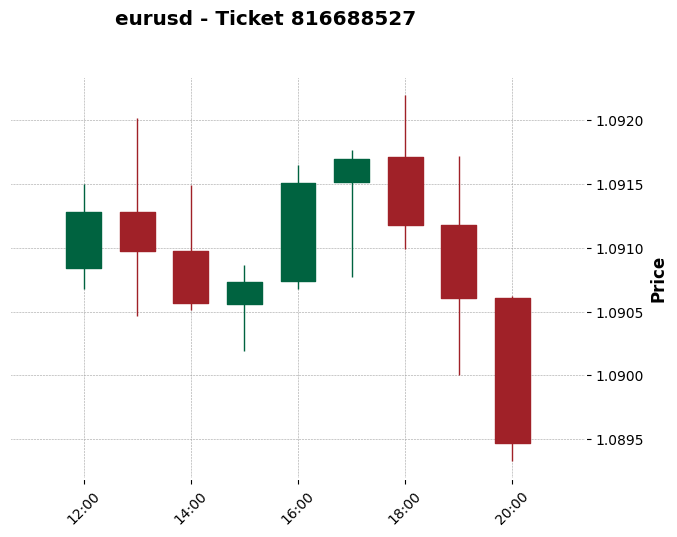

Нет данных котировок для сделки 817235256 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

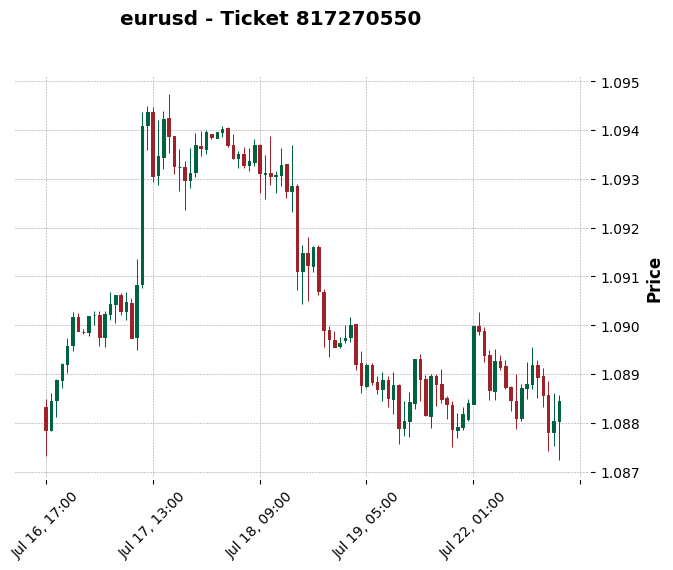

<Figure size 1200x600 with 0 Axes>

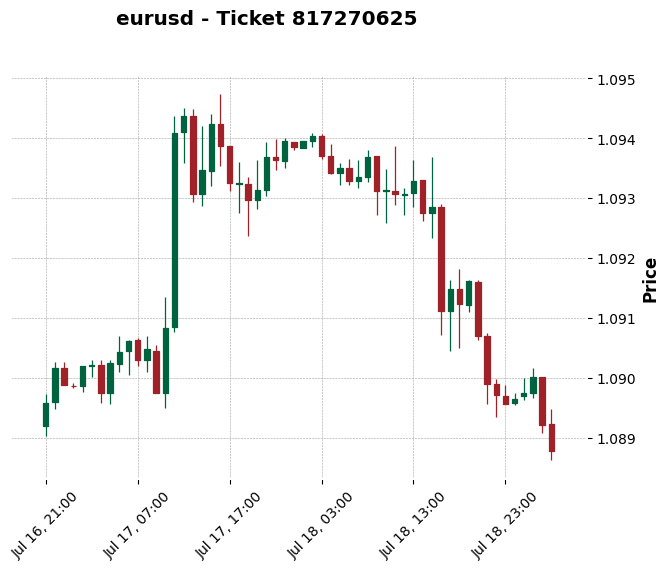

<Figure size 1200x600 with 0 Axes>

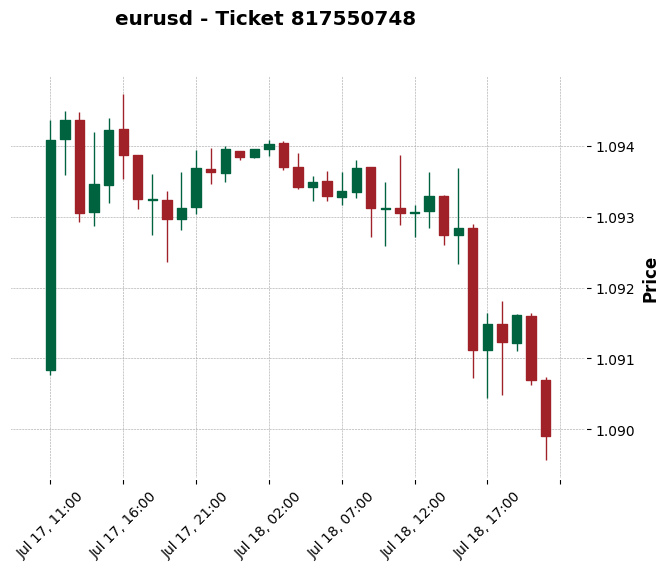

<Figure size 1200x600 with 0 Axes>

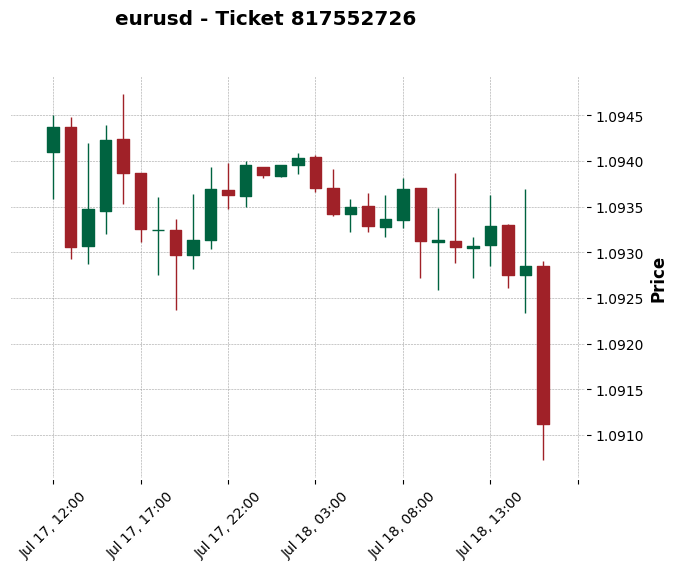

<Figure size 1200x600 with 0 Axes>

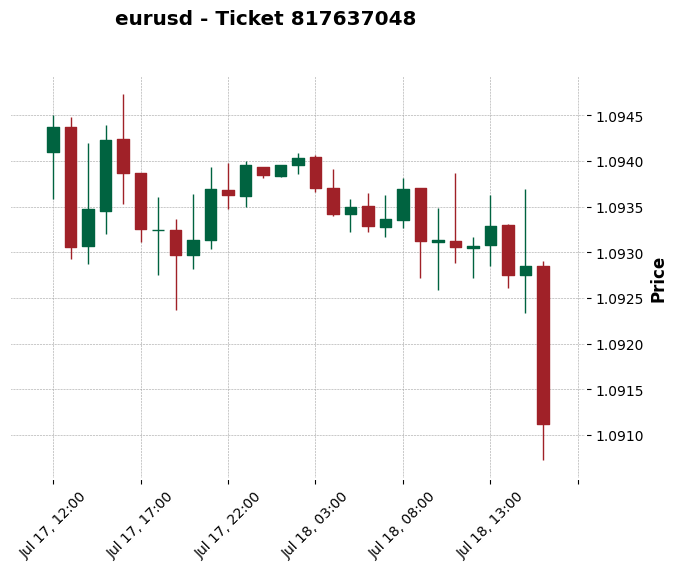

<Figure size 1200x600 with 0 Axes>

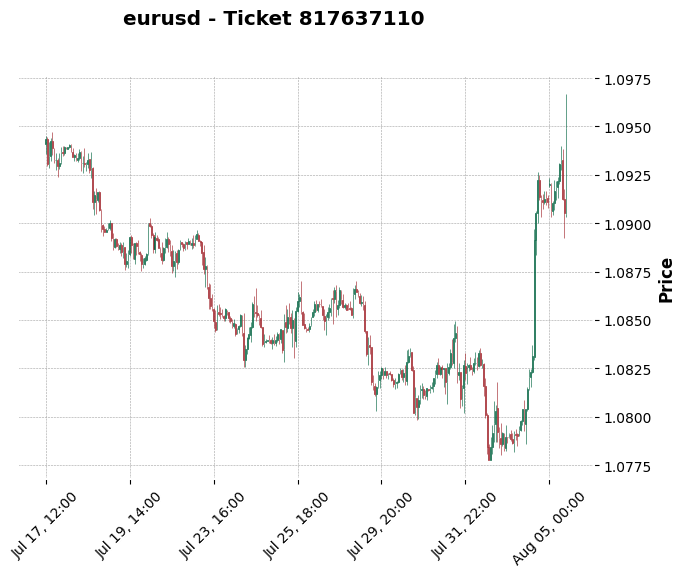

<Figure size 1200x600 with 0 Axes>

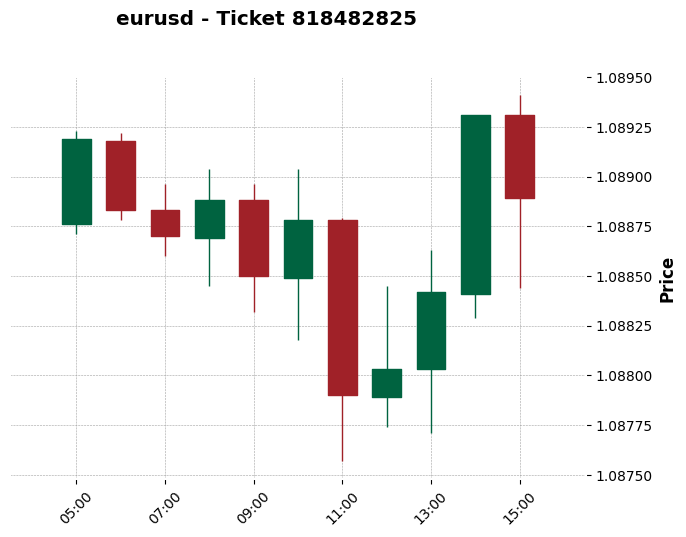

<Figure size 1200x600 with 0 Axes>

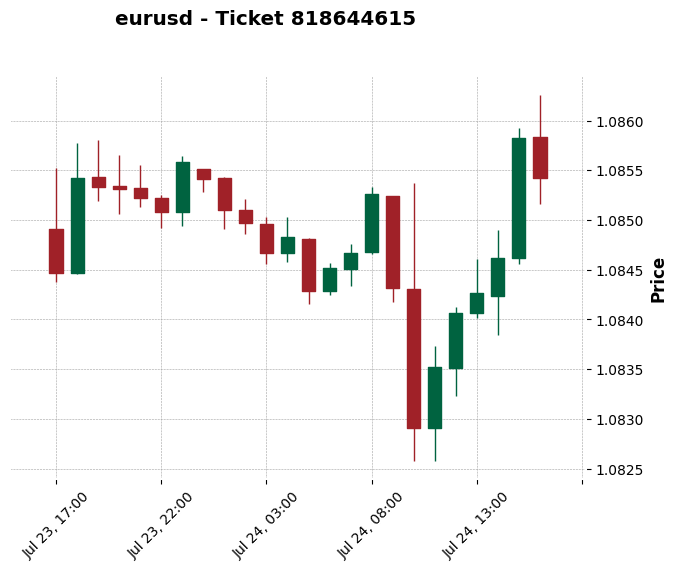

<Figure size 1200x600 with 0 Axes>

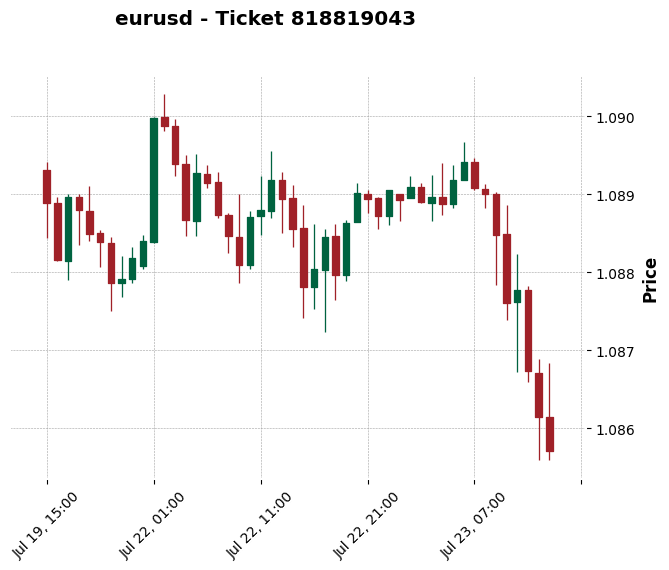

<Figure size 1200x600 with 0 Axes>

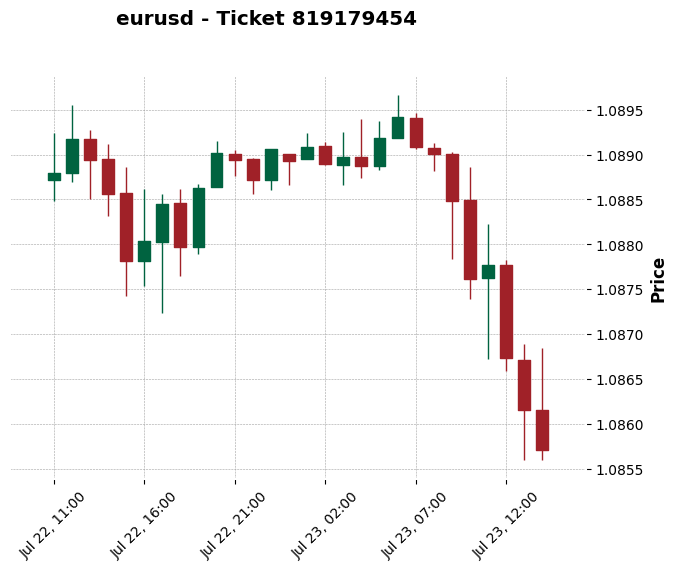

<Figure size 1200x600 with 0 Axes>

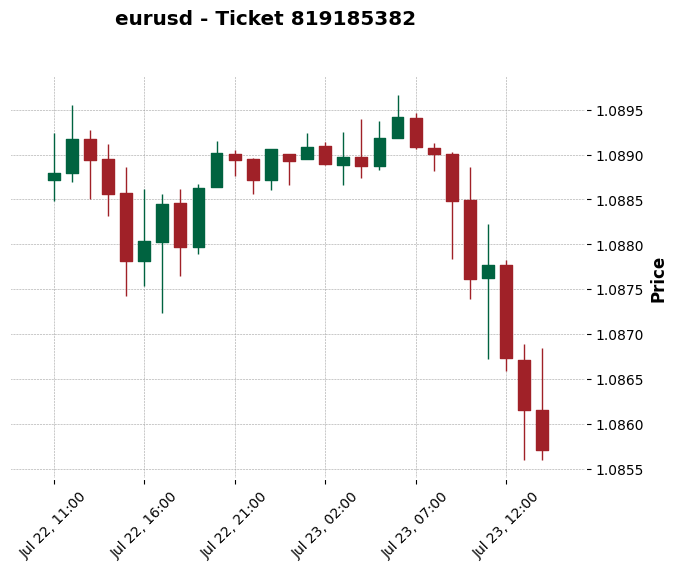

<Figure size 1200x600 with 0 Axes>

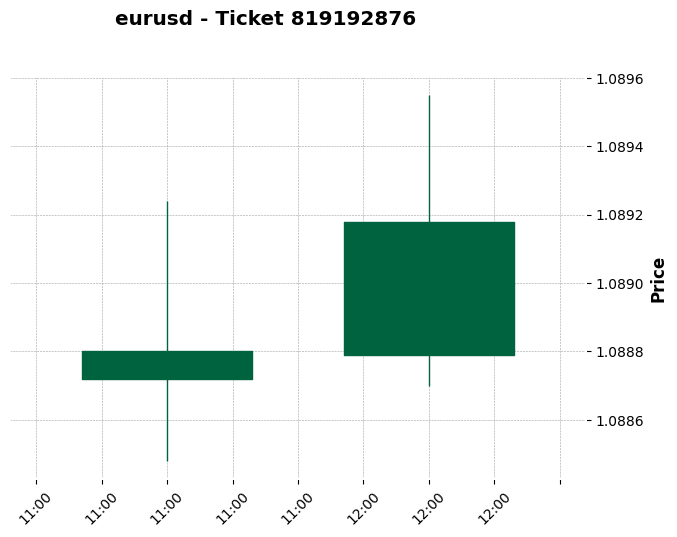

<Figure size 1200x600 with 0 Axes>

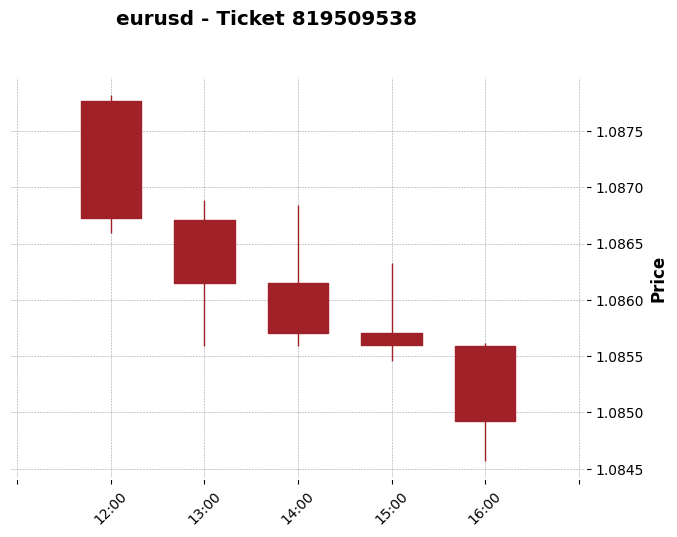

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

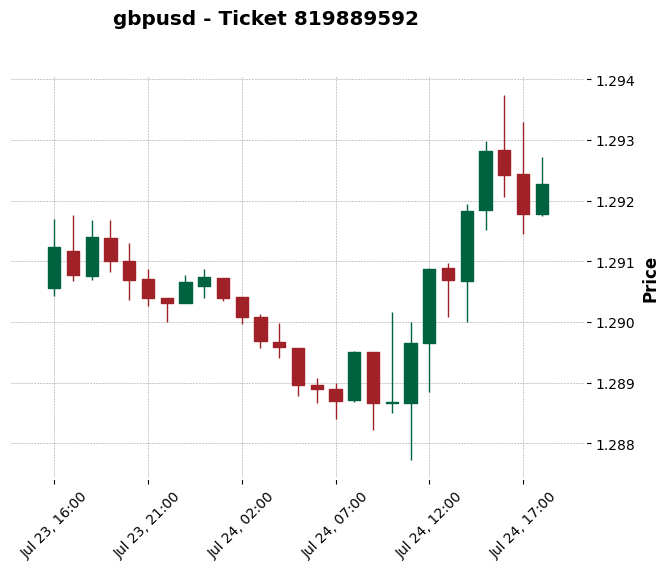

<Figure size 1200x600 with 0 Axes>

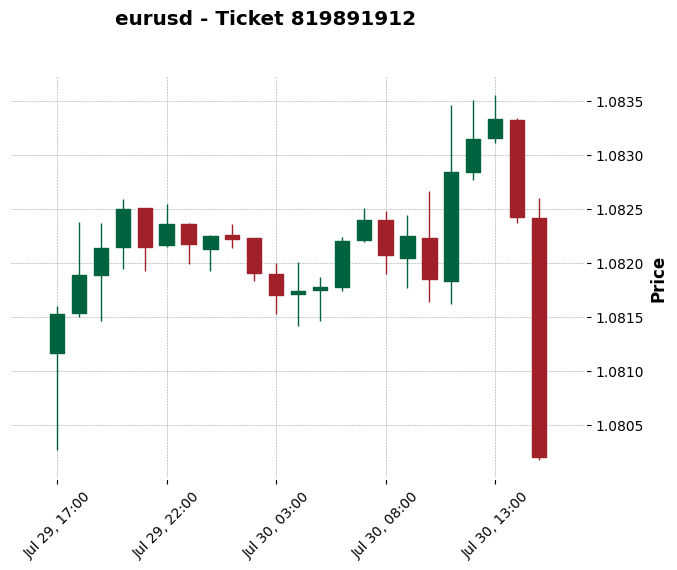

<Figure size 1200x600 with 0 Axes>

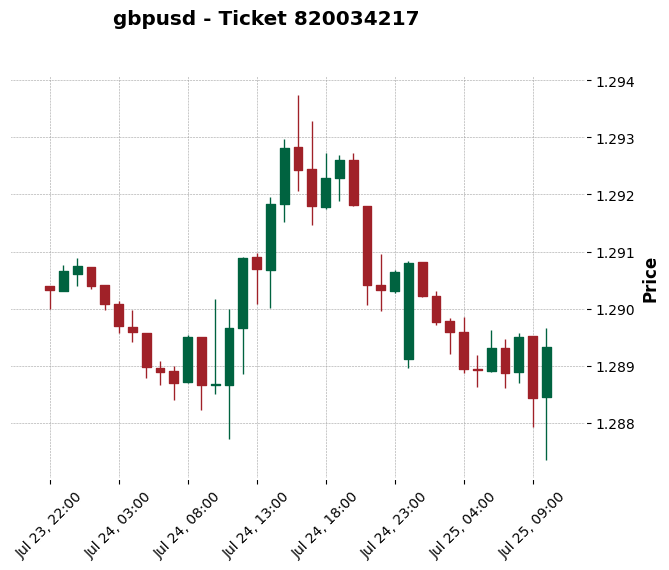

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

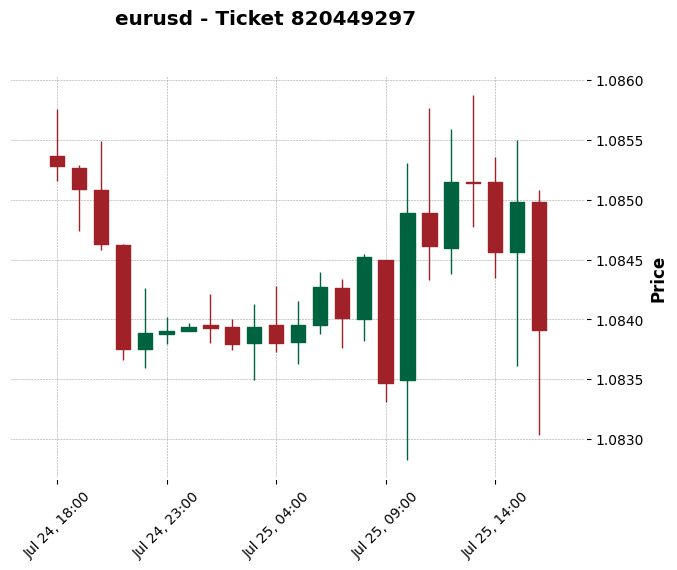

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

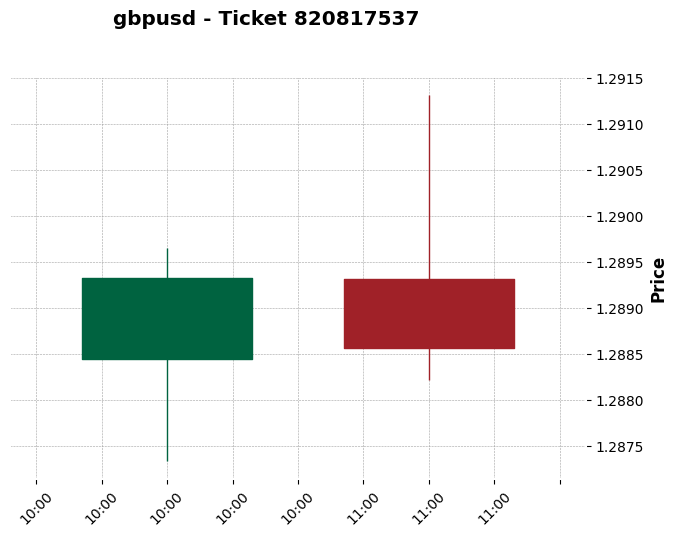

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

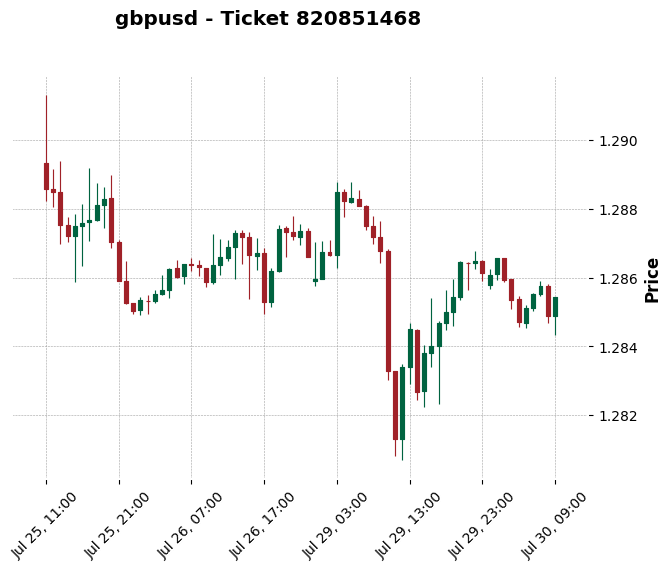

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

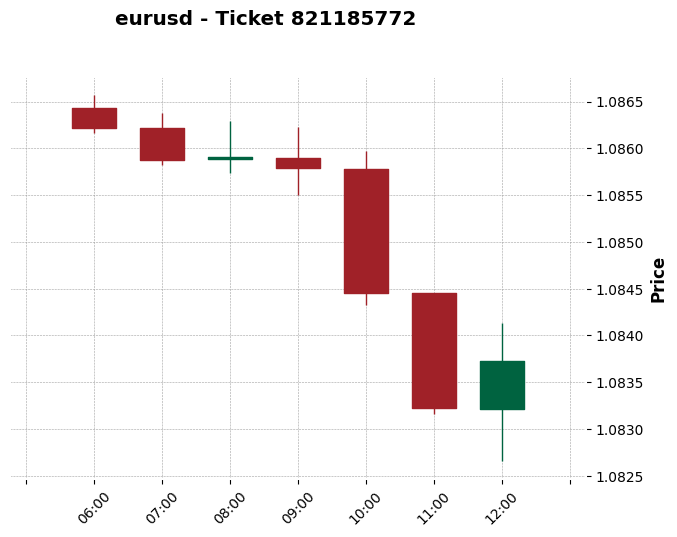

<Figure size 1200x600 with 0 Axes>

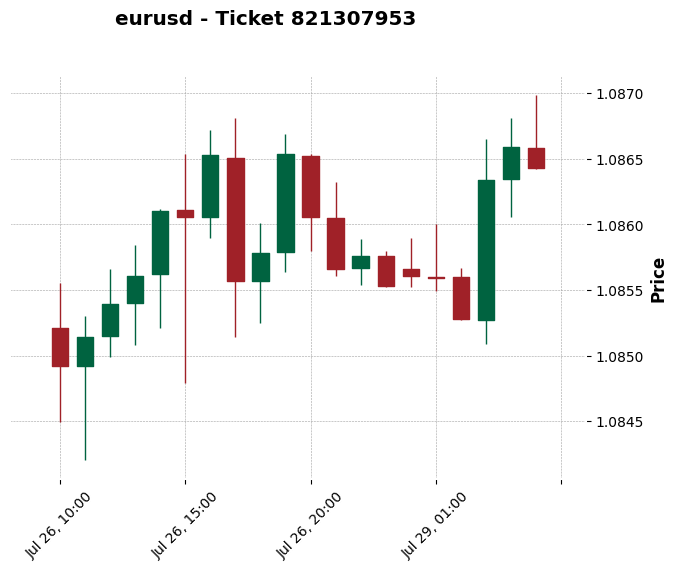

<Figure size 1200x600 with 0 Axes>

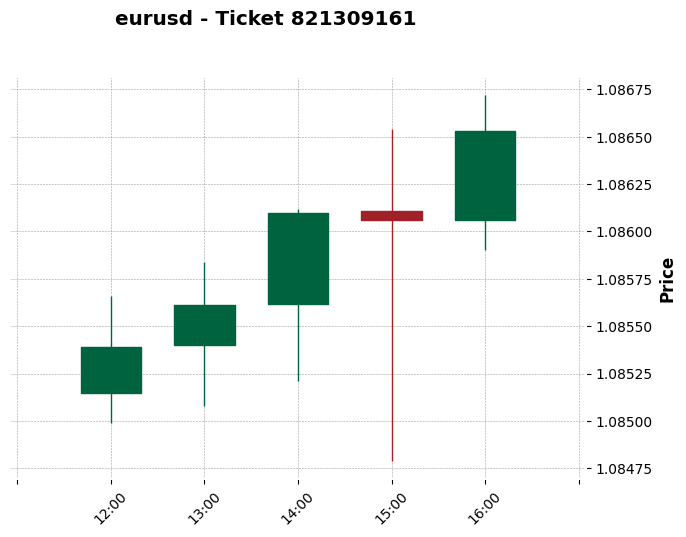

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

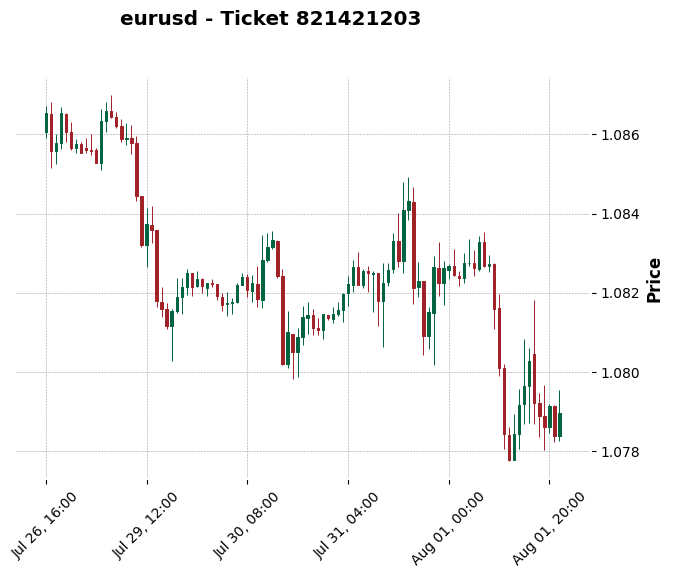

Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

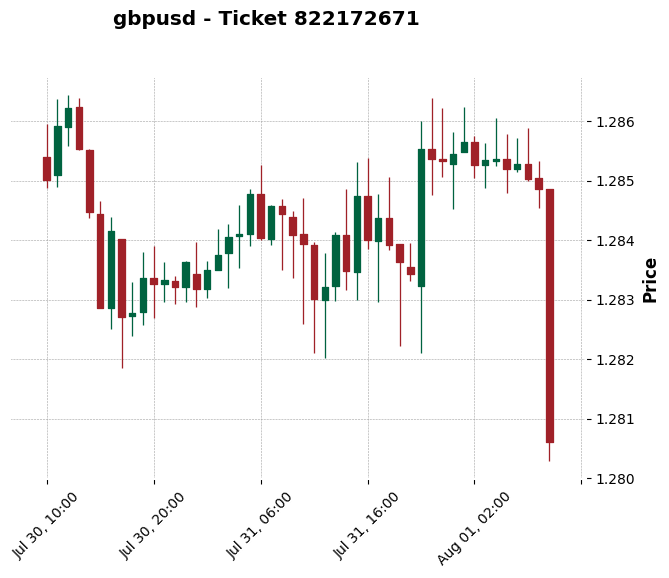

Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

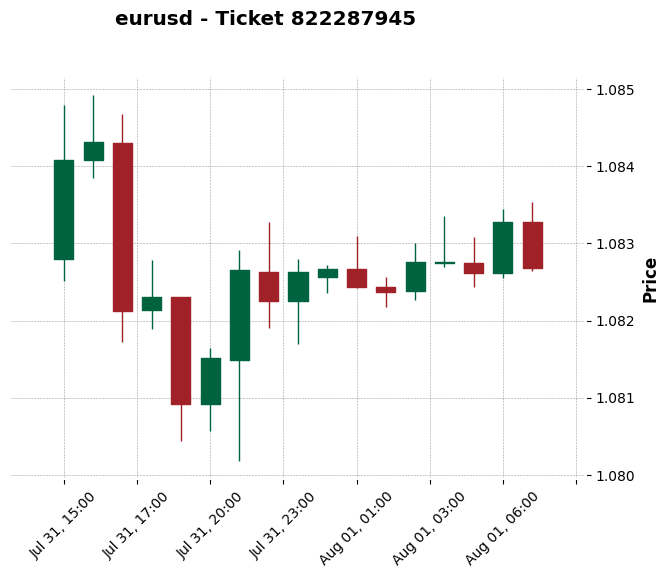

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

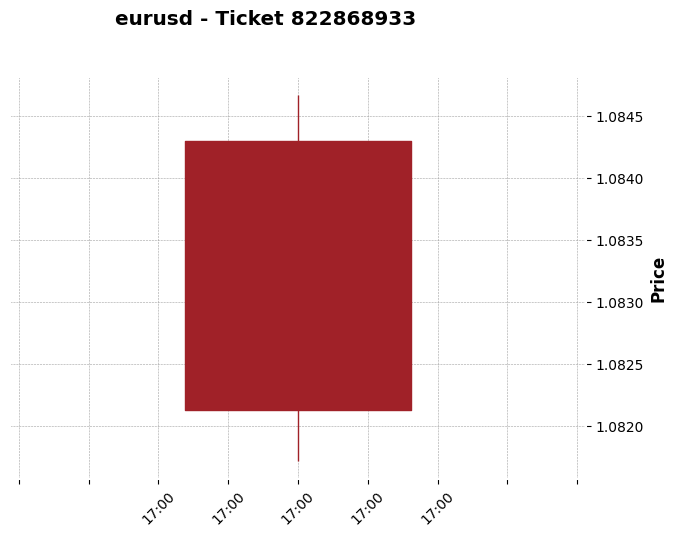

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

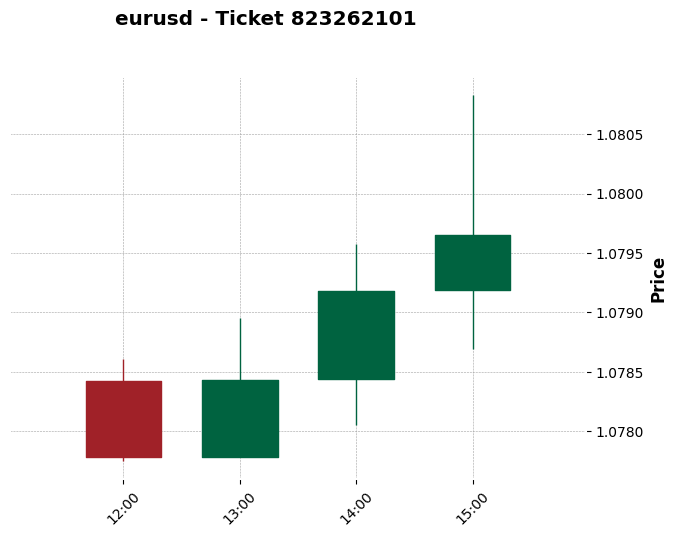

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

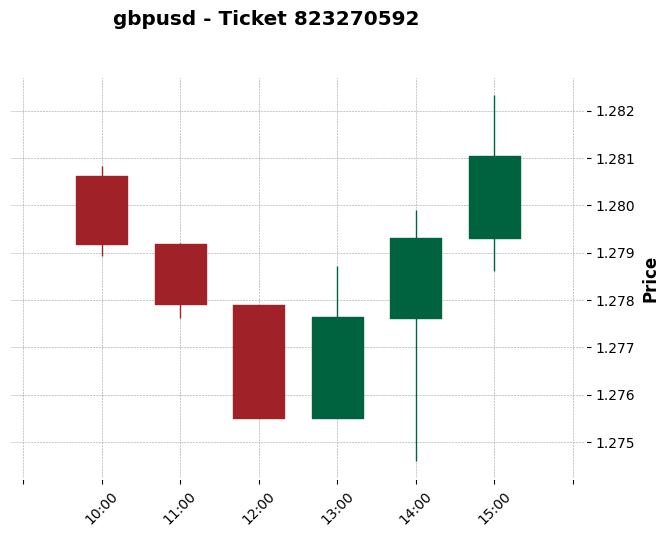

<Figure size 1200x600 with 0 Axes>

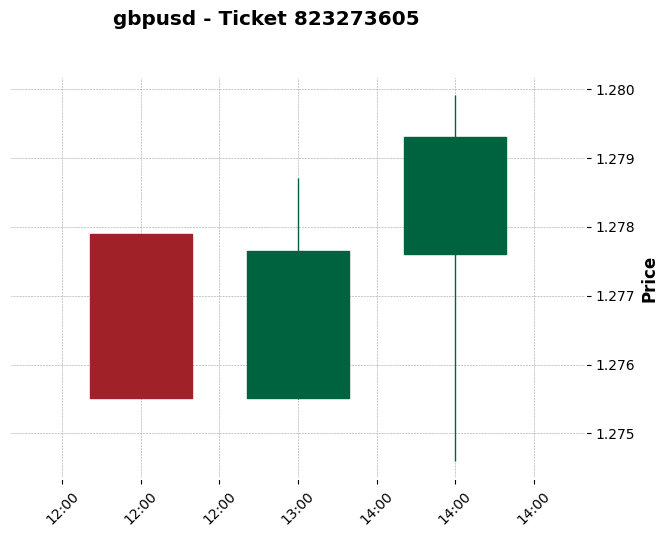

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

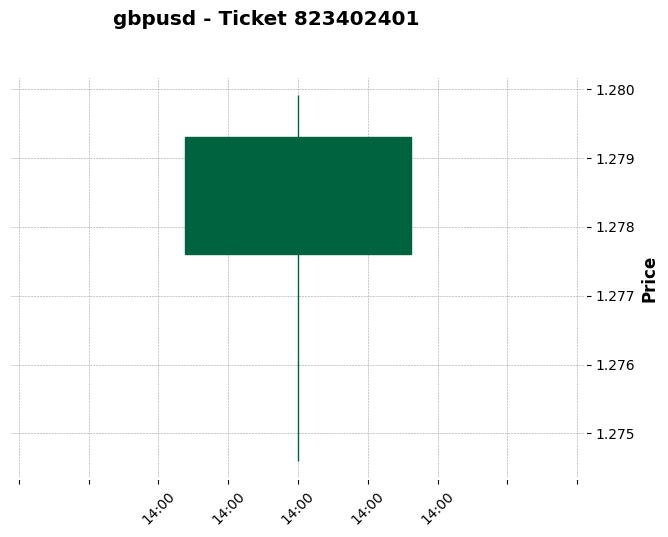

<Figure size 1200x600 with 0 Axes>

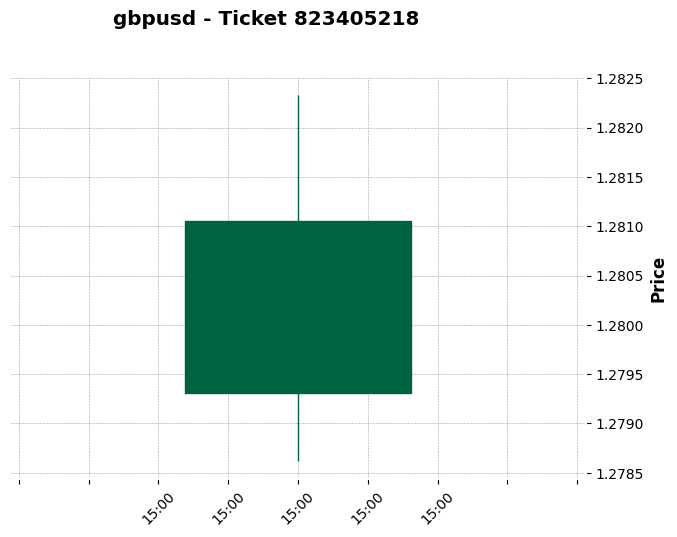

<Figure size 1200x600 with 0 Axes>

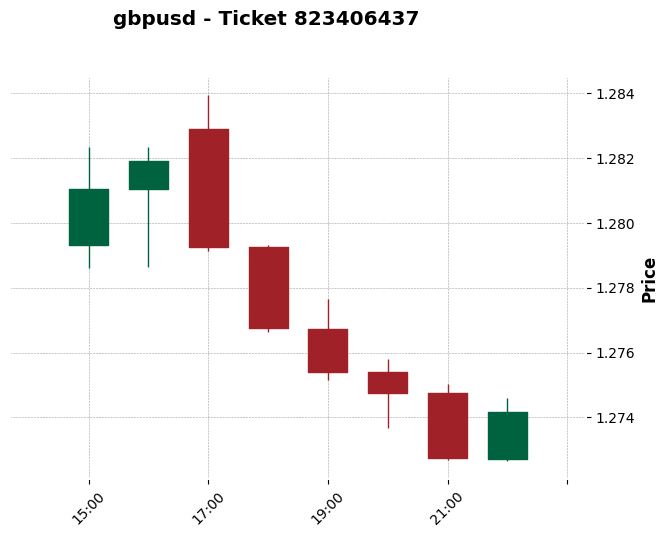

<Figure size 1200x600 with 0 Axes>

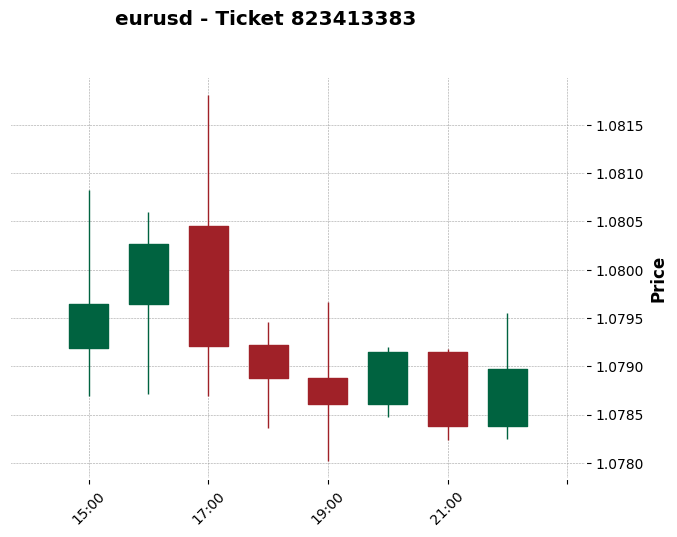

<Figure size 1200x600 with 0 Axes>

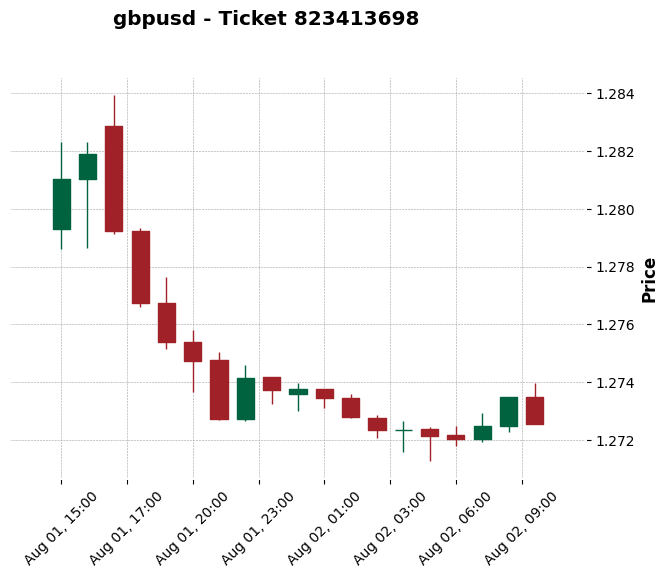

<Figure size 1200x600 with 0 Axes>

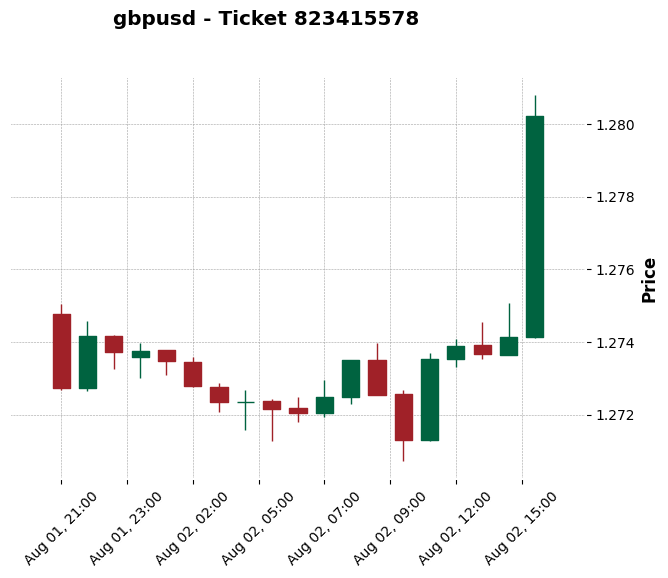

<Figure size 1200x600 with 0 Axes>

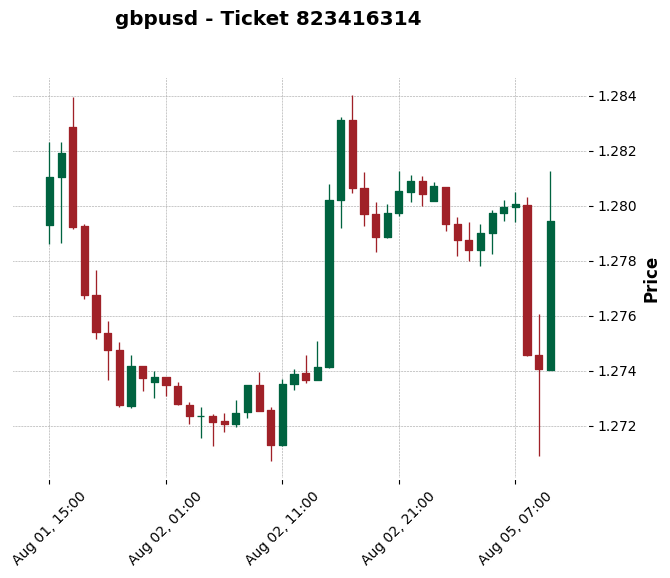

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

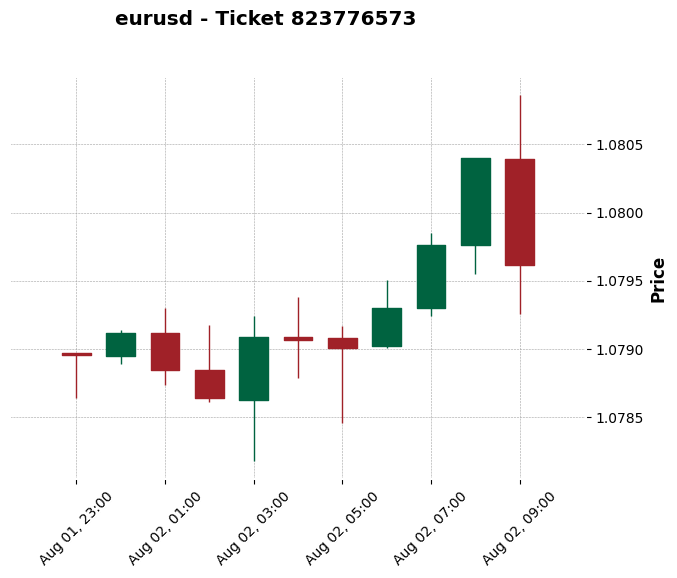

Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

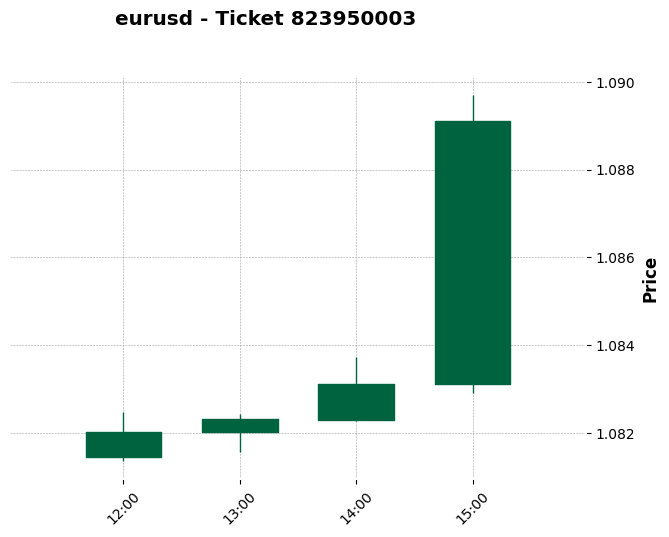

Нет данных котировок для сделки 823950168 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

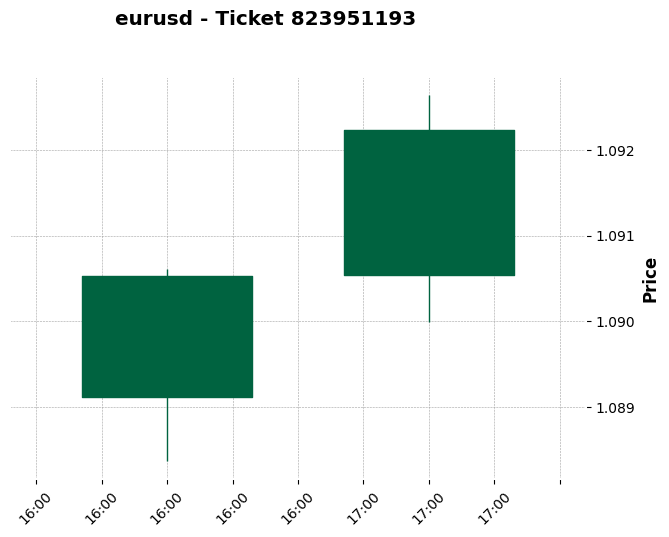

<Figure size 1200x600 with 0 Axes>

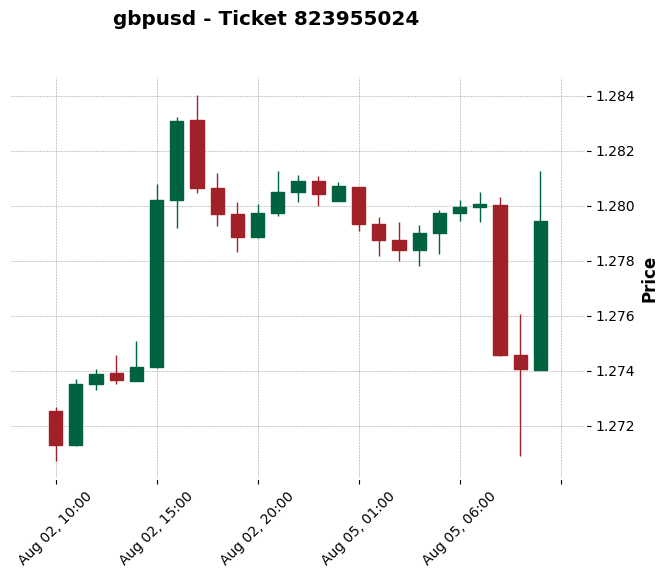

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

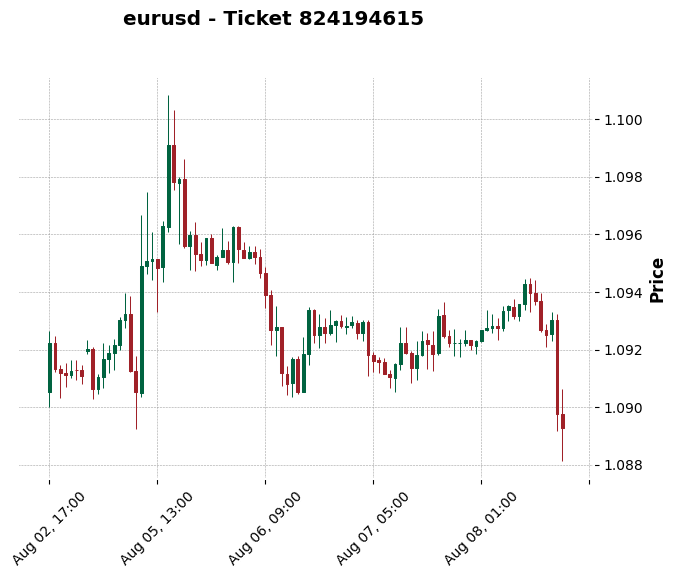

<Figure size 1200x600 with 0 Axes>

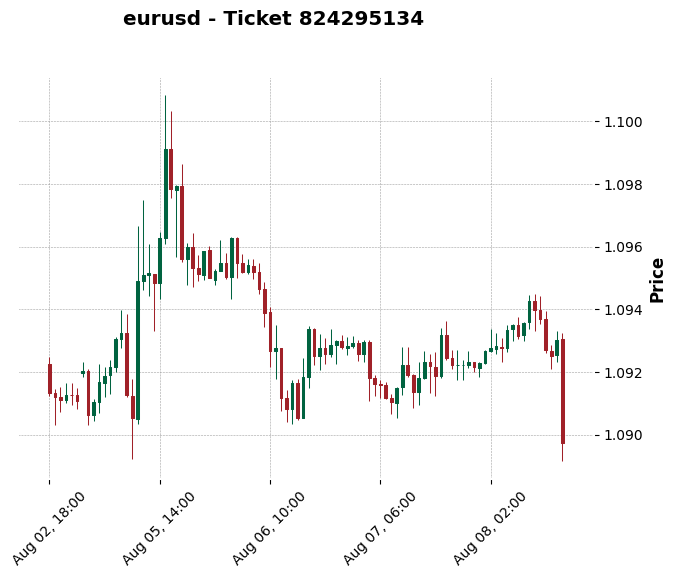

<Figure size 1200x600 with 0 Axes>

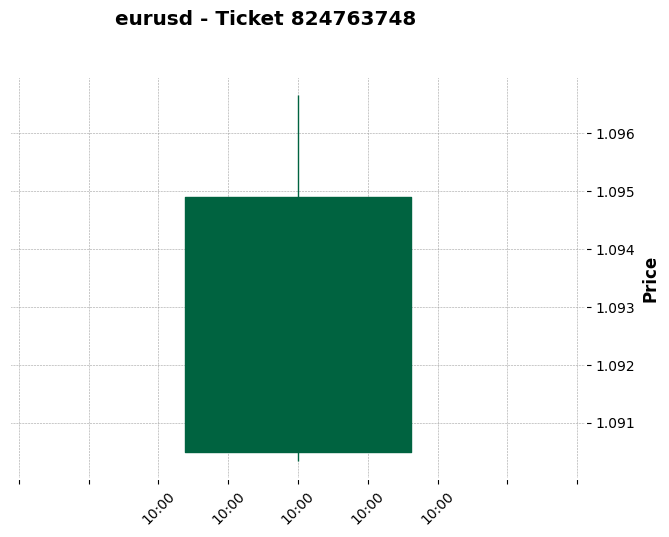

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

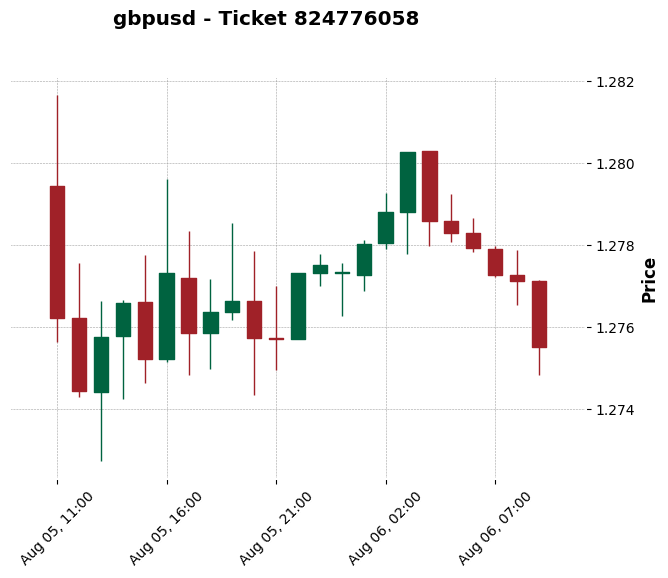

<Figure size 1200x600 with 0 Axes>

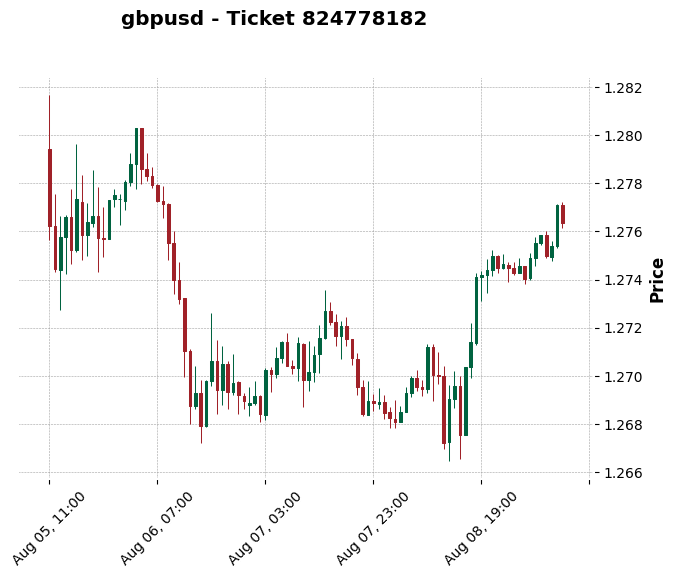

<Figure size 1200x600 with 0 Axes>

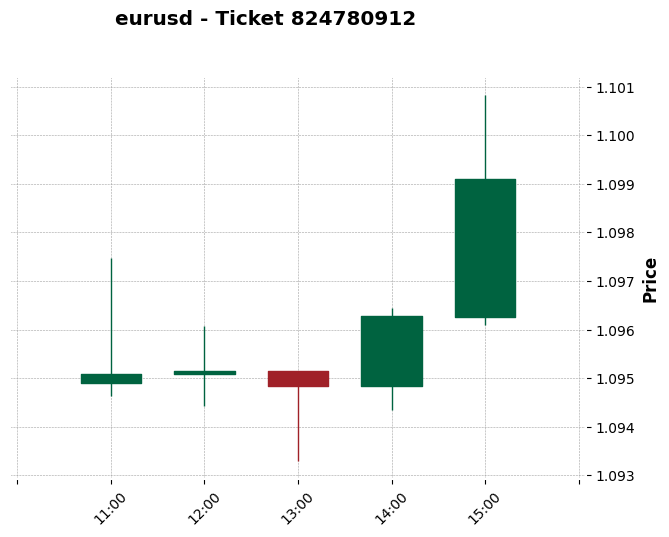

<Figure size 1200x600 with 0 Axes>

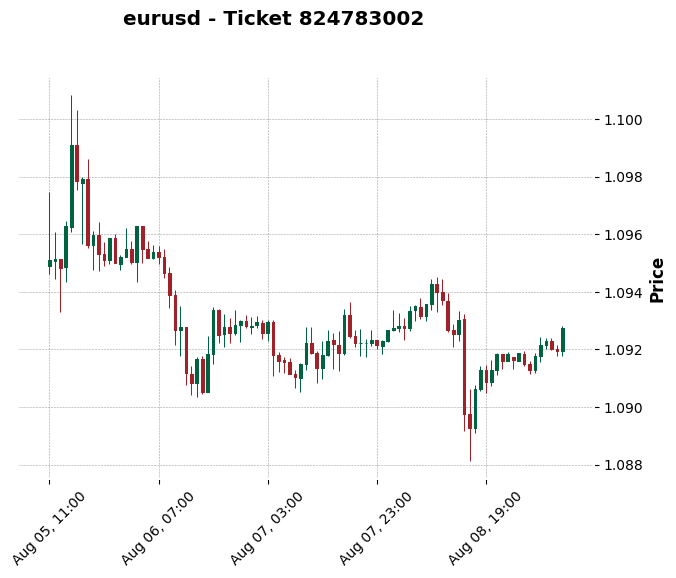

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

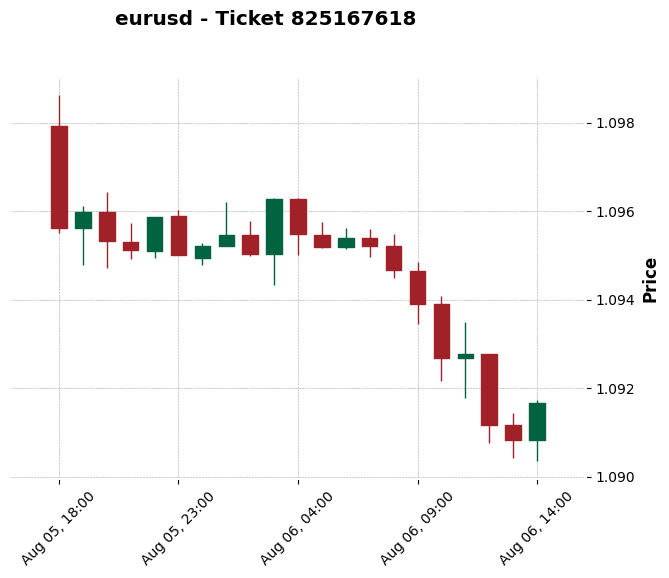

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

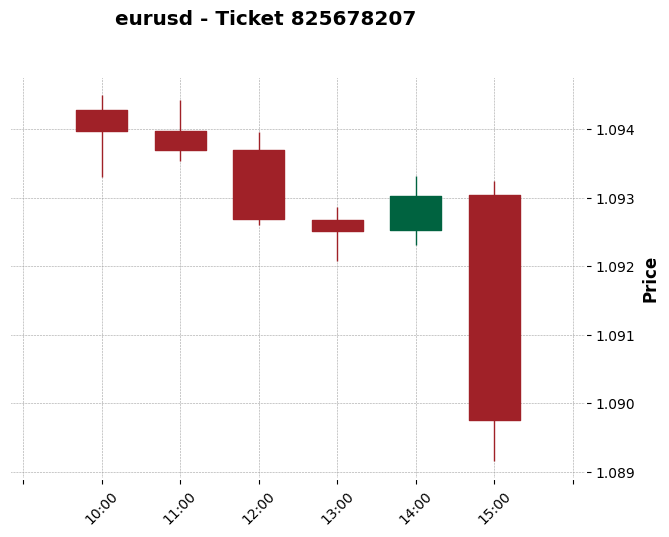

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

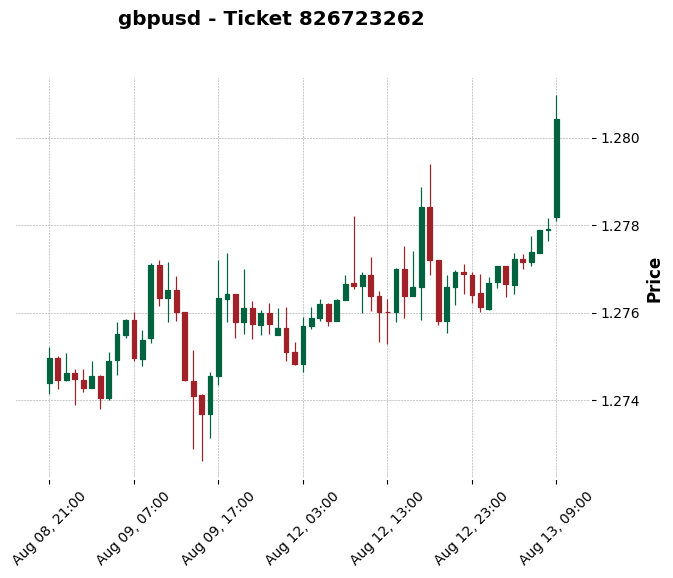

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

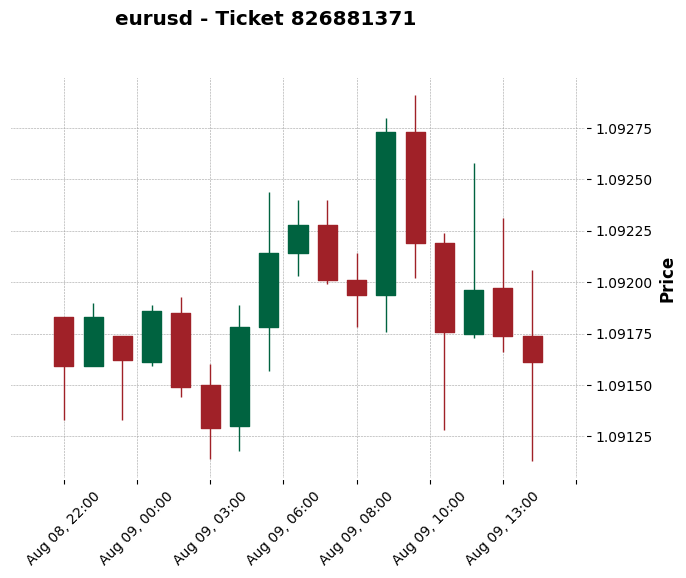

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

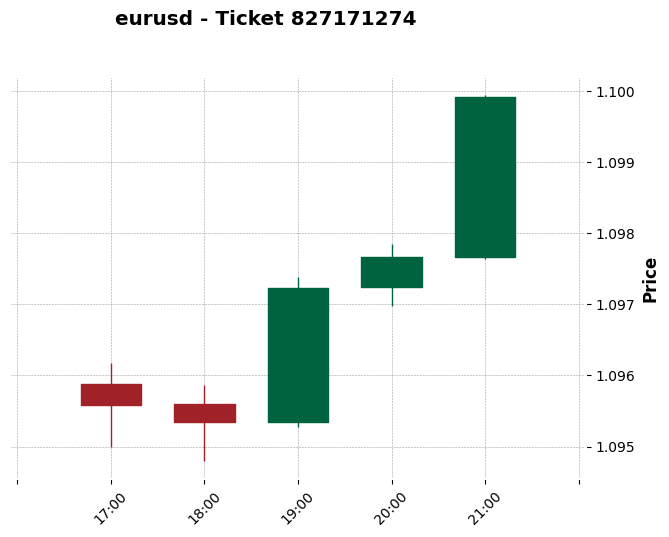

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

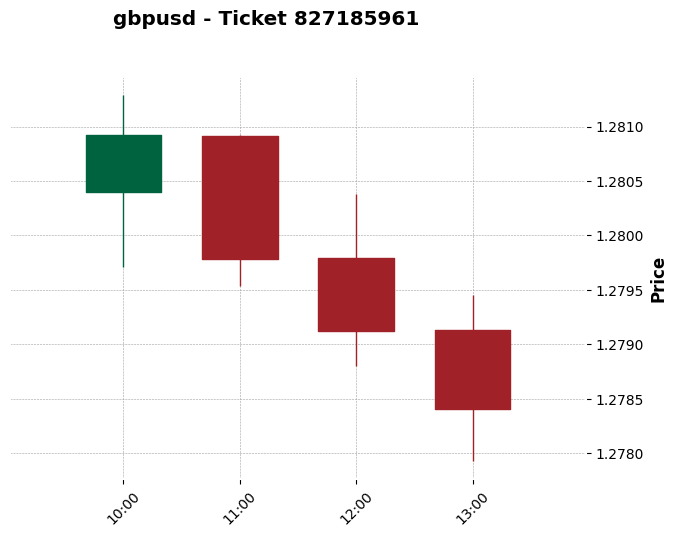

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

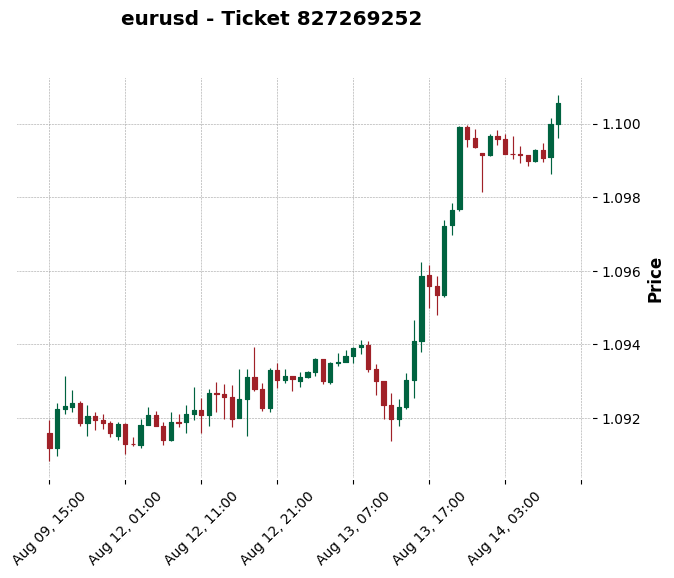

Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

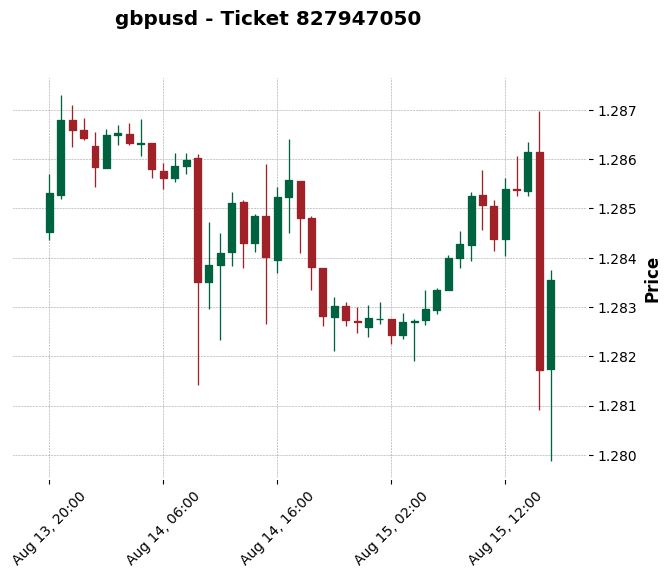

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.


<Figure size 1200x600 with 0 Axes>

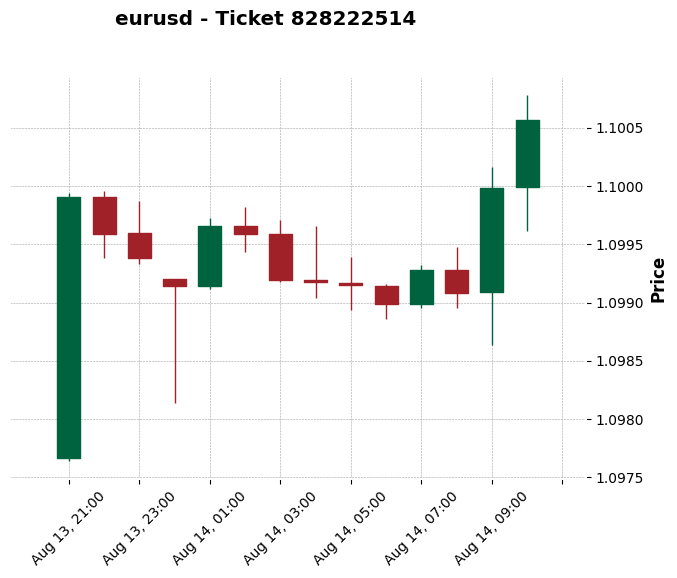

<Figure size 1200x600 with 0 Axes>

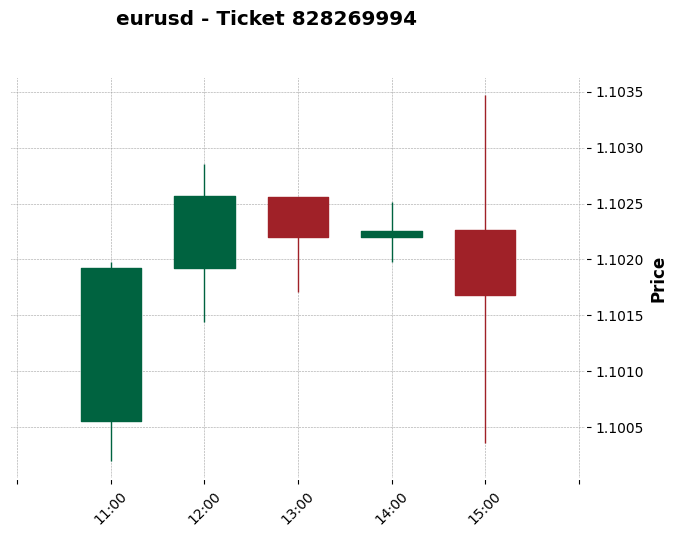

<Figure size 1200x600 with 0 Axes>

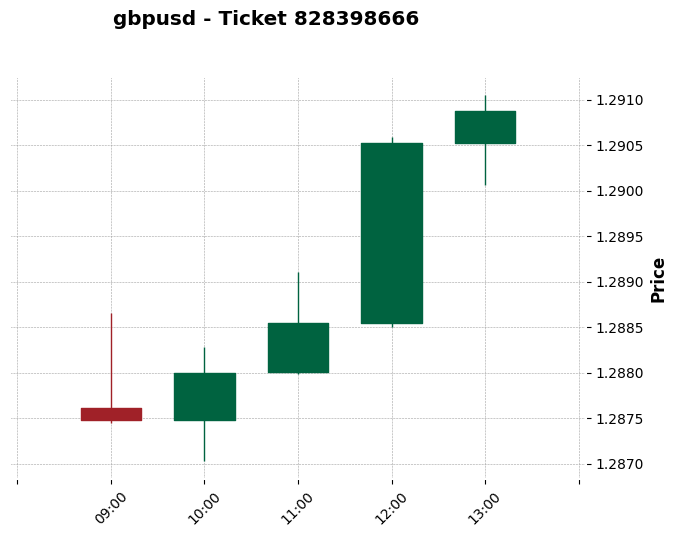

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

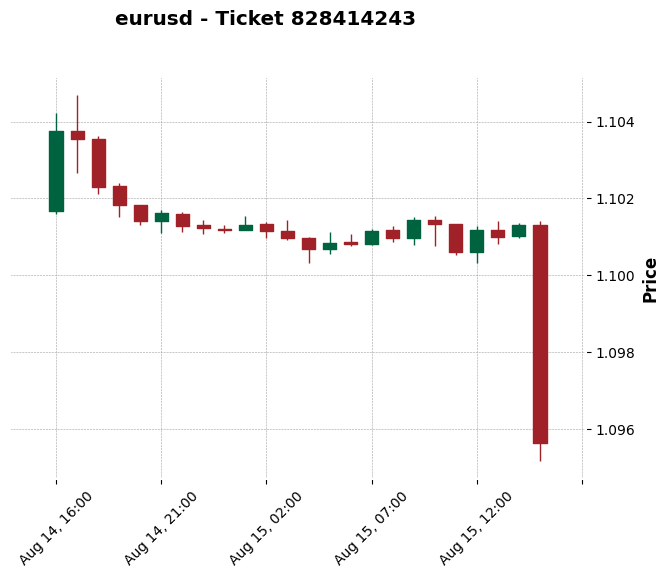

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Нет данных котировок для сделки 828944569 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

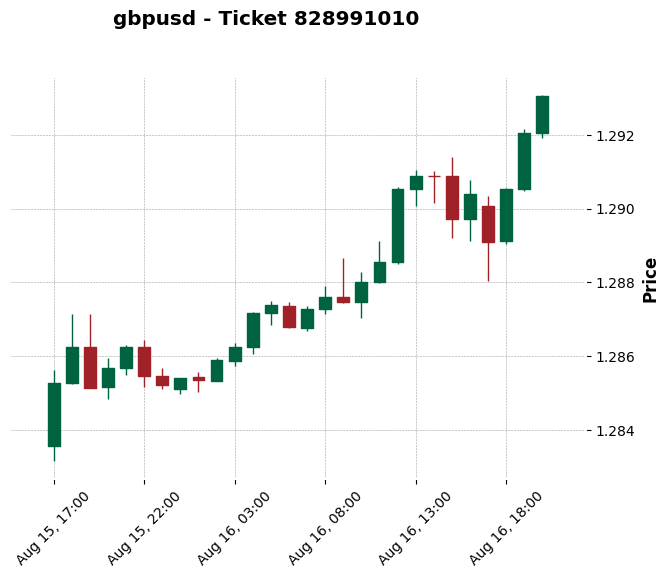

<Figure size 1200x600 with 0 Axes>

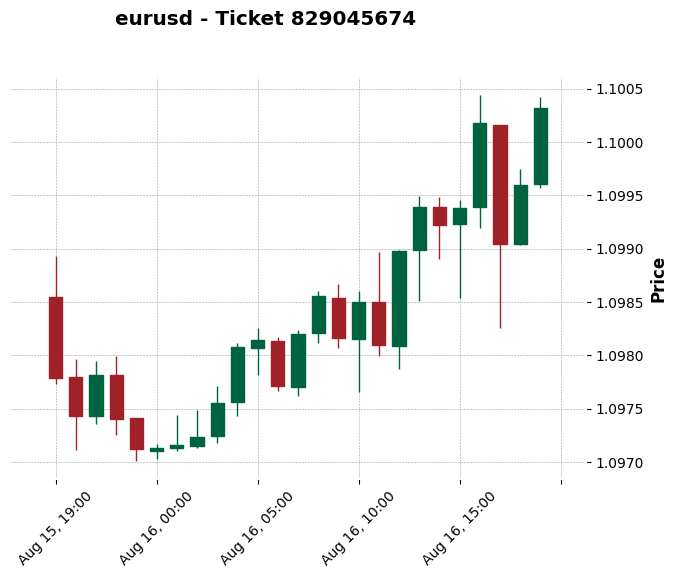

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Нет данных котировок для сделки 829254836 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

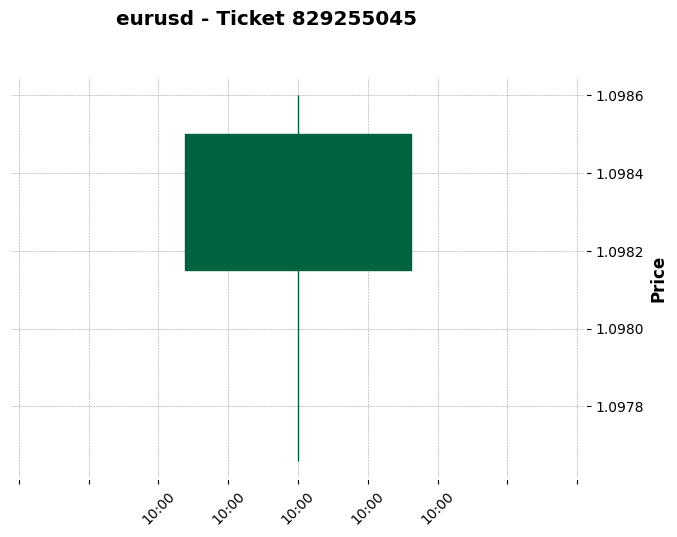

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Нет данных котировок для сделки 829559910 в заданном интервале.
Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price',
                     volume=False)

            # Добавление меток на график
            plt.axvline(x=row['Open Time'], color='green', linestyle='--', label='Open')
            plt.axvline(x=row['Close Time'], color='red', linestyle='--', label='Close')
            plt.text(row['Open Time'], selected_data['High'].max(), 'Open', color='green', fontsize=12, verticalalignment='bottom')
            plt.text(row['Close Time'], selected_data['Low'].min(), 'Close', color='red', fontsize=12, verticalalignment='top')
            plt.text(row['Close Time'], selected_data['Low'].min() - 0.001, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='top')

            # Легенда и форматирование
            plt.legend()
            plt.grid(True)

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

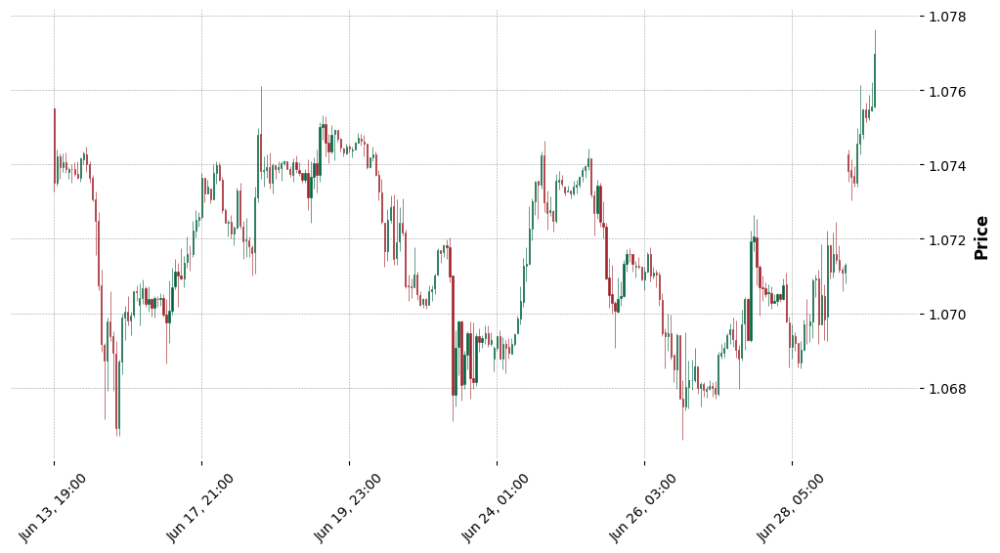

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles', ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price')

            # Добавление меток на график
            ax.annotate('Open', xy=(row['Open Time'], row['Price']), xytext=(row['Open Time'], row['Price'] + 0.001),
                        arrowprops=dict(facecolor='green', shrink=0.05),
                        fontsize=12, color='green')

            ax.annotate('Close', xy=(row['Close Time'], row['Price.1']), xytext=(row['Close Time'], row['Price.1'] + 0.001),
                        arrowprops=dict(facecolor='red', shrink=0.05),
                        fontsize=12, color='red')

            ax.text(row['Close Time'], row['Price.1'] + 0.0015, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<Figure size 1200x600 with 0 Axes>

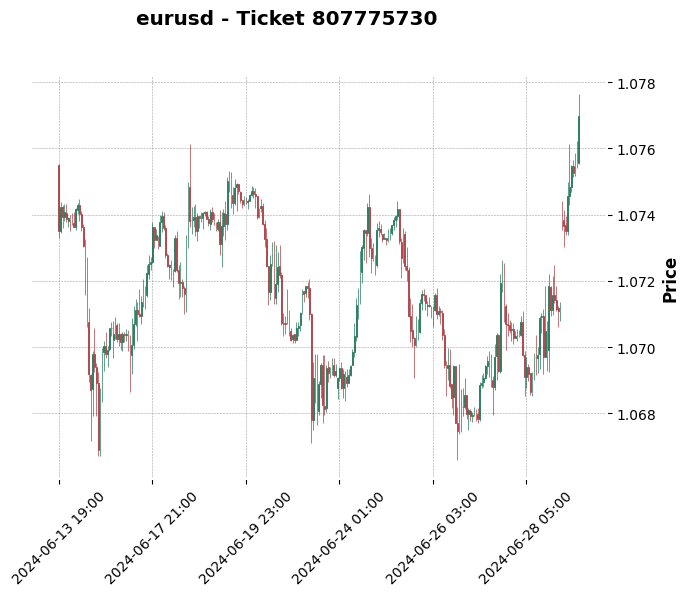

<Figure size 1200x600 with 0 Axes>

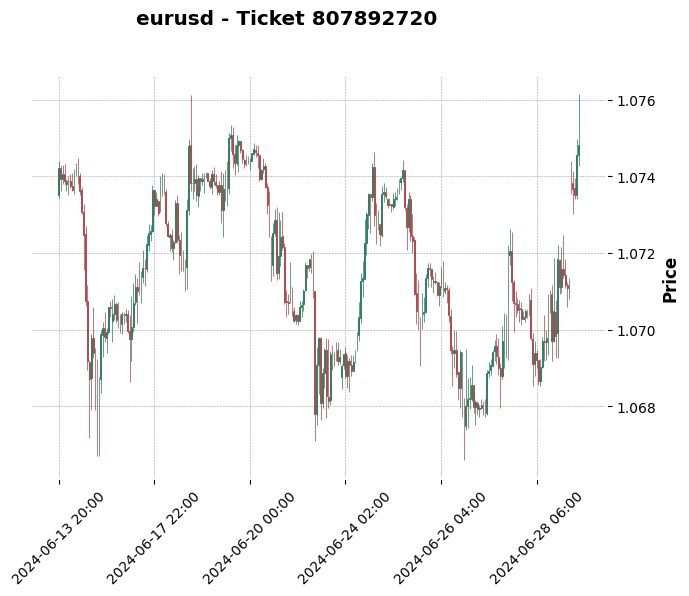

<Figure size 1200x600 with 0 Axes>

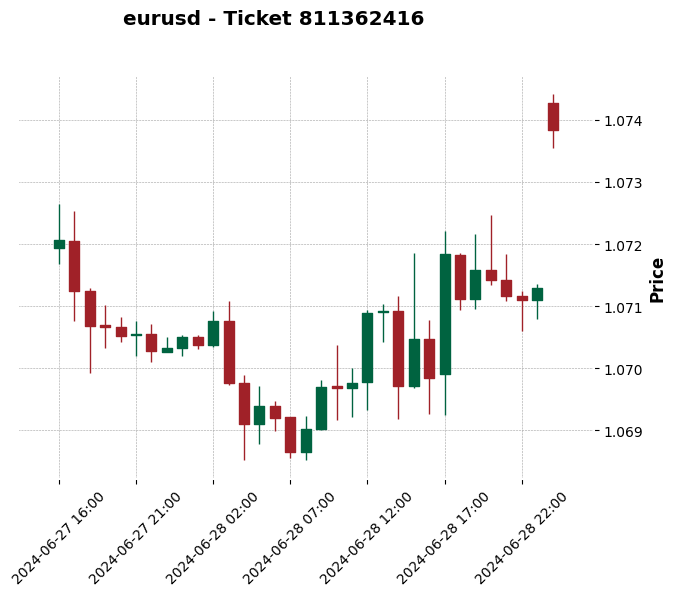

<Figure size 1200x600 with 0 Axes>

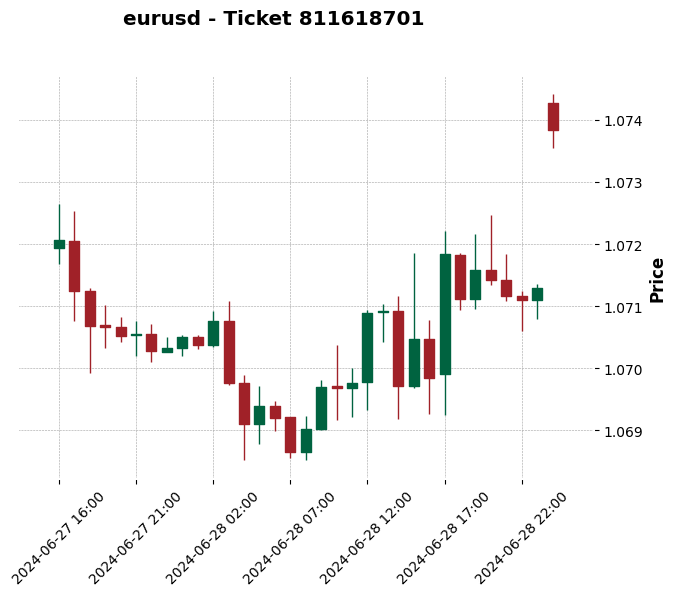

<Figure size 1200x600 with 0 Axes>

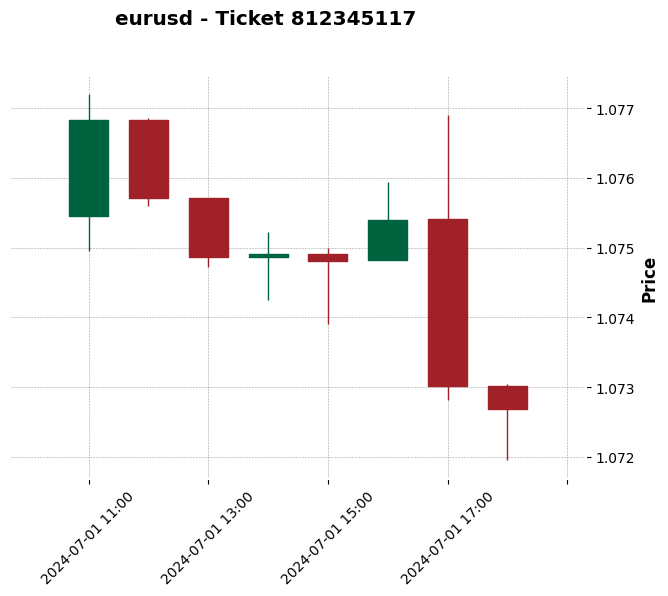

<Figure size 1200x600 with 0 Axes>

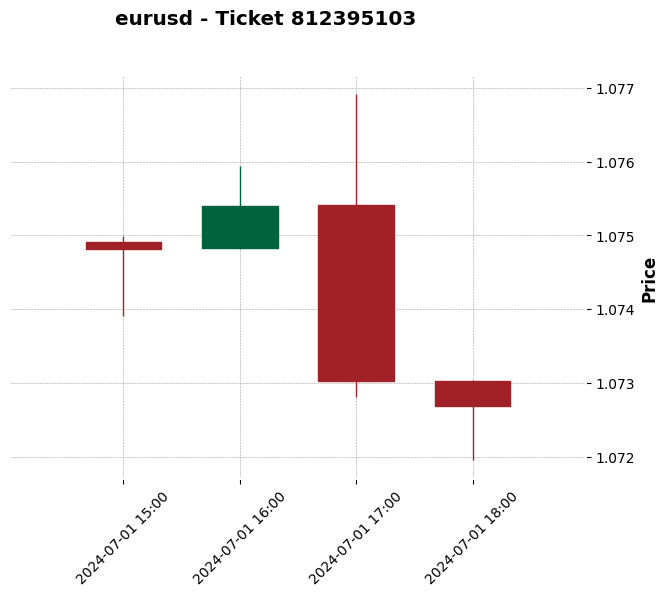

Нет данных котировок для сделки 812707226 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

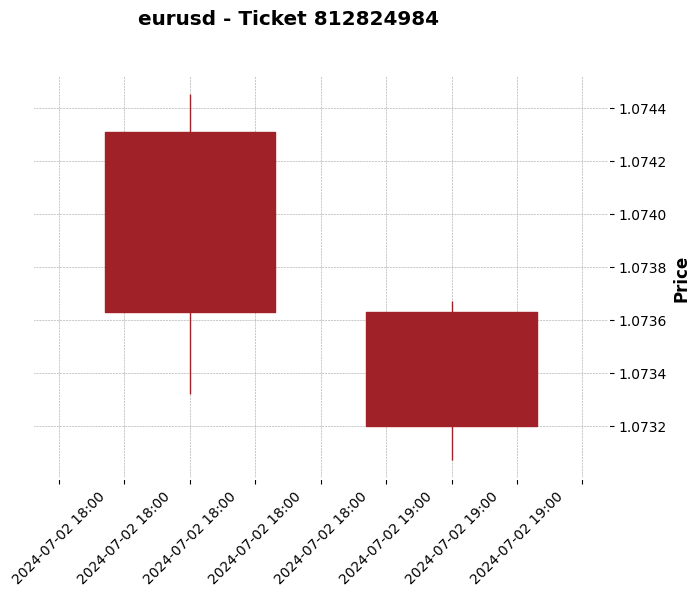

<Figure size 1200x600 with 0 Axes>

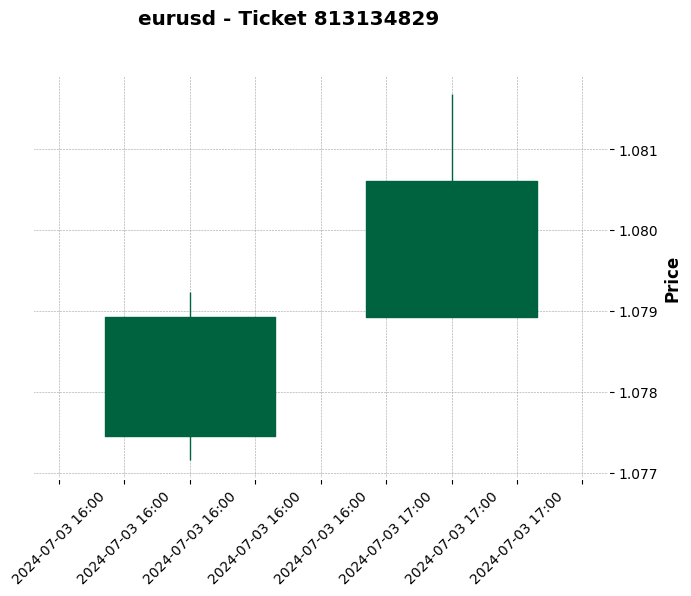

<Figure size 1200x600 with 0 Axes>

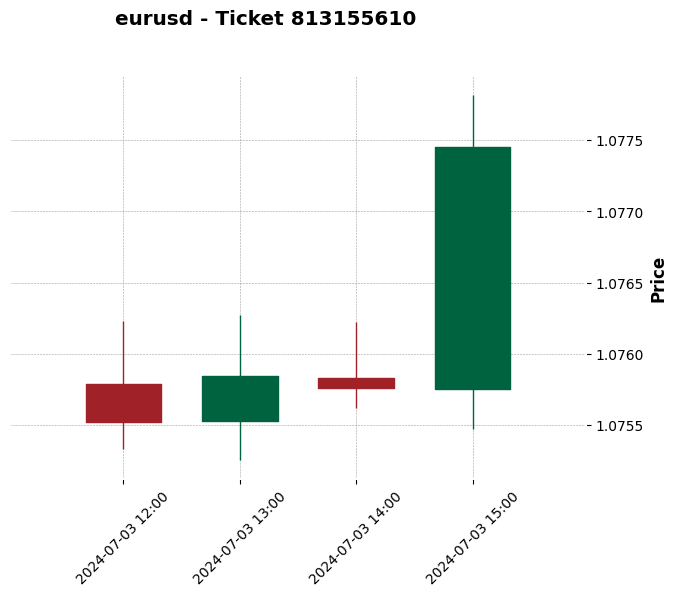

<Figure size 1200x600 with 0 Axes>

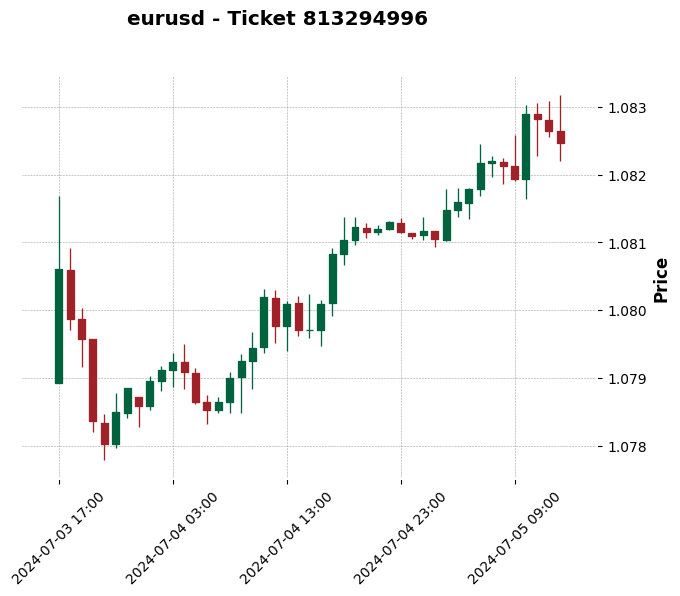

<Figure size 1200x600 with 0 Axes>

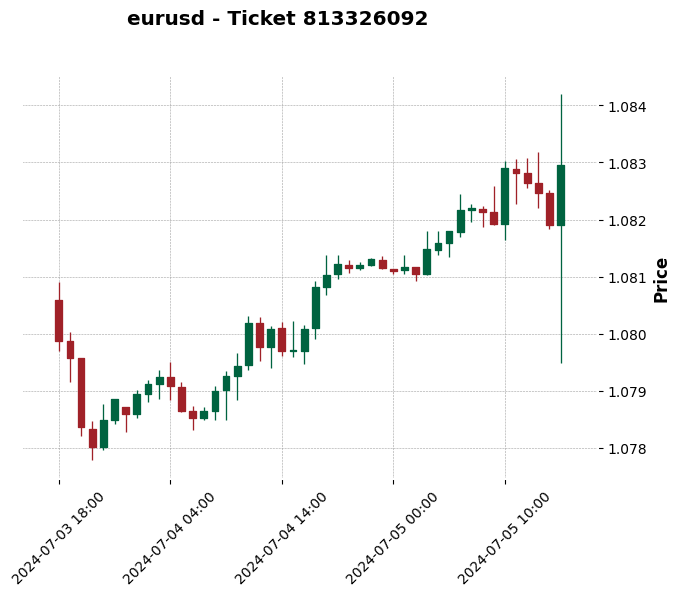

<Figure size 1200x600 with 0 Axes>

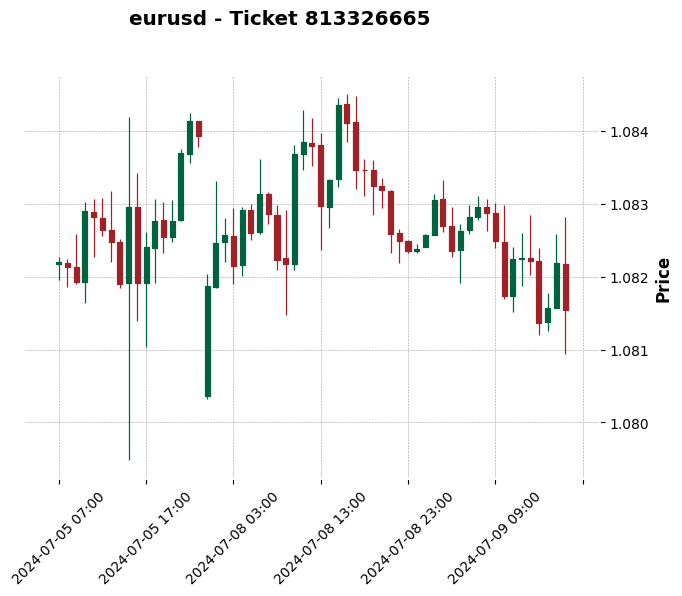

<Figure size 1200x600 with 0 Axes>

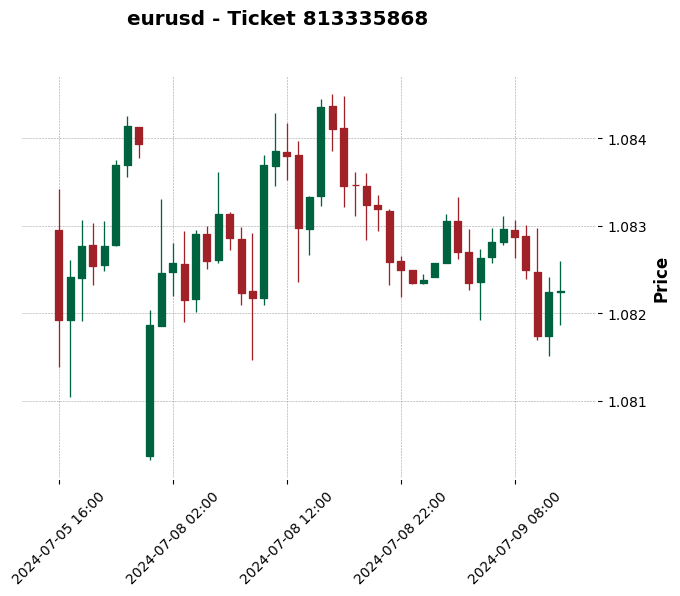

<Figure size 1200x600 with 0 Axes>

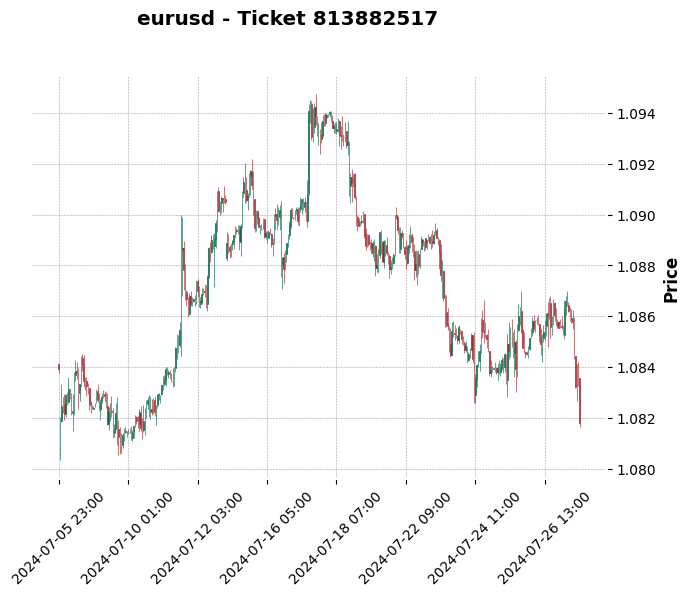

<Figure size 1200x600 with 0 Axes>

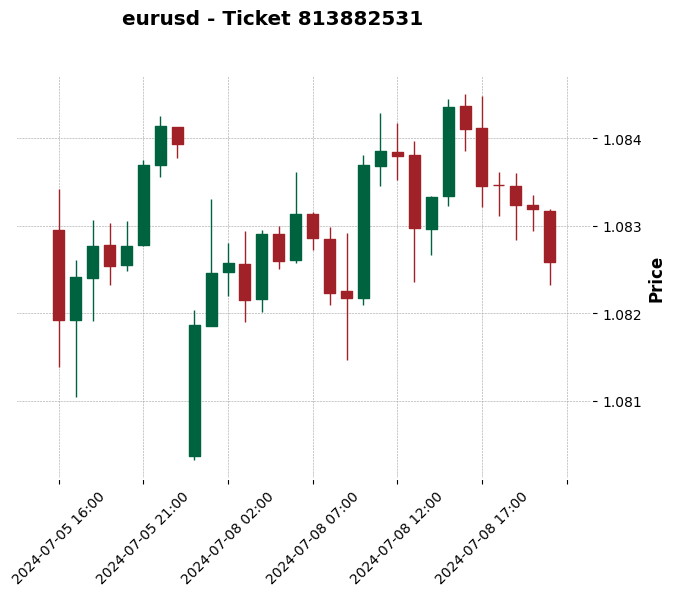

<Figure size 1200x600 with 0 Axes>

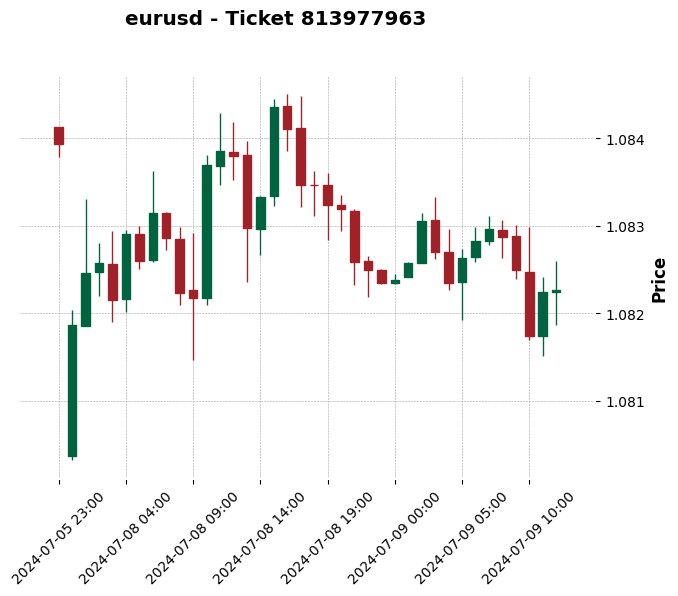

<Figure size 1200x600 with 0 Axes>

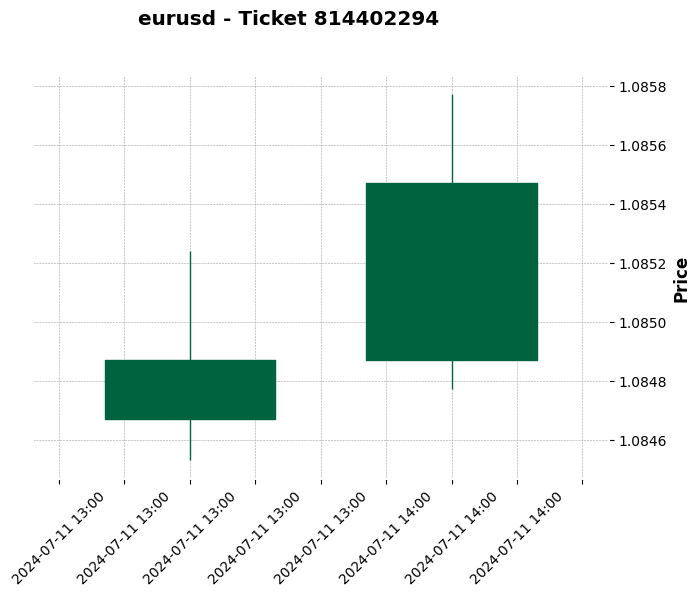

<Figure size 1200x600 with 0 Axes>

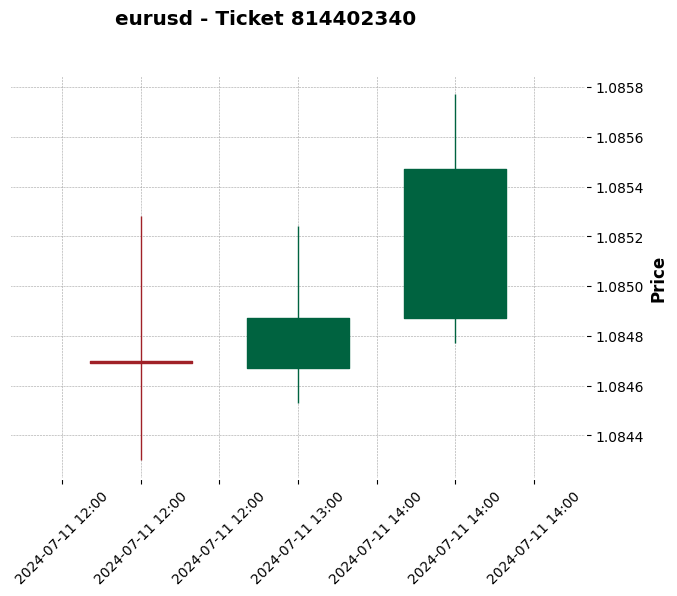

<Figure size 1200x600 with 0 Axes>

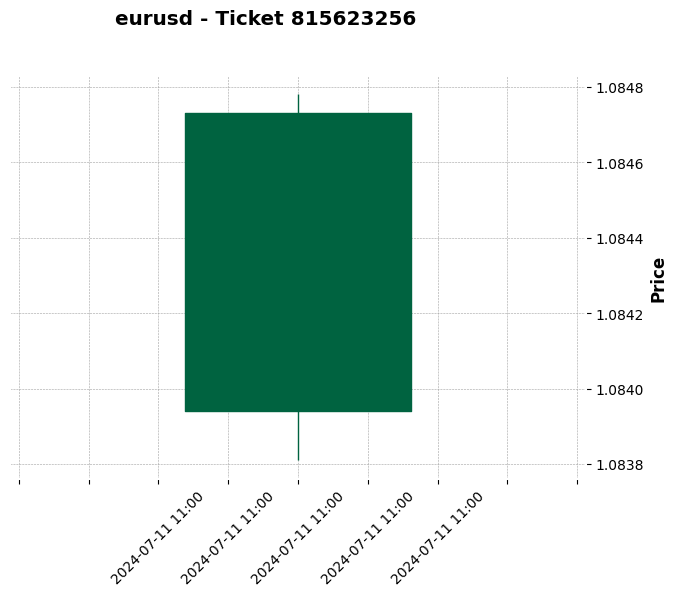

<Figure size 1200x600 with 0 Axes>

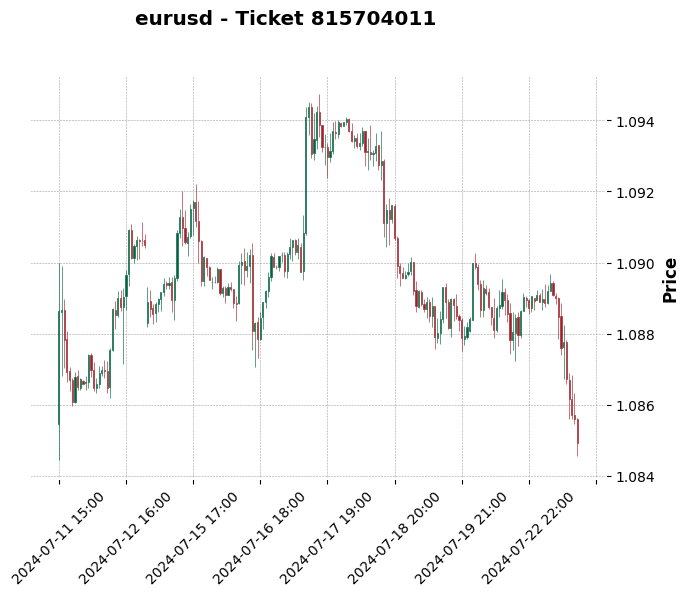

<Figure size 1200x600 with 0 Axes>

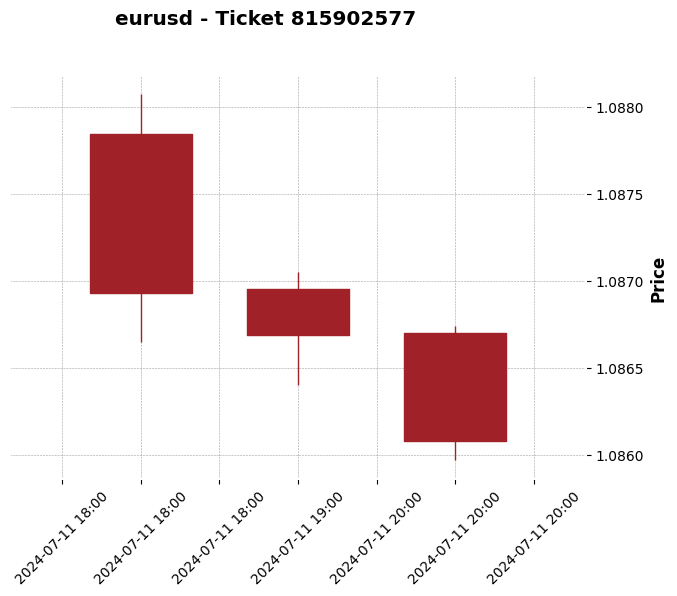

<Figure size 1200x600 with 0 Axes>

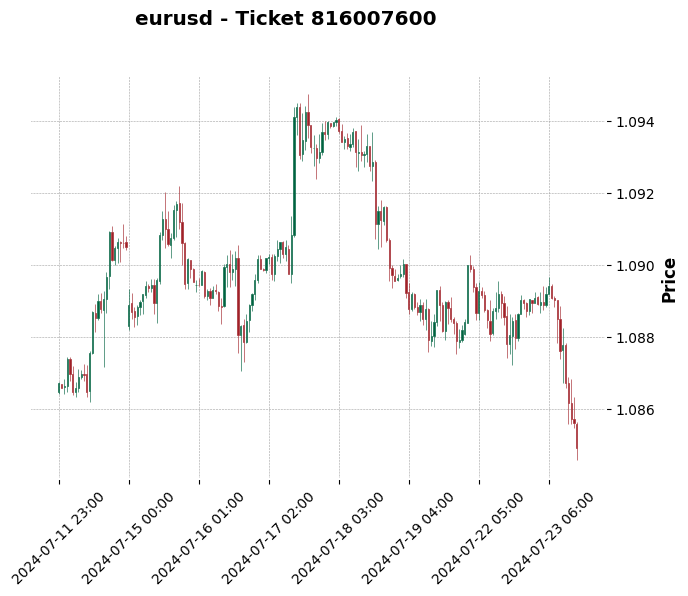

<Figure size 1200x600 with 0 Axes>

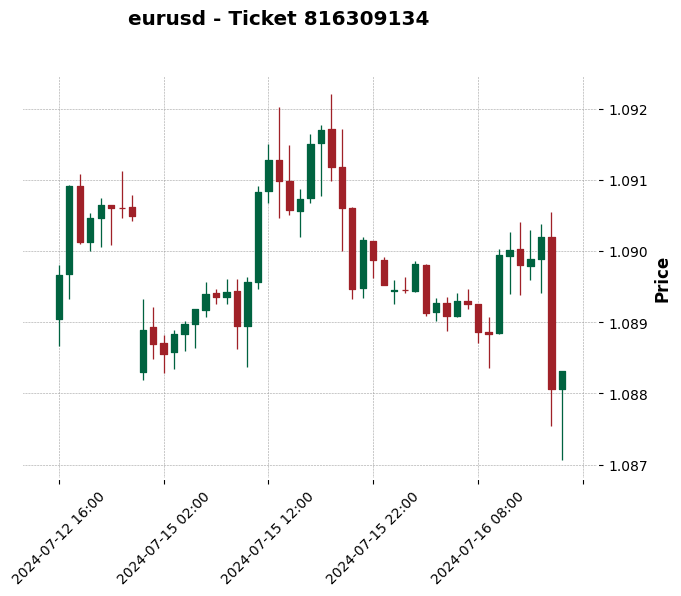

<Figure size 1200x600 with 0 Axes>

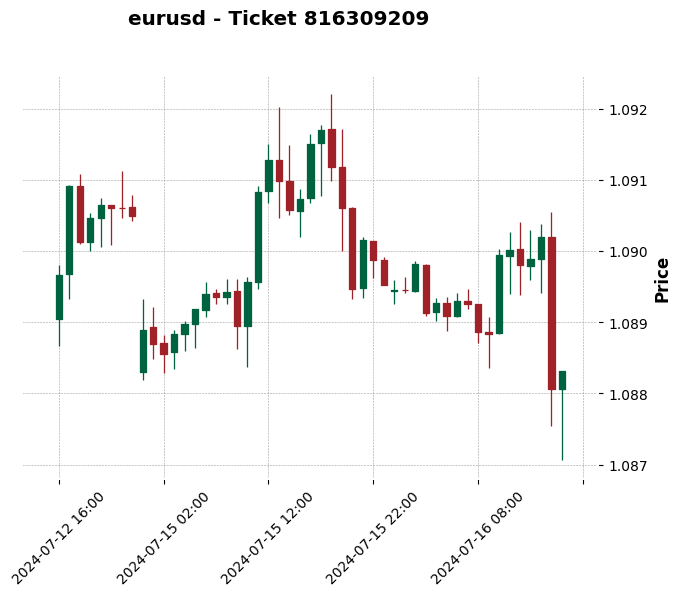

<Figure size 1200x600 with 0 Axes>

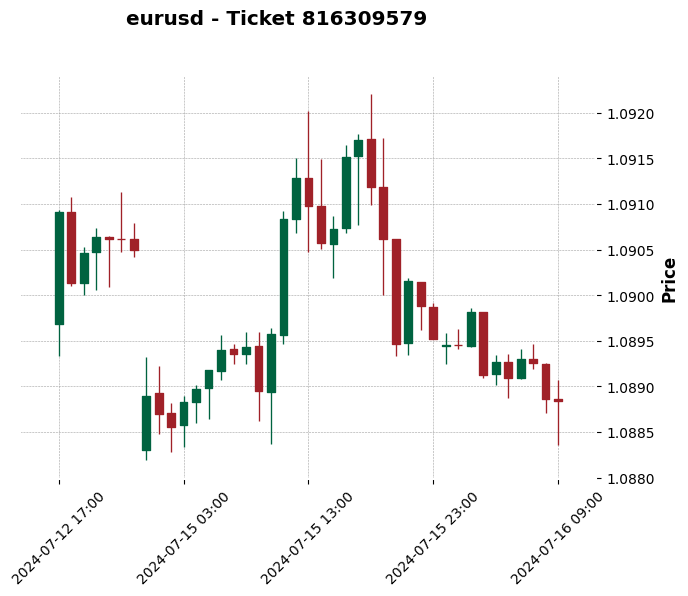

<Figure size 1200x600 with 0 Axes>

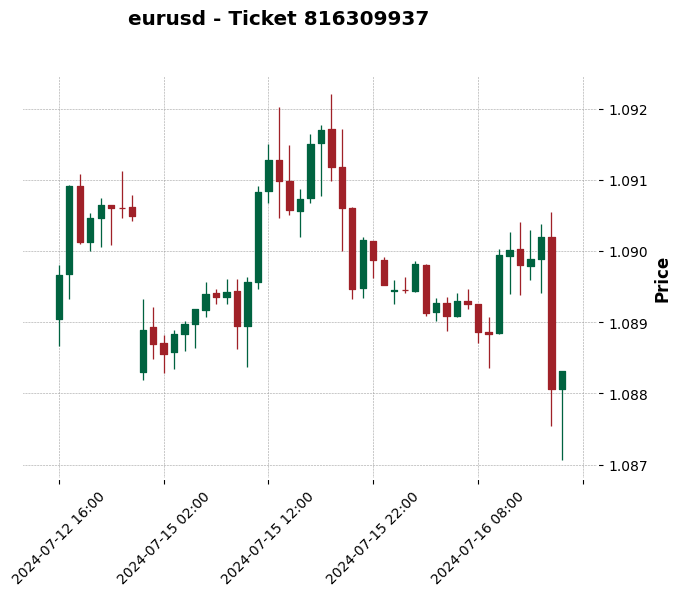

<Figure size 1200x600 with 0 Axes>

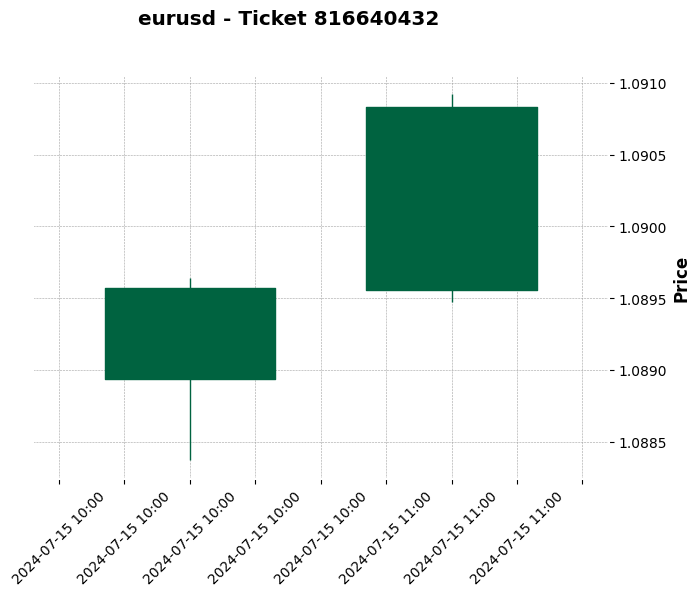

<Figure size 1200x600 with 0 Axes>

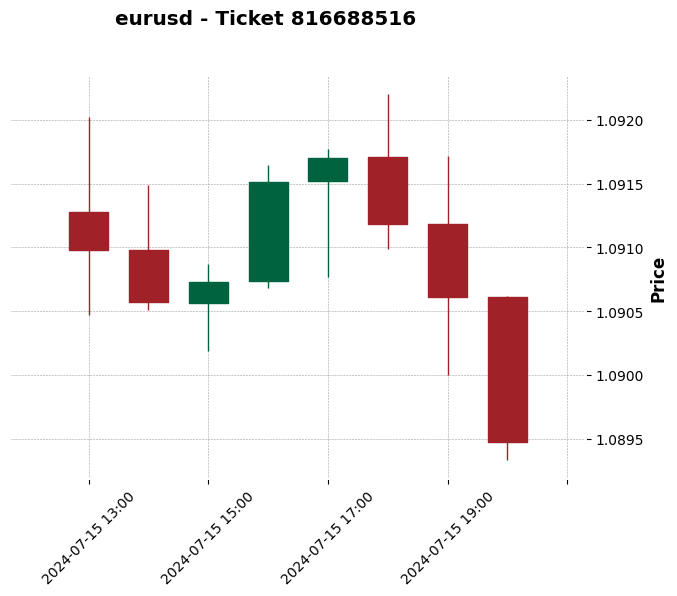

<Figure size 1200x600 with 0 Axes>

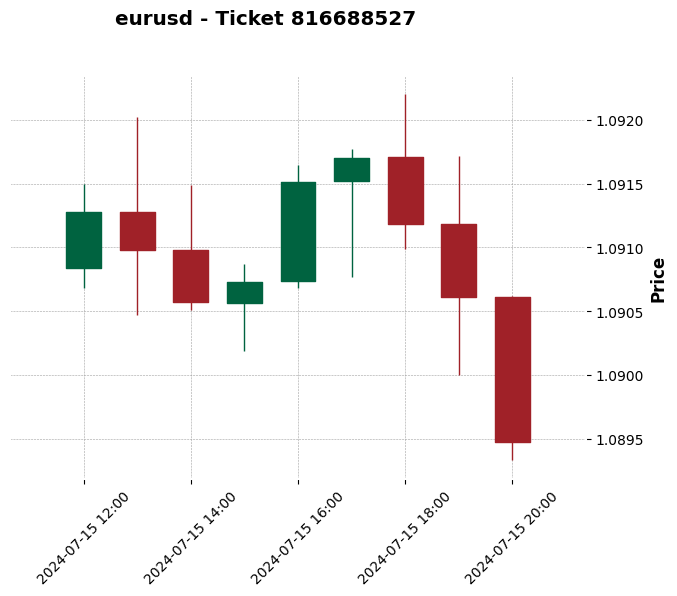

Нет данных котировок для сделки 817235256 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

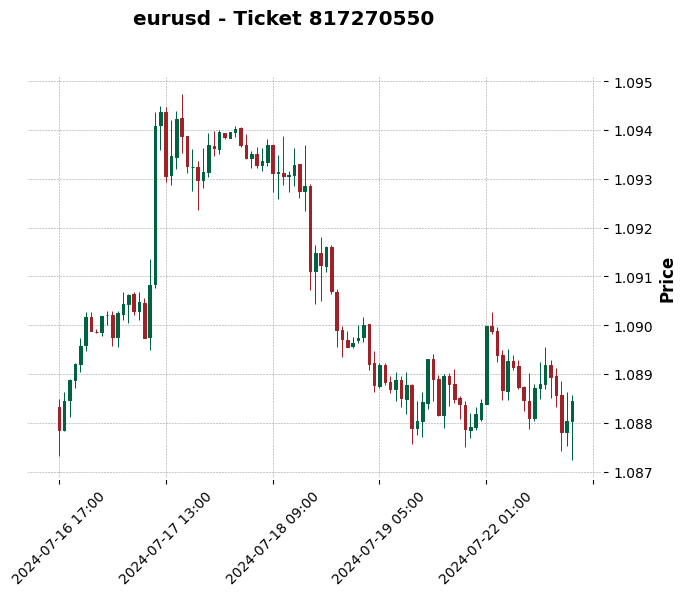

<Figure size 1200x600 with 0 Axes>

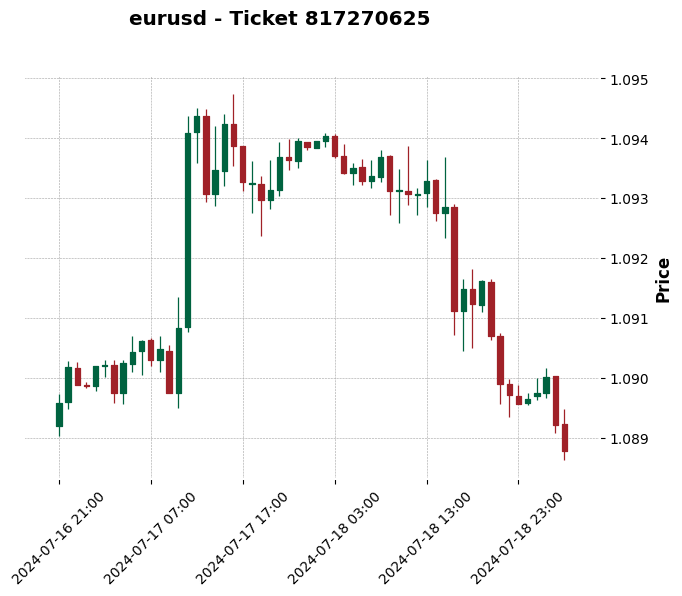

<Figure size 1200x600 with 0 Axes>

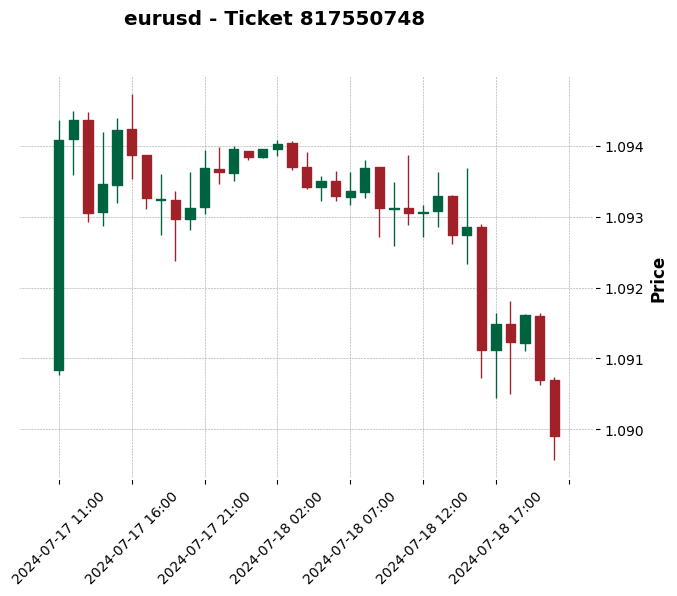

<Figure size 1200x600 with 0 Axes>

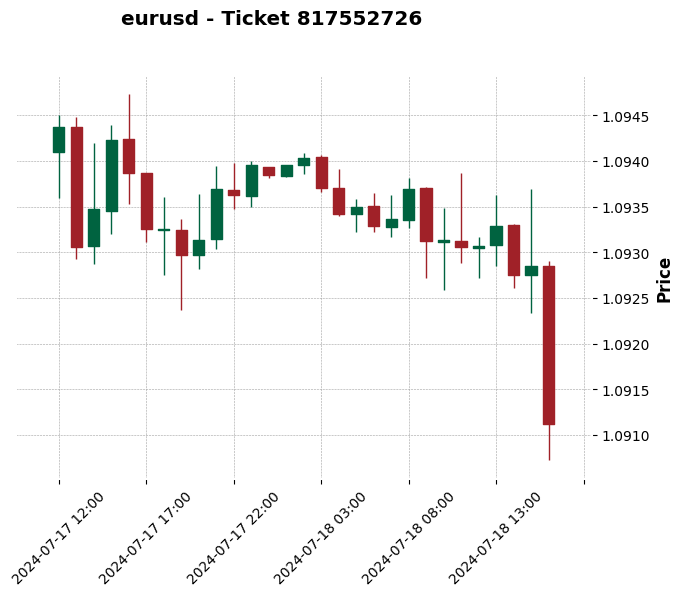

<Figure size 1200x600 with 0 Axes>

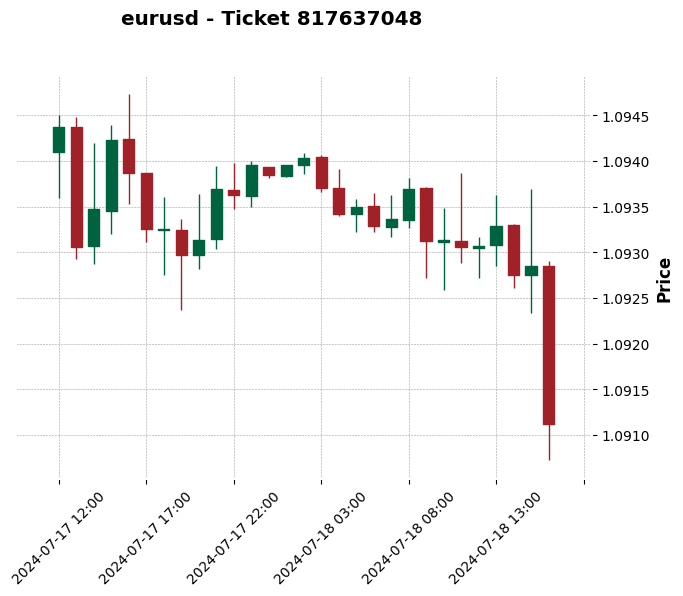

<Figure size 1200x600 with 0 Axes>

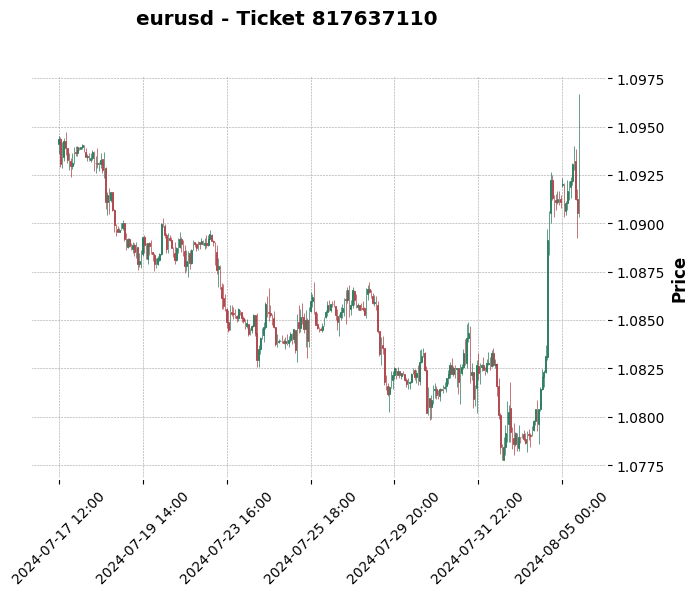

<Figure size 1200x600 with 0 Axes>

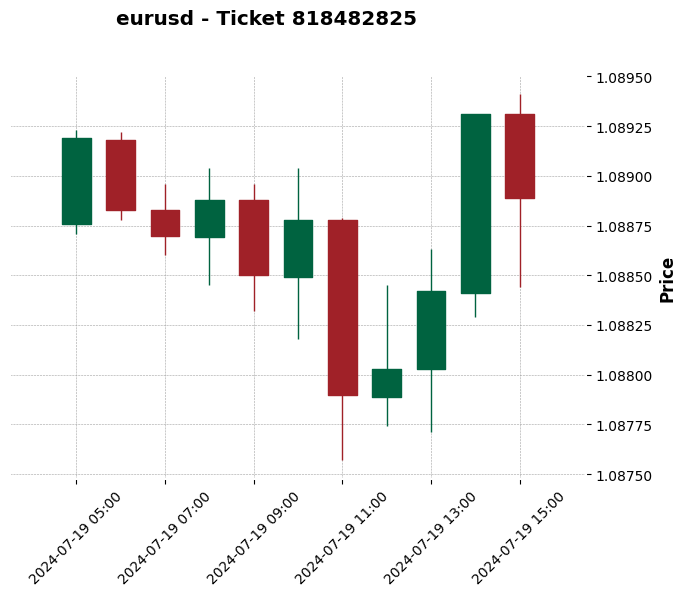

<Figure size 1200x600 with 0 Axes>

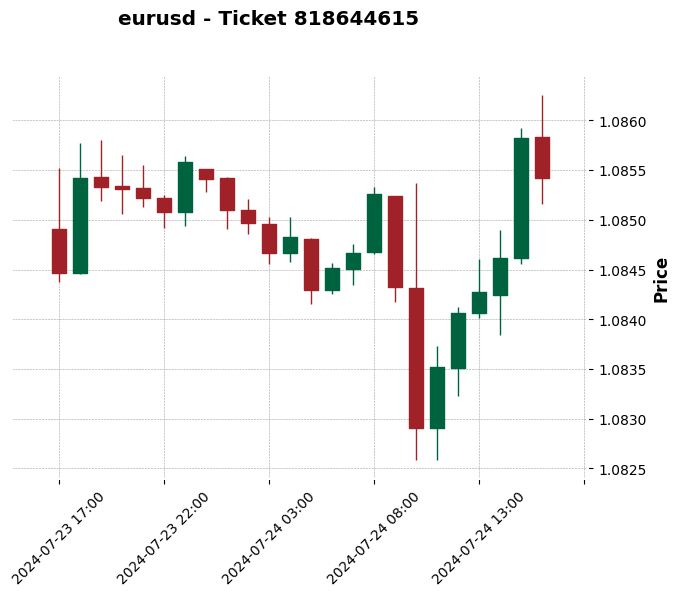

<Figure size 1200x600 with 0 Axes>

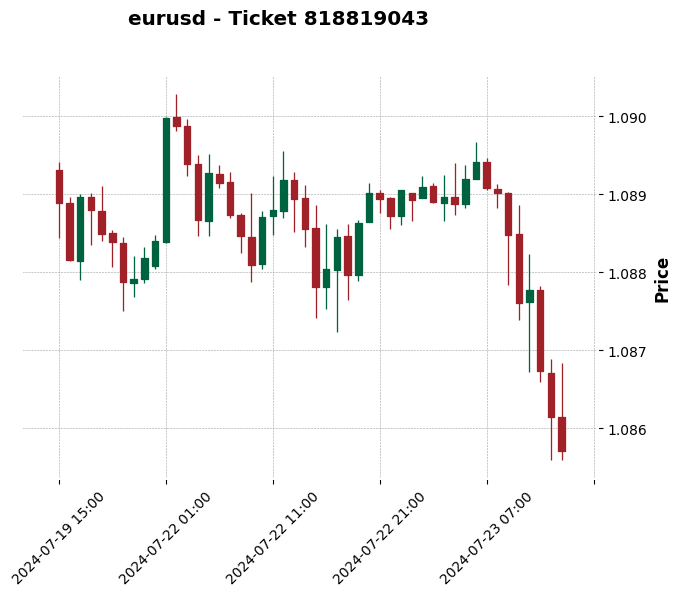

<Figure size 1200x600 with 0 Axes>

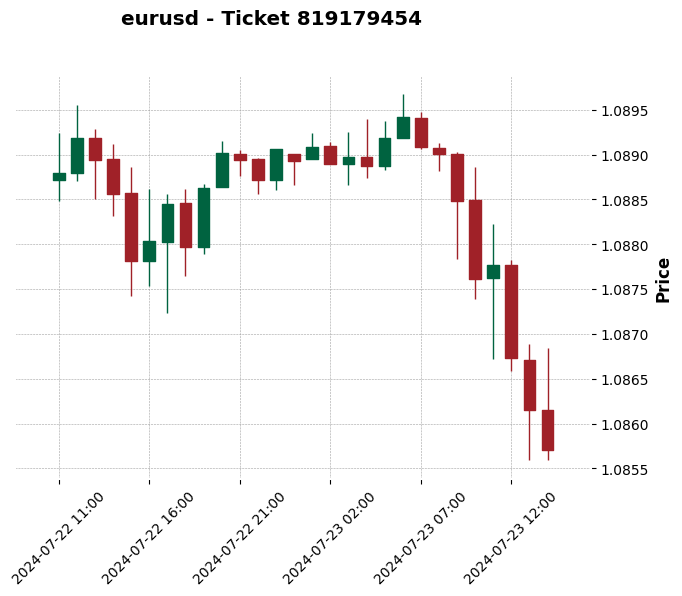

<Figure size 1200x600 with 0 Axes>

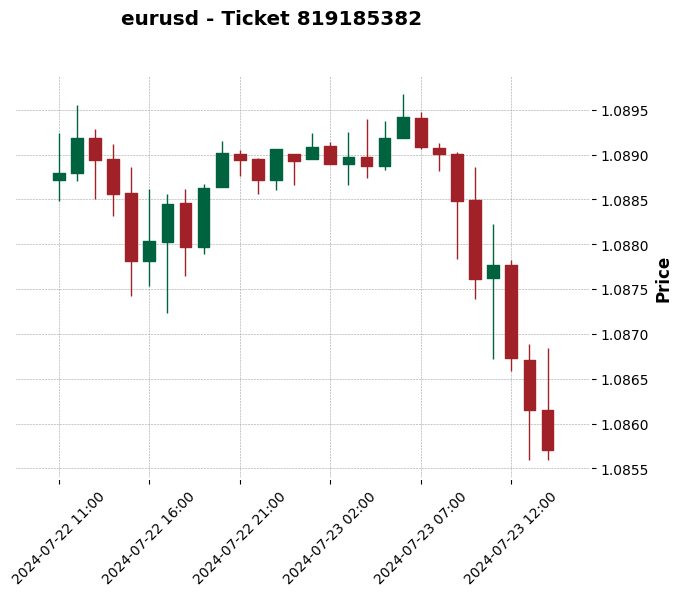

<Figure size 1200x600 with 0 Axes>

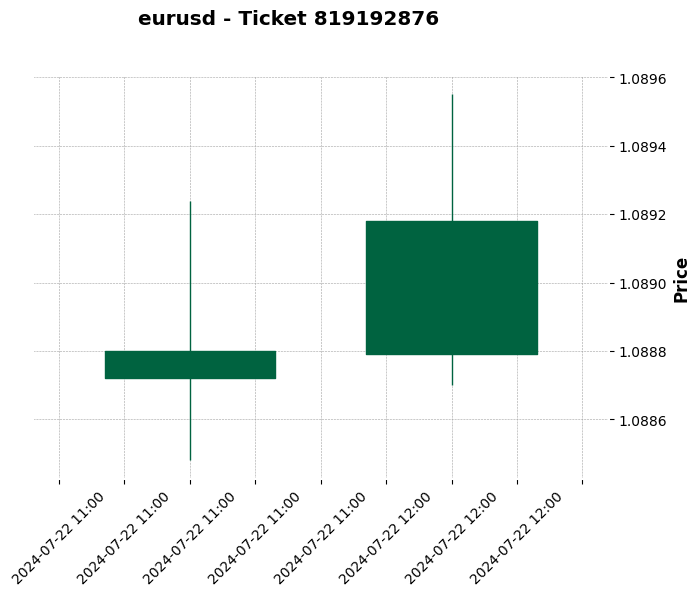

<Figure size 1200x600 with 0 Axes>

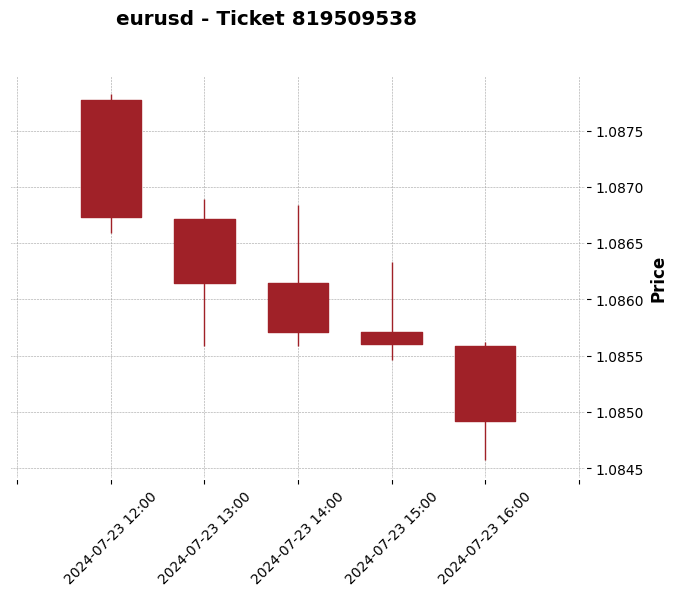

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

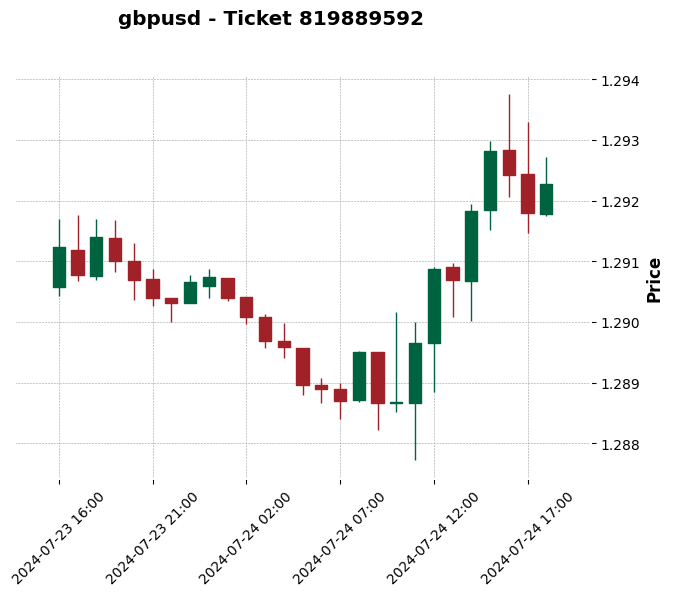

<Figure size 1200x600 with 0 Axes>

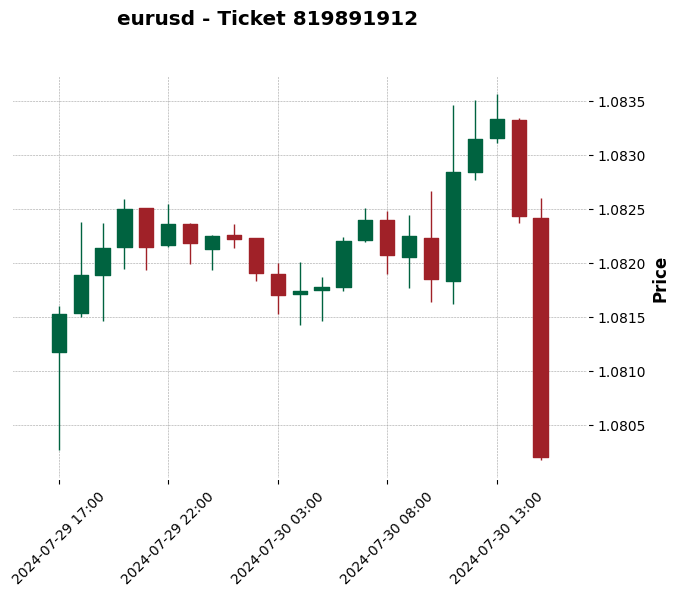

<Figure size 1200x600 with 0 Axes>

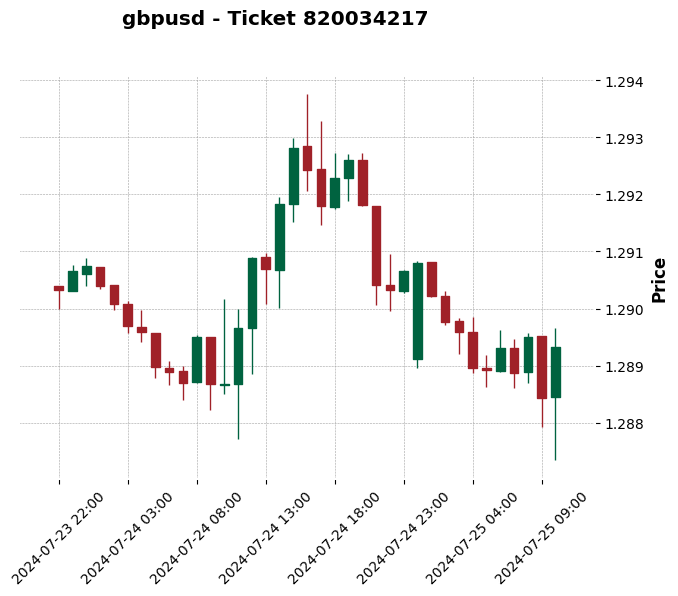

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

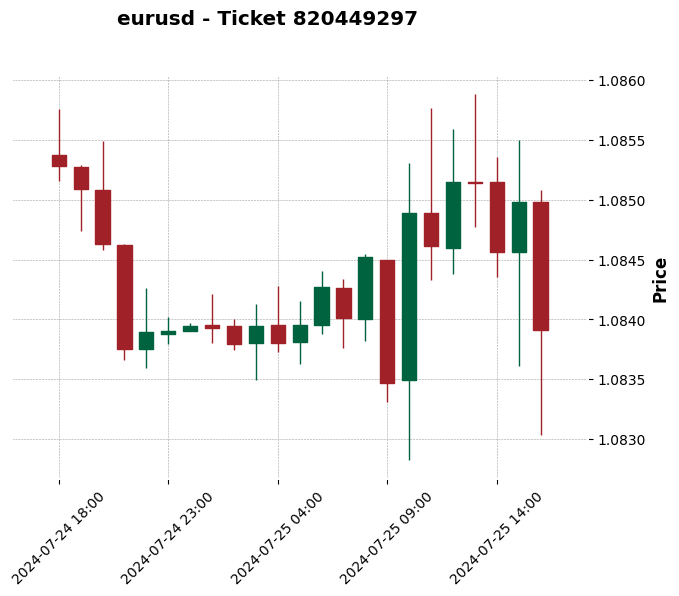

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

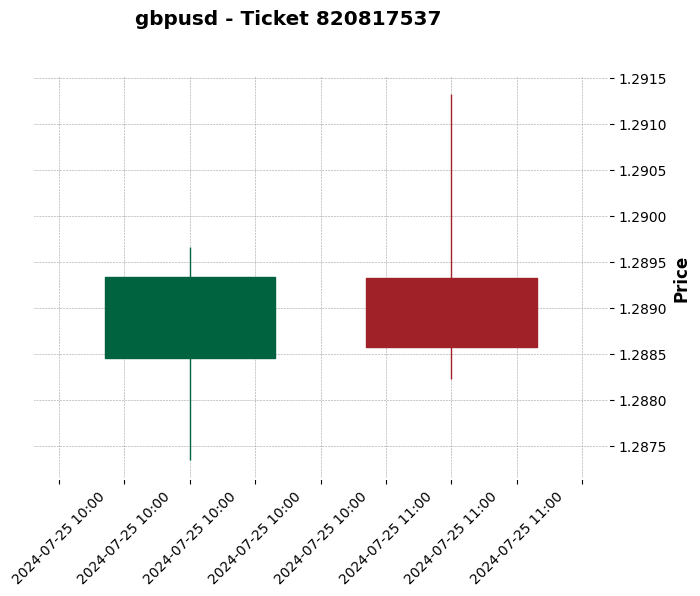

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

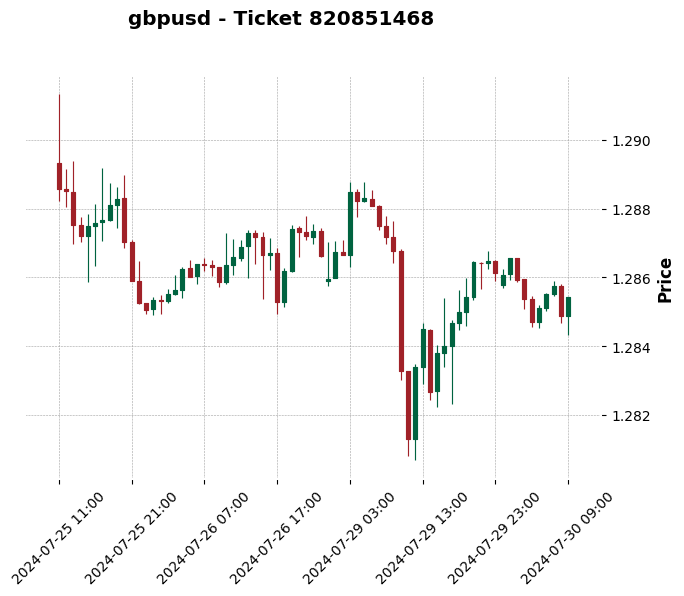

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

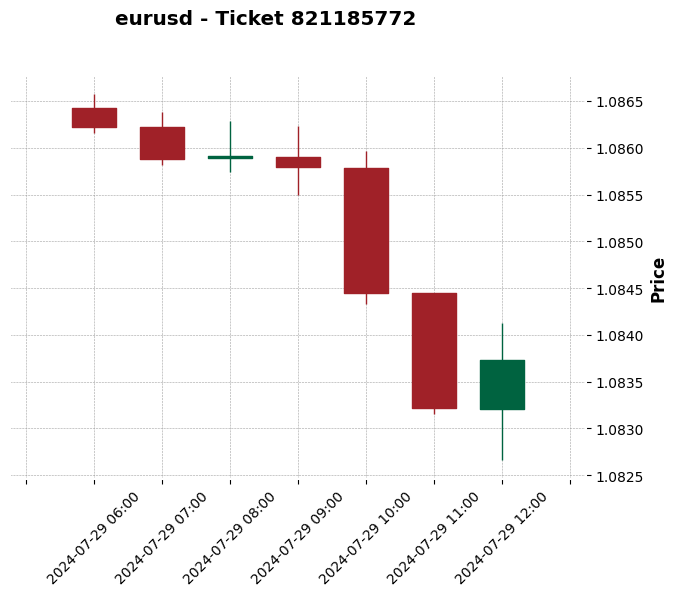

<Figure size 1200x600 with 0 Axes>

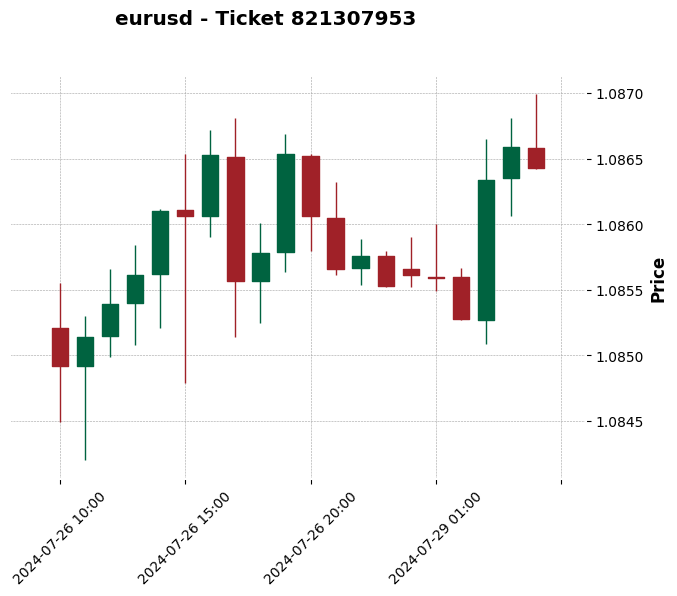

<Figure size 1200x600 with 0 Axes>

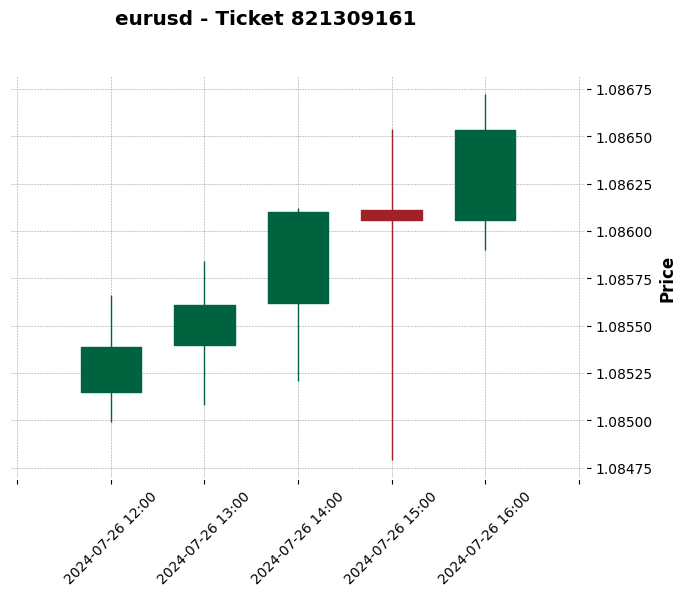

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

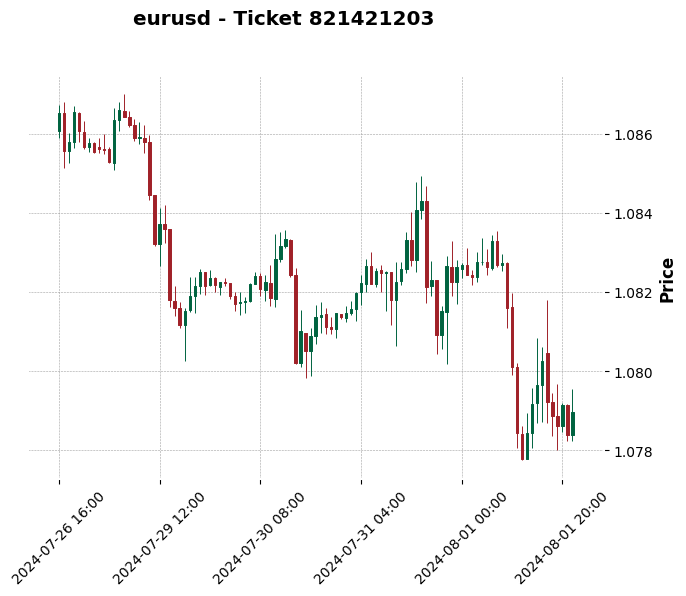

Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


<Figure size 1200x600 with 0 Axes>

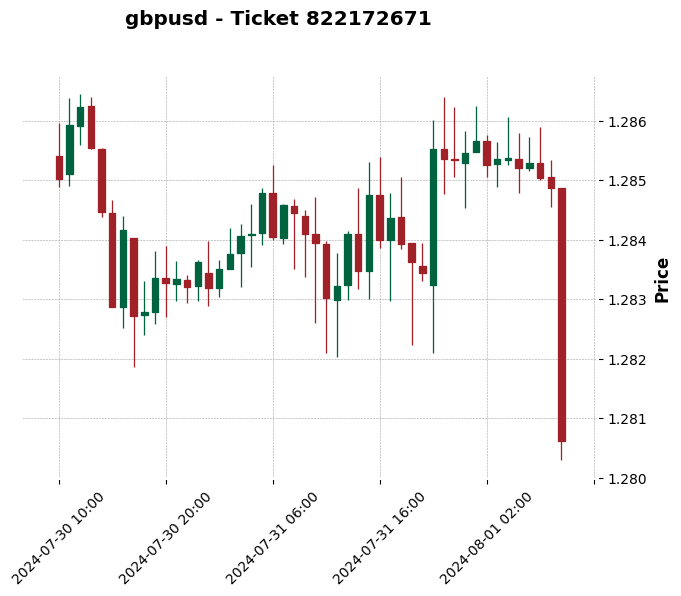

Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

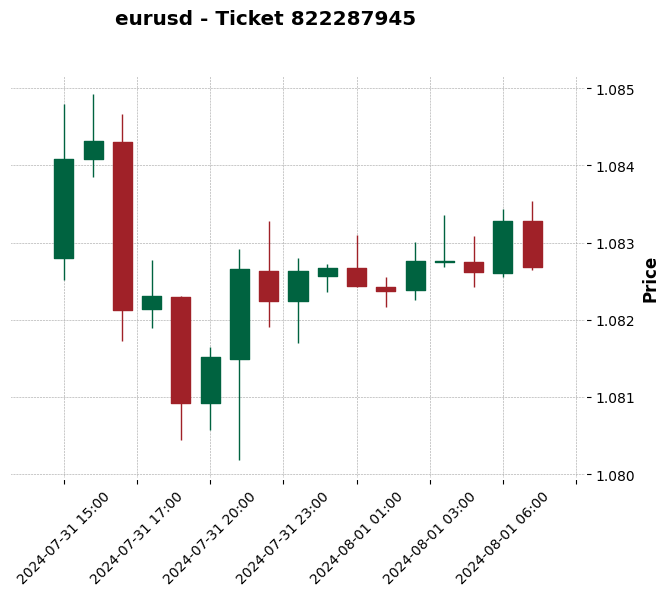

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

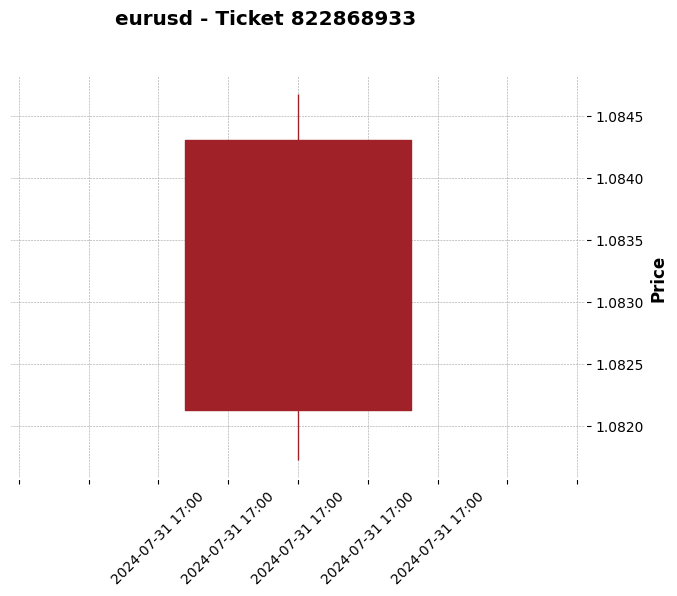

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


<Figure size 1200x600 with 0 Axes>

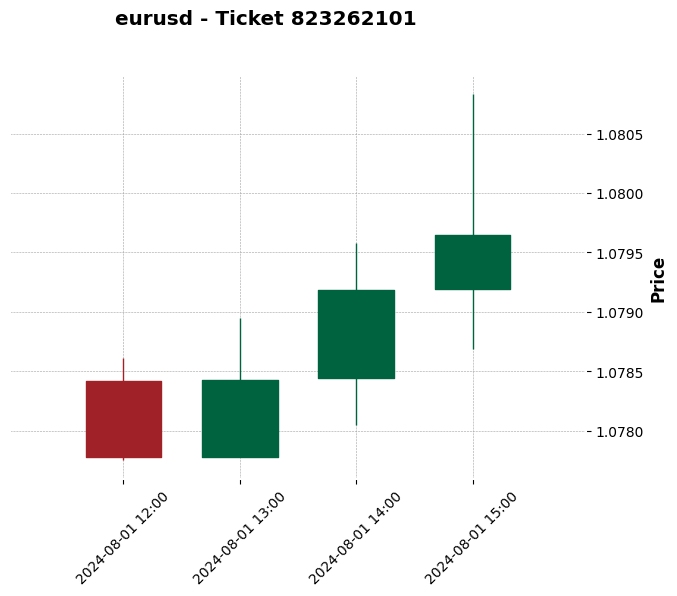

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

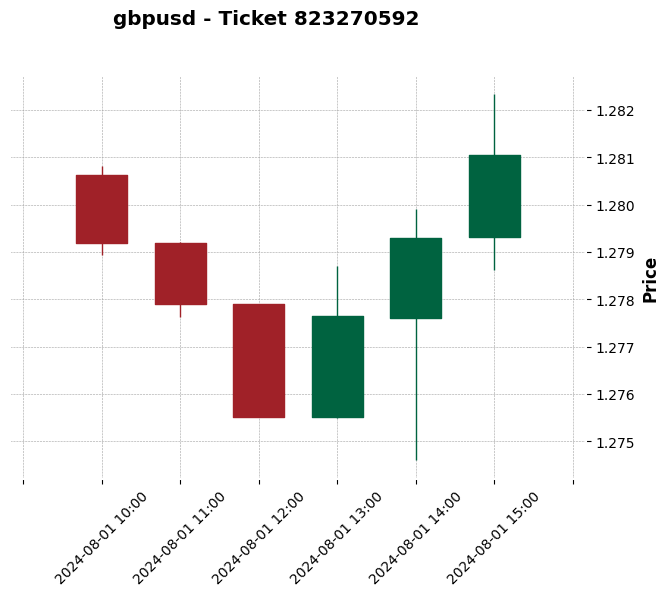

<Figure size 1200x600 with 0 Axes>

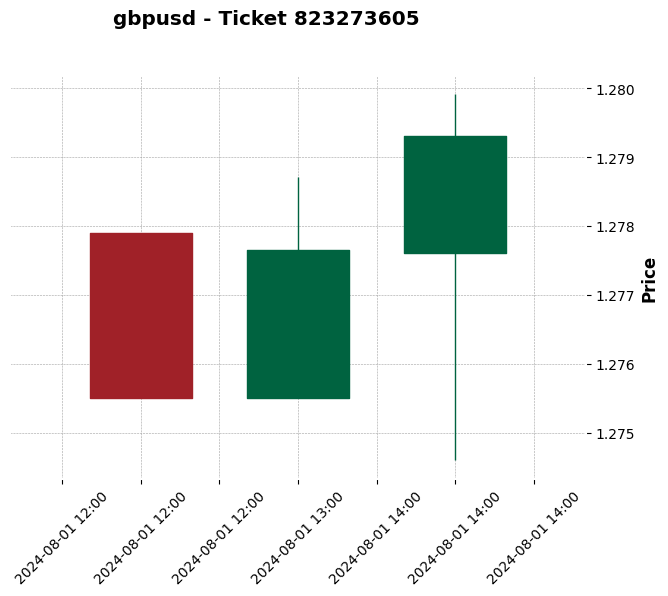

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

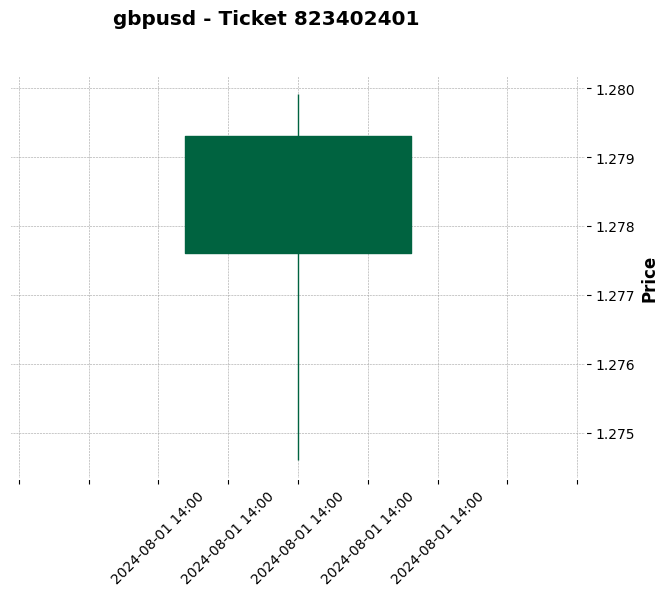

<Figure size 1200x600 with 0 Axes>

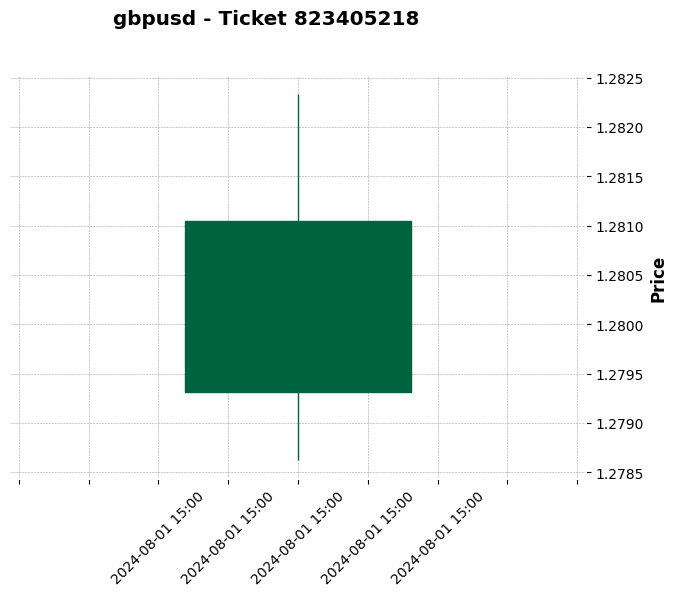

<Figure size 1200x600 with 0 Axes>

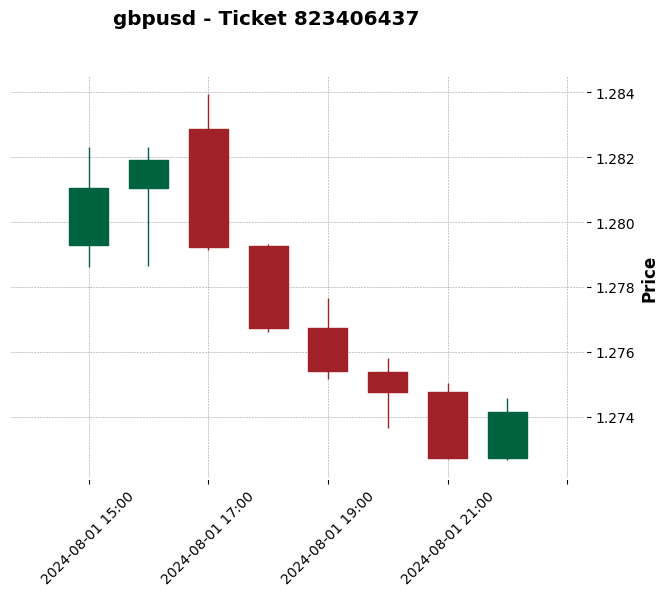

<Figure size 1200x600 with 0 Axes>

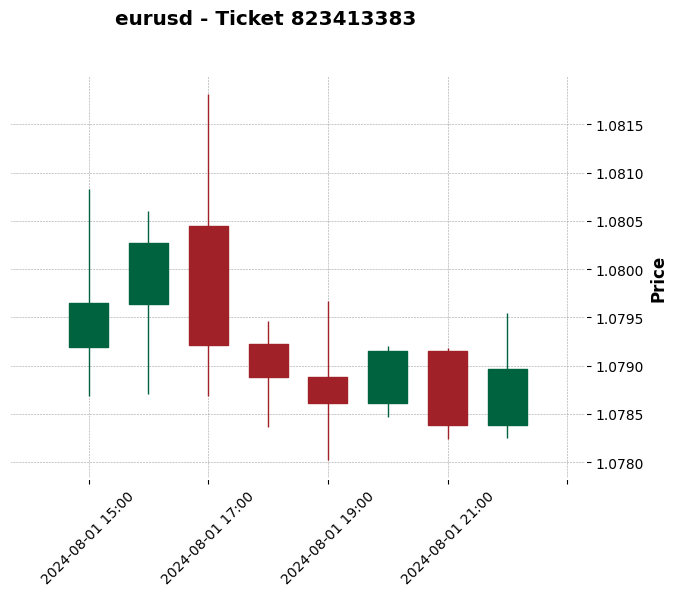

<Figure size 1200x600 with 0 Axes>

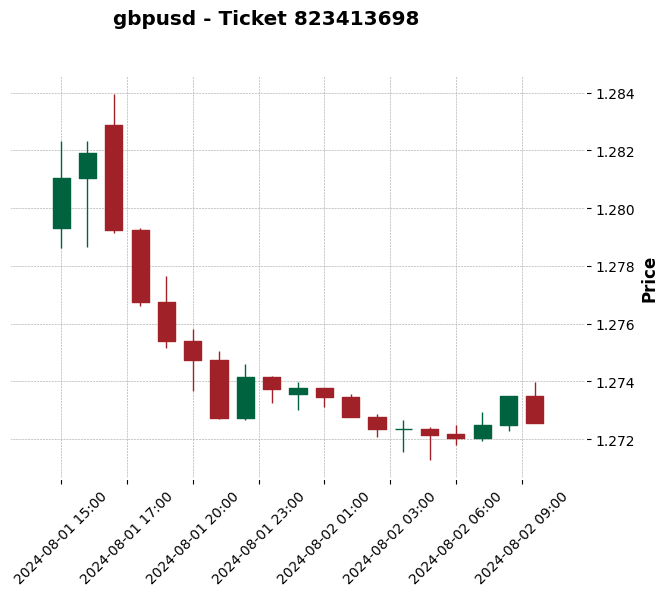

<Figure size 1200x600 with 0 Axes>

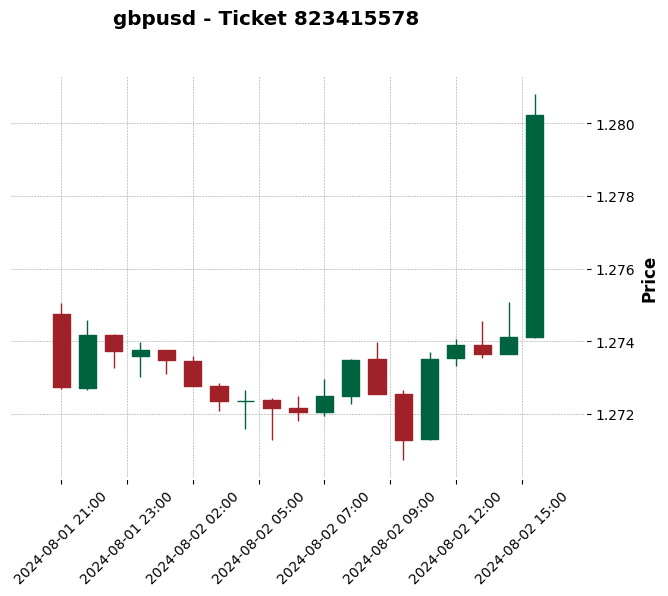

<Figure size 1200x600 with 0 Axes>

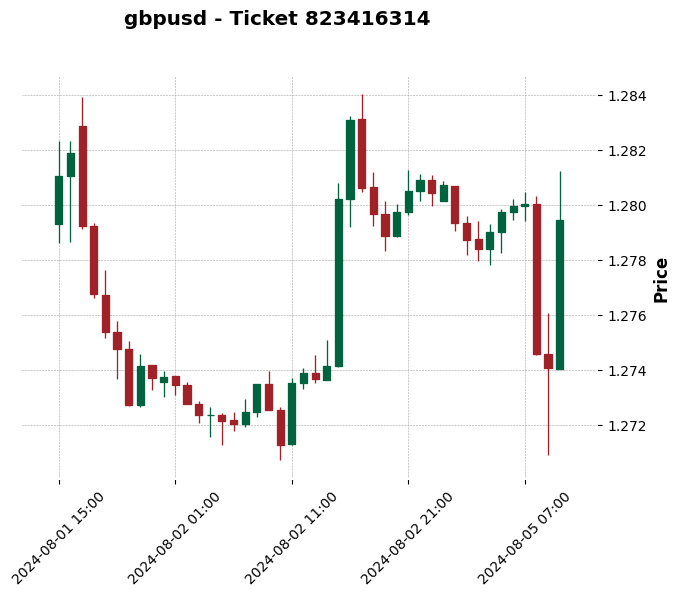

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

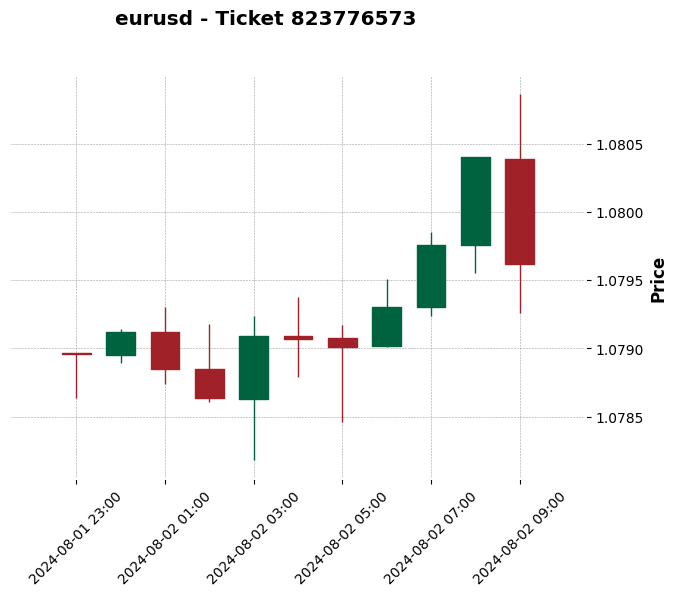

Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


<Figure size 1200x600 with 0 Axes>

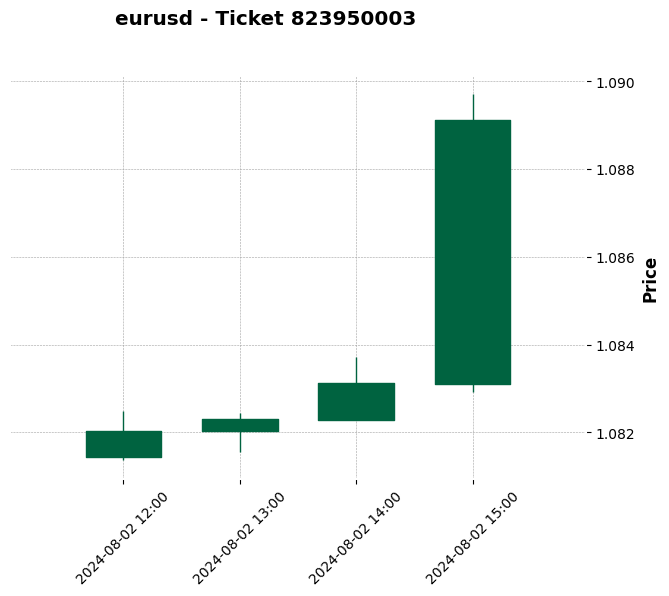

Нет данных котировок для сделки 823950168 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

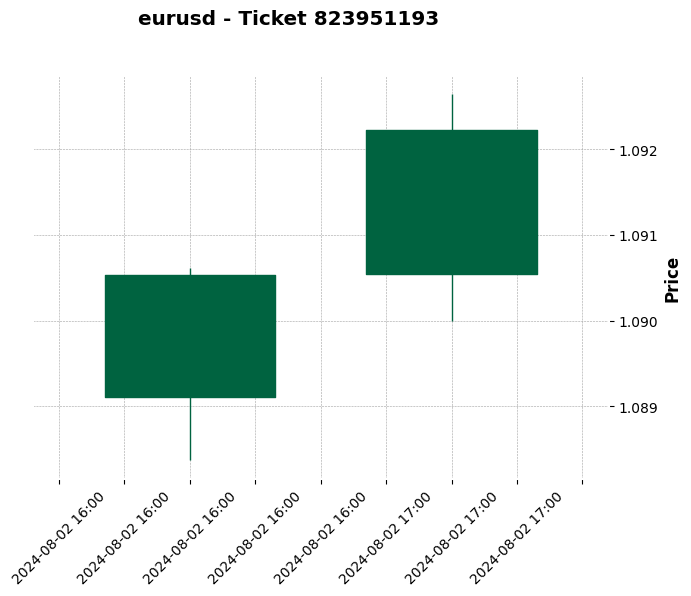

<Figure size 1200x600 with 0 Axes>

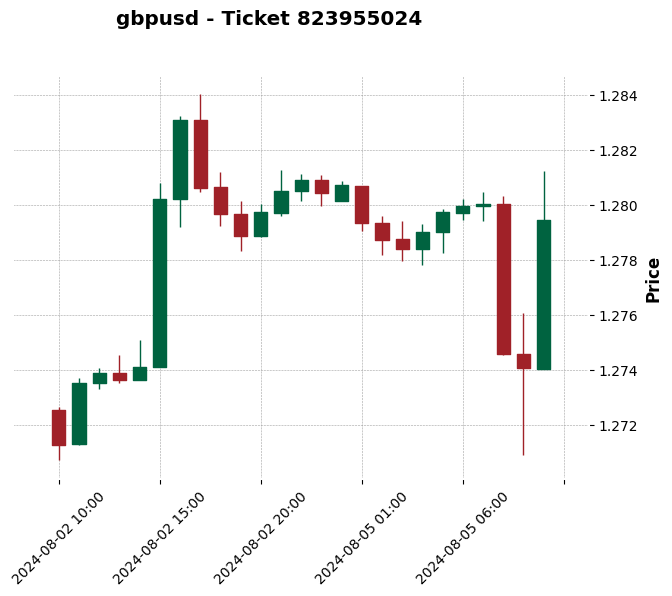

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

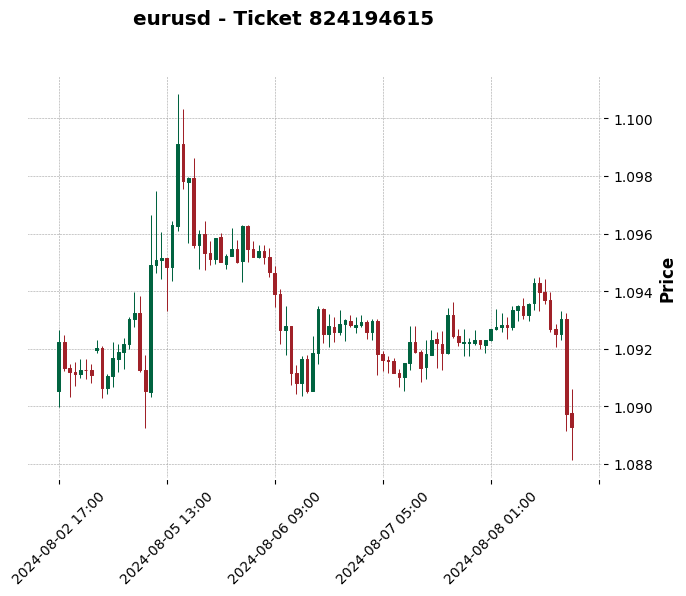

<Figure size 1200x600 with 0 Axes>

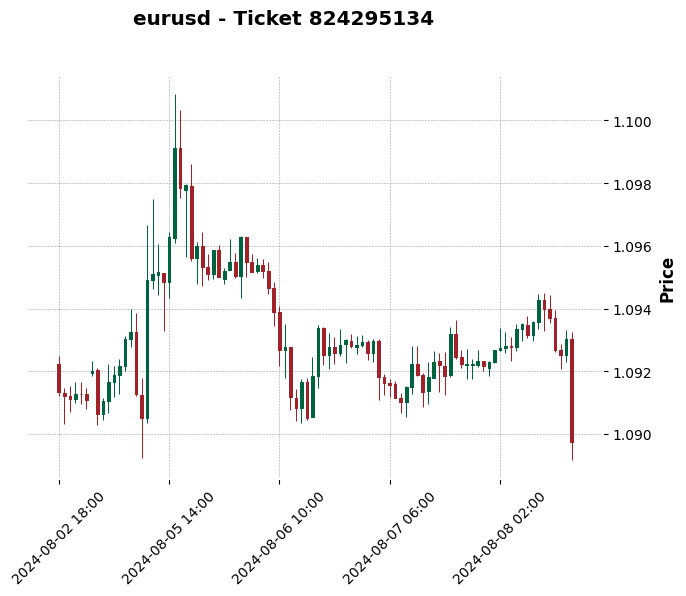

<Figure size 1200x600 with 0 Axes>

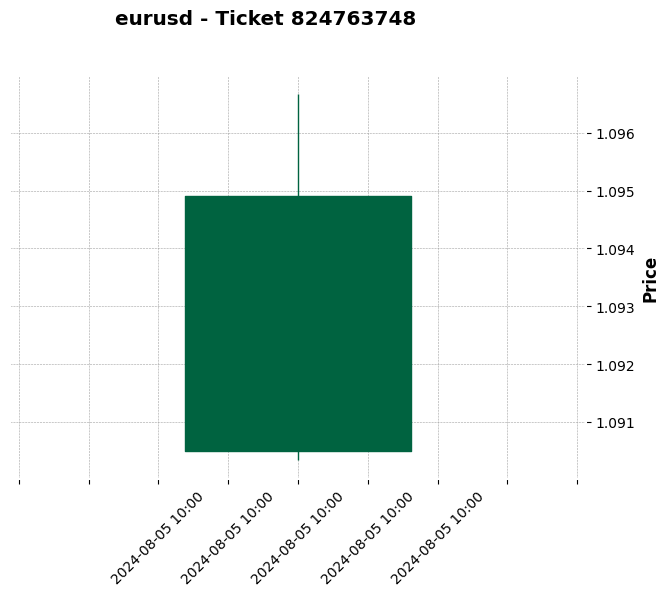

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

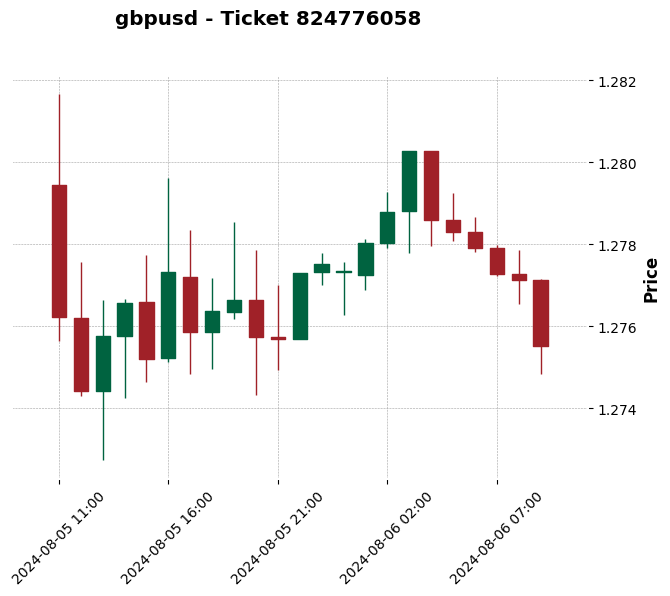

<Figure size 1200x600 with 0 Axes>

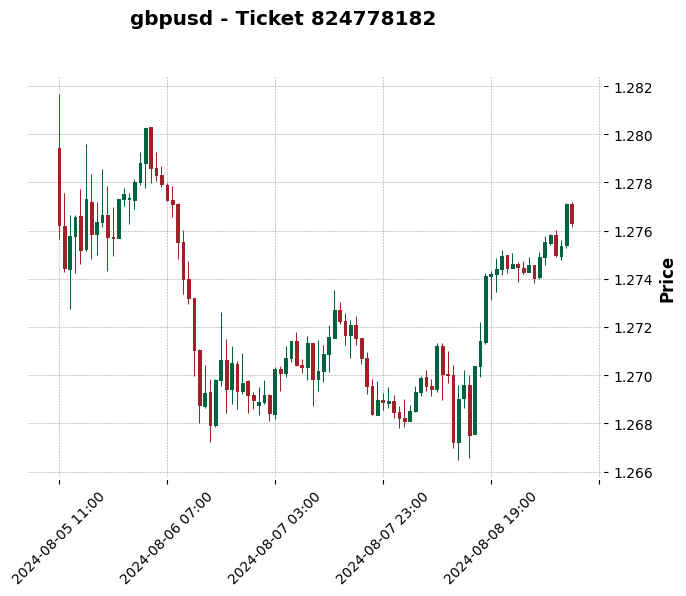

<Figure size 1200x600 with 0 Axes>

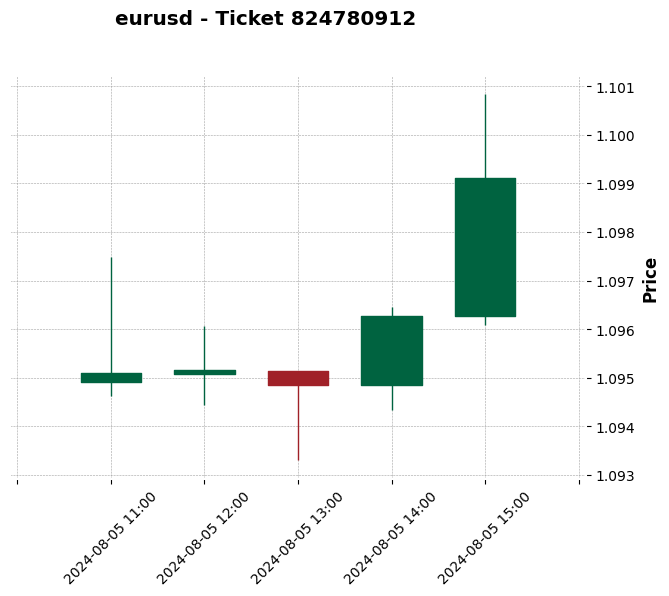

<Figure size 1200x600 with 0 Axes>

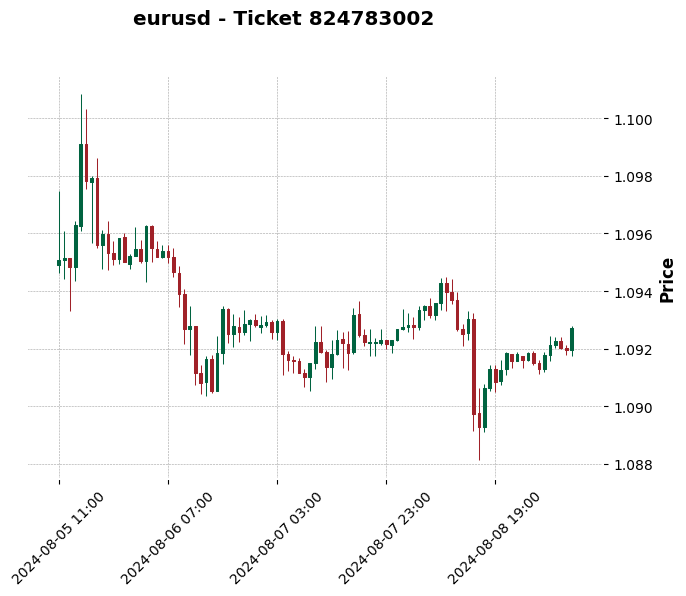

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

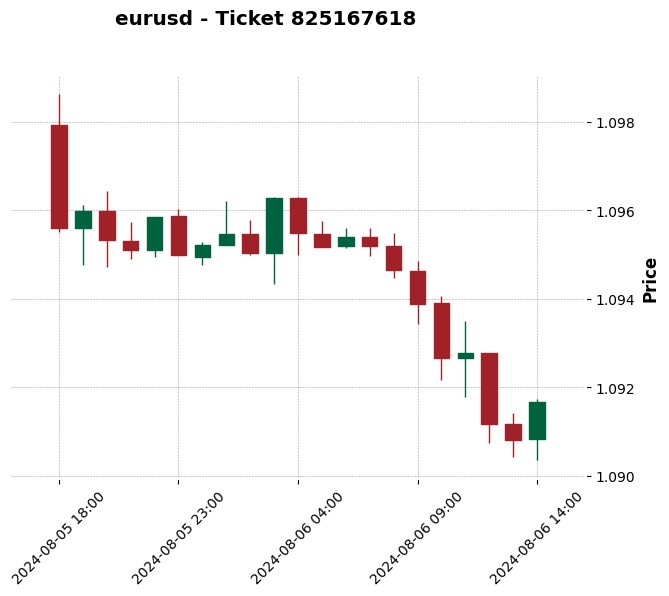

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

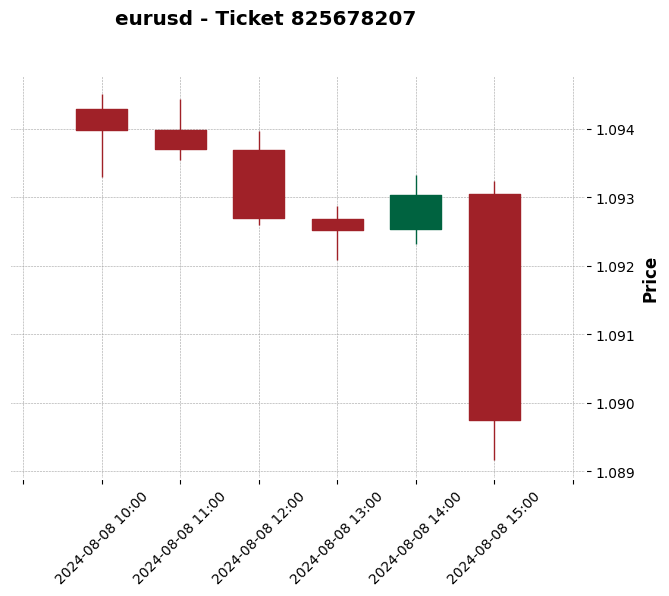

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


<Figure size 1200x600 with 0 Axes>

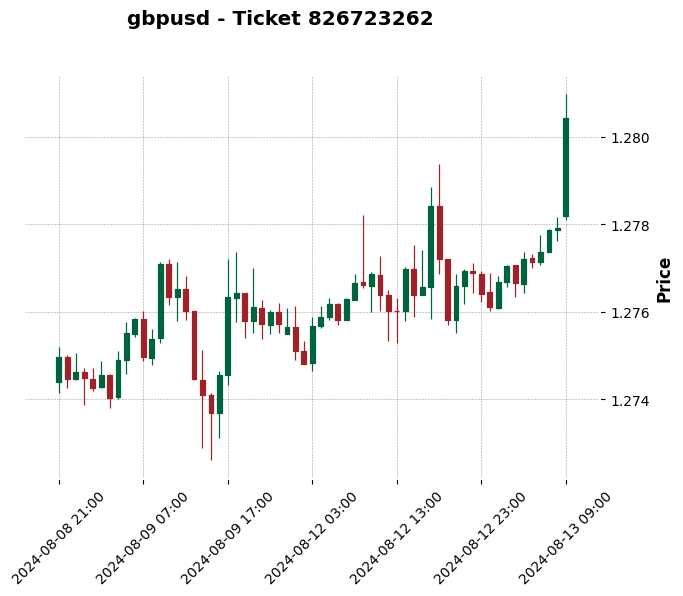

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

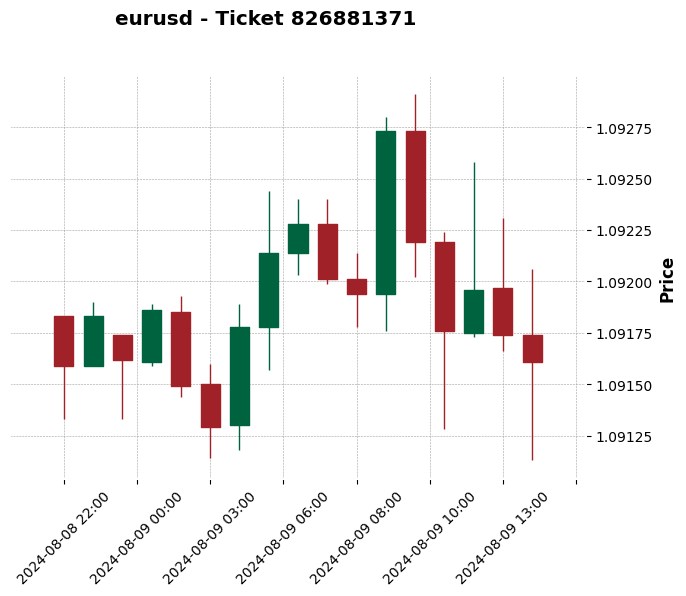

Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.


<Figure size 1200x600 with 0 Axes>

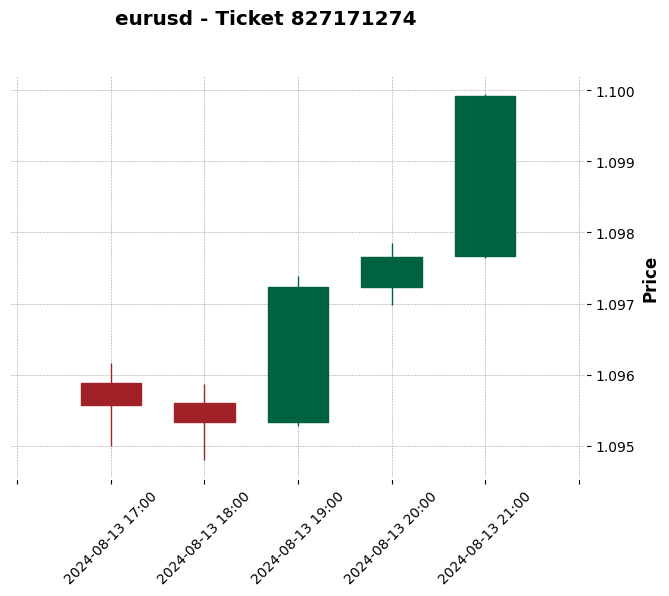

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл EURAUD.csv не найден.
Нет котировок для валютной пары euraud.


<Figure size 1200x600 with 0 Axes>

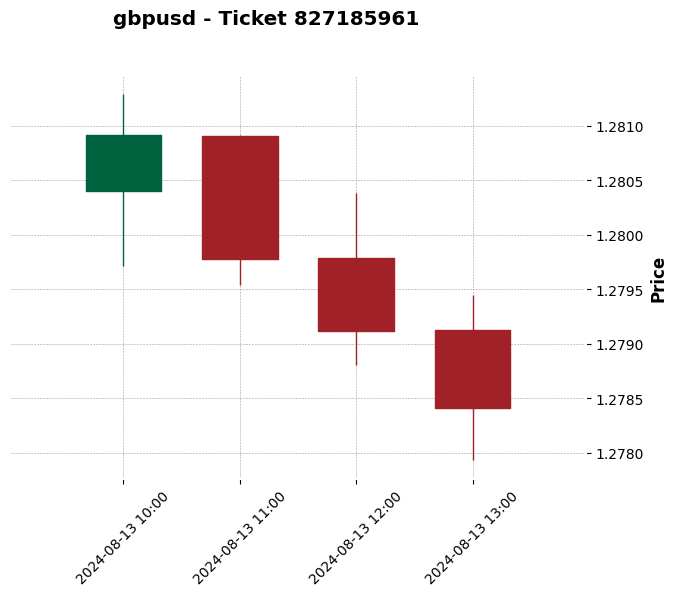

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.


<Figure size 1200x600 with 0 Axes>

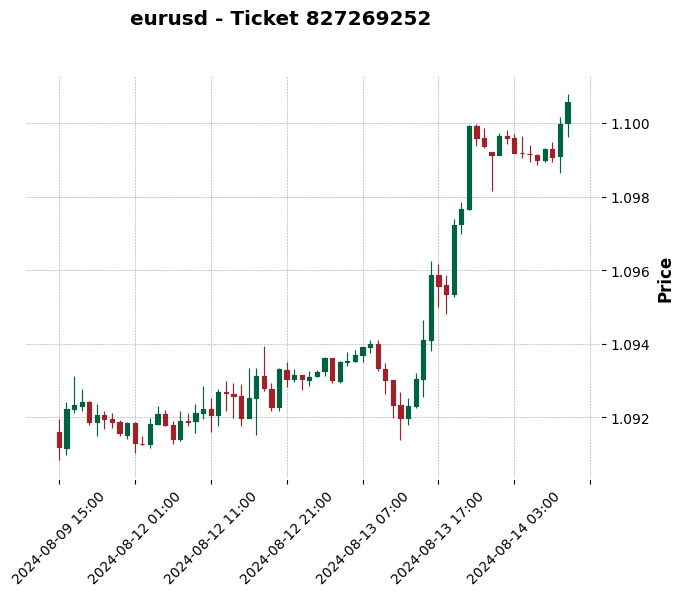

Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

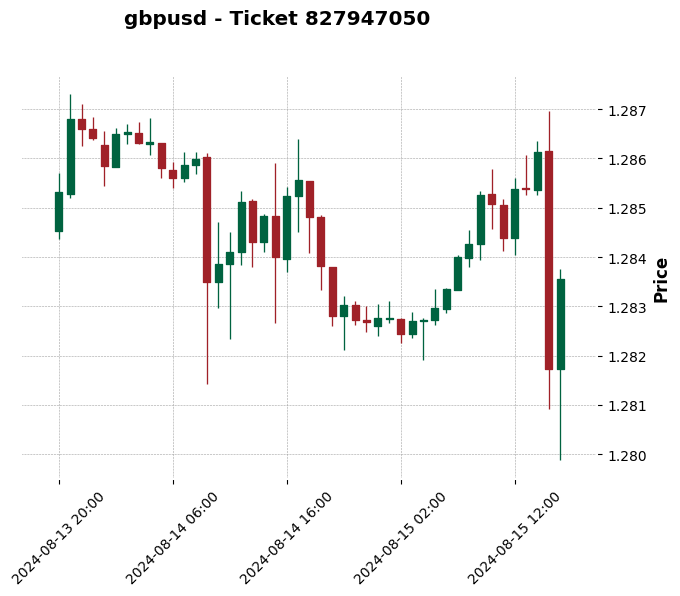

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDJPY.csv не найден.
Нет котировок для валютной пары audjpy.


<Figure size 1200x600 with 0 Axes>

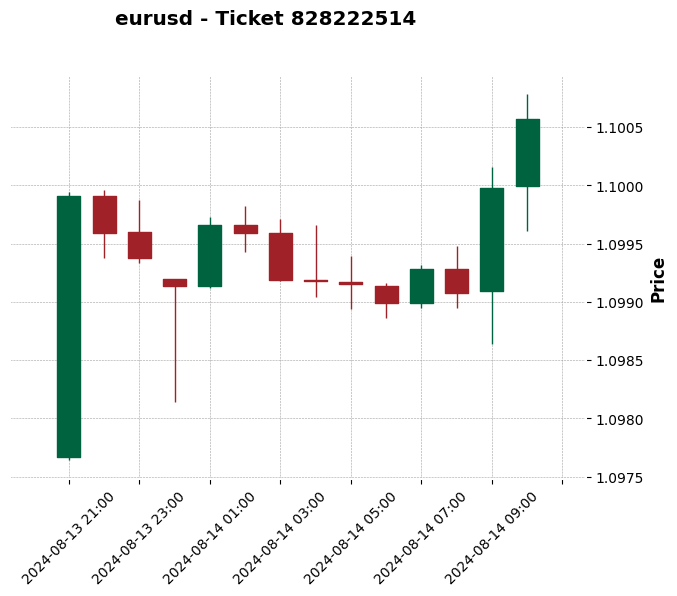

<Figure size 1200x600 with 0 Axes>

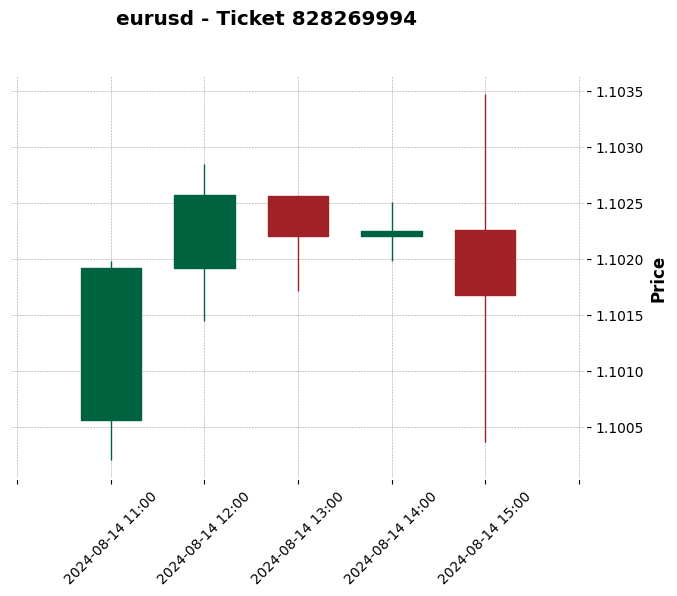

<Figure size 1200x600 with 0 Axes>

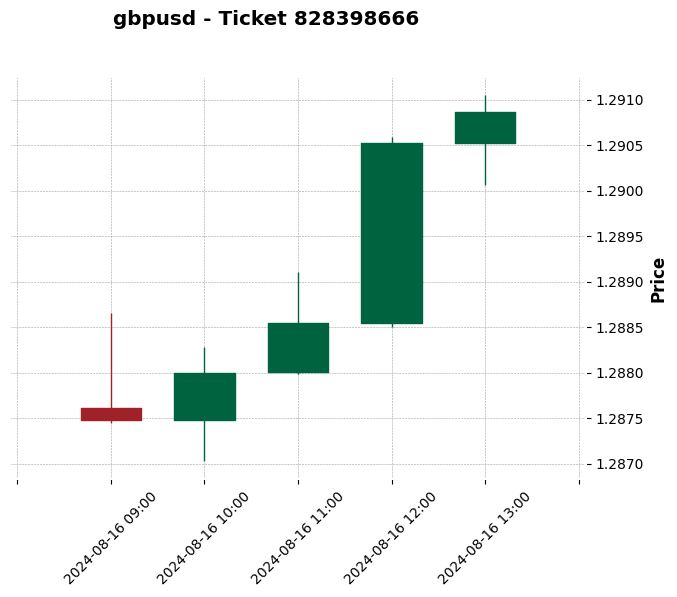

Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


<Figure size 1200x600 with 0 Axes>

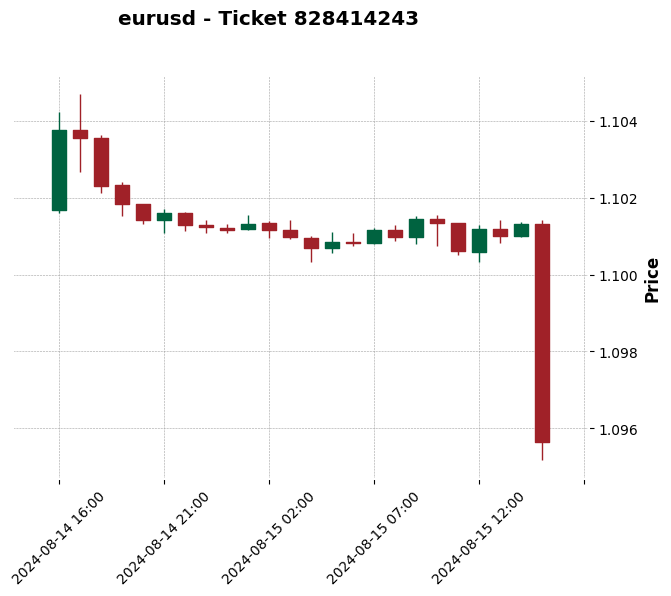

Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Нет данных котировок для сделки 828944569 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

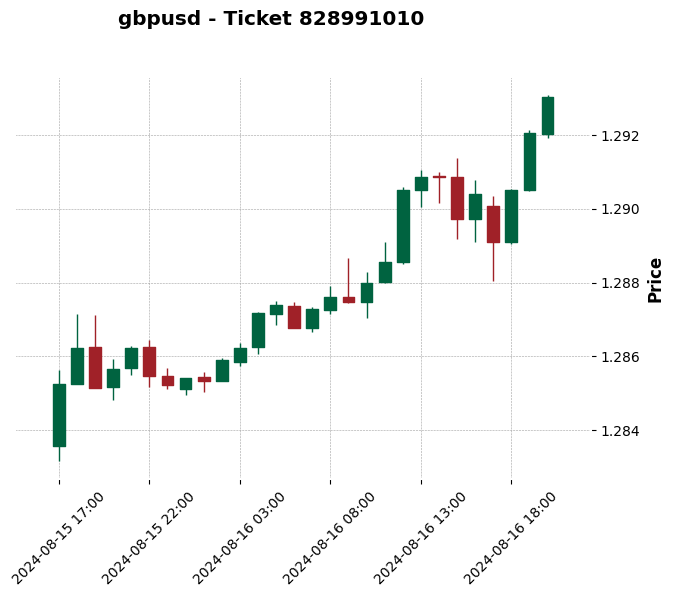

<Figure size 1200x600 with 0 Axes>

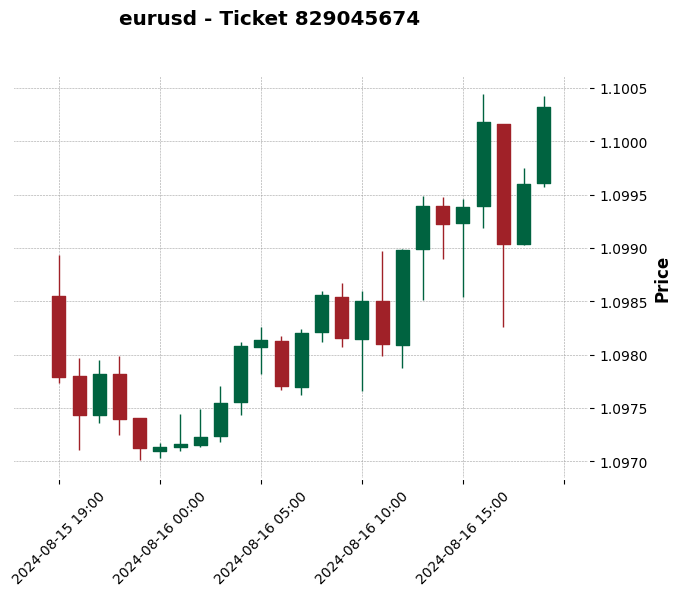

Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Нет данных котировок для сделки 829254836 в заданном интервале.


<Figure size 1200x600 with 0 Axes>

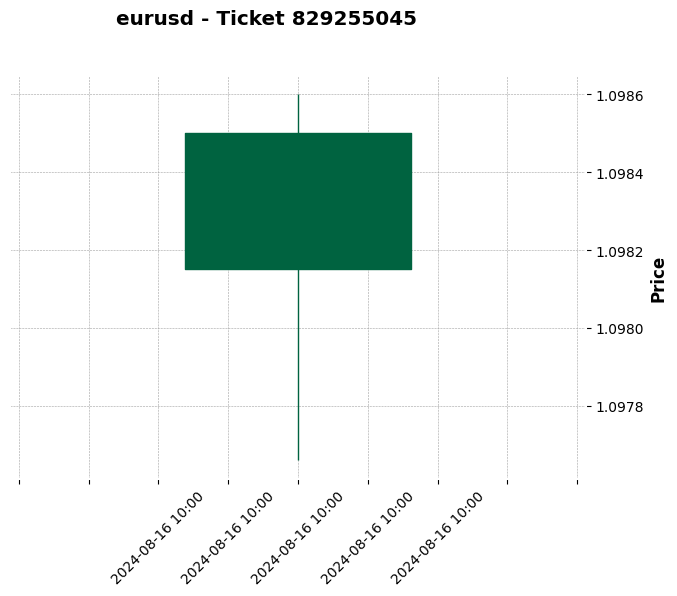

Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Нет данных котировок для сделки 829559910 в заданном интервале.
Генерация скриншотов завершена.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            plt.figure(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles',
                     title=f"{row['Item']} - Ticket {row['Ticket']}",
                     ylabel='Price', datetime_format='%Y-%m-%d %H:%M')

            # Добавление меток на график
            plt.axvline(x=row['Open Time'], color='green', linestyle='--', label='Open')
            plt.axvline(x=row['Close Time'], color='red', linestyle='--', label='Close')
            plt.text(row['Open Time'], selected_data['Close'].min(), 'Open', color='green', fontsize=12, verticalalignment='bottom', horizontalalignment='left')
            plt.text(row['Close Time'], selected_data['Close'].max(), 'Close', color='red', fontsize=12, verticalalignment='top', horizontalalignment='left')
            plt.text(row['Close Time'], selected_data['Close'].max() + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Добавление легенды
            plt.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

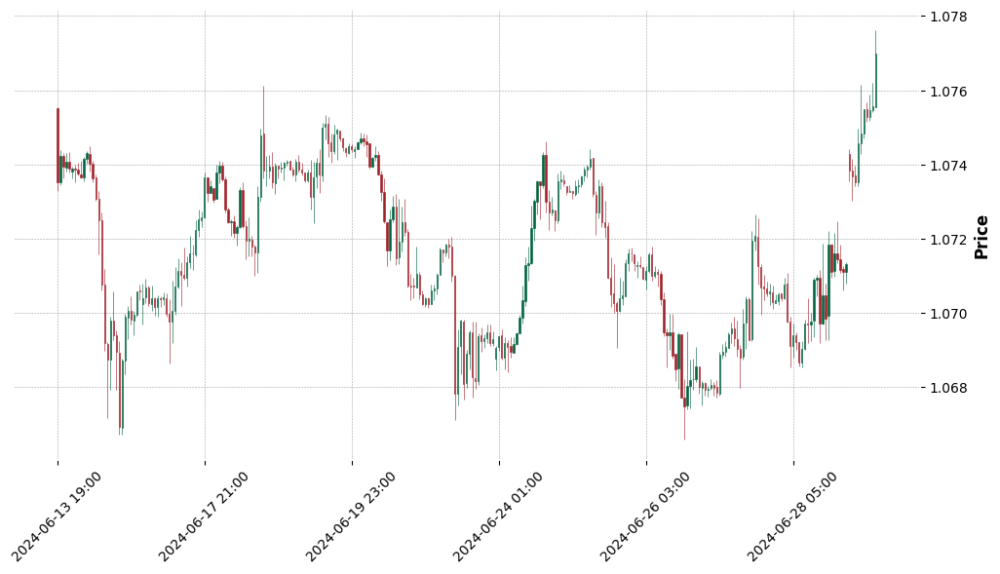

In [ ]:
import pandas as pd
import mplfinance as mpf
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))
            mpf.plot(selected_data, type='candle', style='charles', ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}", ylabel='Price', datetime_format='%Y-%m-%d %H:%M')

            # Добавление меток на график
            ax.axvline(x=row['Open Time'], color='green', linestyle='--', label='Open')
            ax.axvline(x=row['Close Time'], color='red', linestyle='--', label='Close')
            ax.text(row['Open Time'], selected_data['Close'].min(), 'Open', color='green', fontsize=12, verticalalignment='bottom', horizontalalignment='left')
            ax.text(row['Close Time'], selected_data['Close'].max(), 'Close', color='red', fontsize=12, verticalalignment='top', horizontalalignment='left')
            ax.text(row['Close Time'], selected_data['Close'].max() + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: 'NoneType' object has no attribute 'suptitle'

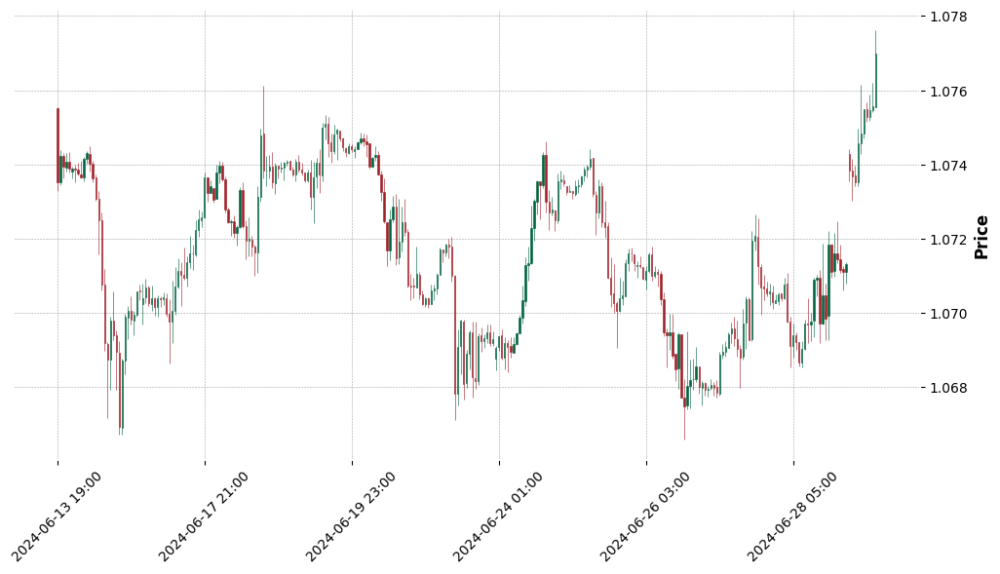

In [ ]:
import pandas as pd
import mplfinance as mpf
import matplotlib.pyplot as plt
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)

        # Преобразование столбцов и индекса
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Убедимся, что индекс котировок имеет тип datetime
        if not pd.api.types.is_datetime64_any_dtype(quotes_df.index):
            quotes_df.index = pd.to_datetime(quotes_df.index, format='%Y-%m-%d %H:%M:%S')

        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика
            fig, ax = plt.subplots(figsize=(12, 6))

            # Создание свечного графика с использованием mplfinance
            mpf.plot(selected_data, type='candle', style='charles', ax=ax, title=f"{row['Item']} - Ticket {row['Ticket']}", ylabel='Price', datetime_format='%Y-%m-%d %H:%M', show_nontrading=False)

            # Добавление меток на график
            ax.axvline(x=row['Open Time'], color='green', linestyle='--', label='Open')
            ax.axvline(x=row['Close Time'], color='red', linestyle='--', label='Close')
            ax.text(row['Open Time'], selected_data['Close'].min(), 'Open', color='green', fontsize=12, verticalalignment='bottom', horizontalalignment='left')
            ax.text(row['Close Time'], selected_data['Close'].max(), 'Close', color='red', fontsize=12, verticalalignment='top', horizontalalignment='left')
            ax.text(row['Close Time'], selected_data['Close'].max() + 0.0005, f'Profit: {row["Profit"]}', fontsize=12, verticalalignment='bottom')

            # Добавление легенды
            ax.legend()

            # Сохранение графика в файл
            plt.savefig(os.path.join(output_folder, f'trade_{row["Ticket"]}.png'))
            plt.close()
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


In [ ]:
from bokeh.plotting import figure, output_file, save
from bokeh.models import ColumnDataSource, DatetimeTickFormatter
from bokeh.layouts import column
import pandas as pd
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика с использованием Bokeh
            p = figure(x_axis_type='datetime', title=f"{row['Item']} - Ticket {row['Ticket']}", width=800, height=400)

            # Добавление данных свечного графика
            p.segment(selected_data.index, selected_data['High'], selected_data.index, selected_data['Low'], color="black")
            p.vbar(selected_data.index[selected_data['Open'] < selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="green", line_color="black")
            p.vbar(selected_data.index[selected_data['Open'] >= selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="red", line_color="black")

            # Добавление меток на график
            p.add_layout(Span(location=row['Open Time'], dimension='height', line_color='green', line_dash='dashed', line_width=2, legend_label='Open'))
            p.add_layout(Span(location=row['Close Time'], dimension='height', line_color='red', line_dash='dashed', line_width=2, legend_label='Close'))
            p.add_annotation(row['Open Time'], selected_data['Low'].min(), 'Open', color='green', text_align='center', text_baseline='bottom')
            p.add_annotation(row['Close Time'], selected_data['High'].max(), 'Close', color='red', text_align='center', text_baseline='bottom')

            # Настройка графика
            p.xaxis.formatter = DatetimeTickFormatter(minutes="%d %b %Y %H:%M")

            # Сохранение графика в файл
            output_file(os.path.join(output_folder, f'trade_{row["Ticket"]}.html'))
            save(p)
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


NameError: name 'Span' is not defined

In [ ]:
from bokeh.plotting import figure, output_file, save
from bokeh.models import ColumnDataSource, Span, Label
from bokeh.layouts import column
import pandas as pd
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика с использованием Bokeh
            p = figure(x_axis_type='datetime', title=f"{row['Item']} - Ticket {row['Ticket']}", width=800, height=400)

            # Добавление данных свечного графика
            p.segment(selected_data.index, selected_data['High'], selected_data.index, selected_data['Low'], color="black")
            p.vbar(selected_data.index[selected_data['Open'] < selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="green", line_color="black")
            p.vbar(selected_data.index[selected_data['Open'] >= selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="red", line_color="black")

            # Добавление меток на график
            p.add_layout(Span(location=row['Open Time'].timestamp()*1000, dimension='height', line_color='green', line_dash='dashed', line_width=2, legend_label='Open'))
            p.add_layout(Span(location=row['Close Time'].timestamp()*1000, dimension='height', line_color='red', line_dash='dashed', line_width=2, legend_label='Close'))
            p.add_layout(Label(x=row['Open Time'].timestamp()*1000, y=selected_data['Low'].min(), text='Open', text_color='green', text_align='center', text_baseline='bottom'))
            p.add_layout(Label(x=row['Close Time'].timestamp()*1000, y=selected_data['High'].max(), text='Close', text_color='red', text_align='center', text_baseline='bottom'))

            # Настройка графика
            p.xaxis.formatter = DatetimeTickFormatter(minutes="%d %b %Y %H:%M")
            p.xaxis.axis_label = 'Time'
            p.yaxis.axis_label = 'Price'

            # Сохранение графика в файл
            output_file(os.path.join(output_folder, f'trade_{row["Ticket"]}.html'))
            save(p)
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


AttributeError: unexpected attribute 'legend_label' to Span, possible attributes are context_menu, coordinates, dimension, editable, elements, group, hover_line_alpha, hover_line_cap, hover_line_color, hover_line_dash, hover_line_dash_offset, hover_line_join, hover_line_width, js_event_callbacks, js_property_callbacks, level, line_alpha, line_cap, line_color, line_dash, line_dash_offset, line_join, line_width, location, location_units, name, propagate_hover, renderers, subscribed_events, syncable, tags, visible, x_range_name or y_range_name

In [ ]:
from bokeh.plotting import figure, output_file, save
from bokeh.models import ColumnDataSource, Span, Label
from bokeh.layouts import column
import pandas as pd
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика с использованием Bokeh
            p = figure(x_axis_type='datetime', title=f"{row['Item']} - Ticket {row['Ticket']}", width=800, height=400)

            # Добавление данных свечного графика
            p.segment(selected_data.index, selected_data['High'], selected_data.index, selected_data['Low'], color="black")
            p.vbar(selected_data.index[selected_data['Open'] < selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="green", line_color="black")
            p.vbar(selected_data.index[selected_data['Open'] >= selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="red", line_color="black")

            # Добавление меток на график
            p.add_layout(Span(location=row['Open Time'].timestamp()*1000, dimension='height', line_color='green', line_dash='dashed', line_width=2))
            p.add_layout(Span(location=row['Close Time'].timestamp()*1000, dimension='height', line_color='red', line_dash='dashed', line_width=2))
            p.add_layout(Label(x=row['Open Time'].timestamp()*1000, y=selected_data['Low'].min(), text='Open', text_color='green', text_align='center', text_baseline='bottom'))
            p.add_layout(Label(x=row['Close Time'].timestamp()*1000, y=selected_data['High'].max(), text='Close', text_color='red', text_align='center', text_baseline='bottom'))

            # Настройка графика
            p.xaxis.formatter = DatetimeTickFormatter(minutes="%d %b %Y %H:%M")
            p.xaxis.axis_label = 'Time'
            p.yaxis.axis_label = 'Price'

            # Сохранение графика в файл
            output_file(os.path.join(output_folder, f'trade_{row["Ticket"]}.html'))
            save(p)
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Нет данных котировок для сделки 812707226 в заданном интервале.


Нет данных котировок для сделки 817235256 в заданном интервале.


Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


KeyboardInterrupt: 

In [ ]:
from bokeh.plotting import figure, output_file, save
from bokeh.models import ColumnDataSource, Span, Label
from bokeh.layouts import column
import pandas as pd
import os
from google.colab import drive

# Подключение Google Диска
drive.mount('/content/drive')

# Путь к папке MT4STATS на Google Диске
trades_path = '/content/drive/My Drive/MT4STATS/'
quotes_path = '/content/drive/My Drive/MT4STATS/'

# Загрузка данных о сделках
trades_df = pd.read_csv(os.path.join(trades_path, 'trades.csv'))
trades_df['Open Time'] = pd.to_datetime(trades_df['Open Time'], format='%Y.%m.%d %H:%M:%S')
trades_df['Close Time'] = pd.to_datetime(trades_df['Close Time'], format='%Y.%m.%d %H:%M:%S')

# Фильтрация отменённых сделок
trades_df = trades_df[~trades_df['Close Time'].isna()]

# Функция для загрузки котировок по валютной паре
def load_quotes_for_pair(pair):
    filename = f'{pair.upper()}.csv'  # Пример: historical_quotes_eurusd.csv
    file_path = os.path.join(quotes_path, filename)

    # Проверка наличия файла
    if os.path.exists(file_path):
        quotes_df = pd.read_csv(file_path)
        if 'Date' in quotes_df.columns and 'Time' in quotes_df.columns:
            quotes_df['DateTime'] = pd.to_datetime(quotes_df['Date'].astype(str) + ' ' + quotes_df['Time'].astype(str), format='%Y.%m.%d %H:%M')
            quotes_df.set_index('DateTime', inplace=True)
            quotes_df.drop(columns=['Date', 'Time', 'Volume'], inplace=True, errors='ignore')
            return quotes_df
        else:
            print(f"Не найдено нужных столбцов в {filename}.")
            return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия столбцов
    else:
        print(f"Файл {filename} не найден.")
        return pd.DataFrame()  # Возвращаем пустой DataFrame в случае отсутствия файла

# Итерация по каждой сделке для создания свечного графика
output_folder = '/content/drive/My Drive/MT4STATS/trades_screenshots'
os.makedirs(output_folder, exist_ok=True)

for index, row in trades_df.iterrows():
    pair = row['Item'].lower()  # Валютная пара, например, eurusd

    # Загрузка котировок для текущей валютной пары
    quotes_df = load_quotes_for_pair(pair)

    if not quotes_df.empty:
        # Фильтрация данных котировок для временного интервала сделки
        mask = (quotes_df.index >= row['Open Time']) & (quotes_df.index <= row['Close Time'])
        selected_data = quotes_df.loc[mask]

        if not selected_data.empty:
            # Создание свечного графика с использованием Bokeh
            p = figure(x_axis_type='datetime', title=f"{row['Item']} - Ticket {row['Ticket']}", width=800, height=400)

            # Добавление данных свечного графика
            p.segment(selected_data.index, selected_data['High'], selected_data.index, selected_data['Low'], color="black")
            p.vbar(selected_data.index[selected_data['Open'] < selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="green", line_color="black")
            p.vbar(selected_data.index[selected_data['Open'] >= selected_data['Close']], 0.5, selected_data['Open'], selected_data['Close'], fill_color="red", line_color="black")

            # Добавление меток на график
            open_time_ts = row['Open Time'].timestamp() * 1000
            close_time_ts = row['Close Time'].timestamp() * 1000
            p.add_layout(Span(location=open_time_ts, dimension='height', line_color='green', line_dash='dashed', line_width=2))
            p.add_layout(Span(location=close_time_ts, dimension='height', line_color='red', line_dash='dashed', line_width=2))
            p.add_layout(Label(x=open_time_ts, y=selected_data['Low'].min(), text='Open', text_color='green', text_align='center', text_baseline='bottom'))
            p.add_layout(Label(x=close_time_ts, y=selected_data['High'].max(), text='Close', text_color='red', text_align='center', text_baseline='bottom'))

            # Настройка графика
            p.xaxis.axis_label = 'Time'
            p.yaxis.axis_label = 'Price'
            p.xaxis.formatter = DatetimeTickFormatter(minutes="%d %b %Y %H:%M")

            # Сохранение графика в файл
            output_file(os.path.join(output_folder, f'trade_{row["Ticket"]}.html'))
            save(p)
        else:
            print(f"Нет данных котировок для сделки {row['Ticket']} в заданном интервале.")
    else:
        print(f"Нет котировок для валютной пары {pair}.")

print("Генерация скриншотов завершена.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Нет данных котировок для сделки 812707226 в заданном интервале.


Нет данных котировок для сделки 817235256 в заданном интервале.


Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.


Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.


Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.


Файл USDCAD.csv не найден.
Нет котировок для валютной пары usdcad.
Файл USDCHF.csv не найден.
Нет котировок для валютной пары usdchf.
Файл GBPJPY.csv не найден.
Нет котировок для валютной пары gbpjpy.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл XAUUSD.csv не найден.
Нет котировок для валютной пары xauusd.


Файл AUDUSD.csv не найден.
Нет котировок для валютной пары audusd.
Файл USDJPY.csv не найден.
Нет котировок для валютной пары usdjpy.
Файл NZDUSD.csv не найден.
Нет котировок для валютной пары nzdusd.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Нет данных котировок для сделки 823771877 в заданном интервале.


Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.
Файл EURGBP.csv не найден.
Нет котировок для валютной пары eurgbp.


Нет данных котировок для сделки 823950168 в заданном интервале.
